In [3]:
#Import some relevant packages
import csv
import requests
import time

#For generally exploring things within Python
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import math

#for natural language processing
import textblob as tb
from textblob import translate
from textblob import TextBlob

#for detecting English without Google's API
import langdetect
from langdetect import detect

from termcolor import colored

In [2]:
big_df = pd.read_csv('18_09_18_review_with_initial_reviewer_trust.csv', index_col=0, low_memory=False)

In [4]:
big_df.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features


In [78]:
big_df['evaldate']=pd.to_datetime(big_df['evaldate'],errors='coerce')

In [31]:
unique_reviewers.size

104633

In [79]:
reviewer_df = big_df.loc[big_df['buyerid']==unique_reviewers[11]]
reviewer_df

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail
11,32243608596,False,US,20,All stained. Terrible goods,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,725446934,S***g C.,2018-08-29,https://ae01.alicdn.com/kf/UTB8GRAAiDzIXKJkSaf...,ePacket,Color:Other Size:56to60cm,https://ae01.alicdn.com/kf/UTB8GRAAiDzIXKJkSaf...


In [38]:
review_count = reviewer_df.shape[0]
review_count

1

In [83]:
#evaldates = pd.to_datetime(reviewer_df['evaldate'],)
max_freq = reviewer_df.groupby(pd.Grouper(key = 'evaldate',freq='M')).size()
max_freq

evaldate
2018-08-31    1
Freq: M, dtype: int64


In [88]:
max_freq[0]

1

In [114]:
def reviewers_stats(reviewer_id, review_df):
    df = big_df.loc[big_df['buyerid']==reviewer_id]
    review_count = df.shape[0]
    gender_provided = 1 - df.buyergender.isna()
    pic_provided = 1 - df.buyerheadportrait.isna()
    reviewer_freq = reviewer_df.groupby(pd.Grouper(key = 'evaldate',freq='M')).size()
    max_freq = reviewer_freq[0]          
    if gender_provided.bool and pic_provided.bool:
        if review_count>5 and max_freq<10:
            initial_trust = 1
            tag = 'Posts a good number of reviews at a reasonable pace'
        elif max_freq>15:
            intial_trust = 0
            tag = 'Posts too fast - may not be human'
            inital_trust = 0.25
            tag = 'Incomplete profile and only one review'
        else:
            initial_trust = 0.5
            tag = 'No standout reviewer features'
    elif review_count<2:
        inital_trust = 0.25
        tag = 'Incomplete profile and only one review'
            
    
    reviewer_dict = {
        'review_count':review_count,
        'max_freq':max_freq,
        'initial_trust':initial_trust,
        'trust_tag':tag
    }
    
    return reviewer_dict

In [115]:
dude_26_stats = reviewers_stats(unique_reviewers[26],big_df)

In [116]:
dude_26_stats

{'review_count': 1,
 'max_freq': 1,
 'initial_trust': 0.5,
 'trust_tag': 'No standout reviewer features'}

In [118]:
reviewers_list = []
for i in range(unique_reviewers.size):
    reviewers_dict = reviewers_stats(unique_reviewers[i],big_df)
    reviewers_list.append(reviewers_dict)

In [119]:
with open('reviewer_traits_001.csv', 'w') as output_file:
    keys = reviewers_list[0].keys()
    dict_writer = csv.DictWriter(output_file, keys)
    dict_writer.writeheader()
    dict_writer.writerows(reviewers_list)

In [122]:
reviewer_df = pd.read_csv('reviewer_traits_001.csv', index_col=0, low_memory=False)

In [125]:
unique_df = pd.DataFrame(unique_reviewers,columns = {'buyerid'})
#better_reviewer_df = pd.concat[unique_reviewers,]

In [126]:
unique_df.head()

,buyerid
0,230419691
1,1678569385
2,127741530
3,1616342783
4,890393619


In [129]:
better_df = reviewer_df.join(unique_df)

In [130]:
better_df.to_csv('reviewer_traits_002.csv')

In [131]:
better_df.head()

,max_freq,initial_trust,trust_tag,buyerid
0,1,0.5,No standout reviewer features,230419691
1,1,0.5,No standout reviewer features,1678569385
1,1,0.5,No standout reviewer features,1678569385
1,1,0.5,No standout reviewer features,1678569385
1,1,0.5,No standout reviewer features,1678569385


In [133]:
better_df.groupby(by='trust_tag').agg('count')

,max_freq,initial_trust,buyerid
trust_tag,,,
No standout reviewer features,104565,104565,104565
Posts a good number of reviews at a reasonable pace,68,68,68


In [135]:
review_with_trust = big_df.join(better_df.set_index('buyerid'), on='buyerid')

In [136]:
review_with_trust.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features


In [164]:
review_with_trust.drop_duplicates()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,NaN,ePacket,Color:black and khaki Size:56to60cm,NaN,1.0,0.5,No standout reviewer features
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,NaN,AliExpress Standard Shipping,Color:black and khaki Size:56to60cm,NaN,1.0,0.5,No standout reviewer features
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,https://ae01.alicdn.com/kf/UTB8A.mKiXfJXKJkSam...,AliExpress Standard Shipping,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8A.mKiXfJXKJkSam...,1.0,0.5,No standout reviewer features
5,32243608596,False,US,60,not bad for such price,NaN,NaN,1693179945,Y*******d Y.,2018-08-28,https://ae01.alicdn.com/kf/UTB8VZDUitnJXKJkSai...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8VZDUitnJXKJkSai...,1.0,0.5,No standout reviewer features
6,32243608596,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UTB8J6HOfmnEXKJk43U...,134061513,A******j S.,2018-04-19,https://ae01.alicdn.com/kf/UTB8YVYIxVfFXKJk43O...,AliExpress Standard Shipping,Color:dark blue and red Size:56to61cm,https://ae01.alicdn.com/kf/UTB8YVYIxVfFXKJk43O...,1.0,1.0,Posts a good number of reviews at a reasonable...
7,32243608596,False,US,100,"nice cap, my boyfriend is very happy with it. ...",NaN,NaN,1673192723,S*****a W.,2018-08-23,NaN,AliExpress Standard Shipping,Color:dark blue and red Size:56to60cm,NaN,1.0,1.0,Posts a good number of reviews at a reasonable...
8,32243608596,False,US,100,Good just little stain,NaN,NaN,1663867706,S********l S.,2018-04-13,https://ae01.alicdn.com/kf/UTB8nYfCwOaMiuJk43P...,ePacket,Color:coffer and dark blue Size:56to61cm,https://ae01.alicdn.com/kf/UTB8nYfCwOaMiuJk43P...,1.0,1.0,Posts a good number of reviews at a reasonable...
9,32243608596,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UTB8kq1PlRahduJk43J...,919433626,M**c F.,2018-03-22,https://ae01.alicdn.com/kf/UTB8nIgCwCnEXKJk43U...,AliExpress Standard Shipping,Color:coffer and dark blue Size:56to61cm,https://ae01.alicdn.com/kf/UTB8nIgCwCnEXKJk43U...,1.0,1.0,Posts a good number of reviews at a reasonable...


In [13]:
def feedback_is_na(df):
    feedback_na = df.buyerfeedback.isna().rename('feedback_na')
    image_na = df.image.isna().rename('image_na')
    new_df = pd.concat([df,feedback_na,image_na],axis=1)
    return new_df

In [15]:
def gender_is_na(df):
    gender_exists = df.buyergender.isin(['M','F']).rename('gender_exists')
    new_df = pd.concat([df,gender_exists],axis=1)
    return new_df

In [44]:
def max_review_freq(df):
    pd.to_datetime(df)
    groups = df.dt.day
    max_freq = groups.max()
    return max_freq

In [18]:
unique_products = big_df['product_id'].unique()

In [21]:
current_product = big_df.loc[big_df['product_id']==unique_products[243]]

In [22]:
current_product

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag
20261,32843441033,False,US,20,"Worked for a couple of days, Then I got locked...",NaN,NaN,867069283.0,J**l T.,2018-09-13,NaN,China Post Ordinary Small Packet Plus,Capacity:32 GB class 10,NaN,NaN,NaN,NaN
20262,32843441033,False,US,100,NaN,NaN,NaN,921594687.0,R***a P.,2018-09-12,NaN,AliExpress Saver Shipping,Capacity:32 GB class 10,NaN,NaN,NaN,NaN
20263,32843441033,False,HR,100,I order 32gb and receive 16gb. Didn't get any ...,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,1697607953.0,A*****o M.,2018-07-31,https://ae01.alicdn.com/kf/UTB8ctcOhwnJXKJkSae...,China Post Registered Air Mail,Capacity:32 GB class 10,https://ae01.alicdn.com/kf/UTB8ctcOhwnJXKJkSae...,NaN,NaN,NaN
20264,32843441033,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UTB8O9GbxE_4iuJk43F...,772421961.0,A***l V.,2018-08-20,https://ae01.alicdn.com/kf/UTB8quvIiXPJXKJkSah...,China Post Ordinary Small Packet Plus,Capacity:4GB Class 4,https://ae01.alicdn.com/kf/UTB8quvIiXPJXKJkSah...,NaN,NaN,NaN
20265,32843441033,True,US,100,really working good,NaN,NaN,NaN,AliExpress Shopper,2018-08-18,https://ae01.alicdn.com/kf/UTB8C7IIB0oSdeJk43O...,China Post Ordinary Small Packet Plus,Capacity:16GB class 10,https://ae01.alicdn.com/kf/UTB8C7IIB0oSdeJk43O...,NaN,NaN,NaN
20266,32843441033,True,US,100,Got the SD card in the mail today. First thing...,M,NaN,NaN,AliExpress Shopper,2018-07-02,NaN,China Post Ordinary Small Packet Plus,Capacity:16GB class 10,NaN,NaN,NaN,NaN
20267,32843441033,False,US,100,Карты нормальные.Дальше время покажет.Доставка...,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,699607119.0,V*****y S.,2018-07-25,NaN,AliExpress Standard Shipping,Capacity:4GB Class 4,NaN,NaN,NaN,NaN
20268,32843441033,False,US,100,"хорошая флешка, показывает 14.9 гигов",NaN,NaN,1611828670.0,V******r K.,2018-09-04,NaN,AliExpress Saver Shipping,Capacity:16GB class 10,NaN,NaN,NaN,NaN
20269,32843441033,False,US,80,problem nsolverd by the seller.,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,705165169.0,U**i G.,2018-04-28,NaN,AliExpress Standard Shipping,Capacity:64GB class 10,NaN,NaN,NaN,NaN
20270,32843441033,True,US,100,very fast delivery highly recommend,NaN,NaN,NaN,AliExpress Shopper,2018-03-17,NaN,AliExpress Standard Shipping,Capacity:16GB class 10,NaN,NaN,NaN,NaN


In [285]:
pd.concat([current_product,na_column],axis=1)

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag,feedback_is_na,buyerfeedback
10885,32822514480,True,US,80,NaN,NaN,NaN,NaN,AliExpress Shopper,2018-05-24,NaN,Deutsche Post,Ships From:Germany color:220v,NaN,NaN,NaN,NaN,False,True
10914,32822514480,False,US,100,NaN,NaN,NaN,180809477.0,J***s K.,2018-04-19,NaN,Fedex IE,Ships From:China color:110v,NaN,NaN,NaN,NaN,False,True
38798,32822514480,False,US,60,Love the tevo but came shipped with a bend x t...,NaN,NaN,1778004133.0,M**k S.,2018-07-13,https://ae01.alicdn.com/kf/UTB8LJwyg1vJXKJkSaj...,Fedex IE,Ships From:China color:110v,https://ae01.alicdn.com/kf/UTB8LJwyg1vJXKJkSaj...,NaN,NaN,NaN,False,False
38799,32822514480,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UT8sChyX2haXXagOFbX...,860496916.0,A*i B.,2018-04-26,NaN,Other,Ships From:China color:220v,NaN,NaN,NaN,NaN,False,True
38800,32822514480,False,US,100,"Great seller, great product. Well packaged and...",NaN,NaN,1806821733.0,A********s S.,2018-08-17,NaN,SF Express,Ships From:China color:110v,NaN,NaN,NaN,NaN,False,False
38801,32822514480,False,US,100,I’ve put about 150hrs of printing in and this ...,NaN,NaN,177563859.0,B***n R.,2018-07-11,NaN,Fedex IE,Ships From:China color:110v,NaN,NaN,NaN,NaN,False,False
38802,32822514480,False,US,80,The printer is excellent and easy to assemble....,NaN,NaN,1780997556.0,J**e J.,2018-07-30,NaN,SF Express,Ships From:United States color:110v,NaN,NaN,NaN,NaN,False,False
38803,32822514480,False,US,100,Fast shipping and product works great!,NaN,NaN,1613220127.0,J**h T.,2018-04-19,NaN,Fedex IE,Ships From:China color:110v,NaN,NaN,NaN,NaN,False,False
38804,32822514480,True,US,80,gooooooood,NaN,NaN,NaN,AliExpress Shopper,2018-07-31,NaN,Fedex IE,Ships From:China color:220v,NaN,NaN,NaN,NaN,False,False
38805,32822514480,True,US,100,NaN,M,NaN,NaN,AliExpress Shopper,2018-04-21,NaN,Fedex IE,Ships From:China color:110v,NaN,NaN,NaN,NaN,False,True


In [55]:
def translate_feedback(df):
    feedback = df['buyerfeedback'].astype(str)
    listofdicts = []
    j=0
    for i, review in feedback.iteritems():
        print(review)
        blob = TextBlob(review)
        language = blob.detect_language()
        #print(colored(language,'green'))
        if language != 'en':
            try:
                translated_review = blob.translate(from_lang = language, to='en')
                print(colored(translated_review,'red'))
            except Exception:
                continue
        else:
            translated_review = review
        review_dict = {
            'i':i,
            'buyerfeedback':review,
            'feedback_language':language,
            'feedback_translated':str(translated_review)
        }
        listofdicts.append(review_dict)
        time.sleep(5)
    translate_df = pd.DataFrame(listofdicts)
    tranlate_df = translate_df.set_index('i')
    return translate_df

In [23]:
current_tranlated_df = translate_feedback(current_product)

HTTPError: HTTP Error 503: Service Unavailable

In [14]:
df_with_new = feedback_is_na(big_df)
df_with_new.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag,feedback_na,image_na
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features,False,False
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False


In [16]:
df_with_new['feedbacklength'] = df_with_new['buyerfeedback'].astype(str).apply(len)

In [17]:
df_with_new.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,81
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69


(array([5.57120e+04, 2.27310e+04, 1.17706e+05, 1.39540e+04, 9.20100e+03,
        5.92100e+03, 4.09500e+03, 2.72900e+03, 2.02900e+03, 1.42800e+03,
        1.03400e+03, 7.59000e+02, 6.94000e+02, 4.93000e+02, 4.09000e+02,
        3.15000e+02, 2.42000e+02, 1.97000e+02, 1.74000e+02, 1.29000e+02,
        1.06000e+02, 1.28000e+02, 8.60000e+01, 6.90000e+01, 6.30000e+01,
        7.30000e+01, 5.60000e+01, 4.60000e+01, 4.10000e+01, 3.50000e+01,
        4.00000e+01, 3.00000e+01, 3.10000e+01, 3.10000e+01, 2.50000e+01,
        1.08000e+02]),
 array([   1.  ,   28.75,   56.5 ,   84.25,  112.  ,  139.75,  167.5 ,
         195.25,  223.  ,  250.75,  278.5 ,  306.25,  334.  ,  361.75,
         389.5 ,  417.25,  445.  ,  472.75,  500.5 ,  528.25,  556.  ,
         583.75,  611.5 ,  639.25,  667.  ,  694.75,  722.5 ,  750.25,
         778.  ,  805.75,  833.5 ,  861.25,  889.  ,  916.75,  944.5 ,
         972.25, 1000.  ]),
 <a list of 36 Patch objects>)

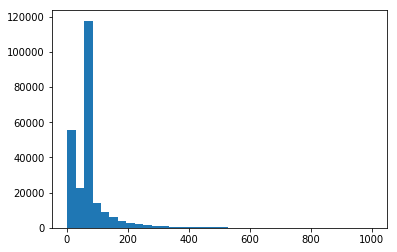

In [29]:
%matplotlib inline
plt.hist(df_with_new.feedbacklength,bins=36)

In [45]:
max_freqs = df_with_new.groupby(by='product_id').agg({'evaldate':max_review_freq})

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Int64Index'

In [50]:
all_freqs = df_with_new.groupby(by=['product_id',pd.to_datetime(df_with_new['evaldate']).dt.day]).agg({'evaldate':'count'})

In [60]:
all_freqs = all_freqs.rename(columns={'evaldate':'eval_freq'})

(array([8167., 6073., 7823., 2311., 2873.,  905., 1241.,  392.,  607.,
         225.,  297.,  114.,  164.,   77.,   94.,   50.,   68.,   27.,
          45.,   43.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ,
        16.5, 18. , 19.5, 21. , 22.5, 24. , 25.5, 27. , 28.5, 30. ]),
 <a list of 20 Patch objects>)

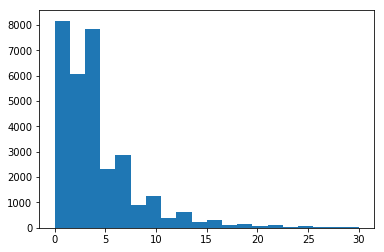

In [66]:
%matplotlib inline
plt.hist(all_freqs.eval_freq,bins=20,range=(0,30))

In [63]:
all_freqs.eval_freq.max()

94482

In [67]:
all_freqs.to_csv('review_frequencies.csv')

In [68]:
df_with_new.to_csv('processed_reviews_19_09_18.csv')

In [4]:
df_with_new = pd.read_csv('processed_reviews_19_09_18.csv', index_col=0, low_memory=False)

In [9]:
df_without_dupes = df_with_new.drop_duplicates()
df_without_dupes.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,image,logistics,skuinfo,thumbnail,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,China Post Registered Air Mail,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,81
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,ePacket,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,NaN,ePacket,Color:black and khaki Size:56to60cm,NaN,1.0,0.5,No standout reviewer features,True,True,3
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,NaN,AliExpress Standard Shipping,Color:black and khaki Size:56to60cm,NaN,1.0,0.5,No standout reviewer features,True,True,3
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,https://ae01.alicdn.com/kf/UTB8A.mKiXfJXKJkSam...,AliExpress Standard Shipping,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8A.mKiXfJXKJkSam...,1.0,0.5,No standout reviewer features,False,False,7


In [10]:
listoftrust = []
for ind, row in df_without_dupes.iterrows():
    if row['initial_trust'] ==1 and row['buyerid'] != 'buyerid':
        basic_trust=1
        basic_trust_tag = 'Trusted Reviewer'
    elif row['feedback_na'] and row['image_na']:
        basic_trust = 0
        basic_trust_tag = 'No written review and no images included'
    elif row['feedbacklength'] > 100 and row['image_na'] != True:
        basic_trust = 1
        basic_trust_tag = 'Review is long and include pictures. Looks like a pretty thurough review'
    else:
        basic_trust = 0.5
        basic_trust_tag = 'Review has no standout features'
    trust_dict = {
        'ind': ind,
        'basic_trust':basic_trust,
        'basic_trust_tag':basic_trust_tag
    }
    listoftrust.append(trust_dict)
trust_df=pd.DataFrame(listoftrust)
trust_df.head()

,basic_trust,basic_trust_tag,ind
0,0.5,Review has no standout features,0
1,0.5,Review has no standout features,1
2,0.0,No written review and no images included,2
3,0.0,No written review and no images included,3
4,0.5,Review has no standout features,4


In [12]:
df_basic_trust = df_without_dupes.join(trust_df.set_index('ind'))

ValueError: columns overlap but no suffix specified: Index(['basic_trust', 'basic_trust_tag'], dtype='object')

In [14]:
df_without_dupes.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,skuinfo,thumbnail,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,Color:khaki and yellow Size:56to60cm,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,81,0.5,Review has no standout features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,Color:dark blue and red Size:56to60cm,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features


In [15]:
better_no_dupes = df_without_dupes.drop_duplicates()

In [41]:
new_df.to_csv('reviews_with_basic_trust_19_09_18.csv')

In [18]:
better_no_dupes.groupby('basic_trust').agg({'basic_trust_tag':'count'})

,basic_trust_tag
basic_trust,
0.0,19274
0.5,82208
1.0,27524


In [19]:
df = better_no_dupes

In [33]:
review_by_reviewer = df.groupby('buyerid').agg({'product_id':'count'}).rename(columns={'product_id':'reviewer_review_count'})

In [34]:
review_by_reviewer.head()

,reviewer_review_count
buyerid,
100000350.0,1
100025554.0,2
100049918.0,1
100053936.0,1
100219252.0,2


In [35]:
new_df = df.join(review_by_reviewer, on='buyerid')

In [36]:
new_df.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,thumbnail,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,https://ae01.alicdn.com/kf/UTB8gDRQB5aMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,81,0.5,Review has no standout features,2.0
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,https://ae01.alicdn.com/kf/UTB8Ti3mBOaMiuJk43P...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features,1.0
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,...,NaN,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,...,NaN,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,https://ae01.alicdn.com/kf/UTB8A.mKiXfJXKJkSam...,1.0,0.5,No standout reviewer features,False,False,7,0.5,Review has no standout features,1.0


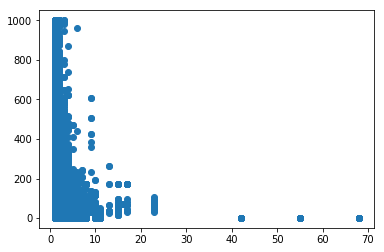

In [38]:
%matplotlib inline
plt.scatter(new_df.reviewer_review_count, new_df.feedbacklength)

In [40]:
new_df.reviewer_review_count.max()

68.0

In [43]:
trusted_df = new_df.loc[new_df['basic_trust']==1]

In [45]:
untrusted_df = new_df.loc[new_df['basic_trust']==0]

In [46]:
middle_df = new_df.loc[new_df['basic_trust']==0.5]

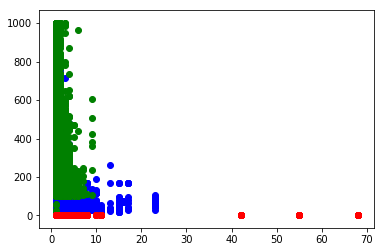

In [48]:
%matplotlib inline
plt.scatter(middle_df.reviewer_review_count, middle_df.feedbacklength,color='blue')
plt.scatter(trusted_df.reviewer_review_count, trusted_df.feedbacklength,color='green')
plt.scatter(untrusted_df.reviewer_review_count, untrusted_df.feedbacklength,color='red')

In [56]:
all_translated_feedback = translate_feedback(new_df)

Great fabric and quality, fast delivery and comfort to wear. Highly recommended !
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
I liked it a lot, just like the presentation, nothing more than slow!
nan
in
nan
in
thanks!
not bad for such price
nan
in
nice cap, my boyfriend is very happy with it. good fit and fast delivery. Seller sent us a message with the track and trace code when it was sent.
Good just little stain 
nan
in
perfect, adjustable size
All stained. Terrible goods
nan
in
Well made. Seems to be a one size fits all of most. It will adjust from small to very large. They also included a free gift bracelet. I was very impressed by the packaging. It was sealed in an inflated plastic. 
nan
in
Nice cap in good quality. Oryginally was too big - but I moved the ' leather like' strap at the back.  Now is great :-)
love the hat, nice design, affordable price, good seller, will love to try out other products!  Thank you.
кепка хорошая. качество норм. нитки не тор

Tudo certo Chegou rápido 
Ótima Qualidade tamanho perfeito
All right arrived fast
Great Quality Perfect Size
На фото все красивее, так выглядит не очень, на белом следы синего. Упаковка отличная в мешок заполненый китайским воздухом). 
In the photo everything is more beautiful, so it does not look very, on white traces of blue. Packaging is excellent in a bag filled with Chinese air).
Закал 7 августа, получил 5 сентября, кепка понравилась, качество хорошее, рекомендую 
Zakal August 7, received on September 5, liked the cap, the quality is good, I recommend
К качеству и скорости доставки нет. Упаковано в плёнку, козырек не помялся. На фото смотрится солиднее. Модель именно мне не подошла, подарю кому-нибудь. Своих денег стоит, смотрится стильно.
There is no quality and speed of delivery. Packed in film, the visor was not wrinkled. The photo looks more solid. The model did not suit me, I'll give it to someone. His money is worth, looks stylish.
Хорошая.Заказала 25.08., 23.08. получила на

the central part of the cap on the picture is white but when arrived it was a light orange
nan
in
хорошая упаковка. очень хороший и качественный товар. быстрая доставка. Мне очень понравился.
good packing. very good and quality goods. fast delivery. I really liked it.
Бейсболка крутая,  есть небольшие косяки в виде неровных швов изнутри. А так огонь. Пришла в надувном пакете,  чтобы не помялась.
The baseball cap is steep, there are small jambs in the form of uneven seams from the inside. And so is the fire. I came in an inflatable package, so as not to be wrinkled.
была отлично упакованп,  что бы не помялась при трагспортировкн,  проблема только в том,  что краска от козырька остается на руках
was perfectly packed, that would not be crushed when tragosportirovkn, the only problem is that the paint from the visor remains in his hands
Muito bom. Rápida entrega. Recomendo! Ótimo produto...
Very good. Fast delivery. I recommend! Great product ...
Buenos días, 

1.- El pedido llego en el ti

Отличная кепка, всем советую этого продавца 
An excellent cap, I advise everyone this seller
Produto de altíssima qualidade é igual ao da descrição, estou muito satisfeito o vendedor é bem atencioso recomendo!
Product of very high quality is equal to that of the description, I am very satisfied the seller is well considerate recommend!
nan
in
O produto chegou muito rápido ao Brasil, em menos de um mês, bem antes da data prevista. É perfeitamente conforme o descrito, material de ótima qualidade e vem bem embalado. Muito satisfeito, voltarei a comprar outras vezes com esse vendedor.
The product arrived very fast in Brazil in less than a month, well ahead of schedule. It is perfectly as described, material of great quality and comes packaged well. Very satisfied, I will be back to buy other times with this seller.
Product decription was 100% correct. Product was as decribed. Best thing I liked was the packing. Is just that the style did not suit me very well, but it's my problem. 
Заказыв

Пришла сильно помятой и грязной, хотя при заказе указывал чтобы хорошо упаковали. Так же плохо прошита, торчат нитки. 
Has come strongly crumpled and dirty though at the order specified that well packed. Just badly sewn, protruding thread.
Кепка сыну понравилась. Немного помята,но это не страшно,исправим. Пришла достаточно быстро!
Cap liked his son. A little dented, but it's not scary, we'll fix it. Came quickly enough!
отличная кепка,швы ровные,все качественно,заказ отправили через два часа после оплаты,с продавцом не общались,т.к.надобности небыло,единственное,на наш взгляд,козырек длиноват
an excellent cap, the seams are even, everything is quality, the order was sent two hours after payment, the seller did not communicate, because the nebylo, the only thing, in our opinion, the visor is long
Как на картинке. Пришла посылка быстро
Like on a picture. The parcel came quickly
nan
in
aun falta probarlo....
still need to prove it ....
nan
in
Приехала кепка быстро, но упаковали в обычный 

Леггинсы очень мягкие, приятные к телу, без запаха. Естественно, что это синтетика, но хорошего качества. Дочке понравились. Заказала ещё чуть большего размера.
Leggings are very soft, pleasant to the body, odorless. Naturally, this is synthetics, but of good quality. I liked my daughter. I ordered a slightly larger size.
Леггинсы очень клевые! Яркие, летние. Материал очень приятный. Доченька довольна посылкой. Рекомендую продавца. Посылка пришла за месяц. 
Leggings are very cool! Bright, summer. The material is very pleasant. The daughter is happy with the parcel. I recommend the seller. The parcel came in a month.
Ткань синтетика абсолютная, но вроде приятные к телу. На рост 110 в самый раз. Цвет яркий. Сшиты качественно, нитки не торчат.
Synthetic fabric is absolute, but kind of pleasant to the body. On the height of 110 just right. The color is bright. They are sewn qualitatively, threads do not stick out.
отлично всё подошло.Спасибо огромное. Продавца рекомендую.
Excellent all pod

Well done! super fast shipment with all in good order.

thank you very much.
great
Почитав отзывы на свой XS-S заказала  L. Сидит точь в точь,  теплый свитер можно одеть,  но будешь Колобком) 
Очень теплая...  или на улице жарко... 
Легкая и яркая!!! 
Капюшон маленький. 
Есть небольшой запах,  но надеюсь что выветрится. 
В целом довольна покупкой!)))
After reading the reviews for your XS-S ordered L. Sits exactly the same, a warm sweater can be worn, but you will Kolobok)
Very warm ... or it's hot outside ...
Light and bright !!!
The hood is small.
There is a small smell, but I hope that will erode.
Overall satisfied with the purchase!)))
nan
in
nan
in
nan
in
nan
in
Посылка дошла быстро, несмотря на то, что доставка выполнялась не выбранным способом AliExpress Standard Shipping, а China Post Registered Air Mail. 

Устройство функционально, но крепление неудобное (видимо сделано под руль, хотя в отзывах некоторые крепят на руль).
The package arrived quickly, despite the fact that the de

Adorei o produto, estou satisfeita.
I loved the product, I'm satisfied.
nan
in
recebi porem coloquei as pilhas funcionou um pouco tempo, porem com pouca força. Agora não esta funcionando.
I received the batteries but it worked a little time, but with little force. Now it's not working.
Great ! Thank you 
As described.
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
Excelente qualidade preço. Entrega muito rápida, veio tudo bem embalado. Pelo preço não esperava material tao bom. Uma agradável surpresa.
Excellent quality price. Very fast delivery, everything came packed well. For the price I did not expect such good material. A pleasant surprise.
Товар был быстро отправлен, доставлен за 10 дней в Москву. Прошито все хорошо, вряд ли это кожа. Стоит своих денег, но не больше.
The goods were quickly shipped, delivered in 10 days to Moscow. Stitched everything is good, it is unlikely that the skin. Worth your money, but no more.
nan
in
nan
in
good!
nan
in
nan
in
nan
in


Very good quality, thank you very much, I will order another color
Everything is good, top ware! Thanks
Metallic part wasn't same color as picture
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
bellísimo
beautiful
nan
in
Пропускает воду.Не вздумайте сразу купаться с этим чехлом вы сломаете свой телефон.Этот чехол пропускает воду ещё раз говорю.Деньги вернули 
Skips the water. Do not try to swim at once with this case you will break your phone. This cover passes the water again. I returned the money.
Thank you from Calizota!
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
nan
in
fantastische kwaliteit en zeer snel geleverd.
fantastic quality and delivered very quickly.
colis recu trés rapidement en France 
pas encore essayé mais testé en resistance et la limite correspond bien 
tresse d'apparence lisse 
qualité prix au rendez vous

parcel received very quickly in France
not yet tried but tested in resistance and the limit matches well
smooth-looking braid
quality

Второй раз заказываю у этого продавца. Всё на высшем уровне. Проверено в деле. Качеством доволен. Спасибо большое
The second time I order this seller. All at the highest level. Checked in the case. Quality is satisfied. Thank you so much
Доставка месяц в Ставрополь.  трек отслеживается.  По качеству- Астрахань покажет....
Delivery month in Stavropol. track is tracked. For quality, Astrakhan will show ....
Ótimo vendedor, chegou bem rápido em 33 dias, produto de excelente qualidade 
Great seller, arrived very fast in 33 days, excellent quality product
Item arrived is very very very thin, not tested yet
Пришла за месяц в Приморье. Плетня отличная для своих денег, мой экземпляр рвался на узлах на 8-9 кг из 11.34, немного жестковата из-за краски которая очень быстро вымывается. Ну и ожидаемый недомот примерно 70 метров, т.е. на катушке было 430 метров, за что и минус звезда.
Has come for a month in Primorye. The fence is excellent for its money, my specimen was torn on knots of 8-9 kg of 1

It took Ryazan 12 days. Strength has not yet verified. The diameter is what I ordered. It was packed in a small cardboard box.
Güzel ve kaliteli görünüyor, bakalım sağlamlığı nasıl göreceğiz
Looks good and good quality, let's see how it's tough
Всё отлично, спасибо! Рекомендую.
Everything is fine! Thank you! I recommend.
Produto veio conforme informado, recomendo a todos!
Product came as informed, recommend to everyone!
пришло за 14 дней.трек отчлеживался от начала до конца.посылкой доволен.все супер продавца рекомендую.
came for 14 days. The track was discarded from start to finish. The delivery is satisfied. all the super seller recommend.
kargo hızlı geldi beklediğimden biraz kalın geldi ip
The cargo arrived quickly I expected a little thick came from the rope
заявленно 11.3 кг.,а на деле 8 кг и то когда намочил сухая и 8 не выдержала рвётся не на узлах, и когда намочил краска слазеет
claimed 11.3 kg., but in fact 8 kg and then when wet wet and 8 could not stand it is not torn at th

excellent belt, really liked. fast delivery, fully tracked. goods and a seller I recommend.
Трэк отслеживался. Товар дошел в сроки установленные продавцов. Качество хорошее. Спасибо продавцу!
The track was tracked. The goods reached the deadline set by the sellers. Good quality. Thank you seller!
Упаковка повредилась в дороге.Ремень пришёл весь грязный и ободранный.Жаль.А так товар хороший.
The packaging was damaged in the road. The strap came all dirty and riddled. The zhal. And so the goods are good.
Very good quality. it's very light weight, feels like it's made of aluminum. Thank you seller for fast shipping :)
17 дней до Астрахани!! Все ок! Рекомендую!
17 days to Astrakhan !! All OK! I recommend!
Доставка 10 дней,трек отслеживается. Качество отличное,претензий нет! Рекомендую
Delivery of 10 days, the track is tracked. The quality is excellent, no complaints! I recommend
Ремень хорошего качества, классная пряжка, продавцу спасибо, трек отслеживался на всем пути.
Strap of good quali

as it appears in the image. I loved it, super beautiful.
LOVE this vendor!  I will continue to order their products for my customers due to the high level of quality, fast shipping, and fantastic prices!
Very beautiful jewelry. Incredible cheap price. Will buy again.
nan
in
Excellent value! Great shipping time .... This one was for my husband ....ordered another one for myself!
this product its excellent. the size its perfect. fast delivery
nan
in
Arrived in less then 3 weeks. I'm very surprised and excited
good material, beautiful, comfortable, and fast shipping .. I'm very satisfied and will order again other colors, thank you
item exactly as in description, good quality materials. Thanks
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
Happy with product Everything is ok. I recommend this seller!!!
Just received it! Thanks, I love it s much! Delivered in a very reasonnable extension of time. See you soon!
good material, beautiful, 

Looks just like the picture and good thick material
very fast delivery, within just 1 week to the usa!! good quality!
good material, beautiful, comfortable, and fast shipping .. I'm very satisfied and will order again other colors, thank you
Great seller and professional service. Highly recommended
Great seller and professional service. Highly recommended
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
Excellent value! Great shipping time .... This one was for my husband ....ordered another one for myself!
bardzo ładne, zdjęcia tego nie oddają. Szybka wysyłka na 20 dzień u mnie w domu. Polecam
very nice, photos do not reflect this. Fast shipping for 20 days at my house. recommend
Arrived in less then 3 weeks. I'm very surprised and excited
Just received it! Thanks, I love it s much! Delivered in a very reasonnable extension of time. See you soon!
Looks just like the picture and good thick material
item exactly as in description, good

It's so beautiful. Simple and elegant
the items are exactly the same as the photo
Very nice and fits. Cheaper price might sell more
nan
in
nan
in
Very nice and fits. Cheaper price might sell more
nan
in
nan
in
lovely set looking forward to wearing it
nan
in
Very beautiful
beautiful rose gold set will definitely buy again
top is good quality, fast shipping
Very nice and fits. Cheaper price might sell more
Very nice and fits. Cheaper price might sell more
No me ha llegado el producto y supuestamente fue entregado.
The product has not arrived and was supposedly delivered.
top is good quality, fast shipping
I got this order fast, Thanks. Good
Baixa qualidade
Low quality
I got this order fast, Thanks. Good
Very nice and fits. Cheaper price might sell more
Best quality. Fast shiping!
Very nice. Fast shipping. Big like!
Very nice and fits. Cheaper price might sell more
nan
in
Perfect size, great material, awesome seller!
Quality beyond imagination!
ok


TranslatorError: Must provide a string with at least 3 characters.

In [59]:
lang_list = []
for ind, row in new_df.iterrows():
    this_review = row['buyerfeedback'] 
    try:
        feedback_lang = detect(this_review)
    except:
        continue
    lang_dict = {
        'feedback_lang':feedback_lang,
        'ind':ind
    }
    lang_list.append(lang_dict)
lang_df = pd.DataFrame(lang_list)
new_df.join(lang_df.set_index('ind'))

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,feedback_lang
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,1.0,0.5,No standout reviewer features,False,False,81,0.5,Review has no standout features,2.0,en
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features,1.0,es
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,...,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,...,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,1.0,0.5,No standout reviewer features,False,False,7,0.5,Review has no standout features,1.0,en
5,32243608596,False,US,60,not bad for such price,NaN,NaN,1693179945,Y*******d Y.,2018-08-28,...,1.0,0.5,No standout reviewer features,False,False,22,0.5,Review has no standout features,1.0,en
6,32243608596,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UTB8J6HOfmnEXKJk43U...,134061513,A******j S.,2018-04-19,...,1.0,1.0,Posts a good number of reviews at a reasonable...,True,False,3,1.0,Trusted Reviewer,1.0,NaN
7,32243608596,False,US,100,"nice cap, my boyfriend is very happy with it. ...",NaN,NaN,1673192723,S*****a W.,2018-08-23,...,1.0,1.0,Posts a good number of reviews at a reasonable...,False,True,146,1.0,Trusted Reviewer,1.0,en
8,32243608596,False,US,100,Good just little stain,NaN,NaN,1663867706,S********l S.,2018-04-13,...,1.0,1.0,Posts a good number of reviews at a reasonable...,False,False,23,1.0,Trusted Reviewer,1.0,et
9,32243608596,False,US,100,NaN,M,https://ae01.alicdn.com/kf/UTB8kq1PlRahduJk43J...,919433626,M**c F.,2018-03-22,...,1.0,1.0,Posts a good number of reviews at a reasonable...,True,False,3,1.0,Trusted Reviewer,1.0,NaN


In [61]:
df_with_lang = new_df.join(lang_df.set_index('ind'))

In [62]:
df_with_lang.to_csv('basic_trust_and_language_detection.csv')

In [63]:
english_df = df_with_lang.loc[df_with_lang['feedback_lang']=='en']

In [64]:
english_df.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,feedback_lang
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,1.0,0.5,No standout reviewer features,False,False,81,0.5,Review has no standout features,2.0,en
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,1.0,0.5,No standout reviewer features,False,False,7,0.5,Review has no standout features,1.0,en
5,32243608596,False,US,60,not bad for such price,NaN,NaN,1693179945,Y*******d Y.,2018-08-28,...,1.0,0.5,No standout reviewer features,False,False,22,0.5,Review has no standout features,1.0,en
7,32243608596,False,US,100,"nice cap, my boyfriend is very happy with it. ...",NaN,NaN,1673192723,S*****a W.,2018-08-23,...,1.0,1.0,Posts a good number of reviews at a reasonable...,False,True,146,1.0,Trusted Reviewer,1.0,en
11,32243608596,False,US,20,All stained. Terrible goods,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,725446934,S***g C.,2018-08-29,...,1.0,1.0,Posts a good number of reviews at a reasonable...,False,False,27,1.0,Trusted Reviewer,1.0,en


TypeError: nan is not a string

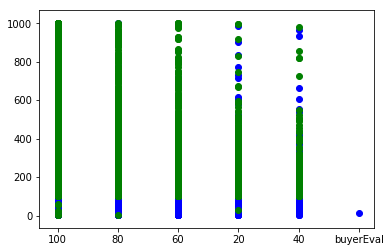

In [65]:
#Okay, so now do some sentiment analysis and such with these ones
#Also maybe look into buyereval vs review_length

%matplotlib inline
plt.scatter(middle_df.buyereval, middle_df.feedbacklength,color='blue')
plt.scatter(trusted_df.buyereval, trusted_df.feedbacklength,color='green')
plt.scatter(untrusted_df.buyereval, untrusted_df.feedbacklength,color='red')

In [68]:
english_df.shape

(25006, 24)

In [69]:
english_df.groupby('basic_trust').agg({'basic_trust_tag':'count'})

,basic_trust_tag
basic_trust,
0.5,19708
1.0,3231


In [70]:
english_df.to_csv('english_reviews_only.csv')

In [71]:
new_df.shape

(133628, 23)

In [74]:
english_rated_df = pd.read_csv('english_reviews_predicted_trust.csv', index_col=0, low_memory=False)

In [75]:
english_rated_df.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,feedback_lang,tokens,trainable_trust,predicted_trust
0,32243608596,False,US,100,"great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,False,False,81,0.5,Review has no standout features,2.0,en,"['great', 'fabric', 'and', 'quality', 'fast', ...",False,False
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,False,False,7,0.5,Review has no standout features,1.0,en,['thanks'],False,False
5,32243608596,False,US,60,not bad for such price,NaN,NaN,1693179945,Y*******d Y.,2018-08-28,...,False,False,22,0.5,Review has no standout features,1.0,en,"['not', 'bad', 'for', 'such', 'price']",False,False
7,32243608596,False,US,100,"nice cap, my boyfriend is very happy with it ...",NaN,NaN,1673192723,S*****a W.,2018-08-23,...,False,True,146,1.0,Trusted Reviewer,1.0,en,"['nice', 'cap', 'my', 'boyfriend', 'is', 'very...",True,True
11,32243608596,False,US,20,all stained terrible goods,M,https://gw.alicdn.com/tps/TB1CjX4LXXXXXbSXFXXX...,725446934,S***g C.,2018-08-29,...,False,False,27,1.0,Trusted Reviewer,1.0,en,"['all', 'stained', 'terrible', 'goods']",True,True


In [76]:
df_with_predict = new_df.join(english_rated_df['predicted_trust'])

In [77]:
df_with_predict.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,max_freq,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,predicted_trust
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,1.0,0.5,No standout reviewer features,False,False,81,0.5,Review has no standout features,2.0,False
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,1.0,0.5,No standout reviewer features,False,False,69,0.5,Review has no standout features,1.0,NaN
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,...,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,...,1.0,0.5,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,1.0,0.5,No standout reviewer features,False,False,7,0.5,Review has no standout features,1.0,False


In [123]:
listofdict = []
for ind, row in df_with_predict.iterrows():
    if row['predicted_trust']==True:
        final_trust = 1
        predicted_tag = 'This reviews uses language like those of other trusted reviews.'
    elif row['predicted_trust']==False:
        predicted_tag = 'The text of this review does not look like the trusted reviews.'
        if row['basic_trust'] == 1:
            final_trust = 1
        else:
            final_trust = 0
    else:
        predicted_tag = 'This review has no english text'
        final_trust = row['basic_trust']
    current_dict = {
        'ind':ind,
        'final_trust':final_trust,
        'predicted_tag':predicted_tag
    }
    listofdict.append(current_dict)
final_trust_df = pd.DataFrame(listofdict)

In [124]:
final_df = df_with_predict.join(final_trust_df.set_index('ind'))

In [125]:
final_df.to_csv('df_with_reviews_and_trust_and_all.csv')

In [84]:
product_df = pd.read_csv('all_saved_product_info.csv', index_col=False, low_memory=False)

In [85]:
def get_product_info(product_url):
    product_df = pd.read_csv('all_saved_product_info.csv', index_col=False, low_memory=False)
    product_info = product_df.loc[product_df['product_url']==product_url]
    return product_info

In [86]:
product_info = get_product_info('https://www.aliexpress.com/item/Free-Shipping-Magic-Sponge-Eraser-Melamine-Cleaner-multi-functional-sponge-for-Cleaning100x60x20mm-50pcs-lot/683078212.html?ws_ab_test=searchweb0_0,searchweb201602_4_10065_10068_10130_10547_10546_10059_10884_10548_315_10545_10887_10696_100031_531_10084_10083_10103_451_10618_452_10307,searchweb201603_54,ppcSwitch_5&algo_expid=bc821ff7-d9d4-47c3-8285-22877b125992-46&algo_pvid=bc821ff7-d9d4-47c3-8285-22877b125992&priceBeautifyAB=0')

In [101]:
product_id = product_info.iloc[0]['product_id']

In [126]:
product_reviews = final_df.loc[pd.to_numeric(final_df['product_id'], errors = 'coerce')==product_id]

In [100]:
final_df.iloc[324]['product_id']

'32238570601'

In [127]:
product_reviews

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,predicted_trust,final_trust,predicted_tag
76535,683078212,True,US,100,NaN,NaN,NaN,NaN,AliExpress Shopper,2018-05-17,...,NaN,True,True,3,0.0,No written review and no images included,NaN,NaN,0.0,This review has no english text
76556,683078212,False,US,100,NaN,NaN,NaN,1745543028.0,M****n T.,2018-09-06,...,NaN,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
132706,683078212,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB84kN5wwQydeJk43P...,910108094.0,D****a Z.,2018-08-03,...,NaN,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
132765,683078212,False,PL,100,Ok,NaN,https://ae01.alicdn.com/kf/UTB80MkWg3nJXKJkSae...,839690173.0,M****a M.,2018-04-13,...,NaN,False,False,2,0.5,Review has no standout features,1.0,NaN,0.5,This review has no english text
132831,683078212,False,US,100,Great product! I will be buying more!,F,https://gw.alicdn.com/tps/TB1zA01LXXXXXc0XFXXX...,1695028926.0,Us C.,2018-04-10,...,NaN,False,True,37,0.5,Review has no standout features,3.0,False,0.0,The text of this review does not look like the...
132846,683078212,False,US,100,Dobrze czyszczą nawet zaschnięty brud,F,https://ae01.alicdn.com/kf/UTB8gBl7guvJXKJkSaj...,1722118894.0,K*****a W.,2018-06-25,...,NaN,False,True,37,0.5,Review has no standout features,3.0,NaN,0.5,This review has no english text
132859,683078212,False,US,100,NaN,NaN,NaN,901052757.0,K***a M.,2018-09-11,...,NaN,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
132874,683078212,False,US,100,Great product!,F,https://gw.alicdn.com/tps/TB1zA01LXXXXXc0XFXXX...,186083197.0,J**y R.,2018-08-29,...,NaN,False,True,15,0.5,Review has no standout features,1.0,False,0.0,The text of this review does not look like the...
132875,683078212,False,US,100,NaN,NaN,https://ae01.alicdn.com/kf/UTB83VNHXHnJXKJkSah...,909710336.0,M****a C.,2018-03-26,...,NaN,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
132903,683078212,False,US,100,NaN,NaN,NaN,811182216.0,S***e K.,2018-08-23,...,NaN,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text


In [128]:
product_reviews.groupby('final_trust').count()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,initial_trust,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,predicted_trust,predicted_tag
final_trust,,,,,,,,,,,,,,,,,,,,,
0.0,37,37,37,37,28,17,21,33,37,37,...,0,0,37,37,37,34,34,33,28,37
0.5,41,41,41,41,33,25,27,39,41,41,...,0,0,41,41,41,41,41,39,0,41
1.0,1,1,1,1,1,1,1,1,1,1,...,0,0,1,1,1,1,1,1,0,1


In [109]:
eval_series = product_reviews['buyereval']

In [110]:
eval_series.mean()

1.2512512512512514e+227

In [111]:
eval_series.max()

'80'

In [112]:
eval_series.min()

'100'

In [114]:
pd.to_numeric(eval_series).mean()/10

9.4

In [129]:
best_reviews = product_reviews.loc[product_reviews['final_trust']==0.5]

In [130]:
best_reviews.shape[0]

41

In [131]:
top_reviews = best_reviews.sample(n=2)

In [132]:
top_reviews

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,predicted_trust,final_trust,predicted_tag
132975,683078212,False,RU,100,"Губки хорошие, доставка месяц.",F,https://ae01.alicdn.com/kf/UT8yC16XWXXXXagOFbX...,761554695.0,E***a P.,2018-05-23,...,NaN,False,False,30,0.5,Review has no standout features,1.0,NaN,0.5,This review has no english text
132957,683078212,False,PL,100,great,F,https://gw.alicdn.com/tps/TB1zA01LXXXXXc0XFXXX...,781408254.0,K******a S.,2018-09-05,...,NaN,False,False,6,0.5,Review has no standout features,1.0,NaN,0.5,This review has no english text


In [3]:
final_df = pd.read_csv('df_with_reviews_and_trust_and_all.csv', index_col=0, low_memory=False)
final_df.head()

,product_id,anonymous,buyercountry,buyereval,buyerfeedback,buyergender,buyerheadportrait,buyerid,buyername,evaldate,...,trust_tag,feedback_na,image_na,feedbacklength,basic_trust,basic_trust_tag,reviewer_review_count,predicted_trust,final_trust,predicted_tag
0,32243608596,False,US,100,"Great fabric and quality, fast delivery and co...",NaN,https://ae01.alicdn.com/kf/UTB8vTH0hFPJXKJkSah...,230419691,E***e L.,2018-08-31,...,No standout reviewer features,False,False,81,0.5,Review has no standout features,2.0,False,0.0,The text of this review does not look like the...
1,32243608596,False,US,80,"Me gusto mucho igual que la presentación, nada...",F,https://ae01.alicdn.com/kf/UTB8lUMuipPJXKJkSah...,1678569385,M**a M.,2018-08-28,...,No standout reviewer features,False,False,69,0.5,Review has no standout features,1.0,NaN,0.5,This review has no english text
2,32243608596,False,US,100,NaN,F,https://ae01.alicdn.com/kf/UTB8upYOXSbIXKJkSae...,127741530,V******a R.,2018-09-10,...,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
3,32243608596,False,US,100,NaN,NaN,NaN,1616342783,R****r S.,2018-09-10,...,No standout reviewer features,True,True,3,0.0,No written review and no images included,1.0,NaN,0.0,This review has no english text
4,32243608596,False,US,100,thanks!,F,https://ae01.alicdn.com/kf/UTB8eeCYxqrFXKJk43O...,890393619,E****************r N.,2018-08-18,...,No standout reviewer features,False,False,7,0.5,Review has no standout features,1.0,False,0.0,The text of this review does not look like the...


In [10]:
final_df['buyereval'] = pd.to_numeric(final_df['buyereval'],errors = 'coerce')

In [11]:
product_scores = final_df.groupby('product_id').agg({'buyereval':'mean'})

In [13]:
product_scores.min()

buyereval    53.333333
dtype: float64

In [15]:
trusted_df = final_df.loc[final_df['final_trust'] == 1]

In [16]:
trusted_scores = trusted_df.groupby('product_id').agg({'buyereval':'mean'})

In [18]:
trusted_scores.min()

buyereval    20.0
dtype: float64

In [27]:
review_dist = final_df.groupby('buyereval').agg({'product_id':'count'}).rename(columns={'product_id':'count'})

In [29]:
trusted_dist = trusted_df.groupby('buyereval').agg({'product_id':'count'}).rename(columns={'product_id':'count'})

In [32]:
review_dist['freq']=review_dist['count']/(review_dist['count'].sum())

In [34]:
trusted_dist['freq']=trusted_dist['count']/(trusted_dist['count'].sum())

In [33]:
review_dist

,count,freq
buyereval,,
20.0,1913,0.014316
40.0,802,0.006002
60.0,4408,0.032988
80.0,11321,0.084723
100.0,115180,0.861971


In [35]:
trusted_dist

,count,freq
buyereval,,
20.0,428,0.015176
40.0,210,0.007446
60.0,1062,0.037656
80.0,2679,0.094990
100.0,23824,0.844733


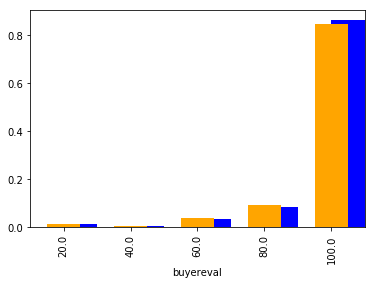

In [46]:
%matplotlib inline
review_dist['freq'].plot(kind='bar',stacked=True, color='blue',align='edge')
trusted_dist['freq'].plot(kind='bar',stacked=True, color='orange')

In [47]:
negative_trusted_df = trusted_df.loc[trusted_df['buyereval']<80]

In [49]:
negative_trusted_df = negative_trusted_df.loc[negative_trusted_df['predicted_trust']==True]

In [51]:
ids_with_negative_reviews = negative_trusted_df.groupby('product_id').agg({'buyerid':'count'}).rename(columns={'buyerid':'count'})

In [54]:
ids_with_negative_reviews.sort_values(by='count', ascending = False)

,count
product_id,
32853672874,11
32857159419,10
32851179281,5
32818439807,5
32848391121,4
32840747956,4
32750221334,4
32847130421,4
32834069060,4


In [4]:
def find_english(product_reviews):
    lang_list = []
    for ind, row in product_reviews.iterrows():
        this_review = row['buyerfeedback']
        print(this_review)
        try:
            feedback_lang = detect(this_review)
            lang_dict = {
                'feedback_lang':feedback_lang,
                'ind':ind
                }
        except:
            continue
        lang_list.append(lang_dict)
    lang_df = pd.DataFrame(lang_list)
    print(lang_df.shape)
    product_reviews = product_reviews.join(lang_df.set_index('ind'))
    english_product_reviews = product_reviews.loc[product_reviews['feedback_lang']=='en']
    return english_product_reviews

In [5]:
product_reviews = pd.read_csv('./Processed_Reviews/18_09_18_review_with_initial_reviewer_trust.csv',index_col=0, low_memory=False)

In [ ]:
find_english(product_reviews)

Great fabric and quality, fast delivery and comfort to wear. Highly recommended !
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual que la presentación, nada más que tardo mucho!!!
Me gusto mucho igual

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
thanks!
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such price
not bad for such 

Está más descolorida que en la foto del anuncio pero por lo demás todo bien.
Хорошая кепка ! Немного грязновата белая часть ! А так отлично !!
good seller! Доставка 3 недели с момента покупки в респ.Татарстан, товар упакован в надутый пакет, что позволило прийти целым не мятым, выглядит как на картинке, качество достойное, без посторонних запахов, размер разный подстраивается и на 60 размер. товар и продавца рекомендую
nan
nan
товар пришёл быстро, за свои деньги вполне хорошая кепка
Хорошая кепка! Рекомендую!
Great fabric and quality, fast delivery and comfort to wear. Highly recommended !
very cute. excelent package!!!!
Крутая кепка! Упаковано в воздушный шар. Покупкой доволен. Спасибо продавцу!
Хорошая кепка по разумной цене.Долго ждать не пришлось.
nan
20дней до ЛО!Рекомендую!Очень классная!На большую голову сядет отлично(заказывала мужу),но и на меня отлично)
Классная кепка. Сделана очень качественно. Продавец хорошо упаковал заказ. Пришёл заказ во время и в срок.
отличная кепка со

Звезду убрала т .к. шов  распорот- дырка 3 мм .Придётся зашивать вручную. А остальное всё соответствует описанию товара. Спасибо очень быстро прислали.
заказала 29.03 получила 26.04. кепка хорошего качества.
super summer great part can. top quality thanks
все хорошо, как есть так получил ...
bonne finition. Conforme à la commande.
Very nice Item. Great Value
Хорошая кепка, удобная.
Color is not the same 
nan
nan
nan
all good. thank you.
nan
nan
nan
nan
nan
месяц до Волгограда шла. все супер, козырек бомба и материал хорошый. посмотрим на сколько хватит
Доставка заняла 21 день
Упакован очеь компактно, верх заправлен под козырек
Цвет соответствует, но на фото в описании материал кажется плотнее
Качество нормальное, швы ровные
Посадка глубокая, на маленькую голову не натягивать .
buyerFeedback
nan
Пришла через месяц в Казахстан как и ожидалось. Немного помялась. Качество хорошее Подарка не было 
качество понравилось, смотрится хорошо, всё целое, помята не сильно. На картинке казалась темн

nan
nan
nan
buyerFeedback
I am very happy with my purchase. The item is very nice and the seller is terrific. Thank you.
nan
buyerFeedback
Упаковка и доставка нормально. Заказывал два золотой и под старину. Золотой чуть короче чем который под патину. Браслет тяжелый. Золотой блестящий, под старину не так сильно блестит. Отзыв дополню после носки хотя бы пару месяцев.
Envio rápido, foi entregue antes do tempo previsto. Produto dentro das expectativas em relação preço/qualidade
nan
Beautiful! Great quality! Thank you!
браслет как на картинке рекамендую
Beautiful. Fits perfectly.
nan
nan
nan
nan
nan
nan
nan
nan
nan
Great quality! Thank you!
Заказывал два браслета. тяжелые с виду красивые. дополняю отзыв позднее
buyerFeedback
Замечательные бодики! Ткань трикотаж, хлопок. Расцветки приятные. Заказала размер на 12 месяцев, но зависит от малыша. Взяла для мальчика 6 месяцев, но думаю на 6-10 месяцев пойдет нам. Посылка пришла быстро Заказала 26.07, в Томск пришла 7 августа. Трек отслеживался.

Все отлично. Заказ пришёл быстро- до Самары около 2 недель.  
Très satisfait de ces lunettes, tout à fait adaptées pour le cyclisme.
todo correcto
Perfect delivery + perfect goods
nan
nan
thank you
nan
nan
Excelente
nan
nan
nan
nan
nan
nan
nan
thank you
thank you
buyerFeedback
Очень хорошее качество,большое спасибо,закажу другой цвет
Everything is good, top ware! Thanks
Metallic part wasn't same color as picture
nan
nan
nan
nan
nan
nan
nan
bellísimo
nan
buyerFeedback
Пропускает воду.Не вздумайте сразу купаться с этим чехлом вы сломаете свой телефон.Этот чехол пропускает воду ещё раз говорю.Деньги вернули 
Thank you from Calizota!
nan
nan
nan
nan
nan
buyerFeedback
nan
nan
nan
nan
nan
buyerFeedback
nan
fantastische kwaliteit en zeer snel geleverd.
colis recu trés rapidement en France 
pas encore essayé mais testé en resistance et la limite correspond bien 
tresse d'apparence lisse 
qualité prix au rendez vous

I have bought a few spools of this line.It is great line for catfishing.The bl

Everything is all right. Thank you.
buyerFeedback
пришло до кемерово быстро по качеству всё гуд
nan
nan
nan
buyerFeedback
Качество вроде с виду нормальное время покажет ремень плотный. Пряжка красивая. Кожаные вставки могут царапаться.
nan
Доволен. Заказываю не первый раз.
Really good!!!! Good quality!!!
nan
nan
nan
Good seller
Good seller
nan
nan
nan
nan
nan
nan
nan
nan
Пришел за месяц ровно,  упакован хорошо.  Ремень добротный,  плотный.  Очень порадовала пряжка,  удобная надежная конструкция плюс солидный внешний вид.  Очень доволен,  рекомендую.
В Нижегородскую область ремни пришли за 30 дней,заказывал два ремня,один для сына,другой для себя,ремни выглядят добротно пряжки тяжелые,подарка в виде денежки как пишут в других отзывах,не было.
отличный ремень. Рекомендую. доставка достаточно быстрая
Excelente diseño y buena calidad... llegaron super rápido totalmente recomendable, gracias
Экстра-скоростная доставка до Таллина - 10 дней =))) Ремень очень плотный, я даже удивилась - ожидал

доставка  до новосибирска 23 дня, комплект красивый , сверкает здорово, за счет того, что круг на серьгах подвижен, блеск еще больше (на фото не видно)
nan
item exactly as in description, good quality materials. Thanks
nan
Very beautiful jewelry. Incredible cheap price. Will buy again.
super
Bonjour,
C'est un très beau bijoux, je suis ravie de mon achat.
Bien cordialement
nan
Excellent value! Great shipping time .... This one was for my husband ....ordered another one for myself!
this product its excellent. the size its perfect. fast delivery
nan
Arrived in less then 3 weeks. I'm very surprised and excited
good material, beautiful, comfortable, and fast shipping .. I'm very satisfied and will order again other colors, thank you
item exactly as in description, good quality materials. Thanks
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
Happy with product Everything is ok. I recommend this seller!!!
Just received it! Thanks, I love i

спасибо, очень красивый набор. Отправили в день заказа, доставка 3 недели с даты оформления заказа.
заказом давольна,100% совпадает с описанием. Серьги смотрятся не очень(на мой вкус) в целом не плохо,блестят супер. шли более месяца,прадавца советую.
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
this product its excellent. the size its perfect. fast delivery
Just received it! Thanks, I love it s much! Delivered in a very reasonnable extension of time. See you soon!
this product its excellent. the size its perfect. fast delivery
Arrived in less then 3 weeks. I'm very surprised and excited
im so happy of what I got however it took so long to arrive.. worth it though
Very good product. I am very pleased pleased that he bought it in your store. Good store. Good luck!
item exactly as in description, good quality materials. Thanks
the sel

Красивое колечко, качественное. Трек отслеживался. Было бы лучше, если бы покрытие было под
жёлтое золото, а не под розовое, но это на мой вкус. Цена очень лояльная, так что всё отлично.
Lovely ring...
nan
nan
nan
nan
buyerFeedback
nan
nan
nan
buyerFeedback
Отличен продукт. Нормална доставка, поръчани на28.03.2018, получени на24.04.2018. Много добре опаковани. Силно препоръчвам този търговец.
Товар получил меньше чем через 10 дней после заказа. Я в восторге. Всё работает. Продавца очень рекомендую.
Пришло через 12 дней) Фонарь клевый, регулируется рассеивание света, три режима свечения: обычный, мигающий и третий не поняла, как будто как первый, потом разберусь)  Батареек нет, покупайте 3 мизинчиковых. Короче, товар рекомендую, продавца рекомендую. Лайк)
Фонарь пришел быстро. Нормальный вариант без особых претензий. Работает, спасибо продавцу.
nan
Очень Хороший Фонарик за эти деньги. Продавец Хороший. Рекомендую!!! 5+++++++
Не первый раз заказываю такой фонарь, очень нравится (первый б

nan
nan
Майка красивая, приятная к телу,лёгкая, на мой 44 немного велика, но не критично на лето хорошо будет. Доставка быстрая, спасибо продавцу)))
Хорошая и яркая футболка на лето. Ткань лёгкая, но не х.б.
Майка пришла в течение месяца с заказа, отправляли долго. Ткань очень тоненькая, но под рисунком не просвечивает, можно без лифа носить, кому нужно. Приятная к телу. Сам рисунок яркий, как на фото, в стирку пока не отправляла. единственный минус (долой звезду) рисунок отпечатался насквозь на спинке футболки. Размер мне впритык почти, а значит максимум 46р российский. За эти деньги (если со скидкой) рекомендую!
Глаза явно меньше чем на рекламе в магазине. И ворот на рекламе большой, по факту - узкий.

Снизил баллы за то, что на фото в магазине  совершенно другая майка. А за такое аказывать надо, когда на фото один товар, присылает другой.

 Рисунок только похожий.  Будьте внимательны, может прислать эту картинку на чём угодно.
Привольные ,тонкие ,на лето супер . Единственное ,не раз

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


заказываю у этого продавца эти наушники 2 раз и не разочаровался. Пришли в брянскую область за 9 дней. Наушники качественные и по звучанию и по материалу.
très très fort, et bon produit, comme décris, je recommande ce vendeur fortement
Наушники очень понравились, не ожидал за такую сумму такого звука и приятного качественного провода. Заказывал 3 штуки 1 черные и 2 золотые.
Все целые, одно немного расстроило в одних золотых наушниках  у магнитов не соблюдена полярность и они не соприкосаются. Но на качество звука это не влияет. Спасибо)
Os fones vieram bem embalados. Demoraram para chegar mas por conta da greve nos Correios do Brasil. vendedor enviou como pedido. Os fones são lindos de ótima qualidade. Vieram acompanhados 3 tamanhos de silicone. O som do microfone é ótimo! O fio é bem comprido (cerca de 70 cm) e parece ser bem resistente. Minha família adorou os fones! Obrigada ao vendedor!
Наушники классные! за такую цену вообще не ожидала. звук хороший с басами. Микрофон тоже работае

Perfecto funcionan muy bien en este minan es débil se imanta pero poco 
шли ушки месяц ровно до Кемеровской обл, звук хороший,красивые, в ушки хорошо встают,удобные,за эту цену отлично!
Magnets? Really? Doesn’t work. Headphones work good. 
Дополнительные насадки разного размера, 3 большие и одна маленькая, минус заезда( 
Заказом очень довольна! Заказала 13 мая, а получила уже 29 мая! Это моя самая быстрая доставка с сайта! Спасибо продавцу! Наушники за свою цену просто шикарные. До этого брала в магазине за 600р и качество звука намного хуже, чем у этих за 178!общаться с продавцом не пришлось) вообщем спасибо)
магнитные, не запутываются. звук хороший. кнопки на гарнитуре так себе, но надеюсь хватят надолго. довольна заказом!
В Киев пришли за 15 дней.Все работает.Правда раньше были с сумочкой для наушников.
товар пришел ооочень быстро) я даже не
 ожидала) наушники хорошо упакованы, исправны, звук хороший, и чистый бас без хрипов, спасибо продавцу, буду заказывать ещё:)
При прослушивание

This is a pretty good accessory. It’s the best product your money can buy. I high recommend it. Bonus points for the good communication from the seller. I’ll always buy bluedio products. They’re as reputed as any other electronic company from Shenzhen
suenan muy muy bien. con CNA pierde graves pero cuando lleva rato puesto si lo desconectas pierde muchísima claridad de sonido. empecé con los t2 y se nota mucha la diferencia a estos, son muy cómodos. seguramente que con el tiempo me decida a comprar otro modelo de esta marca. si encuestras algo bueno, para que cambiar, verdad?. los he cogido blancos y se ven muy bonitos, en fin que todo con la palabra "muy" delante. te recomiendo los compres un lunes o martes, para que te lleguen en la misma semana, yo los cogí un jueves y claro, me  llegado un lunes, pero muy bien, 4 días en llegar. los veo un poco grandes para usar en exterior, pero para usar en casa, perfecto. creí que iba a ser todo plástico como los t2, pero no, todo lo que ves bri

Quick delivery. Perfect product, only Earphones are a bit big. That’s why it irritate a bit after long use
Excellent . Заказ доставлен до Харькова за 14 дней . Запакованном надёжно , в крупную пупырку . Наушники мне понравились , к телефону законектились без проблем , амбрушюры мягкие , плотно прилегающие . Звук при настройке эквалайзера нормальный . Блютуз через стену работает без проблем . Заказом доволен .
Did not test them yet, but everything looks fantastic and professional. The seller sends the package fast. I recommend.
наушники супер, звучание огонь. сначала думал в одном пакете прислали, решил, что наушникам там уже не очень, а оказалось там ещё одна коробка и пупырка. ну просто топ! посмотрим на их долговечность, а пока все прекрасно.
.. мешочек очень порадовал)
Доставка из России в Москву 4 дня, качество супер, мч доволен, быстро коннектится с айфоном, смотрятся стильно, хорошо прилегают к уху, мягкая душка не давит голову. В комплекте зарядка, мешочек для хранения наушников

Доставка до Московской области - 3 недели. Упаковали надёжно, так что в пути с ними ничего не могло случиться. Наушники отличные. Плюсы:
1) Хорошее пассивное шумоподавления
2) Хорошее качество звука
3) Внешний вид
4) Удобство
5) Упаковка очень продумана и эстетичная + в комплекте USB C для зарядки и кабель USB C - 3.5 mm + мешочек
6) Хороший микрофон
7) Долгое время работы (4-6 дней при умеренном использовании)
8) Цена: на распродаже в честь дня рождения AliExpress были куплены за 1 531.71 рублей.
Минусы:
1) Неудобное расположение клавиш "Вкл/выкл", уменьшения/увеличения громкости, переключение треков (те же клавиши, что и уменьшение/увеличение громкости, но при длительном нажатии). Но, думаю, к этому можно будет привыкнуть.
Покупке очень рад. Рекомендую!!!
yaklaşık 1 ayda geldi. çok yüksek ses ve bass seviyesi yok,ancak müzik kalitesi çok güzel. Ses çıkışı iyi olan bir cihaza bağladığınızda çok kaliteli ses alıyorsunuz.ürünün kaliteli malzemesi var, kulak yastıkları büyük,kulağınızı t

Good quality, comfort and great sound. Highly recommend. Arrive at Mexico about 1 month.
Я довольна. Они тяжёлые, но они классные. Звук ооооочень громкий.
Muito melhor que o meu outro Phone  da bluedio que tenho, um HS que quebrou a parte plástica toda. Som muito melhor a parte ruim e quando ligamos o redutor de ruídos externos perdemos todos os graves no Phone e para quem ama os graves isso e ruim. Muito confortável. Recomendo o Phone.
Отличные уши.
Мощные, тяжелые, мужские.
Для девочек большеваты. Если конечно ваша девушка не лошадь)

Звук вполне, не скажу что звучат лучше чем Т2, но звукоизоляция определенно лучше.
Посылка шла из Китая около месяца в Киров.Наушники по соотношению цена-качество оптимальны.Настоятельно рекомендую к покупке.
the headphones are amazing, clear sound and decent bass, very good quality for the price.
В Питер из Китая за 15 дней.Трек работал До моего отделения.Упаковка надёжная .Качество наушников  хорошее.Звук нормальный .Нельзя во избежании проблем включа

Сначала я был очень доволен товаром, потом сильно раскритиковал звук. но, вспомнил, что они стоят 1500р. ща эту цену качество отменное. Дужки из металла, хороший кожзам, все функции работают.  Наушники стоят своих денег.
Ürün gerçekten 10 numara 5 ***** Türkiye’ye 2 hafta içinde geldi ses kalitesi beklediğimden kat kat üstün bas tiz harika 
Português: Boa qualidade, entrega rápida (marque Brasil pra envio nacional). Top demais estou super feliz.

English: Amazing quality, fast delivery. I am so happy it is the product that I was dreaming of.
great seller, very very fast shipping !! good quality of sound and comfort, recommend !!
The product has a pleasant sound and a moderate noise canceling. With a bit of music you can avoid distraction of nearby conversations. Shipped 7 days after purchase, took 9 days to go from São Paulo to Porto Alegre. Did not have the chosen color in stock in Brazil, so I changed to red.
Наушники брал за 1500 руб, по акции и это отличная цена.
Звук выше среднего

Продавец отправил быстро, на следующий день. До Киева дошли за 18 дней. Упакованы хорошо. Качество то что и ожидал. Продавца советую.
nan
4 с натяжкой. У меня есть версия T2, дак вот она намного лучше играет, функция шумоподавления в этих наушниках только искажает звучание, да и без этой функции звучание так себе, басов явно не хватает
все отлично! заказ отправили быстро и пришли за 2 недели . Наушники классные звук хороший лучше чем в Т2. продавец шустрый  рекомендую 
уши отличные, покупал за 2700 пришли за 2 недели.
Наушники имеют ряд минусов с которых и начну:
1. Они излишне тяжёлые, т.к. сделаны из металла. Это придает излишний вес конструкции, что ощущается на голове через час-два после ношения на голове. Из этого пункта вытекает второй.
2. Нарушен баланс. Центр тяжести равномерно распределен, что неправильно и при малейшем наклоне головы наушники наровят сползти вниз. только прямая голова, только хардкор.
3. Верхняя дужка (на которой написано Turbine) не имеет боковых стенок. Это

Нормальные уши за эти деньги! Брал на акции за 1400 больше они не стоят! Сборочка на 4 -!!! Все остальное нормально играют достойно! Доставка в Калининград месяц , в Питере пролежали 17 дней!
très bon casque. merci au vendreur !! je vous le recommande vivement.
Arrived very fast, well packed, looks and sound great 
Very great product and sound!!! Very happy!! Thanks! 
Excelente, nada más que decir. Simplemente extraordinario
Fast shipping.100% accurate with product description.I strongly recommend the seller!
купил на распродаже за 1531 рубль. обалденный звук. всего достаточно.
Доставка  до  двери 7 дней. Качество  на  высоте .  Оригинал .  Звук хороший.
Звук хороший только по проводу, по блютуз от смартфоне звук очень громкий но не качественный. Для пк плохо подходят, звук слабый по проводу, наверное сказывается сопр.16. У меня Panasonic проводные лучше звучат а по цене стоят одинаково. По блютуз через пк слушать не возможно, не знаю может адаптер плохой, поменяю адаптер дополню отзыв

Заказала 02.08, получила 27.08 (Москва). Посылка на территории РФ не отслеживалась. Упаковано аккуратно, ничего не повредилось. Наушники классные! Звук хороший. За эти деньги.. я довольна! Продавцу большое спасибо! 
Ürünü aşağıda belirtilen şekilde 5 üzerinden değerlendirdim.

* Kargo = 4  ( Biraz daha hızlı olabilir)
* Ürün kalite = 4 ( En kaliteli ürünle nerdeyse eş değer)
* Ses kalitesi = 4 ( Pahalı alacağınız üründen bir tık aşağıda)
Fiyat / performans = 5 ( Bu açıdan tamamen hakkını veren bir ürün).

Türkiye'den sipariş vericeklere tavsiye ederim.
Satıcı ve AliExpress teşekkürler.
Классные наушники, тем более за такую цену! Заказала сразу 2. Доставка до Оренбург.обл полторы недели, а это очень быстро. Я всем довольна, спасибо!
Товар шёл очень долго. Упаковка хорошая. Наушники целые и рабочие.
доставка полтора месяца, но наушники неплохие, басы присутствуют, доп.вкладыши, к покупке рекомендую (если есть не влом ждать)
Lo recibí en perfecta condiciones y tiene un buen sonido
nan
За 

Хорошее качество за такую цену. Продавец молодчина. Отслеживались до почтового отделения.
Заказ прибыл в Одессу через 40 дней! Очень долго пришлось ожидать, возможно из-за новогодних праздников. Поэтому и скинул одну звезду за долгую доставку. Качество звучания очень порадовало - хороший и чистый звук, басы хорошо отрабатывают. В комплекте три пары амбашюр разных размеров, что очень хорошо! Всё хорошо упаковано. Наушниками очень доволен! Рекомендую!
Отличные наушники, нармяш басы для такой смешной цены  :)))))
Товар после заказа пришёл в Ленинградскую область менее чем за три недели . С продавцом не списывался . Трекер почтового отправления по России отслеживался плохо . Описание данное продавцом полностью соответствует действительности , качество изделия достойное для такой цены . Если вы не меломан то эти наушники оправдают ваши ожидания (хороший выбор для аудиокниг) . Продавец положил в подарок ещё один набор амбушюр . Магазин и товар рекомендую использовать к покупкам . Продавцу сп

Very nice setup was easy a little big for my ear but good.. 
nan
I ordered the AirPod, but I received them one of them was not working. The seller was very kind he sent me a replacement one with quite case. Thank you for the seller. The seller is very reliable. However after I used the AirPod so far I discovered that the AirPod is bad quality. The charge doesn’t sty more than one  hour. It takes to long to charge. You can’t make a phone call with it. The sound is poor. I am so satisfied with seller but I do not like the product.
nan
good product exactly what was described battery life is good lasted for about 3 hours
Very nice looking product. The size is a little large and have not tried them yet but looks good
envio a colombia muy rapido  exelentes me gustaron mucho
I didn't test it yet but it arrived very fast. thanks
доставка долгая. Качество товара оставляет желать лучшего.
Ils sont très gros pour mes oreilles sur la photo en ne devine pas que c’est gros 
Item works as advertised 

наушники пришли довольно быстро,спасибо продавцу,музыку,воспроизведение видео,голосовые вызовы,все слышно хорошо,на мой взгляд,хороши за свои деньги,но немного большеваты
Наушники хорошие! Очень довольна)))) Крышка зарядника очень нежная, муж сразу поломал. Многие пишут что здоровые для женских ушей, ну не знаю, у меня в ушах хорошо сидят. А так всё супер. Доставка до Москвы 22 дня. Продовца советую
Tal y como se describe: solo tengo que probar 
Товар хороший, доставка в срок. Сейчас тестирую качество звука и разговора.
Great seller
tal cual la descripción. falla un poco el sonido del derecho pero falta probarlo más.
Article bien arrivé et très rapide 9 jour super vendeur merci 
superbe qualité de son, livraison rapide, rapport qualité prix + + +
Apenas trabalha 1 unidade, o outro não liga, está avariado
Отличные наушники.  Звук хороший.  Но
 пришли треснутыми,  продавец обещал заменить. Обратная связь на высоте.  Жду замену.  Обязательно дополню отзыв.
Доставка до Краснодара 20 дней. 

пришло в срок, работают хорошо басы долбят, кнопка и микрофон работают.
Очень даже хорошо для своей цены, звук громкий, даже присутствует басс. Очень благодарен продавцу. Спасибо. Кстати доставка очень быстрая! 1.5 недели до РБ (Жодино). Еще раз спасибо! :)
Качество неплохое за свою цену. Много низких частот, нужно настраивать эквалайзер в системе.
Пришел товар. Но долго шел. Что подумал, что он уже не прейдет.  Я понимаю все, к продавцу не имею претензии. Спасибо за товар. Любителей меломанов одобряю за цену и качества. Громкие, но чуство босов и остольно не ждите лучшего за такую цену.
Качество отличное. В Украине были через две недели. Это супер быстро.
Получил наушники. По качеству звука могу сказать так, басов много, но звук глухой если слушать обычную музыку. Далее, пульт управления работает не корректно, через пять минут перестал работать, переключать музыку с пульта не возможно. Но лучше найти наушники по дороже.
Хорошие наушники, быстрая доставка
Товар качественный, звук хорош

с момента заказа прошёл месяц, цвета положили желаемые, всё работает
nul!!!!! j'ai reçu rapidement les écouteurs. mais quand je m'en suis servi un des deux écouteurs ne fonctionnait pas! J'en ai parlé au vendeur mais il m'a fait tourner en rond pendant un moment pour au final ne rien faire!!
vraiment pas comptant! ça ne vaut rien!
je déconseille fortement ce vendeur!
Наушники отличные! Звук ХОРОШИЙ,но есть и минус клавиши убывание/прибавление звука работают через раз или нажимаю убавить то прибавляется, продовец хоршоой
Super fast delivery! Product is as described. Just a small thing is that the earpieces seem big to my ears :( keep falling out after a while. 
headphones are very good quality, Sound and bass are great
very happy with earbuds only wish they came sooner thank you Emilio.
Great Audio Quality For The Price. Package Came In a somewhat short amount of Time and was well sealed and protected. Both Headphones are working. Mic also works but is a little quiet but is still clear 

До Екатеринбурга дошли за месяц. Заказывали для домашнего использования (в ноуте, телефоне) за 110,60 руб. За такую цену норм.
Посылка до  Севастополя пришла за месяц. Упаковка целая, наушники без повреждений, звучат хорошо. рекомендую.
Наушники заказываю третий раз, всем очень нравится, соотношение цены и качества 100%
Item matches the description. It works.
Thank you very much.
хорошие наушники. доставка в пермь две недели
Great Audio Quality For The Price. Package Came In a somewhat short amount of Time and was well sealed and protected. Both Headphones are working. Mic also works but is a little quiet but is still clear and functional. bass is good as well. Also for some reason it has a odd little clip. Isn't useful for me but it's functional for those who want to use it. Overall, Great earbuds especially for this low of a price. Will Likely purchase again from this seller if i need another pair. Highly Recommend.
Нормально качают басы выдаёт, но после машины не совсем понятно но д

Доставка заняла около месяца. Упакованы стандартно, в заводской пакет. В комплекте: по 2 пары подушечек ( маленькие и большие), а средние уже стоят и зажим. Я конечно не профи, чтобы расписывать по поводу звука. По-моему мнению высокие и низкие частоты прослушиваются достаточно хорошо. Провод у наушников тонкий - это наверное единственный минус. Микрофон работает отлично, на самом микрофоне кнопочка очень маленькая. Покупкой доволен. Продавца и продукт рекомендую! Если будут ещё какие-то минусы, то отпишу в дополнительный отзыв.
наушники за такую цену вполне хорошего качества,музыка играет громко,в ушах держатся хорошо, пришли быстро.упаковы слабо, но дошли целыми.рекомендую.
The headphones came in excellent condition, the sound is good, the goods are satisfied, thank you very much!
Заказала 1.05, получила в почтовый ящик 13.06, без отслеживания, соответствуют описанию, работают, рекомендую.
Супер наушники! Звучание отличное! Спасибо! Продавца  рекомендую
Good in-ear earphones, come wi

были заказаны 1 апреля. кинули в ящик 26го. мне нравится!
Доставка 1,5 месяца. Заказываю третий раз. Рекомендую 
Доставка 3 недели до Лен области, за эти деньги просто супер, очень не плохой бас, правда не хватает вч, но повторюсь, был очень удивлен качеством звука. В комплекте сменные вкладыши. Однозначно рекомендую к покупке, продавцу респект
Доставка месяц до Ижевска , качество звука среднее . думал будет хуже )
Наушники понравились! Пришли в фирменном пакетике. Все хорошо слышно. Провод очень удобный, давно такой хотела. Также в комплекте шли ещё две пары резиновых насадок разных размеров. Пришли за месяц (Казань, Россия). Цена=качество. Рекомендую!
Супер. Месяц в пути. Наушники за такую цену наилучшие! Басы отлично играют.
Мега крутые наушники. Сегодня получил,  музыку прогнал по ним, пару звонков сделал. Все отлично. Продавца рекомендую на 1203 %.
Наушники пришли. Хожу в них уже 3 день,  звук прекрасен,  бас просто изумительный.  В данной ценовой категории эти наушники самые лучш

Great, valjda rade, nisam još isprobao, koliko para, toliko muzike.
Все отлично,вторая пара у этого же продавца,соответствует описанию,звук отличный.
Отличные наушники, заказываю уже вторые. Доставка месяц. Звук отличный))) Спасибо продавцу!
Шло полтора месяца. Дошло в целости и сохранности. Качество звука явно выше, чем на сто рублей. Однозначно стоит брать.
Получил ровно через месяц Бросили в ящик .
На вид то что и заказал.Звук достойный пользоваться нормально. Цена ниже качества берите.
посылка до Ульяновка шла месяц,трек отслеживался ,наушниками остался доволен  отлично басят  за свои деньги.
отправка на следующий день, шли долго по Украине. Для своей цены качество и качество звука хорошее.
Товар пришёл очень быстро. Всё в порядке. Продавца рекомендую.
Товар пришел быстро .Наушники качественные, претензии нет.
наушники шикарные! шли конечно долговато (около 2 месяцев), по звуку похожи на sony MDR-EX15LP, но чутка потуалетнее. Басы есть. Шнур длинный, метр точно, кнопочка для вкл/вы

наушники проооооостоооо огонь. клевыееееее. заказывайте, не пожалеете
Неплохие наушники, звук чистый, без посторонних помех, микрофон рабочий, кнопка паузы работает. В комплекте шли еще несколько подушечек или как они называются;маленькие,средние и большие. Товар шел почти месяц. В целом,покупкой я довольна,посмотрим, сколько они проработают.
not very loud sound , it's ok, not what I was expecting
спасибо большое продавцу все супер пришло быстро в Латвию работает хорошо.
Наушники просто супер. доставка быстрая. трек отслежтвался. звук класс. продавца рекомендую
Заказ шел почти два месяца. Кинули в почтовый ящик. Качеством довольна ,звук громкий ,басы хорошие .Рекомендую.С продавцом не общалась .
Товар пришёл быстро, даже очень быстро, буквально, за один месяц. Товар понравился:приятное звучание (особенно за такие то деньги), качество товара, хорошо сидят в ушах (+ доп набор вакуумов для различных типов ушей). Это всё плюсы, но есть и минусы, один из таких то, что товар не отслеживался.

Эти наушники я заказываю в больших количествах второй раз. Первый заказ был у другого продавца в разы дороже. Эти наушники за 120 рублей, ну просто находка для скромного бюджета - они хорошего качества, громкость в них отличная, внешне красивые, как раз для моего большого девчачьего коллектива)). Нажатием кнопки звук останавливается, либо возобновляется, оч. удобно. Доставка быстрая 2 недели... Сейчас смотрю появилась платная доставка и всё же получается хорошая цена здесь, по сравнению с другими продавцами и я буду заказывать ещё здесь!
наушники классные на половине громкости орут очень сильно не знаю что будет если поставлю на всю. Микрофон есть, неплохой но хрипы есть, впрочем я их не для этого покупал. Наушники супер советую покупать! Куплю у этого продавца и чехол под них.
Звучание супер, басс отличный, товар и продавца рекомендую!
норм за эту цену,слушаю не часто,в зале устраивают,для постоянного использования не очень.
Bardzo fajne słuchawki, trochę trzeszczą ale za tą cenę bard

Наушники пришли в пупырчатом пакете, внутри в шершавом фирменном пакете, внутри сами наушники и длинный провод;) пришли за 54 дня;) ну так, наушники громкие, цвет белый, но вот эти серебрянные кончики у самих наушников выдают братьев китайцев :D есть микрофон, вроде как всё работает, это самые громкие мои наушники :D покупала за 106₽;) P.S есть некий закос под MI;) 
хороший звук. микрофон тоже работает без помех. выглядят хорошо.
Цвет яркий, звучат вроде норм! Мне нравятся. Продавцу спасибо!
Наушники очень приятно звучат. Громко. Шнур длинный, по качеству, словно вермешелька. Есть прищепка для одежды. Товар положили в почтовый ящик. С продавцом общаться не пришлось.
отличный звук за такие деньги! даже бабы есть. В комплекте резиночки разного размера
за эти деньги в переходе гораздо хуже, так что норм!
Доставка чуть меньше месяца. 
Товар не отслеживался.
 За свою цену наушники очень даже качественные, но упаковка такое себе.
Достаточно длинные.
Наушники шли чуть больше месяца. Качество 

Хорошие наушники, звук отличный, качество отличное! Доставка чуть больше месяца.
очень быстро. 2 недели до Липецка. Продавец положил в один пакет черные и белые, как я и просил. На ощупь крепкие, красивые на вид, кажутся дорогими. Звук очень хороший. В комплекте 4 запасных резиновых вкладыша.
nan
отличное качество за свои денъги!!!
Товар соответствует описанию! Качество хорошее за такие деньги! Звук не плохой хороший! Продавца советую 
наушники пришли в в МО за 35 дней.за 20 дней до окончания срока доставки.
очень качественные,провод плоский что
 обеспечивает меньшее запутование.Звук отличный.купила за 106 руб.у нас такие в магазе около 1000 будут стоить.Рекомендую.
Хорошие наушники, заказала еще 1. Доставка быстрая, к качеству претензий нет
Słuchawki są bardzo dobrej jakości, fajna kolorystyka, dobry dźwięk. Posiadają klips oraz mikrofon (można używać jako zestawu głośnomówiącego) W zestawie są wymienne gumki różnej wielkości. Jestem zadowolona z zakupu. Polecam. :)


Наушники- пожар,

nan
По звуку не оправдали себя как по мне,  басов мало а так в норме
товаром довольна, в комплекте идут съёмные вакуумки по размерам 
хром с кнопки наполовину отпал. стоило открыть пакет. качество пластика тоже хромает. да. цена низкая. но одновременно пришла ещё одна пара наушников. в полтара раза дешевле. и в них не поверите. звук намного чище
20 días en llegar a Madrid, funcionan bien , son los terceros que compro.
Отличные наушники . Быстрая доставка . Прочный провод . Положены дополнительные вкладыши .
звук хороший для моих ушей,но,как мне кажется,немного тиховаты. .. кажется,что сделано качественно. если через 2 месяца,будут живы,то закажу ещё.
доставка чуть больше месяца. выглядят очень дорого, а стоят не дорого. Качество звука на высоте.
Шли долго а наушники за свою цену отличные
Нормальные наушники для неискушенного слушателя, доставка 3 недели. Спасибо. Рекомендую.
Замечательные наушники за эту цену, заказываю раз 5-ый, очень нравятся!В комплект всегда кладут вакуумы разных р

Ottima qualità, si sente forte, belli da vero grazie
заказывал две пары , звук отличный , басы есть ,доставка быстрая но одно но , сломан на одной паре  наушников  держатель
Очень хорошие наушники! Запакованы в отдельные пакетики, с двумя парами резиночек. Кнопка и микрофон рабочие, прищепка в наличии.  А самый большой плюс в звуке - прекрасные басы! Я реально не ожидала такой звукопередачи. Лучшие из всех 10 разных наушников, купленных мною на Али до этого. 
Я более чем довольна.
Sound great, heavy bass. Can't really expect much more for this price. To be honest, they even sounds better than the non brand in-earphones i bought locally for 20€.
75. Заказал 27.05.18, получил 29.06.18 (г. Волгоград). Продавец отправил заказ на следующий день, после оплаты. Трек отслеживался только по территории Китая, затем принесли посылку в почтовый ящик. Конверт обшит внутри пупырчатой пленкой.
В остальном сказать особо нечего. Обычные наушники, недорогие, но провода тонкие. Звук вполне сносный.
Уши ш

Все пришло!!!Звук не очень на старых телефонах,пробовал на планшете норм,за такую цену!!!
Наушники пришли ровно за месяц до Гродно, до томожни Минска за 10 дней. Наушники понравились,упакованы в пупырку, пришли исправные. тТолько наша доблестная томожня взяла ещё 3.5 рубля за неполные сведения в декларации, хотя на упаковке было все указано
хорошие наушники звук нормальный
хорошие уши за такое бабло . рекомендую продавца всему Миру . Низкий тебе поклон Мой китайский амиго .
наушники не плохие, но мало высоких частот и плохо держатся в ушах
Спасибо большое!
Посылка пришла за 26 дней в Пермский край.
Заказал две пары наушников. (белые-чёрные)
Отличное качество! Низкие и высокие хорошие!!!
Всё упаковано хорошо! Мешочек и пакетик. В пакетике дополнительные резиночки.
Лично я, товаром доволен. Заказывайте смело!
Продавцу и магазину +555555555555555555555555555555
всё замечательно, звук хороший, правда шли долго но продовец продлил время защиты заказа
Great product. Great quality and nice de

Наушники упакованы в пакет без пузырьков, однако пришли целые. Звук сносный но по мне для просмотра роликов и ТВ, а так же для релакс музыки. Не для бассов. Сборка так себе: кнопки болтаются на каждом ухе, есть неровности в деталях. Постараюсь показать на фото. Цена завышена. про батарейки отпишусь позже
Son enormes...
Muy útiles si sufres de gigantismo, si eres Pepe Soplillo o si  alguna vez tu apodo fue Dumbo... Los demás mejor elegir otros auriculares. Yo tengo las orejas desproporcionadamente grandes y me caben con dificultad. Entran tan justos que cuando te los quitas hace ruido de descorchar una botella. Avisados quedáis  ;)
Товар соответствует описанию. Доставлен быстро. Сопряжение с телефоном HUAWEI TAG-L21 произошло без проблем. Качество звука среднее: слабые басы, оба наушника работают в унисон без разделения каналов, то есть моно. Дальность действия блютуза 6 метров, через бетонную стену не пробивает.
Lo he recibido a los 15 días de pedirlo. Cada caja trae dos auriculares. F

If you compare the price and quality it seems you don’t waste your money. Good sound at mid level volume. Noise begins at high volume. 
Konuşma kalitesi çok kötü müzik dinleme idare eder. 
Buena señal de sonido... El micro de llamada está masomenos pero buen sonido del. Audicular.. Cómodo
Thank you. 100% Headphones play well for that price.
Excelente sonido, idénticos a las fotos, vendedor amable y con buena comunicación
Чудові навушники, в моіх вухах силять ідеально. Дякую!
Все пришло в срок. Качество приятное. Из минусов нет надписи, где L, R. А так отлично, советую.
не плохое звучания  заряда хватает на два часа слушаю в одном  по этому не напригает.
It s come with a small case, made it easy to carry. It s can be used for calls,listen to the music, etc. is really a good design.
fiyatına göre gayet iyi. sadece müzik dinlemek mümkün. konuşma oldukça zor. ses ve görüntü senkronizasyonu hemen bozuluyor. dediğim gibi bu fiyata gayet güzel kablosuz müzik kulaklığı. tavsiye ederim.
very Go

Muy rápido, no son muy potentes. Se escuchan bien y son muy cómodos.
Ürün geldi çalışıyor sol kulaklık konuşmada dahil değil şarj yapmadım ufak bir cızırtı var gibi şarjdan sonra tekrardan geri bildirim yaparım teşekkür ederim
Item work great I just try now looking forward to use it when I go jogging ,great seller thank you
пришли очень быстро, все работает, звук отличный, брали за 670 р, заказывали на пробу, будем ещё брать однозначно
Заказ пришел в Алма-Ату за 24 дня. Трек полностью отслеживался, похоже товар отправляют из Сингапура, несколько раз трек оставался без движения. Сразу хочу сказать - наушники нисколько тактильно не похожи на AirPods, в ушах держаться плохо, через час ощущается дискомфорт и звучат они средненько. Комплект простой: два уха, инструкция на английском и шнурок зарядки. Язык в ушах - английский. С продавцом немного пообщался, фото прикладываю, рекомендую к покупке. Good seller, 5 stars.
Все работает. Кто говорит большие: да, размер чуть больше привычных провод

наушники приехали, пока не проверял, уже заказал вторые, классные они! в комплекте наушники с юсб проводом в пакете. за эту цену всё идеально)
nan
zeer snelle levering en mooi helder geluid met een
 diepe bas.
Все соответствует, наушники играют очень даже не хорошо, но чуточку не хватает низов, в целом я доволен всем, пришло очень быстро, и товар качественный!
connected to my samsung s7 without any issues. Sounds good. Lots of bass.
rápido envio. 
11 dias. 
ótimo fone.
наушники отличные, заказал 4 мая, пришли через 2 с половиной недели, частота басов супер, даже можно разобрать какие инструменты в музыке используют, пришли в аккуратненькой упоковке, товар хороший, рекомендую, зарядки хватает на 25 - 26 часов, заряжаются чуть больше часа, я доволен, спасибо)
Большое спасибо!Пришел за две недели.Товаром довольна,соответствует описанию.))
Наушники до Саратовской области дошли за 2 недели. Спасибо.
толком не держатся в ушах.поменял резинки от другого нормально. звук отличный для своей цены

The headset works just fine. The sound quality is ok for the money. Fast delivery! 5+ stars.
за такие деньги очень хороший товар
Шикарные наушники за эти деньги я в шоке , очень советую заказать !!!! Хороший товар !!!!
товаром доволен прибыли за месяц  продавец общительный отправил быстро  телефон распознал сразу но качество звука в наушниках не так уж хорошо  мало Басa
доставка пару недель, звук отличный, но использовать их как гарнитуру не вариант
Super Ware und sehr schnell geliefert
Месяц до Самарской области. Описанию соответствуют. На гарнитуре три кнопки: вкл/откл и + - звук, разъем mini-usb для зарядки, в комлекте шнур для зарядки mini-usb/usb, прищепка и инструкция (есть на английском). Новые разряжены - перед первым использованием нужно зарядить. С телефоном сконнектились сразу (samsung j3).  Звук неплохой (пришлось немного поиграть с эквалайзером после других наушников). При подключении к телефону, входящих звонках женским голосом сообщают о происходящем)) При заонке слышимо

дошло очень быстро. телефон сразу подцепил, звук для такой цены не плохой чуть чуть басика надо побольше. Проводок очень тоненький Микрофон работает слышно разборчево. расстояние приема уверенное по квартире дальше не мерял. Для такой цены норм.
Доставка супер быстрая одиннадцать дней, наушники пришли заряжены на 90% ,соединились с телефоном легко, качество звучания выше всех похвал, общение с продавцом не понадобилось,рекомендую к продавца и конечно товар, 5+++++++
Наушники плохие, видимо отходит контакт и звук постоянно пропадает . Слушать их невозможно(((  Доставка очень быстрая. 
Очень быстро！Очень громкие, по качеству нормальный среднечек за эти деньги, спасибо =)
все хорошо работает кроме микрофона, плохо слышно. за такую цену это нормально. спасибо продавцу
Ахренительные наушники, чёткие,звук отменный, громкий, ничего не трещит,заряда хватает очень надолго!!! всем советую!!!
Акб на 2 часа, доставка довольно аки быстрая примерно недели три до уфы
Посылка пришла за 12 дней, просто

the microphone is not good, i had used it to answer the phone, but the sound was too low and my friend couldn't hear it clearly.
Build 10/10 ( Quite heavy, seems there is metal inside)
    Volume 6.5/10 (volume output is quite low i tried on 3 different mobiles. High volume lovers may regret)
     Sound quality (8/10)
     ANC 10/10 ( Bang on! As soon as you turn it on, it kind of creates vaccum between ears and headphones and you will literally feel it)
     Voice quality over call 10/10
     It came in nice box pack and with a fancy bag inside it.
Muito bom e bonito 
They list them as ‘volume controllable’ when they’re clearly not! Who’s makes a non volume controllable headphones today? SMH. They wouldn’t take them back (I bought 3! And I don’t even like them) plus they have a sound problem on android cell phones (weak sound)
Estoy muy satisfecho un producto de alta calidad
nan
nan
nan
nan
Хороший товар, рекомендую всем
Noise cancelation is almost unfealable. Does not connect to MacB

buen sonido. Lo que sí, cuando activas la cancelación de audio, pierde sonidos graves.
nan
Maravilhoso! Esse fone possui uma qualidade sonora fascinante e a potência dos graves chega a ser surreal! Ele consegue vedar os ouvidos, abafando bastante o barulho externo sem nem precisar ligar o cancelamento de ruídos. Excelente construção, muito robusto, a bateria possui altíssima duração.. ele só consegue encantar e te fazer ser mais apaixonado por música. A Bluedio é sem dúvidas uma marca de qualidade garantida e que ama a música, pois desenvolveu e construiu um fone indispensável para quem não vive sem música! É sem dúvida o melhor fone que já tive na minha vida! Obrigado Bluedio, recomendo não só o fone, mas todos os produtos da Bluedio!
fast shipping, fast delivery. very good quality and it  sounds good.
Товар полностью соответствует описанию. Продавец упаковал просто СУПЕР ! Все дошло целым и невредимым. Заказом остался доволен , буду заказывать ещё и другим советую . Продавцу респект 

The sound is good with a high bass, and with an ok anc. But they should have volume buttons. 
Наушники долго шли, через почту Финляндии. Начитался отзывов и очень боялся разочароваться, ну в принципе сначала так оно и вышло, на Андроиде  звук тиховат, нет аудио кабеля в комплекте, нет кнопок регулировки звука, это для меня ещё больший недостаток чем кабель, ну да бог с ним. Долго тестил, звук оказался очень даже качественным, очень хорошо сбалансированный звук, не смазан, прослушивается каждая деталь, нет мяса. Чуть звук погромче бы... На планшете играют погромче чем на телефоне. Решил прогреть их, после звук стал ещё лучше, и чуть стали громче звучать. Конектятся очень хорошо,, даже с телевизором, хотя предыдущие наушники плохо конектились с телевизором, были постоянные заикания, невозможно слушать было, а с этими всё чётко.Вцелом наушники очень добротные, собраны очень качественно, внешне  очень нравятся и звук отличный. Брал по акции, за 2045 рублей.
Наушники доставлены в Москву за 

Increíbles, suenan brutales, se emparejan facilísimo y el sonido es increíble 
Чувствую себя обделённым, ведь эти наушники полная хрень. Во первых звук при подключении по bluetooth в телефо недовольно даже на максимальной громкости. Во вторых в комплекте нету провода для подсоединения напрямую что легко исправляет первый косяк. О хорошем: неплохой звук, очень маленькая задержка звука при подключении по bluetooth (PC), дизайн не плох, уши мягкие но они сделаны так что при ношении ухо их не касается оно внутри из-за чего пластик наушников сильно давит. Также хорошо что я их купил за низкую цену ~ 30 евро но так как на Али цена на них 50 евро их можно легко продать за 40-45
Muy bueno, es de calidad, bastante llamativo y la calidad del audio no se queda atras, lo recomiendo 100% la funcion de ANS, va bastante bien.
A qualidade do som é muito boa. Me surpreendeu positivamente, embora o volume maximo não seja muito alto. Como não gosto de musica muito alta. atende perfeitamente.
O conforto é

Con un buen dispositivo de música como un ipod los audífonos suenan excelente, quede muy contento
Посылка шла чуть больше месяца в Ростов. Не понятно на кой отправлять в Россию через ж.. Финляндию. Брал по акции за 32$. На коробке начали экономить - просто тонкий пластик в тонком картоне. Комплектация.. Ну тут просто пипец. Какому гению пришла в голову мысль изъять из комплекта наушников(!) кабель на 3,5мм??? Исполнение, ну на 4 с минусом. Там есть вопросы к некоторым пластиковым элементам, вместо которых должны быть металлические. Ну и самое трешовое - это звук.  Он тихий. На всех моих устройствах (ПК, ноутбук, планшет и смарт), кроме древней трубки от ноунейма. В поддержке Bluedio сообщили, что знают о проблеме. Знают о проблеме, Карл! И продолжают впаривать этот Т6 без предупреждения и по максимальной цене! Открыл спор. Вернули все деньги и оставили мне эту поделку в напоминание, чтобы не связываться с ними больше.
Bastante bueno. Se ve y siente solido. Funciona bien y a mi gusto el

nan
Good service.  Good shipping,.  I recommend this seller
Good
Wooow, very good headphones for this price. I am satisfied.
item was in good condition.not many issues,but it kinda gets uncomfortable after a while. like a warm feeling in the ear .not heating up.but definitely  worth the price.
Наушники отличные. Качество супер, пришли быстро, звук отличный. Рекомендую продавца и сам товар.
The product was received fast and in good quality. The quality is okay, but it's too small for my (european) ears. 
nan
Los receptores de las llamadas no te escuchan bien, se entrecorta y en sí el producto es muy de plástico pero la música y las llamadas entrantes se escuchan muy bien!

Шли больше месяца.приятно поразила дальность действия.настройка эквалайзера хромает.проверю длительность работы- дополню отзыв.в остальном-все отлично
Заказывала 28.02.2018 пришли 17.03.2018 в город Алушта. Доставка пришла на почту очень быстро. Была очень хорошо упакована. Но коробка была памята но это ничего страшно

Наконец-то они были доставлены, доставка давольно таки долгая, коробка пришла помятая, но наушники целы. Внешне симпатичны, регулируются. Попробовала через блютуз  все работает даже предупреждает что подключено. Музыка играет нормально, брала для ребёнка, в общем за такую цену можно приобрести
прекрасные наушники. работают долго, заряжаются быстро. ребенок в восторге
Sent by registered post. Original package was damaged. I was worried that headphones will be broken, but everything works perfectly on Windows 8 laptop and Android phone. It has a built-in battery, which charges by added mini usb wire. The product was charged. However, it's a little bit tight on ears because due to pressure/tightness it hurts ear cartilage. The distance of connection ~15-20 metres. It disconnects on another house floor. Reconnection is automatic once in proper distance. Another thing is that the sound is more flat than dolby surround. I miss aerial sense of surrounding. Third this is that green light below

Chegou rápido,  sem imposto, ainda não testei mas parecem ser ótimos
Han llegado en dos semanas a España, se escuchan muy bien y fuerte.
toller Kopfhörer. Freu mich auf Gebrauch. Endlich keine Kabel mehr.
lastima del paquete q llegó abollado pero los cascos son fantásticos Funcionan genial.Compraré más
Все супер. Брал в подарок. Коробка помялась незначительно.
fantástico, suena muy bien,y su emparejamiento con el móvil es muy fácil.
El envío es súper rápido (a Chile). El producto llegó en perfectas condiciones. Seguramente voy a encargar más unidades. Tienda y vendedor 100% recomendado!!
Отличные наушники за свою цену . Продавец общительный , упаковано замечательно, доставили до прям до дома !!! 
Посылка пришла в течении месяца до Самарской обл. Сами наушники полностью соответствуют описанию. Звук отличный. Пришли уже заряженными. Быстро и без проблем подключились как к  телефону, так и к компу. Полностью оправдывают свою цену. Продавцу большое спасибо! Покупкой доволен, рекомендую)))


Наушники не плохие за эту цену, но иногда не могу к телеку подключиться долго, а так все работает и флэшка и радио
bardzo szybka przesyłka- dwa i pol tygodnia. minus pudelko bardzo pogniecione lecz sluchawki cale i dzialajace
Заказ шел довольно долго, до Беларуси 1,5мес. Коробка была немного помята, но наушники не пострадали. Все в целости. Наушники в рабочем состоянии, ребенок доволен, продавца рекомендую.
Отличные наушники! Хороший бас! как в концертном зале!
Наушники пришли за 13!!! дней. Большое спасибо! Коробка немного помялась, а остальное все идеально. Звук отличный. Покупали для девочки 11 лет, она в восторге! Всем рекомендую продавца и магазин. Товар отслеживаться до конца. С продавцом не общалась. Ещё раз спасибо!
I ordered from this seller Twice...AND MY ORDERS WERE RETURNED BACK TO THE SELLER TWICE....SELLER IS SO RUDE, IM TRYING TO GET MY MONEY BACK BECAUSE I WAD TIRED OF WAITING FOREVER..AND SELLER IS ARGUING WITH ME AND DOES NOT WANT TO GIVE ME MY REFUND, I WASTED MY TIM

Заказ до Воронежа 3 недели, отправлено через Латвию. Наушники хорошие, рекомендую к покупке.
отличные наушники за 3.89$ . кнопки громкости работают как и кнопка приема вызова и сброса. погрузиться в звучание наушников возможности не было, Так как заказал не себе, в ушную раковину плотно не вставлял, а поверхностно приложил, звучат довольно прилично, не хрепят. рекомендую продавца.  видео обзор будет на моем YouTube channel kitay vtope
Это реально офигенные наушники, тем более за такую цену. Если любите басс, то эти наушники точно для вас. Сравниваю с наушниками от айфона и сяоми, но эти мне реально больше нравятся. Доставка за 1 месяц до Сургута. Берите, не пожелеете)))
Спасибо наушники отличные дошли быстро но пакет пришел вскрытый на фото я показал кто то что то для себе искал в моей посылке, очень жаль что есть еще ВОРЬЕ,теперь будем задумываться заказывать или нетдойдет или нет
крутые наушники,звук отличный,они такие белоснежные что глаза болят
Доставка быстрая ,трек отслеживался. 

nan
Посылка пришла целая.  Наушники звучат также как и оригинальные.  Продавца рекомендую,  товаром доволен.
Отличные наушники! Пришли быстро (заказ 15.03 получили 31.03) 3 дня ходили между отделениями почты, не туда увезли. Всё отслеживалось!
Отличные наушники. Упакованы надёжно. Доставка месяц, трек отслеживался
Очень крутые наушники, на samsung galaxy a5 2017 подошло идеально. Заказывайте не пожалеете☺
Доставка в Москву за две недели,трек отслеживался до места вручения.. Всё рабочее, звук норм. Спасибо!)
3 недели до СПб. Звук хороший, кнопки работают.  В кармане ( к моему удивлению) не запутываются - хороший  умеренно толстый провод. 
Доволен как слон!
Наушники пришли до Москвы ровно за 31дней.  Получил открыл и подключил на самсунг j5 было всё норм около 40 минут и всё одна сторона перестала работать. Не советую этот товар это просто ужась
Гарнитура не плохая "Копия" качество звука на 4. Не работает пауза и перемотка. На родных которые с телефоном всё работает! Выбор за вами Господ

Заказал наушники с доставкой из Украины. Доставка 3 дня! Качество соответствует описанию.
Очень хорошие наушники за эти деньги, приехали быстро. Мягкое крепление, хороший звук. Брал для бега, за час бега не выпали, ничего не натерли, весят мало, на голове не ощущаются. Есть контейнер для хранения, приятный бонус. С продавцом не общался. Товар советую
Меньше 2 недель до Алматы Сингапурской почтой. Рекомендую продавца.
great quality and sound. not like beats headphones but still  good.
Great product. Excellent sound quality. Quick delivery in 3 weeks.
Всё хорошо, спасибо. Буду тестировать, если что дополню отзыв.
все отлично работает ,доставка до Москвы 4 дня, до двери курьером
качество неплохое, отправлен и пришел быстро. рекомендую.
my order reached to me in almost 10 days. im satisfy from packing material and headphones are also very good. my first experience from Ali Express for any item and now i trust on Ali Express so now onwards i will always purchase my needed items from Ali Exp

Пришли быстро. Продавца рекомендую. Наушники хорошие. удобные. звук отличный. Доволен
доставка 19 дней уже вторые такие  
 заказываю.Первые умерли ха пол года посмотрим на эти ,а так рекомендую, звук классный!
За две недели товар отправили и доставили товар, на вид товар качественный, нужно проверить в деле, Пока что советую товар.
От товара в восторге) Советую! Шли 10 дней до Мурманской области. Пришли они и сразу взял на тренировку. Сидят нормально, Музыка хорошо звучит. Подключил я к iPhone без проблем, микрофон работает отлично, можно даже через наушники разговаривать с SIRI, полностью доволен)) есть только один минус мне принёс не курьер а Почта России ( но мне без разницы) самое главное, что пришли
офигенные! звук на 5 . удобные! +100 к тренировкам! до Москвы за трое суток курьером !!! я в восторге
Very fast deliver, good packaging, case is nice too. Sound is excellent
Very fast deliver, good packaging, case is nice too. Sound is excellent
excelente, de acuerdo a la descripción, 

Пришли достаточно быстро в Южную Корею. К качеству нареканий нет. Очень приятные на ощупь. Хорошо держатся на ухе, легкие не смотря на свой вид, я особо не меломан поэтому к качеству звука претензий не имею и высокие и низкие есть. В общем отличные наушники. Рекомендую.
Suenan bien y me ha sorprendido el alcance de la señal  Bluetooth
Наушники пришли быстро, заказывала с российского склада. Трек отслеживался. Упакованы очень хорошо! В коробке идет комплект: наушники, зарядный кабель, сменные вакуумы, инструкция и чехол. Звук супер! Слушаю на громкости меньше, чем середина, так как очень сильный звук! На ушах сидят хорошо, не давят и не падают. Блютуз подключился быстро к телефону и зарядка наушников была полная. Радиус действия где-то метров 8-10. Кнопки переключения +-. Брала для спорта. Через неделю дополню отзыв. А так я очень довольна! За такие деньги! Рекомендую брать!
Заказал 28.03, пришло в Якутск 19.04.2018.
В наличии чехол для наушников (с кармашком), кабель подзарядки microUS

Товар пришел быстро , буквально неделя, в Ангарск, наушники в полном комплекте, хорошо работают, одно но... упаковка пришла порваная и в грязи... но это уже вопросы к ТК.
Пришло очень быстро, дней за 10, если не меньше, при местной отправке. Упаковано добротно. Что приятно, наушники пришли полностью заряженными - бери и пользуйся, - удобный чехол для них, плюс ещё два пакетика запасных вкладышей: очень приятно. Сами наушники удобные, громче многих других, которые брал до этого.
В Тульскую область заказал 25.05. Доставили 04.06. Выполнены качественно. К айфону подключились быстро. Качество звука уступает штатным проводным от айфона. Слишком много басов, не хватает высоких частот. Брал для бега, так как проводные в ушах не держатся. Эти же в ушах как влитые, дискомфорта нет.
Товар очень быстро пришло 15,03 заказал и 20,03 пришел спасибо продавец,рекомендуем.
Заказ пришёл быстро,две недели до Казахстана. Наушники мне понравились,звучание чистое,без хрипов и тд, басов на мой взгляд достато

The bluetooth is as described by the Seller. It has a very good battery standby. It's a quality product with decent bass. The product is recommended and the Seller is recommended as well.
Доставка была с российского склада - до Тюмени добрались за 4 дня. Упакованы в коробку вполне прилично, приложен шнурок и куча сменных вкладышей. Играют хорошо, не шипят, не "отваливаются", соединяются быстро, без "выпендрежа" и к телефону и к компьютеру. Достаточно легкие, при двух-трехчасовом непрерывном использовании уши "не отваливаются".
В эфире наша постоянная рубрика "ебанутым нет покоя" и я, ее ведущий. Итак, что мы видим внутри сабжа. Провода хорошие, сборка супер, все красиво. Детальки залиты компаундом, пайка зашибись. Параметры аккума соответствуют заявленным. Влагозащиты мало (на фото №4 можно увидеть щель), особо упоротые гики могут залить внутрянку силиконом и будет супер. В общем, я доволен, девайсина годная, рекомендуется лучшими собаководами Парыжа и Нью-Йорка.
actually better than e

Хороший звук. Автономность 4 часа на максималке. Рекомендую
Los compré para un regalo y aún no han sido probados.
De momento todo está Ok.
Es el artículo que pedí y vino muy bien embalado y en perfecto estado.
Ahora sólo queda esperar a ver qué tal funcionan cuando se los regale a su destinatario
bardzo polecam. Zamawialam słuchawki już 4 razy, dla rodziny i znajomych, za każdym razem dostawa do 2 tygodni. Słuchawki jak za taką cenę są świetne nie mam z nimi żadnego problemu. Użytkuje ok 3 miesięcy codziennie. Łączą się z telefonem bez problemu. Polecam :)
Наушники хороши. Взял в замен jbl25bt ибо там собеседник меня плохо слышал.
Наушники пришли за 17 дней, качество отличное . Рекомендую продавца ! ; ))
Все пришло, через месяц, работает хорошо только были проблемы с синхронизацией
Все хорошо пришло за 9 дней до Ижевска
, Естественно с платной доставкой из России
Llegó rápido y funciona muy bien. Buena calidad de sonido
Спасибо за наушники!  Работают. Ехали почти 2 месяца.
Excelentes !

Great item, fast shipping. Thank you.
всё хорошо работает. сын доволен. продавцу большое спасибо, рекомендую
Great item, fast shipping. Thank you.
Хорошее качество, хороший звук. Быстрая доставка.
всё хорошо работает. сын доволен. продавцу большое спасибо, рекомендую
до Івано-Франківська прийшли за 14 днів. все працює добре. звук середній в плані якості, баси є. своїх грошей коштують. рекомендую.
Наушники просто отличные. Получил через 15 дней после заказа. Продавец общительный. Отвечал на все вопросы. Также, за день до получения посылки он написал о том, как соединить наушники с телефоном.

Что касается товара, наушники отличные, хорошо сидят, не выпадают. Блок не тяжёлый, как отмечают некоторые. Управление лёгкое. Есть подробная инструкция в коробке.

Звук тоже хороший, басы реально присутствуют. Если вы не слышите их, то качайте музыку в 320 kbps формате и включайте эквалайзер.
Заряда хватает на 4-5 часов прослушивания музыки. Когда прибыли были заражены, их хватило на 4 часа прослу

Заказывала наушники с доставкой из РФ. Перед отправкой продавец вышел на связь с предложением отправить товар из Китая в связи с временным отсутствием оного на складе в Москве (если я все правильно поняла)))). В качестве компенсации за изменение условий доставки в подарок был предложен чехольчик, который оказался в итоге очень даже симпатичным). До Москвы посылка добралась менее, чем за 2 недели, коробочка слегка помялась, но содержимое не пострадало. Звук удовлетворительный. Есть один небольшой нюанс: перепутана ориентация знаков + и - на пульте, т. е. при нажатии на + трек начинается с начала, и, наоборот, на - начинается новый трек))) Ну, а в остальном претензий нет. Товар и продавца рекомендую
Наушники класс. вместе с доставкой вышло 900 с чем то.Для моего уха ни одни насадки не подходят,у меня держатся в ушах только старого образца без этих резинок.Поэтому я сразу надел на них дополнительные похожие на запятые(на фото наушники уже в сборе ,как ношу).С ними долго не бегал, но в мои

2 haftada geldi malzeme kalitesini begendim ses kalitesi cok iyi son seste 4 saat dinleyebiliyorsunuz tek sikintisi kontrol dugmeleri olan mekanizma sag kulakliga cok yakin havada duruyor takinca kulakligi..bu sebeple agirligindan kulaginizdan dusebiliyor kulaklik
Słuchawki są ok lecz mam z nimi problem gdyż nie działa w nich zmiana głośności albo przynajmniej nie tak jak myślałem słuchawki nie podgłaśniają telefonu tylko same siebie .
Po za tym wszystko ok. 
Były testowane na xiaomi redmi note 4
Товар пришёл через 3 недели (Пермский край) полностью заряженными и целыми. Работают хорошо, только эта штука, на которой переключать надо, для меня показалась слишком большой и чуть-чуть неудобно, но в целом всё хорошо.
todo perfecto igual a la descripción se escucha perfectamente lo recomiendo
16 günde geldi samsuna. Takipli kargo ile geliyor. Yanında kulakçık yedekleri ve şarj kablosu var. Kullanımı oldukça kolay. Mıknatısları oldukça kuvvetli, hemen yapışıyor. Ses kalitesi kablolu kulaklık

наушники пришли работают хорошо присутствуют даже басы
Отличные наушники, есть басс, превосходные за свою цену. Да и продавец помог решить проблему
super ! ! ! small beautifull very good Condition very Fast Delivery Thank you very very much very beautiful...
nan
Все отлично упакованы. пришли быстро около 14 дней. Но пришли на другое почтовое отделение.
Пришли в Москву за 6 дней! Доставил курьер ! Все красиво! Спасибо , наушники бомба !
товар соответствует описанию, басы слабоваты, работают нормально
До Киева дошло очень быстро, около 8ми дней. Вид кнопок отличается от картинки!!! можно сказать это некая неточность в описании товара! Но 4 звезды за это ставить не буду.
Звук достаточно хороший, без явных проседаний, но в обычных вакуумных наушниках по цене около 8 долларов, звук может быть слегка по насыщенней чем в этих,  взрывного баса абсолютно точно нет.  если качество материалов этих наушников позволит им прослужить подольше, то они совершенно точно стоят своих денег как на такое зв

Works really well. Connects to my iPhone 7+ can even listen to music in it 
маленький, громкий, в ухе сидит хорошо и музыку слушать можно,супер！Советую.
Item came very fast, delivery excellent!!! Description as well plus it came with usb charger!+++
Шикарная гарнитура для своей цены, превзошла все ожидания. К Xiaomi Redmi Pro 3 подключается моментом (быстрее всех блютуз устройств, которые у меня были раньше), звук очень неплохой. Лёгкая, в ушах практически не чувствуется
Es buen producto pero hay que tener en cuenta que su batería dará un uso de aproximadamente dos horas si lo usas de manera continua.
Bonjour je ne suis pas capable de le jumeler à mon téléphone 
Дошла посылка довольно быстро. Гарнитура целая, выполнена хорошо. Всё работает.
So quickly to get to me in less than 14days. Good seller with passion
the product was a low quality and it did not even work for 48hrs
Super fast delivery. Great quality. 
انها رائعه ممتازه جداً شكرا لك 
works very badly it is impossible to talk the

Товар пришел за 2 недели. На первый взгляд качество хорошее. В действии не пробовала, позже дополню отзыв
Muy buenos auriculares , se escucha perfectamente y muy cómodos
С продавцом не общался, но заказ отправил быстро. За 10 дней долетела. Все отлично, знакомый доволен. Можно слушать музыку.
The earpieces are working great! The shipping wasn’t really acurate but it was only 2 days later then the tracking device said. Never the less i really enjoy this product!
меня слышит хорошо но я слышу плохо очень тупой звук, Поэтому и четыре звезды, А в сумме за такие деньги пол беды
неплохой блютуз. слышно хорошо. самая большая проблема в батарее - хватает на 3-4 часа, пару раз в день заряжать, это очень неудобно. придётся заказывать более дорогой, а этот блютуз на полку....
сидит идеально. все четко работает. спасибо продавцу.
Привет. Спасибо большое. Всё работает отлично спасибо. Как с картинки, соответствует описанию.
В Латвию прислали за 17 дней, товар соответствует описанию, звук нормальный

nan
parfait reçu sous 15 jours SON plus que correct aspect  comme des vrais
Заказала 12.08, а 31.08 курьер принёс домой. Упаковка вполне себе нормальная. Все цело.  Пользуюсь наушниками не так часто, но провода реально мешают и путаются. На оригинал денег стало жаль, недёшево .... вообщем верёвок впечатление- БОМБА( особенно за 260 гривен). Звук вполне себе норм. На полную громкость начинают чуть репеть, но это ничего. Воющем все ОК. Как держит зарядку , напишу дополнительно, пришли заряженные . Рекомендую!
 good quality and very fast shipping !

Super fonctionne très bien merci beaucoup au vendeur 
 Exactly described Super fast shipping!

Love the quality and the colors

Goods arrived as stated. Very good trade

Merci AliExpress bon article  et sa fonctionne très bien 
Ótimo produto, conforme anunciado. Muito semelhante aos Airpods.
O som é bom, mas não tem muita qualidade. Muito confortável e não incomoda.
Só não gostei da duração da bateria.
Vendedor atencioso.

отличные наушники, п

12 дней до Киева. Звук глуховат,особенно после моих JVC,надо играться с эквалайзером,громкий.
быстрая доставка,меньше 2 недель в Ижевск.заказал  данные наушники,потому что были такие же оригинал,увы накрылись через 2 года пользования.какое было разочарование,когда ко мне в руки попала реплика,увы не оригинал.качество звучания практически моно!по сравнению с оригиналом.на фото есть оригинал коробочка и которая пришла.на оригинале на наушнике видно mi,внешне это все различия,но звук-главное,извините просто г....
Брал жене к редми нот 4 х. За эту цену неплохие наушники
Привет!Наушники очень хорошие!Звук отличный!До Оренбургской обл дошли за 15 дней!Это очень хорошо.Упакованы хорошо.Продавца и товар рекомендую!
наушники оринюганал все номера есть ,звук хороший ,на первый взгляд огонь 
Все отлично, заказываю не в первый раз. Качество хорошее, звук приемлемый, никаких посторониих щумов, комплектация стандартная, наушники + дополнительные сменные затычки разных разеров. Упаковано в пакет с пу

заказ пришел быстро.хорошо упакован.звучание отличное
excelente en relación a su precio.
Dzialaja nie jestem melomanem ale jakość dźwięku oceniam badzo wysoki
     Fast shipping, good seller.
Card not tested.
Наушники пришли целые, но шли долго. В Алмату пришли за 2 месяца. Трекер завис на «выпущено таможней». Звук нравится, чистый. 
наушники пришли быстро и в хорошем состоянии работают хорошо
доставка очень долгая наушники не такие как на фото но нестрашно тоже хорошие Спасибо продавцу!
Наушники хорошие. Очень громкие. Для своей цены звук просто супер.
оку.  продавец отправил быстро. шло долго. звук отличный
Делал 4 заказа, 1 выполнили, 3 не пришло, за 1 вернули деньги (получилось открыть спор), на 2 заказа не удалось открыть спор (сижу с мобильного), ни в коем случае не делайте заказы у этого продавца. Не ведитесь на рейтинг. Продавец выполняет 1 заказ, дальше кидалово.
Внешне наушники соответствуют описанию. Только сразу стала отваливаться сеточка в части которая вставляется в ухо. 

заказ сделан 15.07, в почтовом ящике оказался 3.09. вкладыши стандартные оказались слегка великоваты, поэтому сразу же пришлось поменять  на  маленькие - благо в  комплекте идут. Пока по соотношению цена-качество вполне устраивают.
наушники просто шикарные. звук отличный и дизайн классный. доставка почти 2 месяца, но оно того стоило.
Очень долгая доставка, трек не отслеживается
товар не пришел, я оплатила деньги но ничего не получила
наушники просто шикарные. звук отличный и дизайн классный. доставка почти 2 месяца, но оно того стоило.
Очень долгая доставка, трек не отслеживается
Звучание среднее, как для разговоров сойдёт, для прослушивания музыки не очень. Брала для разговоров так что довольна) в месте где провод входит в наушники хлипко двигается. Доставка около месяца, спасибо.
The earphone arrived to me but the earphone's gift not arrived me. Apart from that I satisfied this order. If you will buy a this earphone I advise to you. Greet from Turkey.
The quality compared to the pric

Дошло до Перми за 3 недели. Пакетик просто кинули в почтовый ящик. Наушники так себе. Фонят, звук грязноватый, форма не эргономичная - в ушах не держатся. 
Наушники пришли достаточно быстро, качество достойное своих денег, высокие тона не режут ухо даже на максимальной громкости, бас мягкий не давит на уши, в комплекте прищепка на одежду и беруши разных размеров.
Dobrze zapakowane, instrukcja w kilku językach min. po angielsku, bardzo dobry dźwięk.
Love the sound quality at such low price compared other branded headphones. Looks good and build quality is also top notch. Actually wasn't expecting them to be this good. Love them and totally recommend them.
Дошло очень быстро за 13 дней,хорошо упаковано. Есть инструкция на русском. Заказ отслеживался. Рекомендую продавца,большое спасибо!!!
Looks great. Works and sounds like the T4 and T4S. Love this colour.
holy freaking moly! I love these! under $40 and they are part metal! so soft to my ears. the charger is a type C, love that! just as 

Заказ шел в Тюменскую область 3 недели. Покупал за 1850.  Качество отличное, звук за свои деньги великолепный. Шумодав лучше бы не делали, пользы нет никакой и внешний вид только портит кнопка на лицевой части корпуса. Батарейку держит отлично ( мне хватает на 2 дня прослушивания по 10-12 часов). Немного не хватает прижимной силы, но это уже не косяк фирмы, просто у меня голова маленькая)
Fast shipping. 2 weeks. I think they are to big.
The sound is ok, but not more than that.
Отличные наушники. Звук очень хороший. Доставка не быстрая. Уши влазят полностью. Материалы прекрасные, кожзам мягонький. Тяжеленькие, через 2 часа шея устает, придётся подкачать. Всем доволен! Спасибо.
наушники громкие но есть большие проблемы с подключением по блютуз к некоторым моделям телефонов например к сяоми ми 5.наушники могут зависать и не реагировать на кнопки.реанимируються только подключением к зарядке.с Самсунгами  s5 s6 redmi 5plus redmi note2 работают хорошо.будте внимательны при покупке.басы в нау

Доставка очень долгая, ни смотря на то что у продавца указано 15 дней.  Шла посылка больше месяца.  Надеюсь эти наушники не навернутся после месяца использования.  Заказывала здесь же первые, динамик накрылся.
Buena tienda en ofrecer las extensiones de protección al producto, bien empaquetado
I got the yellow color, I thought it would be lemon like in d picture turns out to be bright yellow which I’m not mad at. The product is ok just that the material quality is not the best. It feels it could break at any slight mistake. The sound quality is nice for its price 
Доставка долгая почти месяц, упаковано все было отлично. Снял одну звезду за доставку и несоответствия кнопок на картинке и в живую и за заметный клей у usb-разьема. Сами наушники порадовали звучат достойно, баса в меру, средних и высоких тоже достаточно и высокии не задраны. Заряд держут долго, 20 часов где-то, соединение по блютузу устойчивое, качество звука по блютузу приличное. Наушниками в принципе доволен но и недостатки

27 dias en llegar. Tardó mucho el vendedor en enviarlo. El producto perfecto. Se oye de maravilla para éste tipo de auricular tan barato. Muy satisfecho por la compra. Por poner algo negativo puedo  decir que resultan un poco calurosos los auriculares en la oreja, pero se puede llevar bien.
The sound of these headphones is very flat, in fact there is no bass. I have a small bluetooth headset bought on aliexpress for $10 for running and they have more bass than Bluedio T5. The quality of the whole set is good, headphones, cables, everything is from googd quality materials. The ANC function works, but quite poorly, not as good as in expensive headphonesfor $100. Bluedio T5 are worth 30-35 dollars but not more.
Sound quality is average. Not much solid and decent sound. Have to do more EQ work with the player application. mid range sound is a bit higher than bass and treble. Couldn't satisfy with the product. But I think it is value for money. Also feels heavy to head. Buttons feel flimsy.

Доставка быстрая около 15 дней. Качество самих наушников хорошее звук достойный. На голове сидят громозко но держатся неплохо. Упакованы были хорошо есть чехол для наушников. Впринцепе  доволен все работает. Спасибо продавцу.
nan
Заказал у Bluedio Yang  портативную беспроводную Bluetooth гарнитуру Bluedio T5 с активным шумоподавлением 
для телефонов и музыки 28.03.2018, получил на почте 03.05.2018. трек - номер отслеживался полностью, продавцу - отдельное спасибо.
Товар надёжно упакован - сразу видно отношение продавца к своему товару. Наушники - на среднюю и большую голову. Звучание 
понравилось (эквалайзер в помощь!), особенно по блютус . Связь держит уверенно. Если не слышно басов, то проверте 
 источник (у меня  с телефоном higscrreen boost по блютус басов не было, по проводу были, а с ноутбуком прекрасно заработало).
 При выключении работающей гарнитуры у моей не всегда подтверждалось отключение голосом - контролирую по синему мигающиму 
индикатору, не  включается - зарядите. Прод

Best headphones I owned till date. Sound is great. Bluetooth range is great and I've been using it for one week and battery has not died yet. Really recommend them. The only con I can find is they are a bit on the heavy side
20 günde geldi ve kalitesi takdire şayan. 130 liraya almıştım 29 martta.Herkese tavsiye ederim.
fairly long wait time. well worth it. went through 5 songs so far but I'm pleased with the sound quality (s7 edge + dnb to black metal music taste)
Seller was helpful in clearing customs. Works as described, ANC is also working and indeed the sound will change a bit, but that is expected. I use it at work where there is a lot of ambient sound and it does cancel some of it out, but not as much compared to the bigger/expensive brand headphones. my only concern is that the fabric covering the head band will tear easily. As indicated on the pictures, inside the headband are some sharp corners which might cut through the fabric after some time of use.
Muy bien envuelto, calid

Casque fonctionne nickel! Son exceptionnel grand merci 
Very fast shipping n respond in message. The product as the description. Will be update again after using it.
Excelente fone, muito confortável, isolamento sonoro muito bom, qualidade do som excelente. Entrega foi muito rápida cerca de 25D
Build quality and sound is perfect.
highly recomended.
safe packaging.
isolates the background sound. 
it completely cover my ear.
havent check much  ANC, but seems ok.
Доставили практически за месяц, упаковано отлично. Ничего сверхъестественного в наушниках нет, нормальные, только тяжёлые и выглядят крупно. На голове сидят удобно, можно регулировать положение и от них заряд на телефоне садится быстро. Звук хороший, спасибо продавцу
Наушники отличные, собраны хорошо и звучат замечательно. Упакованы в "надувной матрас"))). Посылка доехала в целости, В комплекте есть два шнура тип-С, один с Джеком, другой для зарядки. Зарядки из коробки хватило часов на целый день. Есть инструкция на русском языке

пришли хорошо упакованы, быстрая доставка хорошее качество, рекомендую пордовца и товар.
bardzo fajne słuchawki bardzo dobrze tłumią dźwięki z zewnątrz, czysty fajny dźwięk i szybka dostawa w 10 dni  polecam
Satisfied with the product. Quality is top notch. Love the metalic supports. Audio quality is great except the highs are too piercing sometimes. Rest the package was perfectly packed. glad it shipped to me without any mie hap
Товар пришел за достаточно быстрый промежуток времени. Визуальное состояние, а так же упаковка были исполнены хорошо. Внешний вид товара и комплектация соответствуют требованию. Проблемы начались, когда я попытался включить наушники. Включаются они с  кнопки переключения «предыдущего трека», о чем я догадался только после прочтения инструкции.  Кнопка подавления шума, при включении, кроме как того, что поибавляет треск в наушниках и потерю кб звука, ничего впринципе не дает. Удобно сидят на голове, но звук просто отвратительный: писки, вихри частот, отвратител

Итак, брал про акции за 1999р . обещали положить вместе с ушами соковыжималку или ещё что то если в первые две минуты оформить заказ, я оформил сразу как открылась акция. В итоге ничего дополнительного не положили, была просто замануха. Там ещё проэктор случайным образом был к заказам, но его как я думаю никто не получил. Ладно с подарками нагрели, но ведь мне нужны были наушники, славой богу они приехали
Заказывал со склада в России , ехали очень долго 5 дней, да да, это долго!!! потому что доставляли транспортной компанией 5 дней серьезно???!!! Я посылки с Китая через Почту России получаю за 10 дней.
Сами уши вполне хороши, конектятться хорошо , звук отличный, очень нравиться что не басят, как делают 90% наушников за эти деньги. хорошие средние. 
Впечатления испортило обман с подарками и долгая доставка
Alın cok guzel . Everything is okey thank you so much.
Удобные наушники, закрывают уши полностью, на голову не давят... Звук супер, рекомендую
Not woow sound quality i can say it's no

The color of the product is not same as shown on the picture
um bom custo benefício. só não gostei muito do cancelamento de ruido(não é tão bom quanto os YouTubes afirma ser). mas pelo preço tá muito bom.
product not fully finished - finishing leather trim
ses net geliyor.bas gayet güzel.pil önüne kullanıp bırakacağım
Got this on promotion, I paid €26 for it, it works well, but I can't seem to skip songs... The ANC is actually not bad for the price, the audio quality does suffer from it though. I think it's a great value for the price, I do recommend it!
good sound quality 
came with original box and accessory 
the quality is not very good the earpads fall apart  
and feel fragile

Sound is flat, no bass at all. T2 and T3 have better sound quality.
Ürün elime 12-13 günde geldi. Malzeme kalitesi üst seviye. Fakat kulaklığı elime aldıktan bir süre sonra kulak pedinden bir tanesi one of ear pads) , kendi kendine düştü ve çok zor taktım. Daha önce bu sorunu yaşayan kullanıcılar olduğunu yo

Заказ пришёл в простом сереньком пакете, шёл почти 2 месяца, не отслеживался. По качеству средне, чего и следовало ожидать. Но неплохо передают звук, нормально. Я их купила на замену своим хорошим на ночь. Не так жалко дернуть нечаянно эти наушники. Засыпаю только под музыку. 
Микрофон работает. Кнопка ответа это и кнопка пуск-пауза. Сам шнур в тканевой оплетке, 1,2 м. Вкладыши удобные, запасных амбюшур нет.
il prodotto è conforme alla descrizione,ben imballato e si presenta bene. il suono,però , non è affatto dei migliori, rimbomba molto e risulta molto alterato. il venditore è stato sempre disponibile, arrivato in due mesi e mezzo. per il prezzo vanno bene
Отличные наушники. Хороший звук. Спасибо. 
6 марта заказала 19 марта забрала на почте. К телефону сони z5 не подходят за это 3 звезды.
Сегодня получил очень долго 2 месяца ровно, до г. Белгород.Уже было открыл спор, но в последний момент отменил. Спасибо продавцу. За долгую доставку 4 звезды.
красивый дизайн, хороший звук. ребенок 

музыкальные возможности на уровне цены ,пришла посылка за 25 дней ,упаковка была помятая ,ну это уже наша любимая всеми почта,впринципе наушники стоят своих денег
Доставка до Марий Эл за 9 дней!пришло все целое.немножко помялась коробочка от наушников,но сам товар не пострадал.
С момента заказа 20 дней , домой принес курьер мистэкспресс, норм наушники за эту цену, проверку на оригинал прошли.
Ждала месяц в Москву. Доставил курьер. Все прекрасно, спасибо.
доставили очень быстро,в подарок небольшой мешочек для наушников,большое спасибо. упаковка не вскрыта,отличные уши,рекомендую продавца
хорошие наушники от xiaomi, гораздо лучше пищалок за эти же деньги.
Доставка заняла меньше трёх недель.Наушники всё, как в описании.Класс!!! Рекомендую и продавца и товар!
Товар дошёл очень быстро.Качество звука хорошее, наушники качественные.Рекомендую данного продавца.
Пришло в пакетике с однослойной пупыркой в следствии чего коробочка была помята, наушники не постродали в комплекте были запасные рези

Заказывал 27.02, забрал 23.03. Коробка пришла мятой, но наушники целые, звук отличный. 
Это уже вторые наушники от этого продавца. Товар рекомендую!
Пришли целые, комплект полный,звук понравился ,советую приобрести)Спасибо！
Быстрая доставка .Похоже на оригинал.
Доставка мегабыстрая, качество супер
качество супер, и сборка и звучание
Быстрая доставка 12 дней, наушники норм
Доставка как всегда быстрая заказываю 4 пару, уши огонь, тока кошки их уничтожают за 1 подход хD
На вид хлипкие. Думаю проживут полгода. Звук  в телефоне сяоми даже очень приличный.
наушники работают нормально. Но похоже на подделку. на фото сравнение с оригиналом из комплектов с телефоном. отличаются материалами, а вот качество звука вроде такое же. мой медведь, танцующий на ухе разницу не услышал.
Взял за 440.43 руб. Пришли быстро до Приморского края. Коробка была чутка плвереждена. Но я их не коллекционирую, поэтому вообще похрен. Наушники тяжёлые и сразу чувствуется что не фуфло. Комплектация на фото. Звук офигенн

nan
Bass is not enough but headphone is good
조금 먼곳은 신호가 끊기긴 하지만 이정도면 가성비 좋습니다. 
Заказ отслеживался без проблем, продавцом доволен
nan
tudo ok. funciona bem.
Very high volume and fits well in the ear.
Muy comodo, buen sonido y sólo falta probar micrófono en llamada. Les contare que tal.
Отличные наушники, а за свои деньги так и вообще лучше не придумаешь! С телефоном стыкуются на раз. Сидят в ушах хорошо. Звук достойный! При разговоре по телефону абонент слышит вас отлично - проверено. Комплектация: приятного вида коробочка без иероглифов с инструкцией на внутренней стороне (хотя и без неё всё понятно), хорошего качества сумочка-чехол для переноски, кабель для зарядки и набор амбушюр.
Продавец молодец, отправил заказ на следующий день после оплаты. Трек отслеживаться. Посылка шла 12 дней до Челябинска.
Резюмируя можно сказать, что это одни из лучших bluetooth наушников! Берите не пожалеете!
Понравились
Громкость высокая.
В метро слушать хорошо.
Время работы не проверял.
Приехали за 14 д

Fast delivery, less than two weeks to Serbia. Nice bass, clear high tones and very clear sound. Thay can be very loud, but if you raise volume to the max, it can be heard from side very little. For this money best purchase. I recommend for any one who do not want to buy expensive one, but also wants to have nice sound.
super impressed with it. I've always had issues with reception at the gym with headphones cutting in and out and these ones are  much better than other ones I bought
доставка очень быстрая примерно 2 недели.   все работает. звук супер.
Отличные уши! Звук объёмный ! Очень доволен!!! Доставка быстрая! Спасибо!
Быстро отправлен, очень быстро доставлено, товар качественный, магазин рекомендую
Хорошие наушники. Звук понравился. Рекомендую. Продавец красавец!
брали на подарок, насколько хорошо, не знаю, но упакованы хорошо, маленькая коробочка, пришли быстро как раз к празднику
Товар полностью соответствует описанию. Продавца рекомендую!
Bass is too low for a brand like Baseus

спасибо за понимание, наушники класс, упаковка футляр басы преобладают вообще мне очень понравилось
хорошие наушники! сопряжение с телефоном нормально! доставка очень быстро! ловят на расстоянии 10 метров, потом начинаются помехи! но это не так важно) телефон всегда со мной)
I have ordered it 5th of august it reach at 21st August. overall product is very good.sound quolity is good. also I had test mic quolity, it also good. overall i lile the product.
в Москву заказ пришел через 20 дней после оформления. продавец отправил сразу, отслеживался. с телефоном соединились сразу. звук хороший, громкий. при разговоре по телефону все слышно хорошо. описание соответствует. наушники между собой магнитятся, так что можно не боятся, что они упадут, когда просто висят на плечах.
наушники хорошие. За свою стоимость неожиданно хороший звук. коробка немного помялась.
fast delivery... thanks to seller....and aliexpress......not bad bt headset... very good packege....ok thank you
хороший звук , богатая к

Хорошие наушники за свою цену. Описание на 100% соответствует товару. Качество звука хорошее, немного не хватает басов, но эквалайзер делает своё дело. Упаковка отличная, можно заказывать для подарка. Подключил с первого раза к samsung j7 без танцев с бубном, но процент заряда наушников не отображается. Сидят в ушах как влитые, купил их специально для бега, думаю, выпадать не будут. Как гарнитура тоже работают на отлично. Провод плоский, это большой плюс. Пластик качественный, без запаха. В Киев приехали за 3 недели. Трек отслеживался без проблем. Дополню отзыв через пару недель. Продавца советую!
just wauw!! very good quality earphone good quality sound and base!!! recommend also good brand seller!!
Buena calidad y buen sonido. en las llamadas en sonido es muy bueno.
Гарнитура пришла в отличном состоянии. Все в комплекте. Проблем нет. До Караганды посылка шла 18 дней. Круто. Рекомендую
Качество наушников и качество звучания на высоте. Посылка пришла за 16 дней.
пользуюсь второй день. 

Посылка пришла быстро!!! Отличные наушники.... Муж и сын довольны!!! Спасибо большое!!!
Наушники пришли за две недели, трек отслеживался. Упакованы нормально. Наушники при первой проверке работают нормально, клавиши функции выполняют, на вид солидные, мне понравились. В упаковке в подарок симпатичный брелок. я покупкой очень довольна, с удовольствием буду заказывать еще.
Посылка шла чуть больше месяца, качеством товара довольна☺ в подарок продавец положил брелок, мелочь, но приятно
До Ульяновска за 30 дней, упаковано в пупырку , все целое пришло , не оригинал это конечно , но качество хорошее
Заказала 30.06 в Москву пришел 20.07.
Трек отслеживался. Заказ соответствует описанию на все 100%.
Наушники  смотрятся почти, как оригинальные. Звук нормальный. 
В подарок продавец положил брелок.
السماعات باختصار غير أصلية وهي تقليد.. فرق واضح بينها وبين سماعات سامسونج الأصلية
Наушники шли с 03.08 по 14.08, очень быстро. Звук хороший. Положили в подарок брелок.
Llegaron en buen estado y funcionan

посылка пришла быстро, 4.08  заказал пришла 11.08, все работает на ура, продавца рекомендую,выбирал доставку из России
на голове сидят плотно не болтаются.доставка быстрая.продавец упаковал в пузырчатую пленку.звучание в норме.
Thank you seller! All works well! Good headset, value for money! Fast shipping to Sri Lanka! 
Отправили на 2 день, после оплаты товара, доставили в офис службой СДЭК через 8 дней в Приморский край! Очень быстрая доставка! !! Рекомендую товар и продовца! Благодарю!!! Процветания вашему Магазину!!!)
received. good device. during transportation box was crumpled but device is Ok. sound is Ok. the FM I do not know how to turn on.
пришли хорошо упакованы, немного огорчил кабель зарядки, весь ржавый, непригоден к использованию. с телефоном подключение без проблем. с телевизором плохо с 5- 7 раза. звук чистый, умереные басы, не очень громкие но и не тихие. два дня юзаю без зарядки как пришли.
Наушники шли почти 2 недели, доставку выбрала из России - отправили почтой. Од

Отличные наушники, звучат и выглядят гораздо дороже своей цены
заказал 4.04 позвонили 9.04.принесли курьером домой 10.04.Алтайский край г.Новоалтайск.звук нравится,громкие.
доставка курьером в Люберцы заняла 5 дней. наушники так себе, но свою цену (750 р) достаточно хорошие. лучше конечно доьавить 1000 и курить что-то более серьёзное.
Всем хорошего настроение получил товар ждал не долго пока все работает по описанию, но полностью не проверил время покажет упаковка супер качество хорошее  как проверю отпишусь
Все как описано у продавца.Ребенок очень даволен,звук классный.Советую продавца.
Всем хорошего настроение получил товар ждал не долго пока все работает по описанию, но полностью не проверил время покажет упаковка супер качество хорошее  как проверю отпишусь
Все как описано у продавца.Ребенок очень даволен,звук классный.Советую продавца.
коробка была помятая , испугался за целостность , но внутри все целое
Наушники хорошие. Удобные, приятные на ощупь. Читают  micro sd, Bluetooth 4.0

Трек отслеживался, доставили быстро, Упаковано хорошо. Наушники сделаны качественно. Провода толстые, крепкие, силиконовые. Есть микрофон, ползунок громкости, кнопка пауза/воспроизведение,  прищепка. В ушах сидит хорошо, не выпадает есть резиновые вкладыши разного диаметра.
Качество хорошее, упаковка хорошая, доставка в срок, продавца рекомендую.
спасибо за наушник супер доставка была быстро всего 3 денья спасибо продавцу.
Все отлично, звук на уровне Сяоми Пистон.Басы присутсвуют
Мне наушники понравились, музыку слушать вполне можно, басы хорошие, звук громкий, четкий. Качество понравилось, в ушах очень удобно сидят, провод длинный. За чехол отдельно плюс))) не ломать голову куда наушники засунуть)) брала за 316₽
дошли довольно быстро. Качество за такую цену отличное.
супер наушники, сыну очень понравились! доставка месяц в ХМАО. наушники были в чехле) все как в описании, все отлично. 10+
this is the second purchase. As always good stuff and quality ..even though the price is cheap. Th

Пришло в желтом пакете с пупыркой внутри. Футляр для хранения, запасные амбишуры, прищепка.
Наушники хорошие, для  телефона Samsung Galaxy Note II GT-N7100  подошли. Слышимость нормальная. Единственно: правый наушник неплотно "сидит" в ухе, но за 350 руб. цена-качество приемлемо. Чехольчик плотный, в сумке носить удобно, провода не путаются. На вопросы продавец отвечал оперативно. До Краснодара 2 недели. Спасибо. Рекомендую.
Посылку получил на почте в Москве, доставка быстрая. Наушники хорошие. Звук чистый, без хрипов, но для меня немного не хватает низких частот.
наушники супер кто любит звук объемный или бас это то что  нужно.продавца рекомендую.всё хорошо
just received my order. .. I'm very pleased with it...sound  is quite good..it comes also with some accessories...I surely recommend this seller. .
Доставка до Уфы -8 дней!
Звучание - ну такое. Басы не очень, я бы сказал совсем не очень)
В целом затычки в уши и что-то слушать пойдет.
Но продавцу 5 звезд поставлю.
Заказ пришел очень

Наушники понравились. Запаха нет, регулировка звука работает. Большое спасибо, за такую цену очень хороший товар!
Good
took to long to ship and get to my house thank god i’m cutting it up and using it for something else
Получила наушники. Пока не проверяла, отпишусь как проверю)
Наушники работают. Провода по жосткости разные. И фиксаторы проводов не держится в наушниках. Но это мелочь. За их цену качество нормальное. Звук тоже.
Fena değil sesi.  ses açma-kapama tuşu çalışmıyor. 
Ses kalitesi ve seviyesi parasına göre iyi. Sıradan bir insanı mutlu eder. Müzik tutkunlarına iste yeterli gelmez.
The volume is average compared to other cheap headphones I have used and the bass is also average. Sound clarity is nice with little noise however the surprising part is the build quality. Its built quality is nice.
Наушники дешманского производства, но аналогом выше качества, чем есть ещё дешевле. Провода немного туговаты, сравниваю со SVEN затычками, которые прослужили 6 лет. Со старыми устройств

nan
Посылочка пришла за три недели, трек отслеживался.
Наушники хорошего качества. Звук хороший.
В ушах держатся хорошо.
Спасибо продавцу за отличные наушники и быструю доставку!
Супер брэнд! Отличные наушники за такую цену! Качество звука хорошее, есть микрофон. В ушах сидят удобно. 
Доставка быстрая.
Рекомендую товар и продавца!
Всё соответствует описанию товара. . Дошли до Питера за 20 дней. Упакованные в коробку. металлический корпус наушников. Очень аккуратно сделаны. Чистый звук, но басы слабоваты. Отличные наушники за такие деньги. Спасибо продавцу.
as usual Baseus quality product fast shipping in just 15 days, very happy with the product andhighly recommend the seller 
Доставка а Беларусь 20 дней. Отслеживался заказ до самого дома. В Мобильном приложении обменяла монетки на купон продавца и наушники обошлись всего за 2.25$. Хорошие,качественные,звук чёткий! Всё целое и работает. Однозначно рекомендую!
быстрая доставка 1.5 недели хорошего качества наушники
Good quality, sound is

За такие деньги просто отличное качество наушников и качество звучания!
Пришли быстро. Мне звук понравился, басы чувствуются. В ушах сидят хорошо, удобно, комфортно. Рекомендую
Clear audio in this price. Took 26 days to deliver to Pakistan. need work on packaging. also cable look delicate. giving 5 stars because audio is good and price is low.
Все норм.Работают нормально,заказывал ребенку,ребенок даволен это самое главное!
Good sound quality. Great product for this price. Highly recommend the sellar. Fast shipping.
Хорошие наушники, за свою цену просто отличные. Брал для мамы она довольна.
Доставка в Одессу меньше двух недель. Наушники для своей цены звучат отлично. Единственный минус - тоненькие провода, нужно бережно пользоваться.
Great sound quality. Good packaging. quick shipping. Great Job, Seller
Честно, это самые хорошие наушники какие только пробовала. Были разные, до этого были любимые синхайзер. А теперь эти, звук реально лучше. Единственный минус, это штекер, не очень надёжн

наушники замечательные,басс довольно таки хороший за такую цену
спасибо за покупку,осталась довольной
нормальные уши за такую цену. брал по купону. упакованы в пакет и коробочку. запихали их конечно грубо. да и сами уши грубоватые, тонкие, на сколько хватит не знаю.
Наушники пришли быстро. Большое спасибо. Поют хорошо, с басами. Лёгкие, из ушей не выпадают
nan
Уши четкие, басы есть, шумоподавление есть, звук достойнейший за эту цену. Ни капли не пожалел. Продавца рекомендую.
Супер быстрая доставка!!! Через 2 недели после оплаты УЖЕ получил на почте. Упаковка - стандартный пакет с "пупыркой", в нём заводская коробка с наушниками (в пакетике, чтобы не поцарапались о стенки коробки). Также в комплекте идут запасные резинки для фиксации наушника в ухе. Тоже в пакетике. Доставлялись через AliExpress Saver Shipping. На всем пути следования посылки, она отслеживалась с трекере. Описанию соответствуют, качество звука мне понравилось, есть хорошие басы. Единственно, что необычно, конструктивная

Долбит норм,качество вроде то же .До
ставили за 17 дней с почти полным АКБ.Мне понравились.
they worl well different size ear squishes and charger and ear holder things sound quality isnt bad for the price i like the size and color. good for price.
пришли за месяц, звук не очень 
наушники за 300 руб порадовали больше
Very nice product best seller fast shipping thank you arkadaşlar yaklaşık 10 gibi kısa sürede ulaştı daha öncede almıştım ses kalitesi gayet iyi satıcı hızlı sevkiyat yapıyor bekletmiyor gümrük te beklerse ayrı konu ama satıcıda sıkıntı yok bu fiyata gayet iyi
отличные "уши" , звук супер, мой синхайзер 300 отдыхает! продавец отличный, прислал быстро! почта рашки снова в опе! буду ещё заказывать именно эти "уши"!!! позже отпишусь по длительной эксплуатации!!
Город Запорожье. Пришла за две недели. 
Прикольные наушники. Сделаны качественно. Звучание, твёрдая 4+ (ну если не меломан ) в дорогу и на пробежку сгодиться.
 Жена увидела, тоже хочет. 
Хороший товар. За эти деньги, пр

по звуку наушники громкие. по качеству звучания на 3,5-4. заряд держут око 1,5часов.
seller was prompt, shipping fast, food sound, fast charge, the only downside is the battery life, <2hrs for listening to music
Спасибо! наушники понравились, доставка где-то месяц.  держат ровно 3 часа. расстояние от устройства где-то до 7 метров. звучат хорошо. микрофон не очень. собеседнику кажется что где-то под водой.
1)Товар пришел очень быстро заказал 1 апреля пришли на почту , г. Камышин уже 16 и 17 забрал. 2)Трекер отслеживается очень точно всё показывает , где товар. 3) Наушники пришли заряженные.4) Качество отлично вполне доволен.5) Басы есть уже хорошо.6) Минус при использовании когда я убавил громкость музыки был шум , может это только у меня , ну не знаю. В целом товар для своей цены отличный. Комплект есть на фото. Советую брать товар.
Пришел за месяц. Товаром доволен. Комплектация большая. Все хорошо,советую .
Hızlı ve sağlam olarak elime ulaştı.Ürün gayet dayanıklı duruyor. Ses kalitesi

При отсутствии высоких притязаний, вполне норм! Звук норм, и гитарные партии и басы вполне хорошо идут. Выглядят они конечно недорого, ну на свою цену.
доставка 3 недели. Пришли с плетеными проводами. Прошлый раз заказывала были просто прямые. Работают. Все хорошо. Продавца рекомендую.
Шли почти месяц, наушники офигенные!звук регулируется, все работает. Рекомендую)
Earphones are simple, but works as expected with mic. Pay attention shape and size differ from apple's phones. That's why it's not sitting fixed in my ears. I'm satisfied with the service and delivery.
Звук отличный, хорошо воспроизводится как рок метал, так и спокойный soul, из ушей не выпадает, выглядят хорошо, есть регулировка звука
For this price, the quality is acceptable. Don't expect super quality earphone though (which you can't expect for this price  IMHO).
наушники долетели за месяц. Силиконовый шнур, в ушах сидят комфортно,не слетают,звук четкий, хороший. Товар был упакован в пакет с пупырку,все целое. Товар и про

Пришли наушники. Я очень рада, красивые. Все супер! Работаю отлично!
уууу. ребята, просто бомба. играют очень громко, кнопочки все рабочие, я просто в восторге))) я довольна покупкой))) спасибо большое))))
отличные наушники! с айподом работают. звук хороший. доставка быстрая. за эту цену просто подарок! рекомендую!
Доставка до СПб рекордная - 10 дней. С Ксаоми Ридми Нот 4х работают, выглядят симпатично, смотрятся дороже, чем есть на самом деле. Шнурок прорезиненный. Цвет - классный.
Наушники достаточно качественные не смотря на такую цену
the orange color is lighter than the pictureit looks more pastel-ish. the feeling is soft and the strap is really comfortable. overall 4/5.
Быстрая доставка , качество хорошее , по крайней мере за такую цену !
Эти наушники мне сразу понравились, внешне они еще красивее чем на картинке. Шнур сделан в виде плетенной косички, что придает ему надежности и прочности. Рабочие как динамики так и кнопки громкости и паузы на пульте управления, отвечать на звон

nan
Звучание, конечно не как у оригинальных, но очень достойное. Надеюсь прослужат долго.
Пока не пробовала
хорошие наушники,удобные (по крайней мере для меня,мне не подходят резиновые,которые вставляются ),звук хороший, регулировка производится. рекомендую! до Калининграда шли чуть больше 2 х недель.
За такую цену они идеальны. Все работает, звук хороший   
Franchement, pour ce prix, les écouteurs sont super. Bonne qualité, bon son, vraiment bien. Commandé le 27 mai, reçu le 5 juin, livraison super rapide.
Не плохо играют, рекомендую и высокие частоты и бас достойные
Me ha gustado mucho. Mejor calidad que la que tenia.
получил товар пришло быстро наушники классные звук громкий рекомендую
Le produit fonctionne , et correspond à la description. Livraison rapide vers le sud de la France . Je recommande le vendeur .
Хорошие наушники.Ребёнок доволен.Пришли недели через три.
Мне лично наушники очень понравились,  дошли быстро,  звук громкий,  дизайн прекрасный, Рекомендую.
супер бумбят четк

отличные наушники, хороший баланс - есть и басы, и верхние не дребезжат. в комплекте ещё 2 пары насадок, но для больших ушей будут мелковаты. правый мечен красным, левый синим цветом. дошли до МО за 10 дней с момента заказа. в целом все устраивает
Наушники бомба! Звук отличный, затычками эти уши не назвать! Рекомендую
Левый наушник играет тише правого..До Ирктуска шли 1,5 недели..Впринципе за такие деньги норм
пришли быстро, отслеживались,продавца рекомендую,за такие деньги они шикарные,работают хорошо,
шикарные! звук отличный, брала в основном для аудио книг, протестировала еще и музыку, все супер! доставка быстрая, пришли в пластиковом боксе, упакованном в пупырчатую пленку, внутри клипса и 2 насадки. покупкой очень довольна. 
Отличные наушники! Звук громкий, чёткий, хорошие басы и в то же время голос слышен хорошо. Хороший, плотный провод, такой не порвётся быстро, к тому же не путается практически. До Ленинградской области дошли  за 2 недели. Респект продавцу!
Nice piece, fast deli

Звук соответствует стоимости. Очень неплохо. Пришли в Липецк за 14 дней.  Трек отслеживался на всем пути.
За эти деньги наушники просто отличные. Неплохо играют басы и не уходят внизы.Звук довольно четкий, хотя тут конечно еще от плеера зависит. Брал себе как запасные.
Прокористувався тиждень перед тим як залишити відгук, мені сподобалися, хоч деколи випадають, мікрофон на свою ціну нормальний, басів навушникам на мою думку не вистачає, відправили товар дуже швидко і прийшов за 15 днів, в наборі чохол, навушники, амбішури по розміру, розділення проводу виглядає не так і надійно.
наушники пришли быстро. Звучат класс!!! заказывал себе и жене. Продавца рекомендую!
Buen producto... Buen sonido y entrega rápida..... Gracias
Товар превзошел мои ожидания. Звучит очень громко, басы средние. Качество товара на высоте.
Пришли наушники быстро. Соответствуют описанию. Низов маловато. 
Отправка в день заказа. Доставка 10 дней. Заказываю третий раз. Наушники огонь, звук и качество, предыдущие сломал

До Барнаула наушники шли 16 дней. Трек полностью отслеживался. Упакованы хорошо и упаковка не нарушена. На днях проверю и добавлю отзыв.
Наушники хорошего качества за эти деньги! Трек отслеживался, до Москвы 10 дней, качество звука лично для меня отличное, рекомендую, спасибо продавцу
Fiyat performans olarak güzel, ses kaliteside yeterli seviyede, tavsiye ederim.
Exelente producto
Buen sonido
Potente Bajo
Me encantaron, volveré a comprar con este vendedor. El envío súper rápido(recomiendo este vendedor)
заказ пришёл быстро в Карелию за 10 дней. всё работает. 5 баллов.
Came fast, all good!!!!! Sound quality loud but not too clear.
Best Delivery Time ever. quality BASS and sound output.  great purchase i will buy two more
Strongly recommended !
Ребят, реально афигительные наушники. Брать с закрытыми глазами ! Басы на высочайшем уровне. С высокими поиграться в эквалайзере. В общем, наушники превзошли смелые ожидания !
Продавец молодец)) Отправил быстро)) Шло долго, больше месяца, Почта Ро

Доволен товаром. Доставка по срокам норм. Продавец хороший. Советую
A high-performing product. However, Bluetooth connectivity is not available when charging
Наушники классные, работают громко, звук хороший, доставка очень быстрая. Продавца рекомендую.
звук прикольный, слушал КиШ 9 рота, аж муражки. доставка быстрая, трек отслеживается, функционал соответствует. посмотрю как будут дальше работать,  возьму жене позже
Je suis totalement satisfait  

Merci de faire confiance à AliExpress
прищли за месяц, после получения ходил в них ниделю все пока четко,  стоит подобрать правельные амбушуры ) я снял с проводных филипс все ок, по качеству звучания все ок, батарейку держат около 4ч, посмотрим сколько они продержатся ))
Наушники пришли быстро, батарея заряжена, с телефоном соединились без проблем, звучание хорошее басы присутствуют. При разговоре звук без помех, с обоих сторон, к вкладышам в ушах надо привыкнуть. Покупкой доволен. Спасибо продавцу!))
Заказ пришел довольно быстро. Посылка отс

The product have a good quality finish. Sound is good (don’t expect miracles, is just a 10$ product).  Easy to use. Generally price quality ratio is very good.
Доставка в Эстонию быстрая  8-12 дней.
качество звука отличное,качество наушников хорошее.
Претензий пока нет.Отзыв будет дополняться :)
super satisfeito com a compra, fones com o som bem agradáveis e designer bonito... recomendo
отличный звук. мне понравились наушники
nan
Продавец молодец. Товар пришел быстро, упакован нормально, ни чего не помято, звук отличный!  Рекомендую!
Excellent way of usage of your phone while it's safely stored with no wires sticking out that can clip around objects. GG!
прекрасный товар. работают чётко и чисто.... Громкие наушники...
Buen sonido pero a veces puede fallar la conexión Bluetooth
It is good product. Battery last for 2-3 Hours or more. Clear sound.
Cumple con lo descrito ! exelente producto !
sorry 
how do I use the black button found in the pack 
it's just separate and I don't know how to

Забрал посылку шла как обычно 3+ недели до Нск. Коробка мятая, как напоминание почты России о своём участии в доставке наушников. По наушникам говорить рано, может после теста допишу, но первое впечатление положительное. Продавец молодец!
Awesome headphones
хорошие наушники за такие деньги. Звучат, в принципе, неплохо. Хотя хотелось бы лучше. Железная оконцовочка очень красиво выглядит. Также есть дополнительные подушечки.
нормальные наушники за эти деньги. посмотрим на сколько их хватит.
заказ пришел очень быстро! в ХМАО за 10 дней!!!!!!!!
купил уже вторые наушники, первые понравились, вторые разваливаются, нарвался на брак.
nan
Fast delivery, very good earphone, sound quality and the real life battery, comfortable. 
В Крым пришли в течении месяца, в целости и сохранности, спасибо большое, рекомендую!)))
Envío muy rápido y calidad muy buena
Нормальные наушники, но такое ощущение, что не оригинал. У меня до этих была такая-же модель, но покупал в другом магазине, и звучали они получше


Пришли за 18 дней до Московской области. Качеством наушников и продовцом доволен. Трэк отслеживался до конца. Смело заказывайте.
Наушники очень хорошие, доставка пришла в Киев за 24 дня.
not good quality, it has not clear sound
nan
Отличный магазин, ответственный и общительный продавец. Товар полностью соответствует описанию. Посылку отправили мгновенно. Отслеживалась как по Китаю, так и по Украине. Шла до Кривого Рога три недели. Ставлю пять звёзд по всем параметрам. Спасибо!
Заказывю второй раз, по две пары, за эти деньги лучший звук, микрофон отличный. Но! Заказ делал из-за отправки из России, чтобы быстрее получить, продавец отправил на второй день, или позже, а курьер привёз заказ на 10ый день! При чём позвонил мне вечером, когда меня не было дома, курьерская служба КСЭ - ГОВНО! Ставлю 5 звёзд, только потому что продавец хороший и у всех бывает.. Но всё равно не доволен доставкой, мог бы дешевле купить, но в Китае.
It is a goo product, though the wire is not covered in kevlar, so 

Покупал для друга, он наушниками доволен. Доставили за 12 дней. Цена на момент покупки была низкой. Рекомендую.
Very Good product very satisfied with purchase good sound quality 
Tutto ok come nella descrizione. provati vanno bene adesso non resta che usarli
Ottimo rapporto qualità  prezzo consigliato arrivato in meno di 30 giorni in Italia
Все в принципе нормально, как в описании. были нюансы по 1 наушникам из 4х но мы все порешали с продавцом
Отличный товар. Заказал доставку из России в Россию через iml. Доставили в один из пунктов самовывоза. Не учёл этот момент и пришлось туда ехать и тратить на это время. Если бы заказал стандартно из Китая сходил бы на почту в шаговой доступности. Доставка в принципе быстрая, но с Tmall не сравнится. Товар отличного качества, очень понравился моей жене своей функциональностью. Когда дома спит малыш, а она работает за компьютером, в случае если необходимо подойти  к малышу не надо снимать с себя наушники и ставить паузу на планшете. Это очень удоб

Ürün Çok İyi Paketlenmesede Kalitesi Harika Bu Kadar beklemiyordum tek hatası kulaklık biraz agir olduğu icin kulaginizdan çıkıyor bazen ama öneririm alin  ve ek olarak çok hızlı geldi 7-8 gün içerisinde bende saskinim
Отличные наушники и хороший звук. И по оптимальной цене.
Harika ürün, teşekkür ederim, bir tanesini kendim kullanıyorum, bir tanesini açmadım isteyen olursa şişlideyim dostlar. mmkavasoglu@gmail.com
Arrived in 14 days. Satisfied with the way the product was packaged with the bubble wrap. Will in the future buy more goods from this store.
Incredible headphones for the price. They fit well and sound amazing. Less than 10 days delivery to  Australia.
arrivé avant la date prévue. colis en bon état. bonne qualité du matériel.  qualité de son respectable.
Ürün beklentiyi karsiliyor. Kaliteli ürün.Gercekten su gecirmiyor ama yine de havuza falan girmeyin ben girdim sarj girisi oksitlendi. Hizli kargo. Satici iyi. Tebrik ediyorum. Memnunum.
Awesome....Great!! Very good good prod

товар отличный. качество хорошее. Басов не много думаю чтоб не разреаались быстро. по звуку норм внешне огонь в комплектации 2 пары резинок. рекомендуется наушники и продавца!!!!
Bardzo udany zakup, słuchawki grają głośno i wyraźnie polecam  w 100%
It is exactly what I ordered. Arrived in 2 weeks, recommend seller
thnx for quick delivery.. it takes only 7 days from Singapore to Turkey. 
llegó en menos de un mes hasta mi ciudad, buen producto, vendedor recomendado.
Received package in a week. Fast and good product in good package! Recommended!
Качество наушников за свои деньги отличное. Пришли в Иркутск за 2 недели. Звук достаточно хороший. В ушах держатся слабовато, может у меня раковины большие))
Качество ужас. Резинка на левом наушнике порвана. Качество звука ужасное. Работают плохо, отходит штекер.  Не советую покупать их.
Ok ok product. No mike. Just to listen sound.Sound quality is average. Quite disappointed but can't expect more at this price.
Посылка шла в Московскую область чу

Посылку бросили в почтовый ящик , наушники хорошие , все как в описании. Заказывала для дочери подруги. Ребёнку понравились. Доставка быстрая 20 дней.
Продавец отправил заказ быстро
 практически сразу. Но заказ шёл более чем 65 дней. Внешний вид и качество звучания наушников очень приличное за такую цену. Спасибо.
Заказала 3.03 пришли 15.05 очень долго. Упакован просто в два пакетика. Так все нравится, работают, провод в оплетке, выглядит как шнурок, резинки снемаются, но одеть сложно. 5 звезд
доставка 37 дней. соответствует описанию. с продавцом не общалась.
Заказывала 2 пары в разных посылках, пришли быстро и в один день! На зелёных немного поцарапана краска, но это вообще не критично. Продавцу большое спасибо, роботоспособность не проверяли.
good seller,fast shipping,recommend this seller.
Наушники работают стерео. За такую цену - огонь. Удивлён приятно
Don't expect anything good it us really 70 cents.
nan
Товар соответствует описанию. Доставка до Респ. Башкортостан около месяца, по

левый громче правого,за эти деньги- другого не ждал
доставка 10 недель в Таганрог, трэк не отслеживался.отличные наушники за 44рубля.заказываю уже не в первый раз.
excellent rapport qualité-prix envoie rapide écouteurs avec un bon son et des bonnes basses excellent !!
Качество​ соответствует цене! Звук слышно, качество низкое.
ну так себе на больше своей цены и не тянут, хотя качество звука очень хорошее сравнимо с моими оригиными сони. в общем рекомендую к покупке для наушников на каждый день очень хорошо.
Конечно,пластмассовые,по цене.Работают.Звук не на отлично.
Работают. Качество и звук соответствует цене. Долго не проживут! Для просмотра видео подойдут. Для музыки не рекомендую.
Хорошие для своей цены , но некоторые песни слышаться как из магнитофона 
Идеально, за эти деньги, 10 из 5, продавец вообще зарабатывает?
наушники конечно так себе, но за 45 рублей сойдет. По фото видно что они немного разные, полностью из пластмассы, разваливаются в руках. Звук тоже не о чем
Для такой цен

Посылка пришла через 20 дней после заказа,очень хорошо отслеживался трэк.Товар очень хорош,звук очень громкий и чистый,у кого не хватает басов,то надо правильно накладки подобрать.Спасибо продавцу,товар очень рекомендую.
very good I will order another piece too
Время доставки 11 дней! Это отлично! Зарядка вроде держить нормально. Одно НО, сигнал bluetooth слабый, если положить заднюю карман телефон то уже не ловить! А так качество устраивает! Потом дополню отзыв!
доставка 3 недели поют не плохо но вот если убрать телефон дальше чем на метр сразу пропадет связь
Получил, посмотрел, внешне вроде-бы все нормально. Не включал, качество не проверял.  Ставлю продавцу авансом все пятерки. Как все проверю, обязательно дополню отзыв!
Дошла посылка быстро, на вид качественные уши. По пользуюсь напишу ...
пока все работает, звук хороший) посмотрим насколько их хватит, если сломаются отзыв допишу
трек отслеживался полностью, товар соотвествует описанию. наушники сразу подключились, буду тестировать

çok beğendim. tavsiye ederim. hızlı kargo teşekkürler
доставка быстрая качество отличное, хотелось бы лучше аакамулятор держит всего 1,5 - 2 часа
Наушники не понравились.
Плюсы: Громкие, не тяжёлые. В комплекте идут 3 размера силиконовый накладок.
Минусы: постоянно репят (гудят) когда разговариваешь по телефону или между треками. А ещё они как то воруют интернет. Фильмы или музыку онлайн послушать не возможно, видео и музыка просто зависают, а это очень бесит. В записи все играет ок.
Так что буду искать другие наушники, эти мне не подходят.
Works good. Battery life not as good as I was hoping for.
nan
Доехал до МО за 16 дней. Упакованы хорошо,  в целофан и плёнку с воздушными пузырьками, коробка за время доставки не пострадала. Пришли заряжены, при любом действии с наушниками они начинаю болтать. Сконектились моментально, все кнопки работают, звонок принимают, при этом диктуют номер входящего звонка, микрофон работает исправно, на том конце слышно хорошо. Звук нормальный,  я конечно не

mala calidad. me llegaron fotos y los tuve que pegar. pero tienen buena calidad de sonido y son económicos. es difícil subir y bajar el volumen
quality sound! nice bass and good noise cancelation.  fast ship! received in about 2.5 weeks.  very satisfied with quality. easy pairing.
дошло меньше месяца. отслеживался. упаковка отличная. все целое рабочее. продолжительность еще не проверял. дополню если что
Super Fast Delivery to USA  5 days Recommend Seller..... Great Quality 
Проблемы с подключением к телефону, получается раза с третьего. Звук часто обрывистый.
Продавець на вищому рівні, відправив моментально. Все прийшло швидко і без пошкоджень. На рахунок самих наушників, до звуку претенцій немає, але від іншого очікував більше. Матеріали середньої якості, і якось це все не дуже компактно зроблено. По габаритам значно більші ніж могли би бути. Ціна відповідна. Thanks seller.
nan
excelente producto
Дошли за 3 дня до Ростова-на-Дону курьером на дом, честно сказать ахуел)) уши качественны

Удивили хорошим звуком. Шумопоглощение так себе, считай что нету. Форма коромысла плохая, торчат спереди, лучше бы передняя часть была с загибом вниз. Упаковка плохая, в пакете, пришли погнутые.
Muito bom produto, qualidade excelente, chegou em perfeito estado!
отправлял товар продавец больше недели, почта Финляндии радует своей скоростью, поэтому товар получил через 1.5 месяца после заказа. Теперь о хорошем... качество хорошее, тем более товар был куплен по акции за 500 рублей. заряда хватает надолго, звук нормальный, заказом доволен
Funciona correctamente, la diadema es bastante cómoda.
Excelente producto de muy muy buena calidad. En verdad son muy buenos auriculares! Tienen un sonido excelente, muy cómodos y bonito material. Original 100% .

Muy buen embalaje , quedé impresionado con la calidad del producto. Vendedor confiable y responsable. 
RECOMENDADO.
słuchawki są średniej jakości jeżeli chodzi o plastik ale jakość dźwięku jest super. dobry bass. polecam
Посылка дошла за 26 дней

earphones are very comfortable. The sounding is good and shipped very quickly. I recommend this seller... thanks
Отличная гарнитура, всё как на сайте,упаковано очень серьезно ,пришла раньше расчетного периода времени, качество продукции на высоте, заряд из коробки 90%.Звук на высоте. Продавец очень быстрый и ОЧЕНЬ порадовал указав меньшую стоимость товара ( хотя я не просил). Код товара на сайте производителя подтверждает оригинальность. Спасибо.
Наушники понравились!!! Качество звука хорошее, басы присутствуют, не такие как в JBL, но они есть. А учитывая цену данных наушников - вообще ОГОНЬ... 
С отправкой, продавец не заставил долго ждать... Попросил его отправить по-быстрее, так он отправил, - почтой Сингапура. КРАСАВА!!! В итоге, получил заказ через 11 дн. 5 звезд ОДНОЗНАЧНО!!!
Пойдёт за свои деньги. Звук сносный, вроде играют, но без мидбасса и по высоким что- то не особо, прям. В общем, за 555 рублей нормально. Заряд держат очень долго в сравнении со старенькой Sony wireless head

Из плюсов наушников - они работают и заряда аккумулятора хватает на полный рабочий день. Минусы: комплектные резинки сразу в помойку, шумоподавление есть но очень слабенькое, эргономики никакой - сидят в ушах неудобно и острыми краями царапают. На картинкe смотрятся не плохо, но в реальности отстойно, особенно колхозный хром (в планах отрезать вкладыши и препаять вместо них вкладыши от погибших JBL).  Клавиши работают не четко и глючат - могут запросто начать звонить по последнему номеру. Размер капсул, где расположен аккумулятор и органы управления, вызывает смех своими гигантскими размерами. Звук на троечку. Дуга постоянно спадает во время ходьбы.  В итоге: за 8-9 евро можно взять побаловаться, но не больше. Качество пластика как у одноразовых наушников, которые бесплатно дают в самолетах или автобусах. Хорошо что не купил полноразмерные Turbine 6, было бы жалко потраченных денег. С продавцом не общался
брал за 555 на распродаже.за эти деньги очень даже хороши, звук нравиться. упаков

25/10, мега крутые уши. за неделю до этого брала этого же бренда большие чебурашки, звук почти такой же. брала на распродаже ща 555р. трек отслеживался. доставка 24дня в Татарстан. описанию соответствуют
очень качественные спортивные наушники! рекомендую товар и продавца!
Отличные наушники! Упаковка на отлично, есть инструкция на русском. Зарядка на usb-C.
buena calidad, buenos materiales pero cuando lo conecto a mi celular el sonido es muy bajo
после недели использования начали вылазить провода. а так хорошие наушники, долго держит батарея
Basslarda ses boğuluyor. ses kuyudan geliyormuş gibi. Ama ekolayzır ayarlarından tizleri artırıp bassları kısarsanız daha düzgün bir ses alabiliyorsunuz (basslar bu şekilde bile yeterli geliyor). Genel itibariyle güzel ve kaliteli bir kulaklık sadece yukarıda bahsettiğim boğuk ses sıkıntısı var ama çözümünü de yazdım.
Diğer taraftan ANC(Active Noise Canceling) çok iyi çalışıyor. çok yakındakiler hariç sesler tamamen kesiliyor. Ayrıca ben daha deneyi

 Really good headphones, I already bought the second pair 
Понравились: звук хороший, батарею держат просто супер - целый день на работе таскал, не выключая, не разрядились. Брал за 555р. на распродаже. Разъем type C порадовал. ANC работает, но не так очевидно, чудес ожидать не надо за такие деньги. Пользуюсь наушниками Bluedio уже не первый год, делают годноту.
Todo perfecto pero el envío a Perú se demoró demasiado. Potente sonido muy sonorizado no se oye el exterior. Excelente!!!
наушникии вроде неплохие, звук хороший, работу шумодава не ощутил, в ухе лежат не очень плотно, в целом нормально но не для метро под землей(
I've had this headset before but I lost it. I reordered it, because it was now than satisfactory. Only two minor problems: ANC doesn't do anything, and also sometimes it has some error on start. If you do not hear anything in 5 seconds after startup and the "power on" message, just power it on again. 
good headphones. battery life is 6 hours on music. Only one thing , 

До Перми месяц. Хорошие наушники, хороший звук. Неудобное управление громкостью с наушников, и со стороны смотрятся так себе.
доставка 20 дней. звук отличный .
Igual a la descripción tiene buen audio
Çok kısa zamanda teslim aldım kalitesi gerçekten de beklediğim gibi bu markada kullandığım 2 Ci kulaklığım 2 side çok başarılı 10 üzerinden 10 veriyorum sadece birşeyi göremedim kulaklığın üzerinde sağ sol yazmıyor :)
Пришло за 2 недели Качество огонь,шумодав норм.Звук бомба.Берите!!!
Llegó a Perú en 20 días. Buenos audífonos para su precio. Recomiendo al vendedor
Качество наушников хорошее, но батарея немного слабовата. Упакованы были отлично : в защитный надувной пакет.
arrived quick! sound quality is good. but the build quality looks and feels cheap. dont know how long it will last. battery life is the best i have seen so far. connects to two devices simultaneously. best value for money. active noise cancellation is a joke though. it does not work.
супер наушники,звук чистый и отчётливы

Отличный товар, покупал за 555₽ + кэшбэк 2.59$ за такие деньги это дар от неба)
Упаковано очень хорошо. Прислали полностью заряженные. Звук на 4+ очень хорош.
Шла 9 дней до Сочи.
Excelente chegou super rápido som perfeito
Посылка отслеживается,до дома доставлена курьером до квартиры. Гарнитура понравилась,громкая. Упакована хорошо.
Muy buen sonido, pero la función de ANC no hace ninguna diferencia. No funciona el botón para cambiar el volumen, pero si cambia la canción... lo que es muy raro. Por el precio es una muy buena opción.
ваще супер нет слов,если они играют все 12 часов,цены им нет,буду пробовать, отпишусь,звук огонь
отличные наушники. звук прекрасный, бас глубокий. за эту цену лучше не найти!! доставка правда долгая.
My next purchase in this store. All right. Fast shipping about 3 weeks to Poland. As usual, very securely packaged goods. Headphones great. For this price better headphones can not be bought :-)
Fair value. Sound,  control,  buttons and materials are OK / acceptab

Llego muy rápido a Perú. Perfectamente empaquetado y llegó sin ningún daño. Página muy seria. Muy buen producto y buen precio 
Оплатила 20/06/18, продавец отправил 21/06/18 и 10/07/18 я получила свой заказ. Наушники были очень хорошо упакованы, в воздушном пакете, так что даже картонная коробка не пострадала. К телефону xiaomi подключились без проблем, звук чистый, громкий. В комплекте: инструкция на русском, шнур для заряда, дополнительные амбушюры. Сидят наушники удобно, дискомфорта нет.  Моменты которые напрягают: заряд держится около 2-2,5 часа( и заметила когда заряжаю от компа, заряд держится дольше),  иногда когда выключаешь, задолбаешься жать на кнопку и услышать долгожданное power off, просто не реагирует. Шумаподавление работает, но когда в наушниках, каждое движение головы, или когда сережка задевает провод, весь этот треск передается.
P.S. с продавцом не общалась, трэк отслеживался на протяжении всего пути. По Украине доставили Новой Почтой.
Bluedio Best offers  I got on Al

Супер наушники.своих денег полностью оправдывает.музыка слушать,одно удовольствие.микрофон вроде норм.но особо им не пользуюсь.
buen producto, tal y como lo describe la publicación gracias,
Отличные наушники за свою цену, покупаю второй раз. Звук для этой цены нормальный, заряд держат около десяти часов. В ушах держатся хорошо , упаковка просто отличная, хоть в футбол играй. Продавца и товар рекомендую!
товар не приехал. деньги вернули.
Beşinci kez alıyorum indirimle 9.50 dolara aldım bu fiyata bedava sayılır. Aktif gürültü engelleyici özelliği var baya iyi çalışıyor bazı arkadaşlar iyi çalışmıyor falan demiş ama onu kullanmak için sürekli tekrar eden sesler olması lazım metro veya uçak gibi o zaman baya etkili oluyor bass'lar tizler harika son ses acipta dinlediğimde bile sesde bozulma olmuyor kesinlikle tavsiye ederim ayrıca 1 hafta gibi bir sürede İstanbul'a geldi satıcıya çok teşekkür ederim çok özenli bir paket yapmış (Good seller)
Fast shipping, safety package, good product. Look

These are possibly the best headphones I have owned in almost a decade. The sound is clear and the bass is excellent with no ear compression. All of the high quality headphones I have owned up to this point create pressure on your ear drum every time the bass comes through. but not with these. I can enjoy bass for the first time in a long time without feeling like my ears are going to pop. As for latency, there is no discernable lag when watching a video on YouTube, which I do all the time. I haven't tried Netflix yet, but I'm sure it will be amazing. so glad I got these on sale when I did. The device looks well made, feels sturdy, charges quickly. Used them for an hour and they were still at 100% battery. Phone calls are also very clear and people can hear and understand me. I highly recommend this product.
За 9$ отличные наушники! Упаковка в воздушный кейс. Доставка в отделение Укрпошта. Громче чем бюджетные xiomi. Рекомендую 
It is very light, you can barely feel it on your neck. Th

Very good earphone for the price do check out my you tube video review on channel TECH TUBE 360.
Наушники хорошие, звучание нормальное не вау. Начитался отзывов и рекламы, взял за 9$, с купонами и т.д. Разницы между шумоподавлением и без не заметил. Материалы не качественные, так себе. Заказывал параллельно ещё у Baseus s06, вот ими реально доволен, красивый вид, маленькие удобные, заряд 7 часов. Последние фото сравнение. Решил что Bluedio продам или подарю, а Baseus оставлю себе. Поставил бы 4*, но товар соответствует описанию, но просто я не угадал. За цену выше 12$ не рекомендую.
Came quite fast (two weeks to lithuania). Product as described, packing was perfect, a little damage of one side of box, but the earphones not damaged. Sound quality is great as for the price. Fits on the neck and wears well. Im satisfied and offer this seller as reliable.
Received the product in 19 days from purchase. OMG, couldn't beleive the bluedio at this price point works awesome. Much appreciated pro

товар пришёл быстро я доволен но через 2 дня они перестали синхронизироваться а так в остальном я доволен.
товарам довольна. пришло за 11 дней с даты отправления.
Пришло за 17 дней, при работе периодически перезагружается, а так работают громко
Наушники супер !!! Хорошая громкость,быстрая доставка
Boa qualidade de som. Podia ser mais alto o volume pois os fones não isolam os ruídos externos. 
Играют нормально. Но размер очень большой. Еле в ухо влезают. Использовать только дома)
Все норм, работают, но великоваты, в отличии от airpods 
It is good but the bad side of it is the mic .. every time i talk by these headphones the other person on the call tells me i can’t hear you there’s sshhh sounds it’s not clear
Товар дошёл из Сингапура до Ижевска доведено быстро, 9 дней,  все дни отлеживался , такая цена такое и качество звука, размер наушником больше чаем сами AirPods, из-за этого наушники выпадают из ушей, при беге или движении они выпадут, долго не мог подключить наушники через блютуз,

nan
สวยงามดี แต่หัวใหญ่ใส่แล้วเจ็บนิดหน่อย
nan
Kötü alışveriş oldu kulaklığın bir tanesi çalışmadı  ayrıca kulaklığı direk sarj eden kablo eksikti 3 kez video attım onlarca kez yazıştık fakat eksik ürünü tamamlamadılar bedelini ödediğim zaman  cevap bile alamadım çok kötü satıcı sorun varsa  buyfunda bu sorunu çözecek kişi yok.sipariş vermeden önce tekrar düşünmelisiniz çünkü hersey ödeme tamamlanana kadar sadece tekrar göndeririz denildi fakat sonuç yok
Не успел попользоваться, сегодня получил и сразу такое, звук плохой. Не советую
Fast shipping It came within 10 days, the sound is late
Ürün anlatıldığı gibi tavsiye edilir. 
Need more testing before reviewing
сразу сломались.... хотела зарядить и отвалились части... даже вытащить не могу
nan
Excelente, y ahora que los probemos y si las ventas resultan buenas pediré mas
Ear pieces are too big, otherwise good product.
Good only the pink one looks a bit like purple
Parecen más pequeños de los q son realmente.
Los tienen que mejorar por q

ürün türkiye ye 30 günde geldi.ses kalitesi güzel.Ama sony ile değişmem.profesyonel müzik dinleyenler için bu kulaklık iyi gelmez.çok iyi değil ama kötü de değil.yani bu fiyata bu kulaklık normal.
Kulaklık  elime ulaştı . Bass tiz oranı tam istediğim gibi bass biraz daha yoğun tiz efsane , parasının iki katına kadar hak eder.. son ses açtığınızda dünyadan kopuyorsunuz. Ve dışarıya aşırı bir ses gitmiyor bu çok güzel.. Kulaklığın tasarımıda güzel. mikrofonu temiz bir ses veriyor. Benim icin fazlasiyla yeterli.. yaninda ek olarak sadece 2 çift kulaklık başlığı geliyor . Kulakliğin üst bölümünü plastik sanıyordum sert kaliteli bir alüminyum tarzi bir sey olduğunu gördüm buna açıkcası  sevindim. Kisaca kulaklik çok iyi tavsiye ederim sonuna kadar bozulursa falan tekrar bundan alirim tereddütsüz..Paket üzerine 1 dolar yazmış satıcı. Bana göre tek olumsuz yönü kablosu biraz kısa.. Bir süre kullandiktan sonra tekrar ek geribildirim yaparim herkese iyi günler.. Bu arada bana gelmesi 16-20 gün 

so I love the bass on these earphones. the cable is super nice on the underside  it would be nice to have that on the top too. it is not bad at the top only it is not braided. overall good product and it came pretty fast to the Netherlands
Ankaraya 7 günde geldi.Az önce deneme fırsatı buldum.Bassları güzel ama efsane değil tizleri yeterli.Tek sıkıntısı ses izolasyonu.Dışarıya az da olsa ses veriyor mesela otobüste yanında ki kişi müziği rahatlıkla duyabilir ama malzeme kalitesi ve ses kalitesi olarak 45 tl için gayet güzel bir kulaklık tavsiye ederim.Duruşu ve görünüşü baya şık
Кайф. Шли больше месяца. Но это того стоило. Наушники огонь 
Наушники - супер, покупаю их второй раз, темные - прозапас, а светлые сейчас использую. До это брала модель Rock mula, но эти в разы лучше звучат, звук глубже. В общем я очень довольна :)
Доброго дня,  все як на фото звук норм навіть више норми.  Дякую і рекомендую продавця,  удачі вам.
в целом уши нормальные. но за эту цену, и в магазине можно не хуже

Finally its here, an amazing ear headset that everyone talk about, good price, excellence sound and well build product. 
I have ordered  this before Chinese New Year therefore i believe my order is get hold because a long vacation and when arrive at postal its also stuck there for 1 week because when i called post office they said that they can't read the address it's almost wiped from the package then after i informed the correct address they sent it to me today. 
But its worth it, this an excellent product. Thanks Rock.
Отличные наушники, намного лучше Шанхайзеров  cx 150,180,200 все эти модели проигрывают данным наушникам. Это лучшие наушники в диапазоне цена-качество, плюс басы на высоте! Играют одинаково хорошо любую музыку. Ставлю 5 из 5. Единственное помята упоковка была
Finally, my long lost love.

It's been almost a month since I've lost my old pair of Rock Zircon. This one is still good as my old pair.

The good: Bass is enough for me. The middle and treble is okay too. But n

27 günde geldi sesi gayet iyi ben beğendim
fast respon... good quality for the best price... rekomended seller... tq rock
kulaklık gerçekten çok güzel bass iyi ses kalitesi çok güzel satıcıya teşekkür ederim 3 hafta dolmadan teslimat oldu
nan
наушники норм. дошли за 2 недели
nan
Отличный магазин попросил продавца положить 2 черных 2 белых никаких проблем спасибо!
nan
nan
All is well! Better than I expected! Great thanks!
skamba gerai.
nan
nan
nan
nan
nan
really cool earphones for the price point. 
very good earphones, great product, all ok
Excellent sound quality and price
High quality and nice sound
Классные одним словом. Довольна!
Impressed how quick the delivery was. Item arrived as described. Happy with the product.
Es kam pünktlich wie versprochen und die Kopfhörer haben eine echt gute Qualität. Klare Sound. Gute Höhen gute Mitteltöne und sehr guter Bass. Besser als viele niedrigpreiskopfhörer im Saturn und Co
nan
nan
nan
nan
nan
nan
niceeee sound
Быстро. Хорошее качество! Рекомен

la verdad lo.use una vez y se me quedó la parte de abajo del auricular en el cargador
наушники хорошие звук не плохой всё работает. рекомендую
excelentes audifonos, tienen buen sonido un poco grandes para mi oreja pero nada que la costumbre no arregle
nan
los auriculares están bien, encajan bien en el oído, no tiene casi bajos, pero está bien para el precio, aparte la autonomía de los auriculares ronda entre  una hora y media  o dos horas.
por otro lado durante el tiempo que lo usé me daba un leve dolor de cabeza pero bueno tal vez era yo, de resto todo muy bien y llegaron rápido
Класс!  Все работает,  быстрая доставка курьером. Сын доволен.
Səs keyfiyyəti yaxşıdır 11 günə gəldi Turkey Post-la  ara sıra qulaqlıqlarda mahnıya qulaq asarkən mahnılarda gecikmə olur pauza verəndə düzəlir. Pis cəhəti zəng gələndə danışmaq olmur.
Всё отлично, пришло очень быстро, продавцу респект!
Качество самих наушников хорошее. Звук норма, если учесть стоимость.
До Барнаула (Алтайский край, Россия) заказ 

Работают, по качеству звука так себе, размер великоват, но во время прогулок на велосипеде очень удобно
Good quality and very fast shipment..thank you seller  
excellent pour le prix il fait le joob reçu très rapidement! la connections est de plus ou moins 10 mètre.
2 недели до Питера через финку, за эти деньги вполне достойная вещь, дома в половину громкости достаточно, хороший звук.
Посылку получила за 3 недели. Упаковано хорошо, ничего не повредилось! Наушники поставила на зарядку, так как пришли разряженные. Завтра проверю из и отпишусь. 
Доставка 17 дней в Киев. Все как в описании. Звук среднячок.
Bellissimi, arrivati in circa un mese dall'ordine. Si sono sincronizzate all'istante e la musica si sente benissimo
Доволен что пришли быстро, качество звучания хороший! не знаю на сколько хватит заряда!
Хороший товар. звук звёзд с неба не хватает, но вполне приличный. время автономности около 3 часов. При проверке оказалось, что левый наушник не работает. Продавец выслал новый наушник. 

Спасибо,  советую.
todo perfecto! como en la foto! tardo 3 semanas, solo falta probarlo
Заказывала 9 августа, забрала с почты 4 сентября. Упаковано стандартно, в пакет с пупыркой, коробка целая, но потертая.Наушник хороший, могу вставлять в оба уха.Пришёл заряженный, поэтому сразу им воспользовалась. Иногда фонит, но редко.Ещё не перезаряжала, заряд продержал в течении учебного дня.Пришло именно то, что я заказывала, претензий нет.Продавец общительный.
Заказом доволен. Продавца рекомендую!
Отличная вещь . очень хорошо слышно и меня слышат !
lo acabo de probar y funciona perfectamente.
Заказ пришел достаточно быстро (доставка CDEK). С телефоном законнектился сразу. Сделал пробный звонок - слышимость очень хорошая в оба направления. Потом батарейка села, видимо зарядки было совсем немного. Посмотрим как будет работать дальше. Пока в покупке не разочарован.
Принесли домой. Сдэк! Офигеть. Из-за какой то ерундистики курьерская доставка напрягается))) трещина была на коробке. Но сам аппарат 

Всё норм .Проверил брал для музыки и для видосов на ютубе.Но те кто берёт етот наушник для гарнитуры ну типа по болтать ну вы сами то подумайте у него микрофон находится в километре от вашего рта,конечно хрень.  по дням пришло вроде за 13 дней.я доволен))
fone top o som é bem limpo e não tem falhas no áudio
Продавець швидко відправив, замовив 9.06,отримав 18.06. Підключився до телефону швидко, гучність нормальна,відповідає ціні. Продавцю велике дякую, рекомендую!☺
Well Packaged! It's so good!  totally recommended!!
Гарнитура пришла быстро, запакована аккуратно, цена оправдала! В ухе не чувствуется,пришла заряженная. Работает отлично. Слышно хорошо
Me encanta, pequeño, manejable y se escucha de maravilla. El envío muy rápido. Muy satisfecha.
Слишком большой для женского уха. Больно раздирает и деформирует ушную раковину. В какое положение не ставь наушник - болезненно растягивает ушную раковину. Пользоваться не смогу. 
До СПб дошло за 2 недели. Качество звука отличное. Качество динамика

I'll give it 4 starts because it's only good. for one ear. BY that I mean, you place an order and get a set of them but can only use one at a time not both. other than that they r good. sound quality is not perfect but it gets the job done.
товар хороший. продавца рекомендую. в спб пришёл за 13 дней. 
Надел и на правое и на левое ухо ) Попробую во время бега - спадут или нет? Звук достаточно громкий для просмотра видео роликов на улице. За такие деньги очень достойный товар!
nan
nan
Good Quality!
работает с айфон 6 s, как то давно купила такой же у другого,с айфоном не работал. аккуратно упакована, нормально, спасибо!!
Chegou rápido! Em 10 dias! Mas q pena q nao ficou claro no anuncio q ela só para uma orelha! O produto poderia ser mais protegido!Quebrou se duas caixinhas! E essa nao servem para revenda! Mas Valeu! funciona bem!
nan
nan
Всё супер, доставка до 37 рег. за 10 дней, трек чётко отслеживается до почты. Наушник добротный, в ухо садиться идеально, не вылетает даже если трясти 

valla 11 gunde geldi mukmmel performans bayildim ya ciddiyim ramazan ayinda kazik yemedim en azindan
nan
Vino rota, y el otro el cargador es corto
nan
nan
nan
nan
not bad sound, but its plastic, ear hurt..
работает хорошо, доставка  39 дней ) 
Ótimo produto, chegou em 25 dias.
Working condition very good, seller recommend
Producto y vendedor 100% recomendado.
Прибор не работает , идёт шипение проверял на 3х телефонах.
Very good. Thank you
nan
блютуз  хороший. я в восторге. и достаточно быстро
estoy muy molesta porque no entregan en producto en buen estado, no me di cuenta cuando llegò, solo lo lanzaron a mi cochera y mis perros acabaron con el paquete. es una irresponsabilidad el no entregarlo en mano!! Asi lo encontrè debajo de mi auto.
The order is fully consistent with the description
Всё хорошо, но быстро разряжается.
Not bad quality. decent battery life too
nan
شكرا لك سريع نوعا ما  وتصل في جودة عالية
On numara ıkı haftada geldı satıcı basarılı
excelente productos igual a la descr

se oye correctamente, relación calidad precio correcta, instrucciones solo en chino e ingles.
nan
Все пришло. Товар забрал на новой почте. Звук для интернет радио с не вымоким битрейтом пойдет
Спасибо,  советую.
i got only one instead of a pair. why? is it left or right?
ждала 2 месяца и подошел на ухо мужа((( а так все норм, звук хороший. посмотрим, на сколько хватит
Наушник хороший, хорошо сидит только в правом ухе. Звук для такой дешевой гарнитуры хороший, но собеседник тебя слышит как будто из далека
+ very fast shipping (10 days to Czech republic)
- It doesn´t fit well in ear (its falling down while walking)
- the sound is shredded
все робоче і швидко прийшло!
Маленький, незаметный, удобный. Звук чистый, при разговоре с собеседником помех нет. Пока покупкой довольна!  
Продавца рекомендую!
Все супер, даже работает. За такие деньги более чем доволен. Сидит кстати хорошо в ушах.
nan
The piece is small and comfortable. The sound is very good and very convenient. The microphone is ver

Amei o fone! Adorei a bolsinha que acompanha; a embalagem também achei de bom gosto;
 Chegou hoje; carreguei e já testei e gostei muito do som e do isolamento acústico que ele também proporciona; Espero que continue assim! :)
nan
Houve um erro na entrega, por parte dos correios...
A encomenda saiu para entrega na sexta-feira, 18 de maio de 2018 e foi dado baixa como ENTREGUE, no mesmo dia, porém eu não recebi nada nessa data.
Na segunda-feira, dia 21, esperei o dia todo e nada da do pacote chegar; 
Ontem, dia 22, entrei em contato com os correios e registrei uma reclamação pelo 0800 725 0100.
E finalmente hoje, dia 23/05/2018, eu recebi minha encomenda.

O produto é de excelente qualidade, muito leve, o som é bem potente e limpo!

Recomendo a compra!

Como todo Brasileiro sabe, que infelizmente, só não temos a garantia de uma boa prestação de serviço, por parte dos correio, não é?
nan
nan
So far so good. Sound is fine to good. Haven’t tested the phone yet. But that’s not why I bought i

Excelent choice! Very good earphone, it fits perfectly on my ears. It's the option for who pratice sports.
Отличного качества, звучание достойное, с iphone и samsung сопряжение проходит на ура. Такие не стыдно подарить, коробка, вкладыши, и инструкция, вообщем все есть!
Excelente calidad y muy buen sonido, sincronizo perfecto con mi S8+
79 dias para chegar em Manaus Amazonas, funciona como descrito, otimo custo beneficio.
подключил без проблем играют нормально, в комплекте гора переходников под любые уши. буду смотреть дальше
Nice pack, fast shipping, quality sound. I liked it... Recomended
fastest shipment ever. very well packed. all works great. i would give them 10 stars. worth of buying.
Ses kalitesi iyi ancak mıknatıslı değil alacak olan arkadaşlar dikkatli olsun
Everything is Perfect...✌
I expected as much as I had hoped...
Bom produto, bem embalado. Muito bonitos estes fones.
Good quality headfons. one. think i noticed is m not getting notifications on whatsapp calls
Посылка при

Отличные наушники..! Удобные, небольшие. Звук в порядке, цена супер. Отправили быстро. Шли не долго. Описание товара точное. Пока это лучший выбор по этой цена на сайте!
До Питера дошли за 2,5 недели! Пока толком не пользовался, но смартфон сразу их увидел! Наушники этой же фирмы и похожей модели у меня служат уже 1,5 года. Они даже выжили, когда их затянуло в лазерный принтер, пришлось только изоляцию восстановить.
Nice bluetooth headphones: they rest comfortably in your ear and the hooks prevent them from falling out. The sound quality is great, with plenty of bass. Definitely worth the money :)
Отличные беспроводные наушники, лучшие из этой ценовой категории. Рекомендую.
It’s just good product and just awesome delivery time.
Estoy muy contento y triste. Este último paquete me ha parecido extraordinario,estoy muy satisfecho con el producto, pero en el anterior que sale en la foto”de color azul” no me carga y no lo e usado nada, por venir averiado, es la primera vez que me ocurre, man

качество наушников нормально. качество звучания чистое  среднее. бас есть но он не масштабный
купил 2ые наушники отличаются, звук такой-то же хороший но корпус разный на 1 корпус плотный кнопки не люфтят но 1 динамик здох.Заказал 2ые все гуд пока что но корпус и кнопки люфтят но на звук не влияет и коробка тоже не особо прочная .
Me ha llegado hoy después de 15 días, se oye bien los graves, fácil configurar. Recomendado
Отличные наушники и быстрая доставка,но жаль,что без магнита
Todo excelente, envío rápido, producto excelente funcionamiento óptimo, gran vendedor. Muchas Gracias 
Excellent!!! Arrived in less tan 30 days.... Normally i have to wait for 45 to 60 days in my aliexpress orders.
Me gusta, sonido muy bueno, el envio fue rapido, gracias estoy feliz con mi compra, saludos cordiales
Just arrived it to my home and on the predicted date. i'm pretty happy about that 
Amei o fone! Adorei a bolsinha que acompanha; a embalagem também achei de bom gosto;
 Chegou hoje; carreguei e já t

I wish you would have sent that carrying bag if you had charged a dollar more.
Отличные наушники . Полтора года пользования нет проблем . В подарок взял вторые . Качество звука отличное не уступают плэнтрониксам за 6000 рублей.
good delivery time , very nice battery backup and sound
отличные наушники. всем рекомендую. и продавца тоже. доставка быстрая.
Super fast delivery, very good sound quality. I definitely recommend those headphones. :)
наушники за свои деньги хорошие.  не много хуже (глухо) играют чем проводные сони. но я особо не меломан, так что мне сойдёт. можно попробовать настроить эквалайзер и будет лучше. в ушах сидят хорошо. так что рекомендую.
хорошие наушники, держат зарядку долго, удобное расположение кнопок и микрофона, отдельно, а не на наушнике. так лучше слышно собеседнику меня :) вобщем довольна
наушники шли в Беларусь чуть больше месяца.
пришли в подарочной коробке с жестким чехлом.
Работают хорошо подключаются быстро звук хороший
Recomendo a compra, enviado rápid

Товар до Кокшетау дошёл за 9 дней. Наушники хорошие. Один недостаток, микрофон средний, собеседник слышит словно я говорю через подушку))). Продавец на сообщение не ответил.
нормальные наушники,но так таки уж как рассказывают на Ютюбе , не такие басистые , высоких частот дохера а низких маловасто
Супер. USB провод подключается к зарядке от телефона. Запасные 2 пары вкладышей. Фиксатор для одежды. Фиксатор проводов. Впрочем весь комплект. А цена меня приятно удивила.
Прекрасный продавец и прекрасные наушники, всем очень довольна.
Заказывала две пары, дошли за 2 недели в Витебск (несмотря на то, что заявленное время доставки было в два раза больше), без проблем и повреждений. В процессе отслеживания в приложении от AliExpress возникло недопонимание, т.к. было написано, что товар задержан на таможне и мне необходимо связаться с продавцом. По этой причине написала продавцу, который очень быстро и дружелюбно ответил мне, что проблемы нет, и это просто стандартная проверка. Благодарна за вни

nan
Порадовала очень быстрая доставка! Упаковка хорошая, товар прибыл в прекрасном состоянии. Коробка с фирменным логотипом и краткой информации о товаре, с голографической наклейкой. Внутри наушники, провод для зарядки, сменные амбушюры, резиновые упоры в ухо, зажимы для кабеля, инструкция. Всё аккуратно упаковано в пакетики. Производителю спасибо! Сначала неправильно надел упоры, наушники не держались в ухе. Потом понял в чем дело, поменял их местами. Поменял амбушюры на меньшие, хорошо держатся в ухе. Подключились к смартфону без проблем. Звук громкий, чистый, при максимальной громкости на паузе шумов не слышно. Нижние частоты проверял на синусах: нормально звучать начинают с 35 Гц. Тестовые треки с басами очень хорошо звучат. Отличные наушники! Спасибо всем покупателям, кто до меня оставил отзывы на сайте, я по ним выбрал эту модель и не прогадал!
Быстрая доставка, курьер доставил к двери за 10дней
Навушники супер! Баси, середні, високі частоти - хороші, а при хорошому плеєрі та як

Все добре.
nan
nan
nan
nan
nan
headphones sound was very bad
very bad sound
Sounds great
Good product
nan
nan
nan
доставка 2 недели. все работает, звук очень достойный. рекомендую!!!
Excelente suenan realmente bien y llegaron en poco tiempo los recomiendo.
Нормальные наушники. Все работает. Доставка  очень быстрая, до Оренбург.обл 2 недели! Продавец молодец упаковал на совесть ! Мне понравились.
The earphones are amazing. They are exactly what the description said. They are real Samsung earphones. They have a built in mic so you could talk on the phone or send voicenotes. The sound is so clear and there is a raise volume or lower volume button which is very necessary and amazing and easy to use. There is also a pause button  for if you are listening to music or watching a movie. These earphones are so good.  10 out of 10 rating in my opinion.
Супер,  как качество и бас на хорошем уровне
fantastic
Just as pictured. Used them once, work well. Fast shipping to the U.S.
Order was trackable

Заказ пришел через 2 недели. Хороший звук, отличные басы, от оригинала не отличить. За такую стоимость ожидал худшего, но был приятно удивлён
Успел опробывать,отличные недорогие вкладыши.Отправка и доставка в короткие сроки.Можно смело брать.
всё норм за такие деньги, единственное напутано с фазировкой
nan
посылка дошла довольно быстро. качество сборки хорошее. звучание для своей цены отличное. упаковано хорошо. все работает. продавца рекомендую.
Извещения с почты не было 20 дней, после того как AliExpress показал, что наушники пришли на пункт распределения. Пришлось открыть спор, так как заканчивался срок защиты. За неделю до окончания срока хранения посылки, приехал на почту, сказал номер трека, заполнил квитанцию, выдали посылку за 5 минут. Спор отменил. Пишу отзыв. Наушники норм, работают, нет дополнительных силиконовых насадок меньшего размера. Те которые уже на наушниках, огромные еле влезают в уши.
я очень доволен Продовецу спасибо большое все чётко 
первый заказ был дефектом но

Excelente qualidade. 
очень быстро отправили.упаковано хорошо и выглядят как только из коробки самсунг.
Por el precio no está mal. Los hay bastante mejores, pero estos son mejores que los que regalan por ahí y por 3€ no están mal. Embalaje pobre pero suficiente para lo que es.
В общем и целом доволен. Есть подозрение что чуть тише оригинала который шел с samsung a7 2017. Качество звука на уровне
Os fones chegaram rápido. Recomendo o vendedor 
Спасибо продавцу за оперативную доставку!
Наушники выглядят качественно. Звук не супер, но за такую цену очень даже хороший! Подсоединял к Lenovo P2, звук регулируется с наушников, что радует. Микрофон пока не проверял.
Советую к покупке!
отличные наушники, как на картинке, звук хороший))спасибо!
Явно не оригинал, без коробки. до Краснодара пришли за месяц, качество среднее, все работает.
прикрепляю ниже фото наушников, звук не очень, крехтит и режет слух, без басов, насадок в комплекте не было, наушники брал не для музыки, для трансляций(слушать)

были проблемы с доставкой товара, но в итоге все пришло, упаковано было плохо, углы замяты
Пришло за 13 дней, немного помято. Заказывал обычную версию, после синхрона на русский не перешёл, остался также на бурятском. С шагами наебывается, во второй версии такого не было, из-за трех махов руками может накидать шагов 12, так что ориентир только примерный. Зарядка уходит довольно быстро, хватит может на две недели максимум, когда во второй версии хватало бы на месяц, а то и больше. Дизайн стал лучше, капсула сидит надёжнее, ремешок стал поменьше, само устройство больше. Плоховато реагирует на свайпы, не всегда с первого раза. Потратьте три доллара и возьмите версию русскую, не будьте скупы)
Все круто, пришло в срок!! бывает подглючивает немного, то имя звонящего не покажет то вайбер! в контакте кто пишет не показывает! кто с этим сталкивался напишите пжлс)) как исправит!!! шаги счетает когда на машине!! метки надо ставить!
nan
nan
Дошли за 23 дня с момента заказа. Часами полностью доволе

nan
долго ждал отправки, затем подвис заказ на таможне. Продавец не отвечал на мои запросы пока я не обратился в АлиЭкспресс через чат. с их помощью вопрос был решён.
Precioso smart watch, de China llegó rápido, el problema fue ya en México, tardo más de 1 mes en correos, hasta que reclame me entregaron, vendedor muy recomendable, muchas gracias!
Шикарный браслет! Заказывал китайскую версию, но после подключения к яблоку обновился на русский язык без лишних действий! Рекомендую! 
С момента заказа до момента доставки 17 дней. Все пришло норм
Продавцу огромное спасибо, все точно, быстро, никаких проблем!
Браслет пришёл в Украину ровно за две недели. Приятный продавец, посылку отправил очень быстро. Ремешок в комплекте практически такой же как оригинальный. Рекомендую.
Отличный браслет
Все супер. Спасибо продавцу!
Почта России постаралась, а так всё работает. Спасибо продавцу, на контакт идёт.
Хороший браслет от нашей м вами любимой компании Xiaomi mi band 3.  Отличный продавец, только от

Все сответствует описанию. Товар приехал в Тверь быстро. Продавца рекомендую
fast delivery and so  good watch to use in addition to right scale that it show,  and so nice to wair.
довольно интересная штука,кто сомневается брать или нет,берите и не думайте,оправдывает себя на все 100%
Защитные пленочки не подходят, т.к .экран скругленный, то эта пленка торчит и соответственно отлетает, она явно идет под вторую модель браслета 
Пришло все в сохранности, только упаковка немного помялась. 
Описание соответствует действительности . Все пришло как заказывал . До Мурманска долетело за 21 день .
Часы бомба! За свою цену имеют ряд крупных приемуществ:
-Классный внешний вид и эргономичность
-Продвинутая версия ми бэнда. Можно узнать сколько прошел, сжег ккалорий, выставить бег, будильник, просмотреть уведомления, отрегулировать яркость, настроить компас, секундомер и таймер! В общем куча полезных функций, которых не хватало ми бэнду
-Очень крутые электронные чернила. Часы держат реально месяц, п

El reloj está muy bien como ya sabía, es el segundo que tengo. Pero para ser enviado desde España, ha tardado demasiado a mi gusto (10 días).
Спасибо вам! Отличный продавец! Идет на контакт, попросил разделить мой заказ на две посылки, продавец так и сделал! Довольно быстрая доставка! Покупаю у него уже третий год без проблем! Отличные фитнес браслеты! На подарки сотрудникам самое то! До этого дарил mi band 2 все были довольны! У эти влагозащита уже 5АТМ. А так обзоров много смотрите в ютубе!Буду брать и дальше здесь!
Все супер! браслет дошел очень быстро, за 8 дней.
Продавец очень хороший, общительный, отвечает на все возникающие вопросы.
Браслет тут же, при первой синхронизации перепрошился на русский язык, без всяких проблем. Удобный ремешок браслета, боялась, что на мое запястье будет велик, но в итоге ремешок можно надеть как на худое, так и на объемное запястье. 
Рекомендую к покупке)
Покупались по акции на подарок. Продавец отправил на следующий день. Шло почтой Сингапура и приш

все отлично, было уже миллион отзывов! все работает, все на русском, ремешок шикарный, а вот пленка полная фигня. пришла посылка быстро
отправили быстро. до Молдовы шло 2 недели. товар соответствует описанию. упаковано хорошо. в комплекте ремешок черный..ещё один красный, защитная пленка, провод для подзарядки. спасибо большое. обязательно буду ещё заказывать.
This is a really good fitness tracker. Best price ever. Really accurate. Really good looking and confortable. I love it. The seller was great. Don't search for xiaomi products anymore. You've found them here.
доставка чуть меньше двух недель! по трек номеру писал что проблемы с таможней,хотя все получил без проблем! заказывал не глобальную версию а китайскую,при подключении к mi fit произошло автоматическое обновление до русской прошивки! поэтому брать глобал версию и переплачивать деньги нет смысла! берите версию чина!
Very quick delivery. Everything is Ok. Product is really nice and I like it. It show the most important things.

Товар пришел без повреждений. Соединились и обновились сразу. Товар и продавца рекомендую.  Спасибо.
Good seller. The watch is excellent, working correct.
Its work everythink.very happy to orderfrom these stroe.
Llegó exactamente a los 30 dias, sin ningún problema. Es un poco pequeño para los hombres pero bastante cómodo.
Fast shipping and product as described. Everything is fine!
Smartwatch muito top, bonito, qualidade boa, pulseira silicone confortável e relógio bem leve.. nem sente no braço p dormir. Frequência cardíaca não monitora quando vc quer.. mas sim de modo intermitente durante o uso diário e durante o sono. Através do app Mi Fit vc configura todo relógio, muda a face (tela) dele.. e notifica notícias, gol do seu time por ex.. informações de clima, msg torpedo.. de todas redes sociais.. ligação aparece quem ta ligando na tela do relógio.. tudo isso emitindo vibrações no relógio. Ele não eh grande, meio pequeno até, mas num tamanho aceitável mesmo pra homem.. aparência modern

Me encanta, los materiales se ven resistentes, acabo de destaparlo, voy a probarlo a ver como me va. 
muy buen producto. me acaba de llegar luego de un problema con correos de chile
Muito bom. Recebi a pouco tempo e estou gostando. Não aparece no relógio os acentos, o ‘ç’ e os emoticons de nenhuma mensagem, mas o texto da pra entender numa boa. 
Что ж, начнем. Товар я оплатил 9.06. Ждал, когда продавец упакует товар и отправит его. После 6 дней ожидания, я решил отменить покупку из-за времени ожидания, и тут же продавец в этот день отправляет товар, лол. Проходит ещё целая неделя ожидания без какого-либо трека. Страсти накаляются, нервы не выдерживают и много слов было сказано продавцу. И о чудо, заказ принят службой доставки и через 10 дней я получаю товар на руки. За это промежуток как я приобрел часы, через 2 дня я заказал себе у другого продавца с Китая защитный бампер на часы, и он собственно пришел раньше часов на 1 один. При условии, что часы стоят 4к, а бампер 300р. -_-
Соответ

Livraison très rapide. super produit. super vendeur
the product was as described. I have been using it for 2 days now and the product is pretty good. the battery has drained by 7%. the MI for application is also good but I think there is a lot of scope for improvement there. The seller took 2 days to ship and the Ali Express portal showed the status of 'waiting to be picked up' for another 10 days. the product finally arrived after 30 days
Доставка очень быстро получилось. Описание соответствует действительности. Черно-красный ремешок на фото смотрится более эффектно. Сам корпус часов, как по мне, выполнен из не очень качественного и красивого пластика. В целом, я доволен покупкой. За эти деньги такой функционал часов не найти. 
Prodotto perfettamente confezionato e funzionante, ottima anche la pellicola del display, arrivato in meno di un mese!!!!
Me encantó, muy responsable el vendedor y la calidad del reloj es buenísima, cambio de idioma solo con la actualización, las instrucciones 

Muy satisfecha y muy rápido el envio.
nan
nan
Rápido
nan
nan
nan
Доставка в Киев 21 день. Отслеживалась на всём пути. Ремешок хороший, трекер сел очень плотно.
Доставка в Киев три недели, качеством довольна, цветом доволен ребенок)))
Товар пришёл в центр Украины в течении 3 недель. Браслет очень похож на оригинал, капсула хорошо держится в нем. Запечатан товар в пупырку. Имеет спец запах резины, но думаю через пару дней все выветрится. 
Looks good for now. I will provide more feedback after I unpack the goods. The shipping was fast. I recommend this seller.
Заказывала два разного цвета. Пришли одним пакетом. Бандероль шла ровно месяц до Саратова. Сделано хорошо. Рекомендую.
Доставка в Киев 3 недели! Хоть и не оригиналы но довольно нормального качества браслеты! Плотная застежка, силикон плотненький и яркий! Зато цена намного меньше чем у оригинала! Короче цена качество отличное! РЕКОМЕНДУЮ!
В Свердловскую область товар шёл около 3 недель. С продавцом не общалась, трек отслеживался. По 

супер быстрая доставка, до Саратова 8 дней, трек отслеживался, качество отличное, рекомендую
заказала 31.07 
получила 14.08 
Ремешки просто супер!!!Спасибо продавцу!!!
Отличная замена родному ремешку, недорого. Красивые цвета, на лето супер! Капсула села плотно, еле втиснула её. Доставка 3 недели, всё отслеживалось.
Очень качественный товар,пришёл за 21 день на Урал,доволен отслеживанием,было все точно)))
Браслетом отличается от оригинала. Он матовый. Немного грубее на ощупь. Капсула встала очень плотно. Оригинальный браслет отходил 6 месяцев, затем капсула начала выпадать через верх. Надеюсь этот прослужит дольше. 
Продавец выслал товар на следующий день. 
Трек отслеживался.
Цвет ремешка соответствует фото, немного жёстче чем оригинал. Но за такую цену товаром очень довольна!
Товар прибыл быстро. Качество хорошее, запаха нет. Все супер! Продавца рекомендую.
классно всё! пришло в Киев за 23 дня!!! буду заказывать ещё!
От ремешка оторвалась резинка, удерживающая часы, но часы всё ещё уд

Браслет ещё лучше чем я думал!
Брал девушке с Китая, а себе с доставкой по России у другого продавца и что, она с часами, а я нет  (победитель по жизни)... 
Всё элементарно и просто, сопряжение с IPhone 5 SE прошло на УРА, обновились на русский, версия с NFC! 
Заказал 2.07, отправили на следующий день, получил 17.07 через 15 дней! 
Дувушка давольна, нравится.
Скорее всего буду заказывать ещё одни здесь✌, доставка   ePacket 
спасибо. пришло за 2 недели в харьков. все отлично! проверила установила все
Пришли быстро! Заряд 80%, приложения huawei wear и здоровье! Продавец умница, положил в подарок пленку по моей просьбе! Пленку практически не видно, в отличается пленки которая идёт на сяо ми ми бенд 2 где она отвратительно садится! Браслет стоящий и цена упала на него! Нравится больше чем сяо ми ми бенд 2! Рекомендую продавца и магазин! На фото браслет с пленкой!
Отличный браслет. После сопряжения с телефоном обновился до актуальной версии прошивки. Доставка две недели. Спасибо!
Se demoró 

Всё хорошо, пришло быстро, отслежилалось, с телефоном хонор8 сопряглось без проблем.
Быстрая отправка. Пришло быстро, все прекрасно работает, продавец положил защитную плёнку в подарок. Магазин рекомендую.
Оригинал,  прекрасно работает. До Саратова доехал за 2.5 недели. Сопряжение с телефоном прошло на ура, сразу прилетело обновление и браслет переключился на русский язык. В программе Huawei Wear теперь видно и Band 3 и мой второй браслет Talkband 3, переключается между ними в программе, удобно что вся статистика в одном приложении. На тонкую руку, запястье 16 см, застегнула на предпоследнюю дырочку
Браслетом довольна. Заказала 18.08 получила  30.08..
Браслет пришёл в Украину за 3 недели, упакован хорошо, все отлично работает. Продавец, умничка ответил на все вопросы, рекомендую)))
очень классный браслет!! все полностью соответствует описанию!!! очень быстрая доставка !!!  рекомендую продавца , такой быстрой посылки на Али я ещё не видела!!! спасибо !
Всё отлично, браслет подключил к m

Браслет классный но на айфоне у вас будет китайский язык
Браслетом очень довольна, описанию соответствует, доставка быстрая, продавцу спасибо.
классный фитнес браслет доставка реактивная 3 дня до Уфы курьером до квартиры всем доволен 5+ продавцу
супер. доставка за неделю прям домой. оригинал в фирменной упаковке.
Товар из Москвы до пункта выдачи в г. Реутов дошел за 3 дня. Забрать пришлось самому т.к. курьер в удобное для меня время не мог мне его доставить. Покупал в подарок, отрицательного ничего не услышал) Продавца рекомендую.
отличный браслет за свои деньги, быстрая доставка! (необходимо зарядить для включения)
Всё отлично, пришло за 3 дня курьером. Все работает замечательно.
доставка неделю до Пскова. принесли на дом.
Доставили быстро! Рекомендую!
Хороший браслет!именно то что и хотела ,доставка с Москвы за два дня cdek.спасибо,что цените своих клиентов и их время.однозначно советую 
доставка быстрая! часы оригинальные! продавец отличный!
пришли где-то за 6 дней из мск до двери в

Пришел за 7 дней из-за глупости СДЕК, они отправили товар не в ту область, поэтому пришлось ждать когда вернут в Москву, а потом повезут в мой город. Сам по себе браслет хорош, совет ну будущее: сразу ставьте Mi fit от Lolex, имя звонящего или номер, уведомления более точные и без задержки. Товаром доволен, советую к покупке!
Заказываю уже 3 раз. все приходит очень быстро 5 звезд
Хороший браслет быстро пришёл, 
Продавец общительный, отслеживается товар точно, РЕКОМЕНДУЮ!!!
В Лен обл тянули с доставкой
Пришло в итоге в почтовое отделение
Качество часов и ремешка хорошее
Рекомендую данный товар!
всё ништяк, доставка до Иркутска пять дней,настроил только через программу turbo vpn, грёбаный Роскомнадзор заблокировал всё.. всё отлично работает, спасибо большое за вашу работу.
Заказала 07.03.18,получила 18.03.18 курьером на дом. Изначально поставила на зарядку, позже при подключении к телефону обновился до последней версии. Все работает, продавцу спасибо!
часы пришли за 10 дней. ещё не включ

пришли очень быстро. доставка курьером. сразу поставил на зарядку. у мамы такие же. держат заряд долго, недели две. через приложение гораздо больше функций и настроек.
Посылка шла 10 дней, при том , что отправлена с Москвы (до Архангельска)!обработка заказа около 2 х дней, отслеживание ужасное, с опозданием!Доставил курьер, предварительно позвонив и договорившись по времени( единственный плюс доставки)! Продавец общительный, но выбирать надо более надежных и ответственных поставщиков! По браслету: товар в оригинальной упаковке, без каких либо замечаний, к приложению iOS привязался без проблем, все заявленные функции выполняет, не проверяли только его водоустойчивость...заказывали в комплекте с запасным ремешком, на момент покупки весь комплект стоил примерно 1666 ₽! Покупка порадовала, но доставка оставила негативные эмоции!!! Продавца рекомендую!
Сначала сомневался заказывать тут или нет, но проблем с браслетом не возникло. Пришёл оригинал, что очень заметно по качеству ремешка и дета

Описание точное, товар пришел быстро (за 3 недели в Гомель). С продавцом договорились на протектор другого цвета чем в наборе, но по ошибке был отправлен изначальный. И продавец вернул мне деньги на стоимость нового протектора. Часы отлично работают и неплохо смотрятся, Без проблем сразу обогатились и языки и шрифты, все меню и имена контактов стали на русском (не на  китайском русском, а нормальном). Товар и продавца рекомендую.
Esse relógio é muito top. Melhor custo benefício de todos. Obs: não fui taxado. Chegou tudo certo, já é o segundo relógio que compro com este vendedor. Muito bom
Часы бомба но рекомендую покупать просто часы и обычный ремешок и дешевле смотрятся как то более классически не вызывающе да и исполнение бампера оставляет желать лучшего. Доставка до Карелии 10 дней 
Часы топовые, пришли ровно за 3 недели, к продавцу притензий не имею)
nan
Todo perfecto. Recibido rápido y en perfectas condiciones. Vendedor recomendable
Super Fast Delivery. I'm very satisfied with the

Часы класс, супер, доставка на почту РФ 22 дня Владимирская обл, продавец положил защитную пленку в подарок, молодец советую, синхронизировались быстро, скачайте ми приложение, сразу вылетают обновления, пол часа и часы в работе.Протестирую дополню отзыв.Продавца советую, Покупал за 3800.
Купил со всеми скидками за 3100. Продавец очень быстро отправил заказ, но потом Почта России тормозила и везла с Пулково до места получения чуть не неделю. Всё целое в итоге, коробка немного мятая. Всё работает. Вчера мылся в ванне, сегодня всё в порядке) Спасибо)
Часы супер мне нравятся за такие деньги все ок с айфоном конектиться отлично и без проблем 
Часы  просто шикарные как за свои деньги. Автономность, видимость на солнце, эргономика на высоте! Очень лёгкие на руке не ощущаются. Вибрация достаточно сильная, уведомление не пропустите уж точно. Ну и конечно же радует количество кастомных вочфейсов. Для полного отзыва нужно походить хотя бы месяц, потом дополню.
все круто. часы обновились язык рус

Продавец отправил заказ 14 июля, и получила я его уже 25 июля в Санкт-Петербург. Пришло все аккуратно упакованное, две защитные пленки, сам браслет, трекер, зарядка и две инструкции - на китайском и английском языках. Разряжен, так что сразу зарядили. Все работает, вибрация хорошая, быстро разобрались. Парню очень понравилось.
Товар отправляли очень долго, доставка (при условии, что из России по России), тоже долгая 11 дней, некоторым по отзывам из Китая 14 дней идёт. Никакого стекла или пленки в комплекте нет. Сам браслет работает, все ок. Но заказывать второй раз не стала бы, очень уж долго.
спасибо большое за браслет, пришел давольно таки быстро, очень довольна, все работает.
Две недели до Лен. обл. - отлично. Отслеживал я. Браслет не первый, знал что беру, ожидания оправдались. Продавцу большое СПАСИБО, удачи и процветания. Рекомендую.
nice watch. quiet big for asia size. but i give 5 star.
Очень долго шли Часы, внутри стекло на них, два ремешка, зарядка и сами Часы с чёрным ремешк

Продавец отправил товар достаточно быстро, но он постоянно зависал на таможнях, в распределительных центрах и прочее, шёл из-за этого очень долго, и вместо заявленного срока задержался на несколько дней. Спасибо продавцу за товар и понимание, но заказывать здесь скорее всего больше ничего не буду.
Из Сингапура через Москву до Улан-Удэ дошло за 15 дней! Продавец отправил заказ на 5 день, на таможню посылка пришла с поврежденым пакетом! Но вообще заказом доволен
товар пришел быстро за 14 дней, продавец молодец, положил подарок две пленки на экран, товар еще не проверял, заряжается, но на вид оригинал для китайского рынка, инструкцию на английском продавец положил в посылку отдельно т.к. коробочка с браслетом запечатана в пленку. Рекомендую к сотрудничеству, Китай рулит!
Сразу хочется сказать Спасибо продавцу, за качественную упаковку) Также большое спасибо за подарочек ( 2 защитные пленки) очень приятно)) Браслет дошел быстро 30.06 оплатила 16.07 уже забрала)) Рекомендую продавца, ответс

Шагомер не работает. Начинает считать шаги только с 25-30шага. Иногда сбрасывает шаги в минус. Я не довольна покупкой, выброшенные деньги.
Товар пришел в хорошем состоянии. Все свои функции выполняет, но есть погрешность в шагомере. Пульс не меряет. По ощущения крепление ремешка может разболтаться и со временем будет сниматься от минимального усилия
Коробки были слегка помяты,на товаре это никак не отразилось. В Северодонецк (Луганская область)приехала посылка новой почтой за 23 дня с момента заказа.Порадовало то,что приехали браслеты раньше заявленного срока,на неделю :)
good for the price. colour is more pink than picture.
nan
Часы за свою цену отличные. Есть пару минусов которые сразу обнаружил. 1: на улице нихрена невидно если яркое солнце. 2: нет оповещений от viber и телеграм, только ватсап и еще какие-то мне ненужные месенджеры типо фэйсбук. Заказ шел очень долго.
В целом не плохо,все работает ,для работы нужно скачать приложение,шагомер работает с погрешностями,пришло в указанн

Nice rugged smartphone. Many options yet to Discover. Use the app to get all the extra information and knowing the watch better.
Conclusion: Nice (good looking) watch for reasonable price.
Fast Delivery too.

Часы заказывала в США в марте 3 и получила в марте 18. На фото руки одна Мужа с чёрными часами , а другая моя с голубыми! Часы по качеству хорошие , за такую цену советую! Подключаются к телефону через  Bluetooth  ,когда идёт звонок то трубка на часах просто мигает! Шагомер работает, и остальные приложения тоже! Пришли упакованными в коробках и дополнительно в bubble wrap, продавец заказ отправил быстро! Подсветка появляется всего на 2 сек , но это не беда!
not happy with watch it fits description but this is not what I wanted
goood....
Nice watch. Perfect size for my big wrist. Easy to download App and adjust. Seems to be excellent quality for the price.
Brocken 
works great, very quick delivery. still waiting on other items bought at the same time.
Great service. Received watch 

nan
Нормуль,  Вот только долго здравствуйте недели шли...
It vvv good 
Пришел за 2 недели, все целое. Распаковал, зарядил, обновил прошивку и все. Покупкой доволен
nan
не всё рвбответ в часах
Perfect! fast shipping to austria 14 days. i recommend the seller!
Best fitness tracker ever. But Goldway doesn't respond to the messages sent. 
плёнки вообще никак не подходят..обидно деньги на ветер
Всё отлично. По воздуху обновился на русский язык. Текст с сообщений отображает правильно.
все отлично, хорошо упаковано, доставка 12 дней до урала. рекомендую
Спасибо за быструю доставку, до Ебурга две недели . Браслет соответствует описанию. Вообще всё здорово, сыну понравился. Перед тем как использовать нужно скачать приложение mi в плей марките, после он обновится до русского языка и будет работать.
nan
good product. comes woth good condition. But takes too much time (22 days) to deliver at santipur, WB. overall good. recommend seller.
Пришёл за 2 недели до Мурманска, разряженный, зарядил, подклю

По краям пленки не клеятся и отпадывают из за закругленного стекла у браслета. Лучше не покупать с плёнками. А сам браслет отличный. Сам обновился до русского языка. Рекомендую продавца
El producto a llegado en perfectas condiciones y funciona muy bien en el iPhone, todas las funciones que tiene el reloj van muy perfectas en el IPhone, viene en idioma chino, pero lo conectas a el iPhone y solo se pone en español 
Totalmente satisfecho con el producto. Envío no muy rápido pero estoy contento.
Ya había comprado la mi band 2 y 1 antes, la 3 está epectacular. Muy buen producto.
спасибо за качественный браслет и быструю доставку ! До Красноярского края дошло за 18 дней !
nan
Gayet güzel ve ürünle tam uyumlu.
В коробочке, с салфеточкой - Супер!!!
Nice and fast shipping.
The 4 pieces arrive today   18 July 2018 - decent delivery time.
I am very please how Fancy and with How many cleaninng & applying items  came with the pieces.
Absolutely DELUXE  and SUBSTANTIAL!
Excellent!
Great Thanks.


Вс

Быстрая отправка, но доставка 14 дней. Весь товар соответствует описанию, отличного качества. Модуль сразу подключился и обновился.
Очень быстро. Очень доволен. спасибо.
доехало быстро, хорошая упаковка, все работает, спасибо продавцу
Браслет просто супер! При первом подключении сразу же перепрошился на Русский язык. Доставка до Ярославля заняла всего 8 дней! Очень рекомендую продавца и, думаю, что закажу попозже еще один браслет у него. Продавцу отдельное спасибо за оперативность и за то, что учёл пожелания!
nan
Товар прийшов швидко, ще не провіряв!
Rychle dodání. Hodinky mají čínský jazyk, ale přes internet tam jde nainstalovat i čeština. Za mě super ☺️
Великолепный многофункциональный браслет от Сяоми, описание полностью соответствует, даже рассказывать нечего. Не тормозят, обновление через mi fit поймали сразу же. Пришли с 11% заряда. 
О продавце: очень классный и отзывчивый чувак. покупаю у него не первый раз. Во всех посылках трек-номер отслеживался, а посылки приходят в течении 

Очень долго шёл в Краснодар через Новосибирск а затем Москву
Супер. Заказываю второй раз, эти уже для себя. Дошло за 7 дней в центральную Россию.
Alles gut. 
Отличный браслет. На руке держится хорошо, не слетает. Капсулу тоже держит прекрасно, надо очень постараться, чтоб ее достать)
Заказ пришел быстро!
nan
√ Мега быстрая доставка до пункта назначения.Заказывала для МЧ (остался доволен на 800%).Продавец просто молодец!Оперативность,добросовестность, и слаженная работа!За такой отличный товар все звёзды.
√Упаковано и доставлено безопасно и аккуратно.Всё в пленке и чисто!!Все условия по товару и доставке выполнены в кротчайшие сроки!!!!!
√ШИКАРНО!

★★★★★
Montre au top. Pour ce prix là je vous le recommande fortement. La montre tient environ 5-6jours pour une charge complète. La multitude de bracelets interchangeable nous permet d’accorder la monde à toutes nos tenue. J’etais sceptique au début, mais après 3 semaines d’utilisation, aucun regret :)
nan
На Meizu M3s Mi Fit не работает
Ship

Приехали за 2 недели с момента заказа. Трекинг работал аналогично, супер. По Украине шли 1 сутки.
Защитная пленка на Бэнд3 не подходи, никакая. Она рассчитана на плоскую поверхность бэнд2. Не заказывайте пленки.
Браслет отличный, поставил русскую/английскую  прошивки за 10 минут, см.4pda.
Продавца рекомендую.
Приехали быстро. Упаковка была чуть замята, но ничего не пострадало. Работают отлично. В общем доволен. Рекомендую.
Ha tardado 3 semanas en llegar, ahora toca configurarla y empezar a probar
18 дней заняла доставка до Нижнего Новгорода. Упакована в воздушную подушку, все в целости, в рабочем состоянии.
работает отлично,дошло за 17 дней,прошил на русский язык.шрифт уже поправили вообще все хорошо
Amazing product. Packaging was great. I love xiaomi!
Excelente y es original.
This is the second time I buy miband from this seller. Everythin works fine. I wear them all day long even at swimming pool. With last update got english localization. Fast delivery.
nan
Thank you seller! The bra

Заказала 05.08, получила в почтовом отделении 20.08. Пришли часы с зарядом в 10%, поэтому пришлось зарядить прежде чем сопрягать с телефоном и устанавливать обновление. При первой зарядке часы заряжались 3-4 часа (долго). После зарядки сопряжение прошло в течение 20-30 секунд и сразу установился русский язык, время и все необходимые настройки (никаких лишних телодвижений не потребовалось). 
Часы эксплуатировала 2 недели (именно на столько хватает заряда батареи), никаких нареканий не имеется. Функций больше, чем в Mi band 2, дисплей крупнее, ремешок мягче (но запасные ремешки дороже). Часы ношу круглосуточно, не снимаю вообще (даже когда моюсь), пока все работает на ура!!!! Продавца и товар рекомендую ;)
Все отлично. Зарядил, подключил, сам прошился на русский язык. Всё корректно работает, в том числе и погода. Доволен.
пришел браслет за 19 дней в кемеровскую область. все работает, прошил на русский язык и поменял форму даты за пару минут. спасибо
1.08 заказал 3.08 продавец отправил 16

С товаром все норм. Упаковка цела. Единственное не могу понять по поводу глобальной версии и NFC 
Долговато конечно, больше 3 недель доставка..последнее время разные товары приходили в раене 10 дней а тут пришлось подождать.
всё соответствует описанию, немного бубнов и поставил  рус прошивку - отлично легла всё перевело и главное функционирует  
а плёнки кстати говно полное,поклеил и сразу снял, из-за выпуклого экрана держаться она не будет.с таким успехом можно скотчем заклеить 
very poor quality screen protector, shipping took very long.
Браслет супер,все обновилось на русский язык,все работает отлично,всем советую,классная игрушка
Продавец выполнил мою просьбу . Заказ пришел быстро, никаких косяков . 5+
this is the second time I ordered mi band 3 and again great experience with the seller.
Received product earlier than expected. Product in perfect condition. Packaging was outstanding. The airpack ensured zero tampering. Mi band3 working perfect. Charged and upgraded firmware. Suppor

Отличное качество, быстрая доставка, заказывал 2 браслета черных и 1 фиолетовый.браслет MiBand 2, черные пришли на браслет MiBand 2, а фиолетовый браслет зачем то мне положили MiBand 3. это минус.
Хороший ремешок. покупал разные, этот наиболее похож на оригинальный, но все равно твердоват）. Хороший быстрый продавец
Acopla bastante bien con el reloj. Llega un poco doblada por el embalaje, pero con el uso se pondrá recta. Espero que dure mas que la de origen.
Качество хорошее, всё норм, пришло за 2 нед  в Мск
Заказывала 3 штуки.  Черный более мягкий,  ближе к оригинальному,  а серый и красный жесткие,  тяжело вставлять капсулу ну и немного кривые,  на фото заметно. Доставка более 2х недель.
Arrived in 15 days..... no screen protector in box..... automatically updated in English
Хороший браслет. По качеству конечно уступает оригиналу. А так не плохой. Продавца рекомендую. Шёл долго, скорее всего из-за Почты России 
Очень довольна заказом. Все как в описании, по качеству мало отличается от

too fast :) sevdim, güzel.. tavsiye ederim fiyati da uygun.. tesekkurler
До Украины заказ шел 20 дней, все понравилось, ремешки хорошие, без запаха, капсула сидит плотно
3 недели в Минск, капсула сидит плотно и браслет туго застегивается (не расстегнется как оригинал) 
Очень медленно шёл )) постоянно менялась дата прибытия посылки )  туговато входит в чехол ) в целом гуд ))
Браслет хороший, качество тоже. Доставка 2 недели. Всем довольна! Цвет красивый, не яркий
хорошие браслеты, качественные, все подо
шло. взяла сразу пять штук разных цветов. каждый упакован в герметичную упаковку с застежкой.
сидит лучше чем родной, застёжка супер.рекомендую всем
швидка доставка, рекомендую, гума твердіша за оригінальний ремінець
Товар шел долго,  более 2месяцев, продлевал срок защиты,  потом открыл спор, но товар пришел,  м спор закрыл. Потому и 4 балла.
Браслетики качественные, полностью соответствуют описанию, покупкой довольна, товар был отправлен довольно быстро, через пару дней, с продавцом не 

Мягкий как оригинал! Красивый цвет, без запаха! Крепкая застежка! Я доволен! 
Ремешок доставлен за 17 дней: 8 дней обработка заказа и 9 дней доставка (оплатил сразу, после оформления заказа).

Упаковка немного повреждена, но ремешок цел: возможно я сам повредил упаковку при вскрытии посылки. Ремешок мягче и легче чем оригинальный оригинальный, покрытие приятное на ощупь, чуть более шершавое, чем покрытие оригинального ремешка. На втором фото  комплектный и купленный ремешки, размеры у них почти совпадают - разница в два-три миллиметра. На внутренней стороне держателя капсулы аккуратно продавлен логотип MIJOBS и иероглифы.

Так же продавец положил подарок - две плёнки для Mi Band 2

Товаром и подарком доволен, оценка - однозначно пять!
Amazing product, description is compatible with the product.
Очень милый, силикон мягкий, на руке сидит комфортно !! Закажу ещё ))
Заказ пришел за три недели, качество ремешка достойное. Эластичный, капсула четко села, не люфтами. Замок ремешка как на ори

nan
nan
Самому (одной рукой) очень трудно застегнуть. В целом хорош, но набивается грязь в щели около капсуоы
качество хуже чем у оригинала, тактильно не так приятно ощущается. застежка и петля хлястика тоже не очень по качеству. цвет не очень яркий, хотелось бы ярче.   единственное, это приятный и необычный дизайн. продавец положил 2 защитных стекла, как раз пригодилось)
браслет ща свою цену нормас, все сразу шарахнулись в хорошем смысле
Мне нравится! рекомендую! доставка в МО 19 дней, отправили сразу! хороший продавец! спасибо!!!
Классные браслеты, и наклейки на экран. Спасибо большое. 
Pulseira de boa qualidade, veio bem embalada, recomendo.
Товар понравился. Продавец молодец, отправил сразу. 
В подарок: 2 защитные плетки, это просто шикарно.
Всем доволен, спасибо.
Цвет не такой как на картинке. 2 месяца ехал. Трек не отслеживался. Продавец не отвечал.
ремешок хороший, капсула в комплект не входит. Снимаю звезду за то, что в описании прописаны характеристики капсулы, а она в комплек

По размеру подходит, все в порядке
Хороший браслет, немного коралловый, а не красный. До Кургана дошёл за 7 недель. Продавец положил подарок)
Наконец-то пришел))  Га ощупь приятный) Две защиты в подарок))
Qualitty like originall.Thank you.Recommend !!
Заказывал 3шт., пришли в целостности и сохранности, продавец положил 2 защитные пленки на капсулу. Ремешки очень даже хороши, ни чем не отличаются от оригинала, если только немного пожоще, но это не существенно. До Самары шли месяц.
Честно думала, что цвет будет более пастельным. Шёл заказ где-то 2 месяца. Но ремешок качественный.
Ürün 1 ayda geldi fotoğraftakikerle aynı gri renkli
Las pedí verde militar, pero es grisacia, la esperaba más verdosa. 
Tampoco tiene mayor importancia.
Parece que el cierre es seguro.
Очень нежный цвет, девчачий на все 100! рекомендую!!
застежка мягко ходит, но держит.
Браслеты уже не первые от данного брэнда. Субъективно, мягкость/жесткость зависит от цвета. Сиреневый кажется мягче )))
заказала 2.07. пришел на

Muuuuito bom , estou muito feliz. No começo tive uma dificuldade em mexer pois não sabia que precisava de um aplicativo para ajudar nas funções dele. Depois de ver alguns vídeos vi o aplicativo , baixei e ele supriu todas as minhas expectativas!!!! Muito obrigada AliExpress, um preço super acessível e um relógio de excelente qualidade !!!! 
Плохо подключается к iPhone, на Android работает идеально. странная вибрация - совсем не похожа на мобильную, как-то тарабанит. на руке смотрятся отлично, хотя не удобно, что для выбора чего-то нужно на долго зажимать сенсор (с секундомером лажа получается)
instrucciones en chino e ingles y yo solo se español.
pulveris labs,bet programma sūd......... . soļus skaitā kā metru.
I have received the goods , they are working well and I am checking about functions of them
The item arriwed in good condition. The battery had still power, so it has long stand by time. It has many functions, but the watch faces are not optimal.
They look good but are hard to s

Посылка дошла за 14 дней с момента заказа, что очень хорошо. Упаковано всё отлично, в пути ничего не пострадало, трэк отслеживался. Версия mi band 2 глобальная, брал комплект с защитными стеклами. Пришел полностью разряженный. Девайс актуален и сегодня. Качество на высоте, множество различных прошивок, инет в помощь. Брал жене в подарок. Всем рекомендую товар и продавца!!
Браслетики пришли очень быстро! она просто обалденные! Рекомендую продавца так как отвечает всегда очень быстро и по любым вопросам дает ответ! В использовании просты! К ним продавец дал еще и защитное стекло за что отдельное спасибо! Если хотите такой браслет берите тут не ошибетесь 
На Алтай доставка 25 дней с момента заказа. Качество норм. Соответствует описанию. Заявленые функции выполняет. Жена довольна. Отличный смарт-браслет.
Кстати мне давно возвращают по кешбеку: http://got. by/292koe  -4% от стоимости товаров. (что бы ссылка открылась нужно после точки убрать пробел, админы Али удаляют ссылки, чтоб люди не з

дошла быстро, упаковано хорошо, не вскрытая коробка, две пленки  в подарок
13 дней в пути (удивительно для Сингапура) полный комплект. 2 плёнки , сам браслет, зарядное к нему. Пришёл разряженный в нуль. К оф приложению Mi Fit с плеймаркета подключился без проблем, что вроде как говорит об оригинальности. Работает, посмотрим по времени. Дополню отзыв через месяцок (или недели 2). Пока могу рекомендовать.
Выигрыш от 28 марта большой приз от 8 лет Алиэкспресс. Большое спасибо и честный продавец)))
упаковка отличная, доставка быстрая.
 продавца рекомендую.
Привет всем. Заказывал на подарок дочке ее понравилось, хороший продукт, рекомендую продавца.
Hammasi yaxshi zo‘r ishlayapti hozircha kamchiligi yo‘q orginal narsa Mashaalloh yaxshi narsa ekan tavsiya qilaman olishlarizni...
крутой браслет. доставка в Алматы за 10 дней, учитывая,что 4 дня выходных было, вообще круто. Упакован надёжно. как и в других отзывах,браслет разряжен был. после зарядки сразу подключился к телефону. очень крутые. п

Доставка с момента заказа 16дней. Все запакованном отлично и аккуратно. Пришли полностью разряженные. Проверю после зарядки, добавлю отзыв
Браслет классный. Оригинал, международная версия. Пришёл разряженный. Упакован отлично, в надувной пакет. Второй ремешок тоже вроде оригинал Xiaomi, но цвет пришёл не коралловый, а розовый. В остальном все нормально.
Доставка боле месяца. Работает. Качество за эти деньги отличное
Покупал браслет со скидкой, через групповые закупки. Продавец долго не изменял цену и не отвечал на мои сообщения. Пришлось привлекать организатора групповых закупок, после этого продавец изменил цену и извинился за долгий ответ. Посылка пришла в обычном пакете, внутри которой воздушный конверт. В нем находится две плёнки на экран)что соответствует выбранному варианту заказа) и товар- браслет в красивой, небольшой  коробке. Коробка устройства запечатана в заводскую пленку. Браслет и капсула находятся в разобранном виде, капсула закреплена в кармане коробки, чтобы извлечь её

nan
Very quick delivery, neatly packed. Seems to be working and syncing with phone for now. Thank you 
Спасибо продавцу ) буду заказывать ещё ) пришёл за 15 дней до Северной Осетии 
Отличный браслет, оригинальный, нераспечатанный, с белым ремешком, доставлялся в плотной обертке, надёжней пупырки.
очень быстрая доставка, в Крым за 17 дней!!!! Часы супер, на подарок отличный вариант, упаковано очень хорошо, в оригинальной красивой коробке, плюс ещё две защитные пленки на стекло часов. Заказом очень довольна и рекомендую к заказу! Продавцу огромное спасибо!!!
Замечательный браслет-часы. Пришли вовремя, упаковка очень хорошая, вакумный пакет, коробка, кабель для зарядки, 2 защитные наклейки для екрана. Трек отслеживается. Спасибо.
товар пришёл в Тульскую обл.за 15 днейвскрыл снимая на видео всё отлично запаяно в плёнку всё на месте,часы таблетка не работала начал заряжать и оппа вместо заявленным 70 mah было 32 mah,продавцу написал фото скинул ответил есть видео?скиньте на ютуб,скинул 2 дн

Заказывал 2 шт себе и маме продавец отправил заказ быстро и написал сообщение что возможно будет задержка на таможне 2-3 дня в Москву посылка пришла более двух  недель точно не могу сказать сколько дней так как не помню какого чесла заказывал отличные часы все работает + продовец положил 4 шт плёнок на экран на 1 комплект по 2 шт что радует
Хочу сказать продавцу спасибо,  часики пришли тютилька в тютильку. Очень ждала и получила,  все герметично,  коробка целая,  короче вау супер пупер,  очень довольна заказом)спасибо)) 10из10
Очень быстро доехала. Оригинальные. Хорошая упаковка - все в идеальном состоянии
Браслет дошёл за 17 дней. Все работает супер, спасибо. ❤️
A good bracelet, at first glance, all is well. Very fast shipping in Kazakhstan , about 16 days. We'll see how things will be later, and maybe later I will make additional feedback. Thank you seller and good luck to your store!
Producto de buena calidad. Súper rápido pedido y confiables. Recomiendo producto y vendedor.
I recei

Todo correcto. Envió súper rápido de un día para otro.
Спасибо продавцу,  всё хорошо:-)  только один непонятный момент: доставку осуществляла почта России,  посылка 1 класса расстояние в 100 км преодолевала 7 дней.
Todo perfecto, muy bien. El envío muy rápido. Primera calidad.
Все отлично, товар пришел быстро! все согласно описанию.
2 года назад купил mi band 1, после с пульсометром 1s и долго ходил. Порвал 2 ремешка. mi band 2 не нравился формой, а отображение времени днем не видно. И вот появился bip. Время автономой работы как у mi band 1s, экран выполнен как классчические CASIO. Чем ярче день, тем лучше видно время. И то что не хватало mi band 2 это информация о событиях: кто звонит, кто написал, текст.
Отличные часы, правда для большой руки маловаты, буду заказывать бампер. Доставка из России 5 дней до 67
Часы пришли быстро. в МО за неделю.
При подключении девайс сразу обновился и перешёл на русский язык.
все отлично, все устраивает!)
Получил заказ на 8 день. Отгрузка со склада в 

Доставка до Тюмени за 4дня. Товар
 соответствует описанию. Всё работает. Заказывала на подарок мужу. Он доволен. Будем ещё заказывать.
Очень понравились часы.  Купил за очень небольшую цену 3,4т.руб. Сразу перепрошил на русский язык на 4PDA. Доставка  быстрая всего 10 дней
nan
4264 рублей. 14 дней из России. Не знаю, но иногда с Китая быстрей приходит, поэтому смысла переплатить нет. Заказывал под день рождения. Коробка чуть помята, прошивка сразу стояла китайская, но при подключении сразу зацепился к телефону и выкачал обновление, которое руссифицировало часы. В приложении сразу установлено штук 6 цифирблатов. Однако ставим приложение с плэймаркета и только русских оболочек штук 900. Опытным путем установлено,  что лучше читаются цифры на белом фоне, притом и ночью и днем с минимальной подсветкой. Показывают пульс, шаги, км, погоду, куча режимов тренировки, сон, уведомления. Все как сказано в описании. Как пришли, зарядка была 55%, через 7 дней 39%, притом уведомления стоят на все, по

6 (шесть!) дней, доставка в СПб курьером со склада в РФ до двери дома (даже предлагали доставку вечером предыдущего дня). Рекорд.
Трек-код JNTCU06**3YQ  дан в течение 36ч после оплаты.
Bip покупался вместе с запасным ремнем на распродаже. Со всеми скидками и купонами цена снизилась с 69,86 до 52$ - отлично. Версия английская.
Часы покупались на замену MiBand2 - пока очень нравятся. Аккумулятор 62-9% - 25 дней (обновления, смена циферблата, настройки). 100-79% - 15 дней. Включение экрана поворотом руки отключено. GPS только проверял.
По сравнению с MiBand2 всего 2 маленьких недостатка - слабее вибрация и с более широким ремнем сильнее потеет рука. В остальном, bip лучше, стоит своих денег. Можно спать с часами. Шаги считаются аналогично Band2 - отличия 1-2%. 
Привязка к телефону удалась 2го раза - сначала не срабатывало подтверждение.
За месяц экран не поцарапался, отпечатков почти не образовывалось, но потом приклеил защитную пленку и одел бампер. Рекомендую продавца и товар
Часы работ

классные часики! пришли быстро! доставил курьер лично в руки! часы долго держат зарядку, ещё ни разу не заряжала! работают с mi fit все заявленные функции работают,меню на английском языке, смс оповещения приходят на русском! очень удобные, классные часики! я в восторге от них! надеюсь, что они долго будут работать !
Доставка из Москвы курьером до двери. Часики очень понравились, даже превзошли все ожидания. Спасибо!
Дошёл за пару дней, держит около месяца, думал будет больше (судя по фото), но в жизни он меньше, впрочем, оно и к лучшему.
Свою цену оправдывает, очень доволен. Привык быстро.
Заказ пришёл за неделю из Москвы в Нижегородскую область. Часы настроил и обновил. Все работает. Функционал маловат, диагональ экрана тоже. Дальше посмотрим как будут работать.
все как ожидалось, все супер
дошло за 5 дней, на 6 у меня в ✋
работает отлично
огорчает лишь перевод, полу рус полу англ.


посмотрите на моего кошака, он Тоже доволен
часы просто сказка,пользуюсь 2дня ,доехали из Москвы в Ро

Хороший браслет, немного затянулась доставка, но мне не срочно нужно было. На руке сидит хорошо, застёжка крепкая, браслет легко регулируется по размеру. Сама капсула крепится под рамкой, которая крепко держится магнитом. В комплекте защитна пленка на экран капсулы. Надеюсь браслет не сильно поцарапается во время носки. Я довольна. Спасибо!)
Браслет оказался с дефектом - hеkачeствehhое nokpытиe. Но продавец сам предложил вернуть часть оплаты. Поэтому продавцу ставлю пять звезд. А вот за товар, все-таки 4. Тем более, что дефект на лице рамки, очень заметен. Заказывал в подарок, пришлось себе оставить.
До Пензы за 20 дней. Товар норм. 
Возвращайте деньги.https://letyshops. ru/soc/sh-1/?r=2037971 (уберите пробел перед "ru..") и будут вам деньги на следующую покупку и приятный бонус в виде премиум аккаунта!
Посылка в ХМАО-Югра пришла за 20 дней. Упаковано хорошо, в пакетик с "пупыркой". Заказ отслеживался. Покупкой доволен. Модуль не вываливается, крепится на магнитную рамку с внутренней с

Все пришло быстро, товар соответствует описанию! В общем цена качество!)
Доставка 3 недели в МО. качество на уровне. Комплект как заказывал - браслет и инструмент для настройки длины браслета. По ощущениям нержавейка не хуже чем у Касио. Наружная часть браслета и корпус высокий глянец, внутренняя часть браслета и застёжка слегка матовые. Застёжка очень добротная, механизм как на догорих часах. Рекомендую!!!
доставка 3 недели. на вид все ок. дополнительный отзыв позже
Все отлично пришёл за 20 дней в Чеховский район продавцу спасибо качество нормальное!
Очень хорошие часики. Дочке понравились. Быстро поняла как ими пользоваться. Дочке 5 лет. Дошли быстро. Продавца советую!
дошли очень быстро. рекомендую.
Заказ пришел быстро, до Москвы за 8 дней. Все на месте, как заявлено продавцом! Включается, заряд 70%. В остальном пока не разбирался. Проверю , добавлю комент.
Very cool watch.  Unfortunately I was unlucky and got a unit that was faulty, but the seller took care of this right away for m

nan
Часы шли 12 дней, из них 1 день продавец отправлял и 3 дня сортировки в Ростове-на-Дону. Коробка с часами упакована в двойную пупырку, абсолютно не повреждена коробка. Часы веселые, проверили работают. После установки симки и Настройки дополню отзыв. Аналогичная модель Q50 в моем городе стоит 3500₽. Спасибо за быструю доставку и подарочек.
Продавец оперативно отправил товар. основные функции проверил- работают. качество материала хорошее. ребёнок ждёт с нетерпением, когда я их вручу. рекомендую!!! продавец положил презент- наклейки.
доставка до Уфы заняла дней 10. все работает.инструкция подробная, пошагово. посмотрим как будут вести себя в работе.
Часы просто бомба,я ещё одни заказал!.Все работает точно. 5+
Очень быстро за 9 дней до Томска.
Всё согласно описания, всё работает.
Геолокация точная.
Ребёнок доволен, отдельное спасибо за подарочек.
It fit the description,  the item works perfectly!  The notifications are i  real time.
quality half way but strap is good wallpaper of the

שעון מצויין מגיד יפה רואים טוב מהיר כל האפליקציות עובדות כבר הזמנתי 7 יחידות ממנו לחברים וכולם מרוצי. וכשהייתה לי בעיה סידרו לי אותה ביעילות במהירות ובאהבה גדולה. אני ימשיך לקנות מהם שרות הכי גבוה שניתקלתי...
все пришло,как заказывал.правда не все понятно и не проигрывает музыку через блютуз.
chegou muito rápido, porem o leitor do cartão usb não esta funcionando, mas o resto das funções está ok. Gostei.
Ótima Entrega. Muito bom. Tal como prometido. 
упакованы хорошо. без косяков. сэнсор нормальный, блютуз работает,с телефоном связываеться; русс. язык есть. зарядку еще не знаю сколько держет. купил со скидкой за четыреста рублей; за эти деньги хорошая прикалюха.
Muito bonito, chegou bastante rápido. Recomendo vendedor.
ótimo
produto respondeu minhas espectativas
шагомер липа (считает по 7 шагов когда просто махаешь рукой в арифметической последовательности 7,14,21,28,35 итд) датчик положения руки не работает (раз 20 включал и выключал и нифига) когда хочешь послушать музыку на телефоне 

Шло довольно долго. Месяц. Но вины продавца в этом нет. Задержали на нашей таможне. Браслет отличный! К Honor 5x подключился моментально. Все работает.
пришли быстро.целые.без внешних изъянов.брала для дочки.ей нравится.запасной браслет чуть светлее чем на картинке.спасибо продавцу, рекомендую.
Товар пришел быстро(за 2 недели). Качество часов и основного браслета высокое. Качество второго браслета похуже(грубоват, не плотно прилегает к часам, надпись "honor"  на застежке отсутствует). В остальном доволен. Рекомендую.
Товар пришёл. Шёл очень долго 1 месяц. Обычно до меня посылки приходят 10-15 дней. Как в работе покажет посмотрим
iyi sorunsuz çalışılıyor kastamonuya teslimat 40 gün
Заказала 28.07 пришло в начале сентября, долговато. Разряжен полностью. При зарядке процент показывает.
Браслет неплохо, шаги считает правильно. Заказывала его исключительно из-за умного будильника, но он не работает. тупо будит за 10 или 15 минут.
Заказ дошел в Санкт-Петербург за 3 дня! Все целое и аккуратно

Отличный смарт-браслет, большой яркий дисплей, гибкий удобный ремешок! Брал с доставкой из китая, пришел за 20 дней курьером до двери.
Пришло за 8 дней, забрал сам в курьерской службе. Упаковано хорошо. Заряд 80% из коробки. Сразу, ещё в машине, закачал wear и обновил прошивку :) За 3 часа  использования заряд не уменьшился. вибрирует на звонки, СМС и т.д. Я так понял, что без жпс не синхронизируется с телефоном? Вроде остальное все норм.
nan
Очень приятные часы, очень классно смотрятся на руке, надежная застежка. Экран очень маленькие и думала будет больше. Шаги считает нормально, конечно насчитывает лишних. С телефоном количество разное (на телефоне больше). Браслет  начинает вибрировать раньше чем на телефоне появится надпись о звонящем. Может следить за сном, даже дневном, напоминает, что много сижу, сколько раз встаю и пр. Мне нравится, хочу купить папе, но чтобы ещё и давление мерил.
Доставка была из Китая, и очень-очень долго, пришло через 5 с лишним недель. Доставка ужасная! Го

Все соответствует описанию, после обновления ушли китайские шрифты. Обязательно помыть ремешок с моющим средством, иначе аллергию заработаете.
Заказывал для телефона Honor 9 Lite.Продавец отправил в течении суток,посылка отслеживалась,застопорилась на таможне в Шарапово (кто не знает это "черная дыра" для посылок).Заказывал 25.07.18 пришло в Краснодарский край 08.09.18,долго стопарилось в Краснодаре на сортировке,упаковка пришла целая.
По самому браслету,в комплекте зарядка,переходник, инструкция на иероглифах,при сопряжении предлагает обновится и становится русский язык,все интуитивно и понятно,ремешок крепкий хорошо регулируемый,пульс показывает правильно,дальнейшие функции ещё не использовал.
Все прекрасно работает. Скачал приложение, подключил, обновился автоматом на обновленную русскую версию. Спасибо продавцам. Дешевле чем у официалов.
Все отлично заряжает выглядит как оригинальная и стоит недорого!)
nan
ну что тут напишешь, шнурок как шнурок, работает, пришел достаточно быстро, 

quite satisfied with my new watch, the deliver was really fast (max 1 week) from spanish warehouse. The support team was very kind. Many sport function, and good price-value rate. I recommend it!
Отличные Часы!!! Всё подцепилось без проблем, качество на высоте. Упаковка целая, без повреждений!!! Товар и ПРОДАВЦА СОВЕТУЮ!!!
la descripción del producto es exacta es para un cumpleaños y no puedo probar lo todavía pero lo que si tengo que decir es que tardo 6 días y llego con un fuerte golpe en la caja. espero que no
 le afecte al venir la caja con bastante cartón para proteger el reloj. cuando pueda probarlo contaré que tal, por ahora tiene muy buena pinta. me gusta bastante en mi muñeca y pesa poco aunque me lo puse unos segundos nada más. ya contaré.
Часы a1619 как и заявлено, долгая отправка. Продавец попросил увеличить время обработки заказа, так как уже всё было распродано. Посылочный пакет вскрывался, наверное на таможне, но сама коробка не тронута, в заводской плёнке. Углы немного 

Amazing the amazfit stratos xiaomi! a simple but strong and cheap smartwatch for sport practitioners!
все отлично, сразу на английском языке. как описано. отправка через 5 дней была, поэтому запасмтесь терпением)) при включении заряд был 79%. и ещё один очень важный момент, после скачивания официального приложения для часов, скачайте vpn, и измените местоположение на Америку например, иначе не даст зарегиться в приложении, русские vpn походу блокируются или хз)))
Llevo diez días usándolo y me parece que la calidad no es buena. Se ha despegado uno de los emprendedores del soporte de la correa. A espera de respuesta del vendedor para ver la solución que le damos.
relógio com melhor relação qualidade/preço. 
Vendedor 5 estrelas. envio super rápido para Portugal desde Espanha... encomenda chegou em 3 dias úteis por transportadora.
Все пришло быстро, в течении 2 недель, все классно, спасибо!!!
Montre très jolie, légère et agréable à porter.
Pas plus grosse qu'une B&R.
Je suis super content.

Excelente producto, no puedo esperar por usarlo, bien empacado y en excelentes condiciones, todo sellado, lástima por el envío lento, por parte de la aduana de mi país.
Muy buena primera impresión, lo he usado un dia y todavía estoy descubriendo las  funciones que tiene. Llegó en apenas 30 dias. Muy contento.
Fast shipping! 15 day on my hand! Good seller good quality recommended! No taxes and fe משלוח מהיר בטירוף לארץ, בלי מיסים, אמרתי למוכר לדווח שעלה פחות 70 דולר.
הגיע אלי תוך 15 יום מיום ההזמנה
Fast delivery, order 18/06 received 26/06/18, item as describe, parcel came without damage, beautiful watch.good and kindly seller, good communication attention and care.recommended.
Muito bom!!! Excelente  vendedor!!!
Me ha llegado rapidísimo y el reloj es una maravilla! Aún lo estoy configurando, pero estoy encantada con él!
Super sprzedający, szybka wysyłka, świetny produkt, polecam
Купил часы после просмотра всевозможных видеообзоров, поэтому все недостатки знал до покупки. Всем своим хар

Пришло в Ставрополь быстро, вроде работает , спасибо большое 
в сиреневом браслете дырка, куда вставляются часы, меньше размером. из-за этого перекос получается, когда часы в браслете и приходится следить при беге, чтобы они не выскочили. черный браслет чётко под часики.
Заказывал с защитным стеклом. Пришло без него. Все остальное работает хорошо.
Quite happy with the quality of the band and its features.
неплохой браслетик брал ради показателя пульса так пока тестим но уже вижу показевает через раз правельно с отличием от тахометра показания от 5 до 35 ударов разнеца. у меня било 95 на часах 133 или 73 а на них 58 совпадение есть но пока могу сказать несильно.
Заказываю впервые.  Пришел разряженый,  приложение установила,  синхронизация,  обновление и тд и тп прошло успешно.  Ремешок без повреждений,  пленки нет на экономике,  в комплекте зарядник и инструкция.  Что ж, будем пробовать.
Excelente produto chegou em perfeita condição e rápido! parabéns ao vendedor
доставка до Тюмени 17 д

Очень хорошее. Доставка быстрая. Коробка немного помятая.
отправили быстро но шло немного долго , 45 дней до Беларуси, продавец общительный отвечает быстро , браслет подключился к mi fit без проблем , обновился , все работает , сколько заряд держит проверю , товаром доволен
El producto bien y el tiempo de entrega relativamente rápido pero la pulsera adicional que pagué es diferente, creo que para la mía band1, el dispositivo no cabe!
Superbe qualité, merci beaucoup j'adore 
Никаких проблем не было. Заказ пришел через две с половиной недели. Упакован отлично, все замечательно. Только браслет был полностью разряжен
Товар соответствует качеству, доставили в Казахстан очень быстро, за 11 дней. Глобальная версия. Все функции работает отлично, за такую цену отличный товар. Спасибо продавцу
хороши приехали за 14 дней до Москвы , рекомендую к заказу.
muy buen producto
У данного продавца заказываю во 2 раз уже. ещё жду один и телефон от него. Работой продавца доволен на 5 из 5. Быстрая обработк

nan
Отличный браслет,очень довольна , пришёл за 10 дней. Все работает .
Заказ пришёл быстро. Оригинал. Использую уже две недели. Все отлично. Рекомендую сразу наклеить плёнку, иначе быстро царапается экранчик.
Всё супер! Пришёл браслет за 3 недели! Оригинал, правда для китайского рынка (без надписи ЭC)! Всё работает, подключился через MI FIT! Дополню после тест драйва...
все пришло быстро 16 дней до г дербента в Дагестане спасибо
Заказала 22.07 получила 08.08. подключились к телефону быстро, все функции работают. Пришли полностью разряжены. Зарядились быстро, хорошие часы, удобно на руке. Спасибо большое продавцу, ребенок тоже себе такие захотел, буду заказывать ещё.
Доставка была месяц, но у нас были Праздники и иначе может пришли бы и быстрее. Но в итоге очень довольна товаром. Руки можно смело мыть в них, но в душе так и не рискнула использовать. Заряда хватает на дней 12 примерно 10% в день сьедает. При чём, что включены все функции этих часов.
очень, очень даже неплохо, все супер,

super produit batterie wwaaaooo tien super longtemps
Пришли достаточно быстро!  Ремешок, который шел в наборе более мягкий, чем тот, что дополнительный, но это не минус. Заряжается быстро. Шаги считает правильно - не обманешь! Пульс не сверяла еще. Вроде оригинал) Мне нравится)
Товар соответствует внешне. насчет насколько
 держится заряд в последующих отзывах. прибыл  быстро до Москвы. О продавце рекомендую. отзывчивый, ответственный.
Часы прикольные, собственно! Единственное, что интересовало изначально какой Bluetooth, почему-то продавец уверял, что 4.0 и тем самым расстроил меня, а по факту 4.2 оказалось, что порадовало! В общем рекомендую однозначно!!!
Браслет пришёл в течении 3х недель. Трек-номер отслеживался. Всё работает, шаги считает. Продавца рекомендую.
Посылка пришла  за 17 дней, коробки были немного помяты но запаяны пленкой. Сами брослеты без проблем подключились к mi fi, но цвет экранов на двух браслетах разный.
seems to be a nice fitness bracelet...will confirm it and a

браслет очень понравился, все функции работают исправно, с телефоном сконнектился и сразу обновился, заряжался часа три с нуля, пришел полностью разряженным, до вологодской области посылка шла 13 дней! определенно рекомендую продавца и магазин!
Very good product. Well packed. Im really satisfied :)
As described, the product is original and functions exactly as it is supposed to, seller is highly recommended.
Доставлено быстро. Всё цело, всё в комплектности. Поставил на зарядку, ещё не проверял, так как смартфон под него ещё в пути. Продавцу БОЛЬШОЕ СПАСИБО!
Execelent! Very fast shipping to Brazil, less than 30 days.
nan
Всё супер, отлично работают, заказ шёл очень быстро, трек отслеживался. Часы хорошие, заказываю второй раз (первые выпали из резинового браслета и потерялись, поэтому заказала металлические на шурупах), все функции работают, с приложением соеденились без проблем, заряд две недели держит! Спасибо продавцу, всем рекомендую.
посылка пришла за 17 дней.трек отслеживается.про

В Свердловскую обл. за 14 дней, трек отслеживался, упакован в пакет с одним слоем пупырки и коробочка получила пару вмятин, но она очень крепкая и содержимое не пострадало. Капсула была разряжена, заряд шел чуть больше двух часов, батарею кстати держит отлично, с родным приложением соеденилось влёт и сразу обновилась прошивка, все функции работают. Как понимаю по всем признакам пришла доиюльская прошлогодняя глобалка. Прошивку сменил с русскими датой и пр.
Надела сразу свой ремешок, отлично работает, разве что защитная пленка плохо приклеилась, но не страшно 
Браслет просто класс, конечно сначала таможня не пропустила товар , но спустя время всё стало нормально. Работают на "ура", зарядку держут 3-4 недели. К телефону подключился без всяких проблем , всё работает исправно. продавца рекомендую, берите не пожалеете!!!
здравствуйте.
быстрая доставка, отслеживается на всем пути.
браслет сделан качественно, приятен на взгляд и ощупь.
единственно, что можно отнести в минус, на руке он смотри

I ordered from this seller 4 times already :) excellent!
Шло больше полутора месяца с момента заказа. Долго отправляли ( больше недели). Просила указать цену ниже - указал. По работе вроде бы все хорошо. Потом дополню отзыв.
товар получил. не проверял. авансом 5 звёзд.
ШЕЛ БРАСЛЕТ 3 НЕДЕЛИ, ТРЕК ОТСЛЕЖИВАЛСЯ. ВСЕ ПРИШЛО ХОРОШО УПАКОВАННЫМ, ВСЕ ЦЕЛОЕ. ДОП РЕМЕШОК НА БРАСЛЕТ СОВЕРШЕННО ТАКОЙ ЖЕ КАК И СТАНДАРТНЫЙ ПЛЮС ПЛЕНКА. ЗАКАЗАЛ ЖЕНЕ НА 8 МАРТА ОНА В ВОСТОРГЕ, СРАЗУ ЖЕ ОТСКАНИРОВАЛА СВОИМ КСИОМИ ( РЕДМИ ПРО) QR КОД И УСТАНОВИЛА ПРИЛОЖЕНИЕ. ПРИЛОЖЕНИЕ НА РУССКОМ, РАЗОБРАЛАСЬ И ВСЕ НАСТРОИЛА МИНУТ ЗА 7.  ОЧЕНЬ УДОБНО, ЧТО БРАСЛЕТ СЧИТАЕТ КАЛЛ  И СОН, ТАМ МОЖНО ЗАДАВАТЬ ЦЕЛИ, НУ И КОНЕЧНО ВСЯКИЕ СТАНДАРТНЫЕ ФУНКЦИИ ТИПА ОПОВЕЩЕНИЙ О ЗВОНКАХ, СМС И ПРИЛОЖЕНИЯХ ПРИСУТСТВУЮТ. И МЕГА ПОЛЕЗНАЯ В СЛУЧАЕ МОЕЙ ЖЕНЫ  ФИШКА - ЭТО ПОИСК БРАСЛЕТА
Пришёл за 3 недели до тюменской области, отслеживался от начала и до конца. Пришёл запечатанный в пленку, не вскрывался.  В комплекте браслет, часы, заряд

great watch, works fantastic! charging cable and band is included, tho light colour bands get dirty soon! two tempered glass!
Заказала 28.03, 14.04 была уже на почте (черкесск). Хорошо упаковано, все целое, коробка не помята. Товаром довольная. Показывает время, считает шаги (том числе прыжки и бег на месте), пульс - достаточно точно. Сон - пока не получилось настроить (точнее не включала этот режим). С iphone 6 быстро синхронизировалось, оповещения приходят на браслет на расстоянии ~10м. В целом - оценка 5 из 5. Продавца рекомендую!
отличный браслет! хорошее качество! рекомендую продавца!
Great product, come to Brazil less than three weeks. 
доставка на юг Сибири 3 недели. упаковка хлипкая. коробочка пострадала, устройство нет
доставка  месяц вроде,ремешок отличный,цвет приятный,в подарок наклейка на экран
Заказала 28.03 забрала 19.04 Моск.обл. Все цело, разряженный-зарядили, все работает. Заказывала в качестве подарка для мамы, будет носить как стильные часики не больше, в остальном 

Бросает пришёл без всяких проблем за 16 дней. Пришёл , работает хорошо ! Преднозначиный на европейский рынок . С андройдом законектился без проблем . На iPhone нужен VPN !  
a falta de probarlo , se ve bien vendendor muy serio
Excellent! Товар соответствует описанию, доставка около 3 недель, рекомендую.
довольно быстро дошел, заказываю уже третий раз, все супер
пришел китайский но это не страшно все работает 
у продавца закзаваю не в первый раз отнего у меня телефон  
доставка не быстрая где-то месяц
Замечательный браслет. Только пришёл в памятей коробке, но думаю это уже косяк почты. Без проблем подключился к iphone и быстро настроился. Инструкция на английском и на китайском, но можно обойтись и без неё, в приложение все доступно написано. 
Заказ шел 17 дней. Товар соответствует описанию. Только браслет который прислали мне маленький. Он короче оригинала на 2 см. Продавец общительный, отвечает быстро.
very fast delivery and good quality
Доставка заняла немного больше 5ти дней. отправ

Доставка 22 дня,кинули в почтовый ящик,качество хорошее!, беру не первый раз.
Замовлення йшло 3 тижні.  На мм відступає,  але  на користування не впливає.
браслет понравился. У нас какие же в 3 раза дороже перепродают. Защитных пленки сразу 2, приятный сюрприз. Доехал за 2 недели в Украину.
Товар відповідає опису, швидка доставка, в подарунок продавець поклав захисне скло до браслета.Рекомендую.
Мягче чем комплектный. Гаджет держится хорошо, не вываливается.
Отлично упакованный ремешок, пришли 3 сразу. В комплекте в подарок защитная плёнка на экран. Единственное доставка долгая. 
Крепление тонкое как на первой модели, сам браслет по толщине совпадает с оригиналом. По конструкции проще оригинала, но может за счет этого не расползется внутри крепления трекера.  Я доволен. Шло чуть дольше чем ожидал.
nan
Доставка конечно долгая - два месяца до Москвы. С этим нужно что-то сделать. Но браслет хорошенький. Он мягкий на ощупь, таблетка сидит как надо, не торчат торцы как в оригинальном брасле

Капсула сидит плотно, качество хорошее!, немного жёстче материал, чем у оригинального ремешка
как на фото, мягкий, как оригинал, две пленочки, с продавцом не общалась.
Браслет такой точно как в описании. Мягкий и приятный на ощупь.  Приехал довольно быстро. В подарок положили защитную плёночку. Спасибо продавцу. Рекомендую
Доставка в Москву за месяц, не отслеживался на территории РФ. Очень приятный, мягкий ремешок. Цвет красивый под загорелую кожу). Капсула хорошо держится в нём. Спасибо за подарочек !)
llego en una semana, súper rápido y por ahora a la
 espera de probarlo, todo bien
Полностью соответствует описанию, ехал долго, но оно того стоило. Запаха нет, две плёнки в комплекте. Покупкой доволен.
Good looking bracelet! Fits mi band 2 and has lovely packed 2 protective films inside!
Заказ, к сожалению, не пришёл. Скорее всего виновата почта России, как всегда. Продавец отличный, деньги вернул, без всяких проблем. Договорились на то, если товар придёт, я просто верну деньги. Я не пр

всё отлично, как и ожидалось. пришёл браслет недели за три до Нижнего Новгорода. упаковано на совесть. всё работает. зарядку держит третью неделю 0_0 
три ремешка в комплекте, зарядник. вот только как клеить эти плёнки я не поняла :)
Все замечательно и быстро. Единственное ,не понял я что за черный пластиковый адаптер положили, зачем он.
итак, доставка заняла месяц, трек отслеживался. 1644 рубля стоимость. в комплекте зарядка, два дополнительных браслета, два защитных "стекла", инструкции на китайском и английском языках. Скачала приложение, настроила что нужно, со второй попытки всё соединилось, обновление установилось. Телефон синхронизировался с браслетом, всё работает. пульс показывает не всегда правильно, завышает в моём случае. При уведомлениях и будильнике идёт вибрация.   в общем покупкой довольна.
Conforme con la compra. Ha llegado muy bien embalado y en poco tiempo.
Muy buena compra, el paquete llegó bastante rapido, vendedor Excelente lo recomiendo.
Браслет хороший,мне понра

быстрое доставка. все соответствует описанию. Спасибо!
Tiempo de espera del paquete muy corto y bien empaquetado, todo correcto.
Приложение на хуавей (ми фит) из маркета загрузили, регистрация через гугл аккаунт прошла гладко, часы быди выключены но после зарядки в течении часа привязали и настроили все функции и уведомления в течении трех минут. 
Доставка выше всяких похвал, 12 дней при средней 25 -30 !!!
Продавец отзывчивый, всегда отвечал о перемещении товара сразу.
Сервис и доставка транспортной компании на высоте. Здесь стоит брать. Товар без накруток и быстро !!!
Пришли красивые)) ещё на пользовалась, пришли разряженные, заряжаются)позже напишу как работают.
Браслет пришел за 2 недели, даже не ожидали такой скорости. Заказывали без доп. ремешков. Просто черные. Продавец положил 2 защитные пленки, что очень радует! Товар отслеживался! Был полностью разряжен, зарядился за час! Ремешок отличный, удобный! Очень сильная вибрация!!! Кого хочешь разбудит))) Брали в подарок, позже дополн

Доставка в Крым 20 дней. Упаковано просто супер. Трек не отслеживался. Реле подключилось без проблем. Функционал соответствует описанию. Продавца рекомендую.
Москва. Оплатил 24.07, продавец отправил заказ 26.07, получил на почте 11.08. Посылка шла через Латвию. Упаковано отлично. Всё соответствует описанию, всё работает без сбоев. Подключается очень быстро, большая часть времени ушла на возню с проводами (я вставил в торшер вместо кнопки). Попробую в этом же магазине купить переключатель с брелочком, для люстры.

Very quick delivery, 9 Days to the Netherlands, and really good quality and nice peace, I have bought one before. I recommend this seller.
Все супер. Как описано. Работает отлично. Миниатюрная, есть инструкция. Хорошо запаковано. Доставка 18 дней
Замовив Sonoff Basic ( без пульта ) 2 штуки. Доставка швидка. Упаковані дуже гарно, надійно. Коли розпакував знайшов маленький мінус трошки криво припаяні колодки виводів і на вигляд не надійно припаяні, на роботу ніяк не впливає якщо

nan
nan
Todo perfecto 
Все отлично, заказывал подруге теперь и себе хочу такой.
Пришел полностью разряжен. 
Не совет переплачивать за глобалку,  ибо при первом подключении все само обновится 
 Вот вам и глобалка.
Great product. Fantastic design alterations from the previous version. Feels good on the wrist. I also love the new interface, with many more options and information.
Llegó en perfecro estado y de momento es exactsmente como lo describe. Todo fue muy bien.
good enough for the price and fast shipping
Original band. Fast delivery.
Perfect! If u wanna measure your active lifestyle - its enough. 
Все отлично!!!
Produto entregue como combinado, estremante rápido e com a qualidade que foi mencionada. Parabéns  pelo atendimento.
produto chegou rápido e com a aqualidade que era esperada. não tive nenhum problema com os vendedores.
Довольно телефон через обновления русский язык 
ótimo, só falta ter o idioma em português.
Good product. Very fast shipping only took 11 days
Часы отличные 

Часы оригинальные, китайская версия обновилась на русский, доставка до Сочи 14 дней. Продавцу спасибо!
llegó es buenas condiciones, bien embalado, buen producto
Buen producto, incluye todo lo que dice en la publicación, el envío a CDMX fue de 40 días.
Muito boa qualidade, atualizei para português e ficou luxo
Very fuc***g good!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! Awesome 
Все клево. Товар отправили ооооочень быстро. Скачала,синхронизировала, зарядила и теперь кайфую. Пришло быстрее,чем ожидала
До Запорожья Украина доехали за 21 день. Упаковка целая, не помятая. Продавец отправил на следующий день после заказа. Пришел в комплекте второй браслет и две защитные плёнки для часов, как я и заказывал... Второй браслет отличается от оригинального, но не значительно. Часы в нём сидят так же плотно. Прошил на русский без проблем. С IPhone гаджет работает очень корректно. Покупкой доволен 
класс, на отправку 4-ре дня и доставка примерно 2е недели 
Veio tudo como descrito. A mi band dispensa comentários

Все супер. Буду заказывать ещё!!! Всем советую. На русском.
Estou muito satisfeito com o produto e com a entrega. Estou adorando a Mi Band 3.
Заказ пришел в ЕКБ за 3 недели. Продавец 6 дней отправлял заказ, по той причине, что у него не было браслетов в наличии, но зачем лот оставлять открытым при этом - я не знаю. В остальном все круто. Классный, стильный, красивый. Воду держит. Сидит плотно. Пленки не было:-(. Пришел разряженный с 0% заряда) 
Не смотря ни на что советую вам этого продавца. Он общительный, на связь выходит практически сразу. Тут ему 5+
Доставка за неделю до Москвы. Отличный браслет,  оригинальный. Глобальная версия прошивки, сразу русский язык. Пришел заряженный на 35%. Продавец почти неделю не отправлял заказ, отправил за сутки до окончания срока отправки, после моего требования к нему об отправки.
Vendedor muito atento e boa comunicação. O produto chegou no tempo previsto e em boas condições,vale a pena comprar 
Mi band Приехал очень быстро и очень удевил
меня. Прод

Доставка меньше 2 недель. На почте испортили упаковку, но сам браслет цел. Связался с телефоном легко. Очень лёгкий, почти не чувствуется на руке.
Спасибо! всё пришло! Всё работает! Трек отслеживался. До Волгограда посылка шла 12 дней. Довольнааа)))
Браслеты получил, но вот досада ни один из трех браслетов не конектится с моим honor 4c! Пробовал со смартами супруги и дочери - конектятся, у них highscreen fest и honor 7. Танцы с бубном не помогли, ни один из способов подключения, описанный в инете не помог. Из-за браслета покупать новый телефон не хочется! 
Что касается самого товара, то он пришел целым и невредимым, хорошо упакованый.
Продавец отправил товар быстро.
Классные часики.Все работает отлично!Ношу не снимая
Супер. Работает отлично)
Everything is perfect. I highly recommend this seller
excelente producto!
товар класс 
Heart rate monitor didn't work  seller was generous to give discount on purchase or replacement.
It took 58 days to reach Canada.
I have received numerous things

Tiempo estimado dentro de lo que ofrece el vendedor
Как всегда всё супер доставка неделю, упаковка норм. Разряжен был, зарядил привязал к телефону. Спасибо продавцу. Успехов бизнесе!
отличный продукт для занятия спортом и в повседневной жизни. Работает хорошо, приехал разряженный. Доставка долго.
Um excelente produto, vendedor 1000, chegou bem embalado.
Доставка с момента заказа до получения заняла 3 недели. Отправили из Сингапура, трек отслеживался. Упаковочная коробка целая, запаяна в полиэтилен. Комплектация соответствует описанию. В комплект входил сам браслет, инструкция на английском и китайском языках, провод для зарядки, две защитных плёнки на экран и один комплект салфеток для протирки экрана (влажная и сухая салфетки) и дополнительный браслет. Чтобы браслет заработал его надо сначала зарядить. После зарядки на экран можно вывести время (только отсчёт начинается с 00.00 и изменить его без подключения к телефону невозможно), количество пройденных шагов и можно померить пульс. Д

часики просто супер!!! пришли через 14 дней в оригинальной упаковке! соответствуют описанию. ремешок мягкий  подходят на худенькую руку как моя) сопряжение с андройд активно. русский язык есть! зарядку держит отлично!!! рекомендую продавца 
Хороший товар. Доставка заняла две недели до Москвы.
часики просто супер!!! пришли через 14 дней в оригинальной упаковке! соответствуют описанию. ремешок мягкий  подходят на худенькую руку как моя) сопряжение с андройд активно. русский язык есть! зарядку держит отлично!!! рекомендую продавца 
Хороший товар. Доставка заняла две недели до Москвы.
è molto ben fatto e funziona perfettamente!! pacchetto ben imballato, nulla da dire
Product exactly as described, connected easily with my iPhone. It arrived in approx 33 days. Seller shipped it really fast but the guys at the Romanian customs took their time. Overall great product. Thanks
I ve bought a bracelet and 2 protective films. The goods arrived in Kiev in 15 days. Visually the package looks good, it 

Пишу отзыв спустя две недели использования. Я очень долго ждала этот браслет, т.к. Заказала в китайский Новый год, отправили посылку по окончании праздников, о чем продавец предупредил изначально. Если считать от дня отправки, до Воронежа браслет доехал за 2 недели. Упаковка была в целости и сохранности, даже нигде не помялась. Приехал разряженный, зарядила от внешнего аккумулятора и зарядки этой хватило на две недели. Использованием довольна, шаги считает, оповещения приходят, будит по утрам)) в комплекте было ещё две пленки, что тоже порадовало. Оригинал. Рекомендую изделие и продавца,
Посылка за 15 дней. Очень качественный товар, все работает, спасибо продавцу. Я довольна.
Товар дошёл в Е-бург за 11 дней. Брал сразу два. Упаковано отменно. [Как распакуете - сначала зарядите, разряжен полностью. Зарядник, как я понял, любой, я использую смарт]. Приложение с Play Market встало и браслет синхронизировался со смартфоном без проблем. Всё работает, всё считает, шаги/ЧСС/время показывает (

Получил товар за месяц. Долго потому что у них новый год был. А так вроде все хорошо. Покупал на подарок. Потом дополню отзыв.
Крутые часы. Полный комплект. Посылка приехала быстро, меньше чем за две недели. Спасибо продавцу!:)
Ricevuto nei tempo stimati...prodotto conforme alla descrizione e pacco confezionato accuratamente. Venditore consigliato.
Unbelievable, Goods received within 10days. HIGHLY RECOMMENDED SELLER..  Thanks.. Good packing
все великолепно, пришел очень быстро
Заказ пришел за 8 дней - это респект! Качественно упакован. Ничего не помято. Сам товар в идеальном состоянии. Из коробки потребовалась зарядка устройства, т.к. полностью был разряжен. Очень доволен! При вскрытии посылки ощутил немного магии Apple :)
Пришли очень быстро,упакованы в заводскую упаковку.Нужны были,чтобы слышить как звонит телефон,не разбудив ребенка.Но на узкое запястье смотрятся так себе,на широком мужском смотрятся лучше.Выбрала дополнительно розовый ремешок на лето, выглядит как дешевые детские 

nan
Все ок.
Все супер!!! доставка очень быстрая 8 дней. товар не отслеживался.но извещение об отправке и прибытии было. браслеты мягкие, застёжка хорошая. цвет насыщенный.в подарочек положили защитную пленку продавца рекомендую.
Отличные ремешки. Мягкие удобные. У меня они живут больше чем оригинал. 
Хотя оригинал приятней на ощупь. Но тут больше цветов.
produit apparaît bien, je vais tester et donner un autre commentaire.
merci vendeur pour le cadeau
Good quality, good seller, I have got a bonus a protect screen!
Отличные браслеты, советую, продавца рекомендую!!!Доставка 30 дней,но упаковано отлично+подарок пленка на экран!
ОЧЕНЬ долго шли, уже думала не получу. Но ремешки хорошие!!
Заказ получила через 12 дней. Упаковка не нарушена. Сами браслеты оказались очень качественными. Датчик встал в них хорошо. В красном только незначительные зазоры по 0,5 мм., но их не видно. От оригинала отличие в размерах отверстий для фиксации на руку, они чуть меньше. В остальном браслеты, выглядят очен

Great seller! Good quality!! Highly recommend! Safe package!! Fast shipping!!! I will buy again!!!!
ремешок нормальный, силикон мягковат. в подарок положили 2 защитные наклейки. доставка в МСК 12 дней. советую.
Ремешок отличный) Материал, как на оригинальном чёрном. Мягкий и покрытие soft touch. Также в комплекте плёночка на mi band 2.
Хороший товар. Пришел через месяц на узкое запястье подошел. Продавца рекомендую)
Немного ярче, чем на фото, но мне нравится. Спасибо! Заказ отслеживался 
отлично... Смотрится намного дороже чем за реальную цену..
Все отлично. Силит хорошо, смотриться замечательно и стильно.
В 
Санкт-Петербург шел около месяца
Отличный браслет,быстрая доставка.
nan
nan
отличный ремешок
nan
качество более менее интересное, но, есть загвостка, где крепеж там как то не особо хорошо сделано
Шёл больше месяца. Ремешок мягкий с текстурным рисунком. На обхват запястья 15 см застёгивается на последнюю дырочку, родной застёгивался на 3ю с конца. Смотрится лучше чем родной. Спасиб

Доставка две недели. Ремешки очень приятные, мягкие, качество близко к оригинальному. Цвет не такой алый, как на фото, помягче, но не розовый. Капсула садится хорошо, не выскакивает. Защитные плёнки тоже есть, пока не клеила.
хороший ремешок. в подарок 2 пленки на бралет. ремешок по качеству уступает оригинальному, боюсь что не достаточно плотно экран помещается в него, но в целом мне подходит.  доставка быстрая,  с продавцом не общалась. спасибо
Он ничерта не красный, а малиновый, мне как мужику такое носить точно не придётся, сплавлю куда нибудь, но покупка оказалось бесполезной из за неточной картинки и фактически другого цвета. 
доставка относительно долгая! 47 дней до Грозного. да ещё и трек не отслеживался, и продавец не смог дать инфу, где находилась моя посылка.
но всё же дождался я посылки, хотя уже сомневался, что получу её.

сам ремешок очень понравился! и цвет, и белая полосочка красиво смотрится. полоска выперает где то на миллиметр и тем самым на мой взгляд немного способ

Заказала 12.05, кинули в почтовый ящик 13.07. Долго. Качество хорошее.
Хорошие, мягкие браслеты. Продавец положил защитную плёнку
хороший браслет, капсулу держит хорошо, в комплекте пленка для экрана часов
nan
Браслет хороший, крепкий. Цвет красивый. В Москву пришел за 24 дня. Буду заказывать еще. Продавца рекомендую!
Ótimo acabamento, encaixe perfeito. Irei comprar mais 5 em breve.
Ótimo acabamento, encaixe perfeito. Irei comprar mais 5 em breve.
Пришёл быстро, около месяца, с 2 защитными планочками на часы! Спасибо продавцу!
Хорошие браслеты, шли долговато, соответствуют описанию, в подарок защитная плёнка.
Заказал 26 февраля, забрал с почты в Москве 16 марта. Очень хороший браслет. Не отличается от оригинального. Настоятельно рекомендую.
Ремешок супер. Цвет очень нежный, красивый)) немного мягче оригинального. До Владимира шёл чуть меньше месяца.
arrivato in un mese e mezzo. buon prodotto. non originale ma consiglio per il prezzo. spero non diventi nero. consiglio. free due screen f

Замечательно ! Заходите на мой айтао https://ru.itao.com/u/940407966#
nan
Всё гуд.   Застежка Защелкивается  отлично.   По качеству   мягкий браслет.  На  ощупь,  не далеко Отличается от оригинала.   Но нет гравировки,  как на оригинале.    Вообщем,  на свои денги,  очень хорошо.  В рб за 2 недели.   Быстрая доставка,  я удивлён.
god product. nice colors. looks like original. no smell. thank you
Доставка в Москву - месяц. По качеству - отлично, мягкий силикон. На фото «деревянный» с Али, чёрный - оригинальный. 5 баллов!
кинули в почтовый ящик. пришел быстро. буду заказывать ещё. качество мими
Не оригинал, конечно. Но за свои деньги очень даже хорошо. Свежо и симпатично. Доставка недели две
отличный ремешок! качественный, мягкий! доставлено до казани за 20 дней.
Доставка до Питера 23 дня. Трек по России не отслеживался. Симпатичный браслет. Силикон чуть жёстче чем у оригинального. В остальном соответствует описанию. Рекомендую.
Хороший ремешок, качественный, яркий,такой и хотела .Капсул

Супер быстрая доставка!!! 2 недели с момента заказа и посылка пришла!!! Всем советую продавца!!! Я не ожидал такой скорости! качество браслетов отличное! Ми банд становится плотно, надеюсь что вылетать не будет! Оценка продавцу 100  звёзд!!!
Продавец порадовал ,быстрая доставка,ремешки отличного качества ,покупал подруге ей очень понравились.
Посылка прибыла за 26 дней в Москву. Браслет конечно пожёстче чем оригинал, но зато расцветка красивая и капсула хорошо держится. Мне очень понравился!
Через месяц использования появились потертости окраса. Цвет вживую не такой как на фото, в реальности он бледный. 
Заказала 20.05, пришел 02.06. Браслет хороший, капсула сидит плотно. Расцветка, как на фото продавца. 
Красивый, без запаха, эластичный. Принт чёткий. Рада покупке и рекомендую совершенно определённо...
Доставка 20 дней. Браслет красивый. Не пахнет. Легко отстёгивается. Можно потерять. Мибэнд сидит очень плотно.
заказ пришол довольно таки быстро, запечатоно качествено повреждений нет м

Received in good packing and condition. Each strap is perfectly in plastic bag. I've bought 20 different color straps in total.
Ремешок соответствует описанию, что хорошо. Шла посылка около 1,5 месяцев. По опыту использования оригинально ремешка могу отметить ряд моментов не идеальности: браслет менее эластичный и качество прилегание ремня к самим часам под сомнением. Покраска, цвет ремня, не такая яркая и насыщенная, как на фото
Muito boa! Realmente linda! Aparenta ser de um material até que de boa qualidade, resistente. Parabéns, no geral é muito boa!
Трэк отслеживался. Пришло быстро. Капсулу держит мёртво.
до Тамбова за месяц дошло. на вид добротно, на деле время покажет. капсула села как влитая. продавцу удачи в торговле.
Шел браслет полтора месяца. На фото он темно-бородвый, в реале - красный.
Пришло за месяц. Красивый браслет. Но рисунок стирается быстро. 
Ремешок отличный, с продавцом не общалась! К покупке рекомендую)
Браслет яркий, застёжка вроде прочная, сама не отстёгивается

nan
13 days to thailand. the band fit with my mi band 2. it's so tight. i like this.
Szybka dostawa, materiał z którego wykonany jest pasek różni się od oryginału. jest bardziej sztywna, ciężej wsadzić mi banda. póki co jest wszystko ok.
Заказ пришёл за две недели до Мос.обл, на территории России не отслеживался. Продавец общительный, охотно идёт на контакт. По части качества : материал жешче чем у оригинального ремешка, но за свою цену норм. Рекомендую.
Заказал 18.06 начала отслеживаться 20.06 пришла в СПБ 29.06. Сам ремешок чуть жёстче чем оригенал, застёжка немного меньше но пока держит нормально, капсула встала на место хорошо, сколько ремешок продержаться время покажет если что отзыв дополню. Давно искал ремешок черного цвета, а то продают всё цветные. Товар и продавца рекомендую.
Хорошие ремешки. Приехали в Пермь за 3 недели. Продавца рекомендую
Браслет приятный, качественный, хотя и значительно твёрже оригинала. Капсула входит плотно, но не выскочит в процессе носки. Соотношение

Хороший браслет, отслеживался. чуть жёстче оригинального. пришел быстро
Заказала 9 апреля, забрала 26. Качество хорошее, мягкий силикон, не тверже оригинала
bardzo szybka dostawa. tworzywo inne od oryginału ale jak za taka cenę moze być ;) 
pasuje idealnie ;)
Пришёл быстро, качество хорошее. Чуть жёстче оригинального, но это даже плюс. 
Envio super rápido, lo he recibido en menos de 15 dias!!!
Браслет похож на оригинальный, но есть небольшое отличие, большой кантик вокруг самой капсулы!
добротный ремешок за свои деньги. на ощупь как софттач. сам mi band сел идеально. в процессе эксплуатации дополню отзыв. пока все супер. спасибо. всем рекомендую
Доставка быстрая качество отличное продавца рекомендую! 
браслет хороший, мягкий, приятный на ощупь, цвет идеально белоснежный, отверстия застежки чуть меньше, чем в оригинальном, продавца советую
Gostei bastante da cor. Ainda não experimentei para ver se encaixa direito no relógio. 
A encomenda foi feita a 07/03 e chegou a 26/3, foi muito rápi

Материал намного жёстче, чем в оригинальном браслете, но со временем смягчается. За такую цену вполне пригодный
As pulseiras chegaram perfeitas! Ótimo atendimento, recomendo a compra deste produto.

The bracelets arrived perfect! Great service, I recommend buying this product.
все супер! на ощупь приятный, держиться на руке хорошо, капсула не выпадает
opaska db zapakowana expresowa przesyłka doszła w ciągu trzech tygodni, ładny kolor, fajny miękki silikon, niestety u góry ma skazę dość widoczną, sprzedający musiał ją widzieć za to odejmuję jedną gwiazdkę
За такую то цену - просто идеальный товар!) Ремешки пришли в упаковке, на каждой была наклейка и название цвета. Спасибо, закажу еще!
отличное качество, приятный наощупь материал, близко к оригиналу
Fast shipping, good quality, I recomanded this seller
цена соответствует качеству.
не надежная защелка
материал не очень
хотя чего я ожидала, за 1 доллар
Очень хорошо! Быстро,  качественно. Модуль сидит хорошо,  браслет руку не трет,  засте

Хорошо . Дошло.
Very good, recommend, look like original
Материал жёсткий, тактильно шероховатый; точность исполнения низкая - гаджет лежит в оправе плохо, с зазорами, так и норовит выпрыгнуть из браслета и убежать ; защелка пластиковая, а не металлическая, велика вероятность поломки; чёрный цвет совсем не чёрный, а тёмно-серый. В общем, не замена "оригинала" ни разу и не близко. А с учетом стоимости доставки получается дороже "неоригиналов" у нас в Минске.
Итог: не советую.
Заказ пришел в Минск за 19 дней.
хорошие, каждый в отдельном пакетике
Отличный ремешок за свои деньги
Все подходит. Качество хорошее. Запаха нет.
доставка быстро, все хорошо. цвета яркие
nan
nan
Everything perfectly. Top seller
nan
Fast shipping got it in 2 weeks. The extra black strap is not as soft as original. But great deal for this price.
Esperaba un mejor embalaje como bolsas de aire,para evitar maltratos del producto, sin embargo sólo vino embalado con  un simple sobre de papel, ocasionando que la caja llegu

The Quality is not the best but for the price ok. After a firt try everything works, but probably not that often, but for temporary use absolutly  usefull.
Нормальный браслет. Китайский язык, попробовали переустановить на русский. Не так легко как пишут. Все работает. Для чего пленка, непонятно, наклеили , все отходит, в мусор.
доставка очень быстрая, в Республику Беларусь, Минск за 10 дней. посылка хорошо упакована, без признаков повреждения. пришел браслет на китайском языке. прошил русскую прошивку и повторно прошил уведомления на русском. всем сайт и форум 4pda в помощь. прошить очень просто. все работает отлично. все уведомления, в том числе о звонящих абонентах приходят на русском языке. ремешок мягкий приятный на ощупь, гипоалергенный. продавец по моей просьбе указал стоимость посылки 18$, чтоб не было проблем с Белорусской таможней.
спасибо продавцу. Xiaomi на высоте!
Классные часы, работают отлично, дошли за 14 дней в Самару. Рекомендую продавца.
доставка две недели , браслет 

товар отличный! 
заказала 30 апреля. Выслали в течение 2-3 дней, в Украине на отделении укрпочты (Харьков) посылка была уже 21 мая утром. 
стоимость товара 0.97 долл. Вместе с доставкой - 1.59 долл.
Браслет дошел быстро, качество супер, лучше предыдущих! СПАСИБО
за эту цену ништяк!! а так конечно материал не тот ,что оригинал...
шел более 1.5 месяца. трек по России не отслеживается. качество нормальное, жесще  чем оригинал. спасибо
Чистые, без запаха, в индивидуальной упаковке. Все отлично! Советую!
Хороший ремешок, несколько жёстче оригинального, но всё равно достаточно удобный. Сделан аккуратно, капсула входит плотно.
Трек не отслеживался, шёл чуть больше месяца.
nan
Заказываю второй раз, меня все устраивает. поэтому в этот раз решила заказать сразу 3. Спасибо продавцу за купон.
Ürünler gayet güzel ve kaliteli siparişim hızlı geldi teşekkür ederim. İyi çalışmalar..
шла больше месяца на урал, качество соответствует описанию, можно брать ;)
Доставка за 10 дней! Вообще огонь! Браслет бе

Ремешок отличный, цвет как на фото, я брала синий с белой оконтовкой. Застёгивается как и оригинал на последнюю дырочку (в моем случае). Капсула немного углублена что лучше будет защищать ее от царапин
Отличные ремешки для Сяоми Ми Банд 2, заказал 2шт,пришли примерно за месяц до Челябинска. Ремешки не отличимы от оригинала, единственно нет номера, капсулу держат отлично. Буду ещё заказывать в этом магазине.
Доставка месяц, трек отслеживался, чуть потолще родного ремешки, вставка водимо с торцов заплавлена как у родного ремешка. Ремешок отличный, рекомендую.
красиво, недорого, подхлдит идеально.
Отличнейший браслет за такие деньги!  Ехал месяц без трека по России. Упакован в пупырку. Брал сразу два - с чёрной и белой окантовкой. С белой понравился больше. И внешний вид и капсула вставляется плотнее. На оригинал похожи, чуть жестче, чуть тоньше и чуть уже. На руке сидят приятно как и оригинальный браслет. Защёлка держит надёжно. Посмотрим на сколько хватит покрытия софттач. На данный мом

Доставили быстро, ремешок качественный. Яркий, мягкий, капсула входит туго, надо приноровиться. Застёжка не расстёгивается. Всё отлично!
Норм за такую цену. Но доставка довольно долгая.
nan
Отличный ремешок. Идеально подходит. Красивый цвет и отличное качество.
nan
Браслет прислали быстро, классный, чуть жесткий, но не критично, но к сожалению не подошёл, по ошибке заказала не ту модель. Продавца рекомендую 
Шел долговато, почти месяц, но это косяк нашей почты. По качеству браслет неплох, капсула села плотно, немного мягче оригинала, но некретично. Свою цену оправдывает
Розовый браслет ярче, чем на фото, цвет прям кислотный, качество хорошее, часы крепко держутся.
Доставка 1,5 месяца в Омск. Трек не отслеживался. Положили в почтовый ящик. Очень крепкий ремень, капсула сидит хорошо, место для капсулы плотное, держится отлично. 
Посылка пришла через недели 2.5 в Челябинск. Ремешки добротные, двойная цветовая гамма радует глаз. Рекомендую продавца!
Материал более грубый чем в родном ремеш

Шли долго 37 дней по России не отслеживались, но пришли . Браслеты соответствуют описанию короче хорошие.
Ремешки хорошие, не такие мягкие как оригинал, но сойдёт. На первый взгляд качество хорошее
не плохой за такие деньги. крепится хорошо, прочно.
Браслет шел до МО 2 месяца. Пришел целый, хорошо упакованный, запаха нет, капсула сидит крепко, качество хорошее
Товар пришел отличного качества. Быстрая доставка. Запаха нет, материал хороший. Яркие и стильные как на фото. 
really good.product. Soft but strong. Its hold the miband well. One little problem. The end of the strap is not fit well and its allways caught someting.
nan
Заказ получила ровно за 2 недели.  Заказала с платной доставкой. Браслеты супер, очень удобные и совсем не жёсткие. Также положили в пакет бумажку со скидкой.  Что тоже очень радует)
Браслеты классные. Но продавец отправил не тот цвет. Заказала фиолетовый с белым и белый с розовым. Второй браслет пришёл розовый с белым. А так ремешки хорошие. Достаточно быстро. До 

Paski przyszły dobrze zapakowane. Materiał chyba identyczny z paskiem oryginalnym, aksamitny w dotyku, nie pachniał nieładnie. Sama pastylka wchodzi ciasno i nie rusza się, więc jak najbardziej polecam :)
Пришли быстро, упакованы хорошо, браслет немного жёстче оригинального, но это не критично совсем
До Питера почти месяц. Капсула сидит плотно, сам браслет классный)
заказала 10.04 пришло 31.05 доставка долгая, товар не отслеживался. Браслеты сами нормального качества, не такие мягкие как родной. Но, когда вставляешь часы в браслет, циферблат стоит криво, но по размеру. Оценку не снижаю, тк цена смешная
Very very nice, i am happy. I will buy again. Recomended seller.
Доставка до Калуги заняла 20 дней.  Браслеты разного качества, из серого пуля вываливается (во внутрь, когда на руке не выпадет), а в синем сидит плотно, продавец положил купон на бакс за пятерочки. За такую цену все отлично
пожеще будет чем оригинал. качество хорошее. шло более месяца. советую.
браслет нормальный, но присл

Ждала долго, месяц, но он пришел и это уже плюсище! Конечно с оригинальным ремешком не сравнится, он жёстче и на ощупь не так приятен, но станет отличной альтернативой. Еле впихнула капсулу только, вставлялась с трудом. Цвет яркий, сочный, заметный. Довольна, буду заказывать ещё.
Este mai dur ca la original. Însă la așa bani face de luat calitatea e bună!
доставка в Москву 20 дней, в бумажном пакете, хороший качественный товар, запаха нет, , выглядит симпатично, рекомендую.
нормальный браслет. шел около 40 дней, посылку бросили в почтовый ящик, трек не отслеживался!! рекомендую за такие деньги!
Пришли быстро. Своих денег стоят. Как будут в деле, покажет время. На вид все очень качественно. 
Продавец быстро отправил, упаковано хорошо, качество материала чуть хуже чем у оригинального браслета, но все равно очень хорошее. Рекомендую к покупке!
Muito boa! Realmente linda! Aparenta ser de um material até que de boa qualidade, resistente. Parabéns, no geral é muito boa!
Доставка составила чу

I like this bracelet so much, fits perfect for my xiomi miband2!! So fast delivery, thanx a lot to seller! Very nice package, so safety!!very nice quality
В целом очень неплохо. Правда цвет немного не такой как на фото. Но мне ноавится
отличное соотношение цены и качества, цена в 1$ + бесплатная доставка-самое разумное для данного товара. по качеству не уступает оригиналу mijobs
Товар точно соответствует описанию. Хорошо подходит к браслету. Единственный минус более жёсткий чем оригинальной.
Все просто супер) Посылку положили прям в ящик!) спасибо)))))
входит туго,но надежно есть вероятность что разработайте .
Шли чуть больше месяца, на ощупь почти не отличается от того, который шел в комплекте с mi band 2.
nan
Браслет хорошего качества. Только посылка ехала очень долго, более 70 дней до Краснодара.
Заказывал черный, там все идеально, капсула входит, как в родной,  но вот с серым что-то не то, встает не плотно. Ну такое в общем, но по качеству самого ремешка претензий нет, приятный. По

Качество очень хорошее. С цветным ободком смотрится интереснее родного. Доставка быстрая.
Капсула стоит очень плотно, не выпадет. Ремешки хорошего качества. Не сравнить конечно с оригиналом, но очень хорошие!
Доставка около 3 недель. От оригинала отличается, более жёсткие. Но в целом все устраивает. Рекомендую.
Доставка месяц и 7 дней. Но за то все отлично. Качество хорошее уже одел. Какой то купон прислали, что с ним делать толком не въехал пока.
Браслет сел идеально, застегается хорошо . сами часы вставила с трудом, но это и хорошо. Доставка две недели. Продавца и товар рекомендую.
За такие деньги браслеты отличные. Потверже чем оригинальный, но на руку сел отлично. Покупкой довольна на все 100%. Рекомендую. 
получила, по факту цвет немного темнее, чем кажется на фото продавца и моём)
Хороший качественный ремешок, удобно сидит, капсула не вываривается. Цвет кайф, красная окантовка красиво смотрится. Дошёл недели за 2 до СПб.
По ощущениям немного жестче, чем родной. Но тоже хороший.
З

посылка шла почти 2 мес. трек не отслеживался. браслеты очень понравились. все 3 заказа прислали в одном. и купон в подарок ))) продавца рекомендую
Товар прибыл быстро, что очень очень радует))) по качеству отлично даже лучше оригинала. Этот браслет более мягкий. Советую этого продавца!!
El color deep blues de la foto no se corresponde con el real, el de la foto es más verde. El enviado es azul oscuro. Por lo demás encaja bien.
спасибо большое продавцу.... заказ пришел быстро...  по России не отслеживается... товар качественный...
Все ок, но цвет не такой яркий, как на картинке. Доставка долгая. 
Нормальный браслет за эти деньги. Смотрится хорошо. На ощупь приятный.
Produto de excelente qualidade, recomendo e comprarei mais!
receive 9 days after placing order. packaging ok. item ok. mi band sit properly and firmly. colour and design 90% like in picture. texture a bit soft compare to original. and strap abit longer for my small hand. need to use last hole(smallest).
браслет шел долго, ж

часы пришли быстро в Великий Новгород. Упаковка не пострадала. Все в комплекте. В подарок продавец положил наклейки, спасибо сыну понравиться. Ещё не смотрела в работе. Вставлю сим-карту настрою, отзыв дополню.
пришли в полной комплектации, даже не помятые :) коробки с часами плотные можно не переживать. включаются, с симкой не проверяли. доставка долгая, месяц лежали на таможенном пункте (даже спор пришлось открывать, но продавец уверял что это норма, прийдут). качество хорошее, все ровно без зазоров.
Часики на первый взгляд выглядят качественно!!пришли быстро!симку пока не ставили!
nan
Классные часы, пришли в Киев за 12 дней.
Отличные часы и очень быстрая доставка! Все работает, настраиваются за 3 минуты. Это вторые часы, купленные у этого продавца. Предыдущие перестали работать через 8 месяцев из за того что в них попала пена на пенной вечеринке)
Рекомендую! Если понадобятся ещё куплю у этого же продавца!
отличный продавец, все как обещано, пришло достаточно быстро. большое спасибо


Продавец просто красавчик. Доставка супер быстрая. Дочка в восторге от часов, сим карту взял МТС за 490 руб на год специально для умных часов в принципе вполне приличный тариф. Приложение на русском языке понятные настройки. Рекомендую всем этого продавца не подведёт в ваших ожиданиях.
Все классно все работает. Продавец очень отзывчивый. Доставка самая быстрая до мос.области. Всем советую.
very fast! received in just 10 days only. +gift various interesting stickers. my son is happy as me.
доставка порадовала очень! Всего 11 дней! Внешне товар полностью соответствуют описанию. Инструкция на русском. Ещё не подключала.
в работе ещё не проверяла.выглядят хорошо,как на картинке.но доставка!... они месяц провалялись на почте в Китае!!! я уже и не надеялась! 2 месяца доставки ,учитывая,что заказывала 2 часов- кошмар!минус звезда-за доставку.
товар пришёл очень быстро. без дефектов. часы работают отлично.часы снял смс приходит. кнопка сос на номера которые запишешь. всё супер спасибо продавцу

Good price for CN version is 23$. Thanks seller for offering coupons. Good luck everyone. 
заказ не отслеживается. доставили до двери курьером довольно быстро. браслет хорош. но я брал его исключительно как будильник по вибрации, а эта функция реализована не совсем удачно. браслет вибрирует секунд 10 и выключается сам. есть конечно кастомные программы - но это костыли со всеми вытекающими типа прилажуха должна быть запущена для срабатывания будильника. при этом стоит отметить, что заказывал китайскую версию, после подключения браслет сам обновился на последнюю прошивку и русский язык
nan
Доставка быстрая, браслет оригинальный. Можно брать.
Same quality as the mi bad 2,
Only changing chineese to englisch was tricky, but after some retrying updating the firmware it was done
Продавец неделю отправлял браслет, но по почте недели за 2 пришёл.
При запуске mi fit браслет обновился и заключил на "откройте приложение". Пришлось поискать и перепрошивать через стороннее приложение.
По работе брас

Заказывал глобальную версию, написали сказали что ошибка произошла, и есть  только Китайская версия, предложили вернуть по 1$ с каждого браслета( вернуть обещали после получения заказа) На обработку и согласование замены версии ушло около 5 дней. После чего все было отправлено и до Тюмени доехало за 5 дней, в заявленные сроки 5-15 дней уложились это приятно , но судя по всему могло быть и еще быстрее, так что магазин рекомендую! 
Посылка доставлена через 5 дней после заказа! Отличный продавец!!!
Отличный товар! Быстрая доставка. Спасибо продавцу!
Изначально глобальная версия, кириллица поддерживается, погоду показывает. Не забывайте получать бонус с каждой покупки https://gooточкаgl/T6MN89 (замените слово точка на знак ".")
nan
Fast delivery and good quality and recommend for this seller
Замысловато шло, но пришло довольно быстро. Скачал mi fit и сразу пришло обновление и встал русский. В общем зачёт. Правда не знаю накуа он мне нужен :-)
быстрая доставка. классный браслет. продавец мо

Igual que lo descrito. Tiempo de entrega de 41 días desde la fecha del pedido
очень жесткий. капсулу вставил с трудом. но держится крепко. застежка тоже надежная. дошел примерно за месяц. в целом доволен.
Хороший браслет за 63 рубля, от оригинала ни чем не отличается, единственное, что смутило это металлическая кнопка застежка (она показалась меньше чем на ори ремешке) поэтому ее взял со старого ори ремешка.  Посылка дошла за 1,5 месяца до Челнов.
el artículo tal como lo describe el vendedor recomiendo este artículo por su calidad precio
LT. Viskas normaliai. Pakankamai greitai atkeliavo
РУ. Все нормально
excelente vendedor, el envío fue rápido, lo lento fue la entrega
Товар хорошего качества,но от оригинала отличается.В целом очень доволен.Доставка около месяца.
В хмао посылка пришла в течении месяца. Заказала у этого продавца всего 4 браслета... Три браслета оказались прям классные (белый, красный и зебровый), осень похожи на оригинальный браслет по качеству, капсула сидит в них креп

El material es un poco blando pero es correcto por el precio  que tiene.
Отправил продавец на следующий день после заказа. Но без отслеживания. Ехало до города Пенза почти 2а месяца. Зато сразу в ящик бросили. В двойной упаковке. Сам браслетик заметно тоньше оригинального. Капсула поместилась. Явно проживет меньше оригинального но вполне по цене.
Все отлично, браслет прекрасно сел, качество отличное. Своих денег стоит.
долгая доставка, прямо в ящик, ремешек хороший
Отправка 2 суток, доставка 1 месяц, домой, укрпочта. Браслеты очень понравились, мягкие, цвет яркий.
me llegó perfectamente embalado en mi buzón, desconozco cuando llegó.
es fiel a la imagen aunque comparando con la original los agujeros son más pequeños y es ligeramente más pequeña,espero que por ello no se parta....
para mi muñeca va perfecta.
la miband 2 la uso en el gimnasio, así que veremos si aguanta bien la correa.
заказала 2 браслета, пришли спустя месяц, как и ожидалось) капсула вставилась плотно, что очень радует. 

Все 4 браслета были упакованы очень хорошо и доставлены в срок, все отслуживалось. Спасибо продавцу!
Хороший браслет, мягкий. Цвет приятный, как на фото. Капсула надёжно в нем закреплена. До Воронежа дошёл за 2,5 недели. положили в почтовый ящик. закажу ещё
Качество отличное. Mi band не выпадает. Буду заказывать ещё.
Посылка ехала долго, сам браслет очень мягкий, белая окантовка пластиковая которая не даёт капсуле выпасть наружу. Как будет носиться время покажет. Если что будет не так то отзыв свой дополню.
Хорошие ремешки, мягонькие, подошли идеально. Посылка не отслеживается. Рекомендую к покупке
nan
40 дней до Омска 
Трек не отслеживается. 
выглядит стильно. такой же материал, как и в любом другом ремешок, хотя мне кажется что оригинальный ремешок всё таки сделан из более мягкого силикона. но может он просто сильно растянулся за год. увидим как поведёт себя этот через год.
Оттенок светлее чем на фото. Ближе к голубому, но тоже приятный
Доставка до мос области 2-3 недели, качеством  

Заказ пришёл за 10 дней. В целом часами доволен. Продавца рекомендую
Доставка курьером на работу, 5 дней после заказа до Барнаула +5 из 5, часы в полном порядке, 10 баллов работают отлично звук громкий брал в подарок, после эксплуатации дополню отзыв а так пока всё отлично, продавца  рекомендую однозначно.
доставка курьером лично в руки)) доставка за 7дней(5 звезд),были разряжены, Все работает, качество звонок на громкой конечно не особо, Но ничего, позже добавляю отзыв, спасибо
Часы отличные для своей цены. Доставили через три дня, курьером. На фото детская рука, поэтому велики. Но ребёнок доволен и я спокойна, что мы всегда на связи.
livraison rapide, environ 15 jours. très bon vendeur, répond rapidement aux messages si question. je le recommande.
пока пытаюсь настроить . Всё бы ничего , но крышечка у зарядного отверстия выпадывает . Придётся её отрезать , наверно будет засоряться , т.к. брала ребёнку . Настроила пока время и дату , позже отпишусь ещё.
es un buen reloj, pero sus func

Часы получены, хорошо упакованы. работоспособные.
на удивление все отлично работает.спасибо
Часы выглядят достойно,коробочка не помятая, были рязряжены,зарядили все работает, цена/качество ставлю 5. Как будут вести себя в работе посмотрим. 
часы классные, тем более за такую цену, всё работает, только громик погромче был бы, аще круто было бы).. до НСК неделя! спасибо, всем доволен..продавец молодец!!!
пришло быстро,всё супер, ещё не проверял в работе,проверю сразу отпишу
Доставили до дверей за три(!!!) дня, я в шоке есичестно)) все работает, русский язык есть
Большое спасибо за быструю доставку. 30 августа заказала и 3 сентября посылка уже пребыла на ЯМАЛ. Спасибо за срочность. Часы заказала для сына ,в подарок. Упакованно было все идеально,красивая коробочка. Часы работают.
Пришло примерно за месяця. Упаковано красиво. Камера, работает. Звук при звонках и будильниках громкий. Есть watsapp. Как устанавливать приложения и темы не разобрался.
Entrega super rápida, chegou em menos de 1 mê

Покупал Для ребёнка они очень большие!!!!
nan
Отправили на следующий день после оплаты, доставка из РФ, компания CDEK, курьер привез домой на 4 день после оплаты. Всё работает. Вставили сим карту, номера видит, звонит и принимает звонки. Соединяется с смартфоном по блютус, но не понятно можно ли хранить музыку на часах. Вообщем ещё разбираемся.
доставка очень быстрая сын доволен
спасибо продавцу за часики! они реально превзошли мои ожидания! в Минск пришли за 3 недели! всем рекомендую! 
из минусов - короткий провод зарядки.
по названию все понятно Gawono. стоят 800р. и опций  на столько же. но за такую цену претензий нет. доставка  СУПЕР! быстрая 13 дней. с али быстрее ничего не приходило. все работает! все как в описании. продавец отличный. 5 ☆☆☆☆☆ за все!
merzifona 17 günde geldi. anlatıldığı gibi güzel bir ürün
пришли за две недели. упакованы часики отлично. в рабочем состоянии. поставили симкарту. все динамики работают. ребенок в восторге. покупала для сына. спасибо продавцу . реко

Produto perfeito, condiz perfeitamente com a descrição! Recomendo a todos, chegou em quase dois meses.
До Малгобека заказ пришёл за 25 дней,заказ отслеживался на всём пути.Товаром доволен дети счастливы. 
Заказ шёл две недели, коробка пришла немного мятой, но сами часы не пострадали. С телефоном состыковались сразу, как только установили приложение. Симпатичные, на руке сидят удобно, тач реагирует адекватно и шустро. Покупкой довольны, продавцу спасибо.
Very pleased with my order. Really nice watch and works great. Thank You. Recommend!
Пришли быстро! Купила в подарок , в работе попробуем позднее!
пришли быстро он могли бы и быстрее в Брянске были 4го а доставили 8го .часы брал не себе так что отзыв позже
еще не проверяли,после проверки напишу.Пока все хорошо.
olha m impressionou a rapidez ótimo vendedor e um ótimo cartao parabéns rcomendo
товар пришел за неделю, все отлично, все остальное дополнительно после начала эксплуатации.
Доставка быстрая, 2 недели. На деле часы пока не проверя

Пульс измиряет правильно.Купался в них.Защита от воды и пыли хорошая.Снимал браслет  только в парилке.Ремешок держит хорошо.Советую всем.Кто занимается спортом и не только.Продавца я рекомендую.Отправил быстро .Трек отслеживалася.Посылка шла тоже быстро до Московскую области. РЕКОМЕНДУЮ.
Все супер, на русский перешёл без проблем. Товар пришёл за 12 дней в мурманскую область. Всем советую.
доставку из России осуществляет компания IML. заказал 21.08 //сдали им груз утром 22.08//получил 25.08 вечером. 4 дня по Москве это долго,но в целом норм. В комплекте все как в описании (капсула,два ремешка, плёнка которую невозможно наклеить из за сферического стекла. пришлось выкинуть, так как она топорщится по краям. сразу сам обновился на русский язык. 5 баллов
Это волшебный браслет.  Пришел быстро. Упакован отлично.  Зарядила,  синхронизировался.  Всё работает отлично.  Будем ходить)
5 days from Spain to Belgium! Very good quality, top app to pair it with, 'mi fit' from Xiaomi. You can link the M

качество хорошее, батарея держит нормально, но всегда есть НО... покупал жене в магазине у неё дисплей ярче, считает точнее шаги, а на вид вообще не отличить друг от друга. но о покупке не жалею)))
Доставка 2 недели,  посылка отслеживалась,  часы классные,  заказывала для сына,  12 лет,  все опции функционируют,  сын доволен как слон))  сам разобрался,  настроил синхронизацию с телефоном MI 3. В общем все отлично,  спасибо большое!  Продавца рекомендую однозначно!!!))))
Very good package, fast shipping, everything tested and working, i recommend and i will keep buying from this store.
Отправка быстрая. Товар качественный. Рекомендую к покупке. 
Часы пришли раньше положенного срока. Описанию соответствуют, но почта России как обычно, в своём репертуаре
Доставка быстрая, браслет хорош, всем советую этого продавца!!!
все хорошо пришло до Москвы около 20 дней шло) хорошо все упаковано все отлично
nan
пришло за 16 дней до Москвы. оказалось, что чёрный оригинальный браслет кривой, это расстр

excelente compra! 4 dias para Portugal via GLS.
versão chinesa! 5*****
Заказывал 5.03.18 пришел,24.03.18.Все в целостности,аппарат оригинал))Браслетом доволен))Продавец общительный +1к карме))Спасибо магазину))Рекомендую
Estoy súper contenta... llegó rapidísimo, en dos días lo tenía en casa. 
funciona genial.... estoy muy contenta
Начнем с того что попал я на китайский новый год. Отрабатывался заказ две недели, шел до Казани ещё 3 недели. Ну да и ладно главное пришел в целости и работоспособном состоянии. Браслет пришел разряженный, зарядил до 40% и держится зарядка уже два дня. Скачал по qr коду приложение, сконектил с телефоном, настроил. Полет нормальный. Шаги мерит достаточно точно, сердцебиение не проверял на точность. Во время езды на машине шаги не отчитывает, думал придется выключать. Удобная вещь. Оповещения и будильник очень хорошая фишка. Не снимаю браслет уже два дня. Будит как надо вибрация отличная. В приложении очень много настроек, можете настроить под себя. Оповещения 

Очень быстро пришла карта! 13 дней всего с момента заказа! Проверю в работе - дополню отзыв.
Посылка пришла быстро до Грозного 20 дней.Проверил работает отлично 
ótimo produto chegou tudo perfeitamente, e funcionando tudo ok
товар дошол быстро , продовец понравился все сделал быстро
Excelente producto una maravilla. entrega muy rápida.vendedor totalmente recomendable. Muchas gracias vendedor
Хотела купить чехол для флешки а он в подарок) спасибо ! Ещё не пробовала
looks exactly as shown in the pictures. the micro sd (which I chose the capacity of 32GB) comes with an adapter and all is perfectly packed.
((it does work as good as it looks, tho))
Harika bir ürün. Tam beklediğim gibi. Parasını hak ediyor.
nan
Карта пришла, запустил проверку на реальный объем и скорость. Скорость пойдет, а вот объем - вместо 32 оказалось только 8. Открыл спор, продавец сказал что это все поставщики и он совсем не виновен, вернул 5$ и попросил оставить 5 звезд, что и делаю.Час повторно у него заказал карту н

Всё отлично, работает! доставка 38 дней почтой Латвии
todo correcto .muy rápido....antes  de lo previsto.  Gracias  1000.
Daha önce vermiş olduğum sipariş gelmediği için tartışma açmıştım, satıcı tartışmayı onayladı ve para iadesi yaptı. Ödeme hesabıma aktarıldıktan bi süre sonra ürün geldi ve satıcıya ücreti ödemek adına tekrar sipariş verdim ve ürünü göndermemesini söyleyerek hemen onay verdim. Bu arada ürün sorunsuz çalışıyor. Okuma hızı gayet hızlı ve ürün çok kibar. Almayı düşünen arkadaşlara kesinlikle tavsiye ederim. Satıcıya çok çok teşekkür ederim.
Рекомендую однозначно,отличный адаптер по сравнению с другими,доставка долгая,закинули в почтовый ящик,ещё есть диод внутри,светится  ночью
Доставка около 50 дней. Корпус картридера металл + пластик, в компе определился без проблем. Работает шустро. Есть индикатор активности (красный светодиод). Надёжность устройства покажет время. Рекомендую.
Заказал 10.05. пришел товар на почту 08.06. г. Днепр. Дома сразу проверил. Работает нормал

High-quality product. At first sight it looks very good. I'm using it to expand my computer's storage, so I am still adding files to the microSD, so by now I cannot say about the real capacity but everything looks like it is ok. Unfortunately, as most of the buyers from Brazil, I have faced a lot of delays because of our Customs and the Post Office, which are the worse in the whole universe. Not seller's fault. My country is a mess.
Карта памяти описанию соответствует объем соответствует скорость тоже тестировал через картридер USB3.0 результат на фото.
the card gets hot even i play mp3s, I don't its normal or not.
Шло полтора месяца. Все работает....пока что. Я вроде рад. Рекомендую
nan
доставка быстрая, всё соответствует описанию, работает хорошо, продавца рекомендую.
Привет всем. Доставка три недели до Нижегородской области. Карта оригинал,проверено по диаркоду.Покупал для экшн камеры,форматировал карту в ней.Законектилась без проблем..Покупкой очень доволен. Продавец оправил заказ 

Доставка в Москву за две недели, была небольшая задержка на таможне нашей, трек отслеживался до места вручения. Пока не тестировали, если что не так будет, дополню отзыв). Спасибо!)
good seller . thank you very much
Отличные карточки, заказывал 6 штук. Все проверил, работают отлично, размер реальный. 
Похоже что оригинал , заказом доволен Спасибо продавцу, проверю отпишусь.
Just received it I’ll test it and leave another feedback 
Very fast shipment. Very good quality of product. I recommend it. 10/10
Дошло, как всегда, нормально. Правда был напряг - карту не принял телефон, после форматирования компьютером всё заработало. На долго ли - время покажет.
Все как описано , карта хорошая. Тест прилагается Рекомендую
получил быстро. покупал за 735.21. в подарок получил адаптер переходник! оригинал.
produto bom, porém apesar de ser 32GB disponibilizou apenas 29GB.
Доставка 14 дней в Уфу. Качество отличное. Заказал не в первый раз. Рекомендую продавца. Все соответствует описанию.
Качество еще 

chegou tudo certinho bom vendedor e ótimos produtos ja foi tudo testado e aprovado recomendo o vendedor a todos e obrigado pelo presente vendedor.
Продовец красаучык, пришло быстро,всё отслеживалось.
Pelo aplicativo é original, mas não testei a velocidade. Compra 128 GB é só reconhece 119GB. Deveria anunciar a capacidade correta
Доставка до Астрахани 24 дня, товар рабочий, продавца рекомендую. Трек полностью отслеживался.
Хорошая карта памяти, брал для видеорегистратора с разрешением Full HD. Работает, записывает, тех. параметры не проверял.
vendedor totalmente confiable como de costumbre...
anteriormente pedí unas de 64 Gbytes y todo bien, ahora la micro de 128 Gbytes, buena velocidad de escritura y lectura..

se demoró mas Menos 22 días en llegar a Osorno - Chile..


saludos
Все отлично работает , спасибо большое продавцу! Все во время отправил , я доволен всем!
шла посылка около 1.5 месяца.
пришло в обычном пакете в упаковке.
16гб. чуточку не добор,но ничего страшного.
установил в т

Excellent products, quality. 
Good material.
He also works with OTG cable. 
Very fast delivery. 
The store is at a high level.
На первый взгляд отличное качество.  Надежность и стабильность покажет только время. Ехало больше мес. до Ижевска. Фирму рекомендую. Все пришло в фирменных коробках с инструкциями внутри. Русского нет. Есть английский. Заказывал сразу несколько гаджетов, поэтому общие фото.
Quite happy with the purchase except the delivery time is too long, 21 days from date of posting out till delivery!
Товар отличного качества, соответствует картинке и описанию
Excellent build quality.  Free shipping was slow but nicely wrapped absolute worth the wait. UGreen totally recommended. 
Very good build quality and neatly packaged. Works like a charm
Очень неожиданно, товар очень качественный. Упакован круто, положили подарочек. Спасибо продавцу
До челябинской области за 15 дней,работает хорошо,карты читает.
доставка быстрая, упаковка брендовая, картридер качественный! работает - ск

Спасибо, все отлично. Дополнительно продавец положил переходник с MicroSD на SD и картридер MicroSD! До Москвы дошло в течении 2-х недель.
Заказал 11.08 получил 27.08. Супер. 
Заказал 1 карту на 128 и 2е на 64. 
128 поставил в экшн-камеру - все ОК.
В подарок пришли 3 картридера, но почему-то только 2 адаптера. Очень жаль...
По скорости не замерял, но вроде бы норм.
nan
As described, works as advertised
Спасибо продавцу, все работает отлично, еще и подарки положили - картридер для чтения сд-карт, рекомендую
заказываю уже второй раз, все отлично, в это раз доставка прям моментальная до владивостока за неделю дошло. отличный продавец, в подарочек всегда ложит картридер что тоже приятно ) 
Arrived working and without any issues, capacity is real and speeds are about as fast as advertised.
thanks...
Arrived really quickly, faked value so customs fees were super low. The card itself is great, they get my recommendation!
Пришла очень быстро. Качество пока не проверял
nan
Карточка пришла быстр

30 дней до Минска. Удивлён параметрам. С продавцом можно договориться.
По таможне вопросов нет.
Спасибо.
По тестам хорошая флешка. Объем и класс скорости соответствуют заявленным.
Excellent quality micro SD card for my Redmi note 4 phone. Very fast delivery (12 days). It was sent the same day after payment.
До Свердловской области посылка дошла ровно за 2 недели - респект! Трек отслеживался полностью. Упаковано в пакет с пупыркой, сама флешка в заводской упаковке. Подарок не вложили - продаваны сказал, что полагается только за флехи от 64 гигов (жадина ). К покупке рекомендую!
Пока что пользуюсь этой флэшкой вроде работает пока что не глючит,я заказала две штуки один пока что пользуюсь а второй лежит .пока что довольна продукцией.Спасибо большое продавцу.Спасибо продавцу за подарок
Towar zgodny z opisem. Przesyłka dotarła w 21 dni. Karta spełnia swoje parametry jak za taką cenę. Pełna satysfakcja i zadowolenie. Polecam 

Goods as described. The parcel arrived in 21 days. The card meets

Очень быстрая доставка! В течение 9 дней доставили.
Супер быстрая доставка. Очень классно. Отлично.
reçu en  bon etat.  merçi au vendeur .
Perfect quality and very fast shipping!
nan
Пришло быстро. Упаковано хорошо. Приятная неожиданность-авторучка. Пока не подключал.
nan
Прекрасный SSD. Прошёл на отлично все проверки. Мой древний комп даже с SATA 2 стал работать гораздо быстрее. Очень доволен покупкой, большое спасибо!
Доставка, это что-то! 11 дней с момента заказа!
О качестве пока ничего не скажу, сейчас устанавливается винда, что значит он как минимум определился. Хотя я уверен, что всё будет хорошо.
perfecto funciona a la perfección,e revivido mi viejo quad core
Супер быстрая доставка 12 дней до Мордовии, трек отслеживался. Упаковка стандартная, особо не пострадала.  В пакете подарок - ручка. Протестировал программами, результаты прилагаются.
Супер доставка быстрая,товар отличного качества,заказываю не первый раз- буду и дельше работать только с этим продавцом!
nan
El disco llego c

16 дней с момента заказа 
Всё замечательно работает,скорость пока не тестировал. Упаковка стала поинтересней, чем была раньше, но в комплекте нет винтиков. А ещё раньше в подарок клали фирменную ручку. Сейчас нет  И шлейф всего один приложили, да и зачем? Но это придирки) Покупал по акции за 42$.
Nice product for the money spent. 
Shipping took 3 weeks to Albania.

Well recommended seller.
Пришел менее за 2 недели!!! поставил на него windows 10 загрузка за 8 секунд. на фото скорость чтения/записи ssd и обычного hdd. единственный минус это в santinel показывает здоровье на 80%, но я думаю ничего страшного, посмотрим...
Соответствует описанию. Трек отслеживается. За неделю до Москвы. Подарок ручка. Советую продавца. Спасибо. Взял на пробу 120гб в acer aspire es1-533/ Установил,  разница чувствуется. Обязательно отпишу по ходу использования. А пока - все на скринах. Доволен
I received really fast, (about in 8 days to europe). Package wasn't damaged and ssd works perfectly! Decent speeds a

Быстрая доставка. Всё работает.Покупкой доволен . Продавцу спасибо.
Tudo ok, produto enviado rápido pelo vendedor, é funcionando corretamente (testado apenas em um case de HD/SSD) e reconhecido sem problemas pelo sistema operacional
very fast shipping. well packed. very good seller. haven't tested yet but I'm happy with the quality. full metal body. will post performance result shortly.
доставка около 2 недель, упаков
ка на фото, достаточно шустрый по отношению моего старого загибающегося от старости hdd ssd z не полностью видит данный ссд, посмотрим сколько проходит
It seems to be good quality, not tested yet, comes without screws to fix it, thank you for the gift!
отличные ssd пока все работает исправно рекомендую магазин
Быстрая доставка Отлично. 5 звезд.
Оживил старую материнку, даже на sata ll работает отлично. Винда 7 загружается за 35сек. Так что рекомендую для покупки.
Товар получил. Проверить на данный момент нечем. Думаю, рабочий.
Received product in excellent condition. Quic

спасибо пришло быстро, брал 2шт, авторучка в подарок, отслеживаться. Продавца рекомендую.Упаковка хорошая, претензий нет.
SSD диск отличный за 1753руб брал у нас SSD 120gb стоит 3000руб от kingston спасибо продавцу 
producto excelente, funciona perfectamente, y llego rápidamente, este ya es el tercero que compro. recomiendo
очень быстрая доставка, но простовата упаковка, вполне могли повредить. мне повезло. девайс скоростной, соответствует описанию
SSD диск KingDian S280 240Gb пришёл за 12 дней с момента оплаты заказа. Продавец отправил товар быстро. Трек-номер отслеживался на всём протяжении пути посылки. Упаковка – стандартный почтовый пакет. Товар дошёл в целости и сохранности. В пакет добавлена фирменная подарочная ручка. Сам диск имеет алюминевый карпус с фрезерованными гранями, крепёжные отверстия стандартные для 2.5 дюймовых дисков. Очень лёгкий. Из упаковки объём диска не отформатирован. Заказываю в этом магазине третий диск. Приобрёл для установки в системный блок на Intel Cor

Пришла флешка, дошла достаточно быстро, объем совпадает полностью. Упаковано была качественнее чем  до этого пришедшая мышь... Продавца советую, трэк отслеживался полностью с момента отправки... как всегда почта России тянула кота за интимное место.. А так всем доволен.
It's a true 32GB memory card. Very nice, cheap price, thank you! 
Карточка на 32 до Калининграда шла 10 дней, Упаковка обычная вставлена в почтовый конверт с пузырьками. Карточки на фото нет уже стоит в телефоне, фото с него.
Брал для видеорегистратора. Требуемая скорость не меньше С-6. Всё работает. Посмотрим, надолго ли...
Продавец отправил товар быстро. Весь путь отслеживался. Пришло в московскую область за 2 недели. Очень довольна. Спасибо большое команде алиэкспресс
доставка за 13 дней до Симферополя. быстро. Довольна. спасибо. посмотрим как в пользовании.
Все работает. Правда долго шел.
флеш хорошая, 1гб. не хватает ну ничего страшного. Заказывайте не бойтесь!
Быстрая доставка!  Качество хорошее, карта маленькая, 

До Костромы 18 дней.Трек отслеживается.Карты работают.Рекомендашко.Ёмкость смотрите на фото.
Упаковано отлично. Доставка просто сверх быстрая , до Солигорск за 2.5 недели
наверно нормально, я брал для тёщи, так что мне пофиг
Excelente me llego super rápido y funciona al 100 muchas gracias
Came exactly 2 weeks after order date. It works perfectly! I tested both on PC and Android. It didn't work on my kindle, but worked fine on my phone. No problems with PC either.
Works perfectly but took a while to ship
Заказывал два. Один накрылся после пяти использований. Второй пока работает. 
По сути - удобная штука. Читает оба типа карт, работает и как OTG (пробовал на смартфоне и планшете), так и в режиме флэшки (подключал к DVB-тюнеру). Ну и компактен.
Ах, посылка вроде как с отслеживанием, но в итоге бросили в ящик.
пока работает, шёл оооооочень долго, почти 2 месяца, трек не отслеживался
No válido para todos los terminales. No funciona en mi Huawei P8 Lite.
Долго шла посылка , не отслеживалась

Exelente producto , envío rápido,,, 100 x 100 recomendable
A Chile 22 días...
Пришла  быстро 3 недели
Прекрасно себя чувствует в магнитоле машины.
Музыка играет чисто и без проблем
Рекомендую.
Продавцу спасибо
Envío rápido
Bien empaquetado
No la he probado aún
nan
Пришли за 9 дней, хоть было указано 17-29, дней, все по описанию, продавец, честный и ответственный, упаковано отлично, основная упоковка сд карты, упаковка основой упоковки и это все упоковано в 3-й пакет с пупыркой. 
Заказывал на 32гб свободной 29.71, это отличный показатель, скорость записи отличный, в первый час после получения, перекинул 4гб за (приблезительно) 10мин.
Рекомендую 100%
все просто супер!!! посылка пришла мгновенно, карточка на высоте , покупал для видеорегистратора . 
продавец молодец!!!! рекомендую
Completamente original. La compré pensando en perder el dinero pero al verificar los códigos de number serial en la página oficial de SanDisk pude respirar tranquilo. Recomendando a amigos y conocidos 
This is v

everything is fine, everything works. I received the parcel in Lithuania within 18 days from the beginning of the order.

I purchased this product with the MegaBonus browser extension and have already saved 83.70 $.
The MegaBonus browser extension helps you save up to 40% on your purchases on AliExpress. 
Use my link: <<<< megabonus. com/?u=410579  >>>>>
(((((((after DOT there is a SPACE, delete it and link will be ok)))))
Llegaron en el tiempo previsto. Están en perfectas condiciones y todo se ve confiable. Falta probarlas. Vendedor súper recomendado
Карточки пришли упакованное в две пупырки, целые, упаковк ане повреждена. Спасибо продавцу, я всем доволен.
Доставка 7 дней,Москва. Всё супер,спасибо!⭐️⭐️⭐️⭐️⭐️
Всё отлично работает. Доставка 10 дней. ёмкость 14.8 ГБ. Спасибо! И товар и продавца рекомендую!
nan
Very good delivery. Faster than I spected. Very happy with new microSD card.
nan
Buen producto, lo uso con mi cámara ip y graba ok
Пришла быстро. Не похожа на оригинальную.
Посылка

Посылка шла 2 недели до Астаны. Все как в описании. Пока не проверял, но по идеи все должно быть норм.
good seller. good quality of goods. fast delivery. I recommend. Ryche dodani. Super cena. Doporucuji. 
It seems a good quality product. I bought this because It's an original brand, I have bad experiences with cheap sd micro. I hope this cover my expectations. Arrived for more than 2 months to Peru.
Very satisfied.
Genuine product, quick shipping (less than a week from China to France).
All is okay :)
Ainda não testei, mas a partida tudo ok. enviou rápido.
Aparentemente esta tudo ok, vou testar no celular e se não tiver como descrito irei atualizar avaliação.
Заказ пришло быстро, за 10 дней до Архангельска. Карта памяти была упакована в два пупырчатых пакета. Продавца рекомендую.
Флешка пришла за 11 дней, без повреждений, отслеживалась, объем соответствует 60 гигабайтам.
Хорошие карты! Доставка быстрая! Продавца рекомендую!
Very fast delivery, only 7 days to Derby UK
Thank You and reg

Package is great. Come to Thailand in 7days. I recommend this seller
Very best product. 100% Perfect.
Everything is okay. Serious seller, fast shipment, nice quality! Thank you!
Флешка пришла всего за 11 дней пока ещё не проверял, после проверки напишу 
очень быстрая доставка! супер! карта памяти работает
Все супер!мега быстрая доставка,до РБ 2 недели.Карта памяти работает,не тормозит.рекомендую продавца!
здравствуйте, товар получил, всё соответствует описанию. Продавца рекомендую. Объем памяти по факту : 14,85 гб. упакован отлично!
заказал 14.05, получил 29.05.Упаковка ОК! Доставка ОК! Заявлено объем  32Г, а на деле 31.7Г рабочий, доступной 29.7Г .... кластеры целые.Посмотрим в работе? Продавец норм!!!
На вид хорошая, загрузил файл без программы, скорость показывает 14.5.Поставил в видеорегистратор, посмотрим на продолжительность работы. Доставка до Братска 2 недели.
Dunno if it's genuine, but the whole 16GB does work. 21MB/s read, 91MB/s write, which is about what you'd expect from m

Worked for a couple of days, Then I got locked out with a COPY PROTECTION?! Was unable to format through multiple readers and multiple programs. I kept getting copy protected blah blah blah. Or bad drive error. Lost my data :(
всё ровно, работает, сохраняет и так далее, скорость специально не проверял, но копирует уверенно)))) продован красава)))) жить ему и процветать, ну а мне кинчики на работе в hd смотреть)))
Доставка - 25 діб. Відстежування повне, навіть з відділення Укрпошти надійшла СМС-ка. Товар був добре упакований та повністю відповідає опису. За фактом карта має 14,8Гб та файлову систему FAT32. Товар рекомендую. Продавцю дякую.
Доставка очень быстрая (около недели), цена удивительна мала, качество вроде как отличное. В общем я очень доволен)
Флешку заказал 24 февраля. 10 марта пакет пришёл на почту, по месту вручения. Флешка рабочая. Упаковка в дороге повреждений не получила.
флешку брал на 32 гб , доступно 30гб. Соотношение цена качество самое лучшее. Спасибо продавцу.
Дост

Все отлично. Работает,  все хорошо.  Доставка месяц
nan
THANKS
удивлен очень быстро
very good  
nach 4 Wochen gekommen.....
Флешки пришли в Тулу за 10 дней с момента оплаты. Очень быстрая доставка. Рекомендую продавца.
все отлично работает... доставка супер быстрая 10 дней... спасибо!!!!
всё супер 2 недели к Украина доволен покупкой ! Спасибо продавцу
До Москвы 24 дня , шла через Латвию . Продавец сработал быстро рекомендую!!!. Проверил Всё работает , отлично .
спасибо, покупка пришла, все соответствует аннотации
nan
2.07 заказал 25.07 забрал. всё работает. телефон показывает размер 29.05GB
Дошло практически за месяц. Считаю что это долго! А в целом все хорошо. 
Всё отлично. В комплекте SD reader. Полностью соответствует описанию.
пришла за месяц
следо использования нет, карта новая
показывает 29,5 ГБ
h2testw дефектов не выявил, заявленная память соответвстует фактической.
позже проверю в регистраторе, отзыв дополню
nan
super
Доставка три недели. Трек отслеживался до Латвии.
nan
nan
na

отличная карта, быстрая ) доставка порадовала, 6 дней до Ростова-на-Дону.
Товар отличный,упаковка супер.Продавец отличный.рекомендую.
nan
Lecture et vitesse d'écriture qui plafonne à 5.45 mo/s 
item received very quickly. seller is good and responsive
Быстрая доставка, карта рабочая, меня всё устраивает
Доставка до СПБ 15 дней, скорость запись/чтение явно завышены причем более чем в два раза, а в остальном все как в описании
Доставили за 10 дней! Все отлично работает! Рекомендую продавца
Отличная флэшке. Ёмкость соответствует номиналу. Доставка 2 недели. Рекомендую.
Заказ пришел быстро. В телефоне картрчка определяется и работает. Ну что ещё можно сказать? Это же Самсунг.
всё отлично работает!!!!! потом буду заказывать на 250 гб
Excellent seller, good product, fast shipping. Recommended! 
Быстрая доставка. Карта в видеорегистраторе работает нормально.
prodotto arrivato velocemente e perfettamente funzionante!venditore cordiale e preciso consigliatissimo!
доставка очень быстрая , заказа

Отличные флэшки. Беру уже не первый раз, качество отличное.
super
arrived fast  i highly recommend the seller
nan
доставка была быстрой карта памяти качественная пришло за 10 дней Всем советую Спасибо продавцу.  куплю 128 GB
все отлично Упакованные пришло.  супер продавец
карта пришла за 3 недели.тест на проверку далек от покащателей в описании
Карта памяти ПРЕВОСХОДНАЯ по всем параметрам!!! Оригинал! Скорость чтения отличная! Доставка до Ростова-на-Дону ровно НЕДЕЛЯ. СУПЕР!!!!! Продавца и товар РЕКОМЕНДУЮ.
It's good but somewhat clunky since the card goes in from the sides, possibly blocking any other usb ports so you need to use the far left one to not have any blocked, not really a big issue so no problems.
Флешку супер! Выше всех похвал. Оригинал, даже галографическая наклейка с номером есть.   Скорость проверил в телефоне galaxy s7. Размер тоже протестировал. Все соответствует описанию. Доставка в Молдову за 1 месяц.  Продавец честный! До этого была patriot на 128 gb, так там скор

Карты работают. Скорость записи 22мб/с объём 29,3Гб. Доставка очень долгая.
All good; thank you very much! Exactly 2 weeks from order to delivery to me in Australia.

Vendedor nota 1000, produto muito bom.
Muito satisfeito com o artigo e com a rapidez da entrega
Entrega muito rápida.
Compra: 12/07/2018
Entrega: 01/08/2018
Produto de boa qualidade.
País: Brasil
UF: DF
Expéditeur sérieux. Produit conforme à ma demande
Отлично, карта работает, скорость не замерял.
Perfect. The Best Shop. Thank You.
nan
The memory card I got works very well. 
Thank you
The product was just like described
super fast shipping
nan
exelente vendedor llegó rápido
Всё отлично!!!
Покупал для экшен камеры,проблем вообще нет.
Спасибо продавцу!!!
Доставка в Москву - 13 дней. Отлично!!! Все целое. Все работает. В смартфоне определилась без проблем. Продавцу спасибо!
Однозначно рекомендую и карточку и Продавца!!!

P.S. Фото не хотят прикрепляться....
Very fast. For non sequential read/write it's twice the speed of a S

Карта оригинальная. Скорость соответствует заявленной. Продавца рекомендую!!!
Карту на 128 Гб взял для телефона Huawey P 10 Lite (Nova Lite) 2017 максимально он поддерживает 250 ГБ. Установил, телефон её видит, работает нормально, фильм в Blu-ray качестве воспроизводит с неё отлично, без тормозов. На первом скрине показана скорость в Windows 10 при копировании того самого Blu-ray фильма на 29.6 Гб на карту памяти, карта стоит в компьютере в usb 2.0, скорость для 2.0 отличная, на карте transend 18 держит стабильно, а тут аж 28 ! Покупкой доволен, дату изготовления видно на картинках. Вторую карту брал для Lenovo C2 Power (K10a40), её не проверял. Продавцу спасибо.
Товар соответствует описанию. Качество хорошее. Производство Филиппины.
perfect , arrived in good condition,  not try it yet  
Доставка две недели до Омской области, соответствует заявленным характеристикам. Проверял через выход 2.0. Ставлю оценку четыре из за адаптера, прислали не рабочий, а из за 10 рублей лень снимать видео

В меры быстрая доставка, меньше месяца, но у меня ещё и перебои на местной почте, поэтому очень даже) с самого первого взгляда радует даже упаковкой. В подарок положили стяжку для проводов, спасибо )
Ürünü sipariş ettikten 32 gün sonra geldi. Ugreen'in kalitesini bildiğim için kargo süresi o kadar etkilemiyor artık. Gayet sağlam bir kutuda geliyor. Kart okuyucuyu elime aldığımda iyi bir plastikten yapıldığını gördüm. Özellikle usb girişi kısmında ki kapak yumuşak bir biçimde çıkartılıp takılıyor. Bu da uzun ömürlü kullanım için gayet iyi. Sd kartımı taktığımda yuvaya hiç oynama olmadı direk oturdu. Kart okuyucu sorunsuz çalışıyor. Tercih etmek isteyenler gönül rahatlığıyla tercih edebilir.
muy buen lector llegó muy rápido la tienda Ugreen siempre muy buena y de confianza
Pacchetto arrivato a casa abbastanza in fretta.Gli oggetti mi piacciono,li ho provati entrambi e funzionano a dovere,hanno un bel colore e sono fatti bene.Sono soddisfatto sia degli oggetti che della spedizione traccia

В принцепи норм.
Но на экшен камере даёт сбои,а для телефона сойдёт
Товар пришел вовремя, карты и адаптеры работают нормально.
llevo dos meses de uso y está muy bien. la recomiendo.
good package, quick delivery, goods are as described.
Test of 32gb microSD with h2testw was successful, write speed 12,2MB/s, read speed 16,9MB/s
very recommended at this price.
nan
nan
ça fonctionne parfaitement bien
excelente, veio conforme descrito.
скорость 20-15 как пришла (32 гб 10 кл)
nan
nan
nan
Быстро, качественно. Рекомендую.
nan
Заказал 27.08.2018, пришло в ЦФО 07.09.2018. Отправили на следующий день после оплаты. скорости записи-чтения и стабильности на скришотах, ёмкость также. Рекомендую.
заказ пришёл за две недели до Курска. в исправном состоянии. вставил в телефон, показала 31.6 Гб. второй день работы-полёт нормальный. буду заказывать ещё.
Todo perfecto, buena tarjeta microsd a muy buen precio. Rápida entrega.
получил в течении месяца. установил работает. доволен. рекомендую.
Товар соответст

Полностью соответствует, в видео регистраторе два дня, все норм.
14 дней до Минска, всё работает, объём меньше указанного, но для меня это не проблема, продавца рекомендую:)
Спасибо продавцу за быструю отправку Всё круто получил рекомендую продавца
nan
i have got two memory cards a couple of days before and as of today it is working properly ans will provide additional feedback after a month.
Все супер. Супер даже в том, что телефон, определил карточку как 32GB..
Доставка быстрая, рег.почтой. Все устраивает. Спасибо.
Wow 32 gb Version, 25,6 mb/s write and 73,5 mb/s read
Price is extrem good for that Card =) 

Флешка соответствует описанию, класс 10, вроде, не лагает. Доставка 2 недели)Я довольна)
Доставили без повреждений. Как испытаю, отпишусь. Купил за 272 руб (32 Гб).
Заказала третью карту памяти на 32 Гб. Пришла быстро, 3 недели. Работает без нареканий. Скорость передачи соответствует заявленным параметрам. Советую и продавца и товар.
Envio rapido en 10 dias,ahora falta probar la c

Карта пришла целенькая !!! Доставка до Иркутска --06.08- заказал  21.08- получил !!!ОТЛИЧНАЯ ДОСТАВОЧКА !!!! Карта реально пашет !!! Вставил в регистратор-------------РАБОТАЕТ !!!! УРА !!! Класс реальный !!! До этого пришла карта от другого продавца------------ хоть куда вставляй----не работает ! А здесь всё работает !!! Спасибо продавцу за быструю доставку и за качественный товар !!!Думаю потом ещё заказать!
Хорошо, очень быстро приехала, если понравиться закажу такую же на 64Гб
Обычная оригинальная флешка, такие заказывают не первый раз, доставка около 3 недель в Саратовскую область .
первый раз заказываю через интернет карту памяти. надеюсь, что не будет никаких проблем. заказ получил довольно таки быстро в хорошей, качественной упаковке. спасибо продовцу за добросовестную работу!
Заказываю повторно, пришло быстро, все вроде работает, спасибо продавцу.
Llego muy rápido... Recomiendo mucho... Buena calidad
llegó más rápido de lo esperado. Excelente producto
Доставка в Крым 20 дней. О

заказал 16.04.18 получил 21.02.18 в М.О. по виду , не очень. Вставил в планшет, показывает 29.7 Gb
Карта памяти пришла в течении 20 дней. В точности как заказывал, размер памяти 31,9ГБ (так и должно быть). С продавцом не общался (не было надобности). Скорость хорошая (точную скорость я не замерял). Продавец отправил товар зразу. Советую заказывать.
Все соответсвует описанию. В подарок еще кольцо в мешочке положили, спасибо. Отправлена посылка была на следующий день после оформления заказа
Карты норм но мне показался фейк по защитной пленке кода и вообще сайт проверки китайский так что надеюсь что он тоже не придельный ) 
todo en perfecto estado y por ahora ha funcionado como corresponde. Recomendado.
Доставили за 25 дней на Сахалин. Заявленный 10 класс подтверждаю, проверенно утилитой.
Еще не проверял. Позже. 
Упакована хорошо. Доставлена целой и невредимой. 
Упаковка заводская, не нарушена. 
Есть защитный слой , под которым можно найти код проверки подлинности.
Доставка быстрая 14 дне

Отлично. Все работает. Доставка 20 дн. СПАСИБО КИТАЙСКИЙ ДРУГ!
брал эту карту для фотоловушки. фотоловушка ее не видит.
Покупала карту на 16 ГБ. Пришла хорошо упакована. Размер составил 13.99 ГБ. Работает хорошо. Доставка месяц. Рекомендую. 
Produto de extrema qualidade e muito recomendado, velocidade de leitura e de escrita muito parecida com o de outras marcas mais famosas. O custo X beneficio desse cartão é mais interessante que os outros. Bom para usar no Nintendo Switch, cabe uns 50 jogos e lê mais rápido que os jogos originais.
Entrega muito rápida, chegou em apenas 21 dias até São Paulo. Obrigado a todos da Aliexpress. Vendedor excelente.
Parfait.
Reçu en 9 jours.
J'ai acheté cette carte pour mon Xiaomi Mi A1, tout fonctionne parfaitement.
very fast shipping and high quality product,  thanks
Capacity correct:
2931+0 records in
2930+0 records out
30726598656 bytes (31 GB, 29 GiB) copied, 1637,07 s, 18,8 MB/s

Read/write performance decent but a bit unstable.
Отличная карта памяти

Очень быстрая доставка, качественный товар и упаковка.Из заявленных 64 Гб по факту 58.26 Гб. Скорость могла бы быть по больше. Считаю не плохо за такую цену. Рекомендую.
Заказ пришел в Украину очень быстро, где-то 10 дней. В комплекте шел картридер USB и SD адаптер. С картридером что-то не получается, но сама карта работает хорошо, пришла уже отформатированной в FAT 32. Проверена усановкой в автовидеорегистратор.
Рекомендую всем этот магазин, продавцу спасибо.
Заказал 32гб за 450р. Заказ шел 2 месяца. Первый раз заказ отменили, продавец выслал 2 раз. Поэтому так долго.
С описанием совпадает. В комплекте адаптер и картридер. Спасибо. 
Продавец молодец отправил заказ быстро. Посылка пришла через две недели,трек отслеживался на всём пути. Спасибо за подарок в виде картриджа. Продавца рекомендую и ставлю ему 5++++.
Actually I never thought it would work but it seems to be work! I had 29,4GB space, I put my stuff on (almost 500 songs, and 13Gb PlayStation 1 games. and it runs smoothly. Mayb

Хороший товар, быстрая доставка. Рекомендую. 
Thank you, Thank you for the gift,
Fast shipping (comes to Minsk, BY, during 20 days via Singapore Post), accurate packing and excellent working.
Capasity and read/write speed - as described. Very good!
Also a very useable little gift - thanks, dear friend ;).
Many thanks to seller and best wishes from Belarus!
Всё соответствует,цена смешная.
Товар флеш карта 32 Гб пришел за 12 дней в Астану. Соответствует описанию. Продавец положил подарок- картридер. Продавца советую. Буду еще заказывть.
Working perfectly, and came with 2 adapters as gifts. Really satisfied
очень быстрая доставка! упаковка простая не защищённая. к комплектными переходника флеш карта не подошла, она в них не входит, за это и минус звезда ... в целом вроде все хорошо, работает шустро
Works like a charm. Thanks!
Дошло за две недели. В подарок переходник ка SD и карт-ридер.
Супер быстрая доставка 27 августа заказала, 8 енября уже заказ был на почте. Спасибо
Дошло за 17 дней. 

Продавец отправил товар в тот же день. Посылка пришла за 18дней. Товар соответствует описанию. Карту памяти проверила проверила программами H2test и CrystalDiskmark. Объем карты, класс скорости записи и чтения соответствуют описанию. Продавец дополнительно отправил в подарок картридер, спасибо большое ему. Продавца и
 товар рекомендую. Покупкой очень довольна. Надеюсь карта будет работать долго.
Excellent, fast delivery, I would recommend to everyone. Thanks !!!
всё отлично, доставка быстрая. Работает. Продавец красавчик
Заказом очень довольна,доставка быстрая ( около трёх недель до МО). К карте памяти микро cd   в комплекте идёт адаптер, и ещё продавец положил подарочек картридер на 128 Гб,большое спасибо!!! В эксплуатации ещё не пробовала,т.к. взяла к телефону,который будет в подарок. Когда поставим в телефон и опробуем,дополню отзыв. А так всё хорошо,к покупке рекомендую 
nan
nan
envío rápido, menos de dos semanas. todo en buen estado. funciona correctamente :)
пришла бистро, робота

До Перми за 2 недели, бонусы присутствуют, посмотрим как жить будет. На фото скорость по юсб 2.0, в телефоне программка выдала 57/31 МБ/с, позже проверю по 3.0 ридеру и выложу фото.
Produto de extrema qualidade e muito recomendado, velocidade de leitura e de escrita muito parecida com o de outras marcas mais famosas. O custo X beneficio desse cartão é mais interessante que os outros. Bom para usar no Nintendo Switch, cabe uns 50 jogos e lê mais rápido que os jogos originais.
Entrega muito rápida, chegou em apenas 21 dias até São Paulo. Obrigado a todos da Aliexpress. Vendedor excelente.
беру не первый раз,но скорость не соответствует заявленной. фирма mixza старается,но пока не очень. карты не плохие,работают нормально.
Целых два картридера положили в подарок! Карта выглядит качественно, упаковка фирменная, я доволен! В деле не проверял ещё.
работает) положили подарочек в виде переходника для компа)  в врн за 11 дней с момента заказа
Доставка 12 дней! В подарок положили дешёвый, целико

Отличный магазин, быстрая доставка, хорошая флешка, протестировал h2testw, все в порядке, тест через кардридер, USB2. Рекомендую магазин.
perfectamente envalado y cumple su funciòn.
Me ha venido en 4 días o cosa así. Me ha venido con un USB de regalo muy raro, lo probaré para ver qué es.
The consignment arrived for incredible eight days. Bravo!
Очень быстрая доставка - 8 дней! Описание точное. Карты памяти оригинальные, в заводской упаковке. Упакованы в двойной пупырчатый пакет, надежно. Рекомендую!
Perfect! thanks!
Честная SDCard. Доставка в Саратов 19 дней. Рекомендую продавца.
great seller came really fast and the sd works fine thanks
Very fast delivery - only 12 days from Singapore (Asia) to Poland (Europe). Amazing!!! The best micro sd card "SanDisk Ultra 32GB Class 10" for my camera Hero Go Pro 3+ Black Edition. Thank you very much. Great Seller!!!
Это мой второй заказ. И снова все отлично! Продавец умница! Буду рекомендовать всем знакомым!
Product matches description. Shipped ve

Карта памяти хорошо упакована,определилась 62,5 ГБ, доставка меньше месяца, рекомендую!!!Отлично!!!
Посылка была очень быстро отправлена и пришла за 10 дней до Ставрополья. Хорошая упаковка. Заказывала две карты у этого продавца. Обе идеально работают. Спасибо огромное продавцу!
El producto llego dentro del tiempo estimado y de acuerdo a la descripción, recomiendo al vendedor
Память она может работать не на всех видеорегистраторах!!! Файловая система какая-то не такая,но на телефоне и планшете(андроид) Работает. 2а регистратора не видят эти флешки(2е заказывал) Маленький
Спасибо. Все в срок. Проверил. Работает. Рекомендую.
Доставка в Минск 2 недели ровно. Трек отслеживался. Карта показывает объём 14.4 гига, что соответствует заявленному. Скорость записи в пределах 9-11Мб/с. Чтение не смотрел. Меня всё устраивает.
посылка пришла быстро за 2 недели до краснодара. флешка пришла в индивидальной упаковке но без адаптера, но я почемуто думал что с адаптером прийдет. а так все роботает все от

Флеш-карла пришла в обычном конверте с попыткой, в оригинальной картонной коробочке и пластиковом кейсе как и в любом салоне бы продавалась. Карта целая, рабочая, выдаёт 28,96гб и свободных 28,93гб. В принципе я думаю это нормально для флеш-карты 10 класса всего за 695р. Какая скорость не знаю но было написано 80, да мне и не нужно брала для планшета, планшет видит надеюсь будет работать хорошо и долго. Отдельно хочу выразить благодарность за быструю доставку всего в 6 дней, так быстро мне ещё ничего не приходило. Продавец отвечает в основном техническими сообщениями но зато сразу на русском. В целом я очень довольна товарной и быстрой доставкой, если понадобится закажу у него ещё и в телефон
Original kingston micro sd. Everything ok. Thank you. Very fast delivery only  2 weeks.
Сегодня забрала заказ,доставка быстрая 10 дней до Брянска.Упакован хорошо,посылка пришла без повреждений.По упаковке видно что товар фабричный,на обратной стороне есть голограмма, 32 гигабайта,качество просто о

Great seller! I recommend everyone. Thanks!
до оренбурга 2 недели . все отлично. флэшка оригинальная. спасибо продавцу.
Вроде нормальная, но не соответствует заявленной скорости. До Омска 22 дня шла.
Acabei ee receber os cartões de memória estou muito satisfeito,  demorou mas chegou!!
All is good, recommended item and seller
Все как в описании. Настоящая. Скорость хорошая. Посмотрим на сколько хватит ее.
все ОК. скорость не проверял, заказывал для планшета скорость не очень важна.
todo se ve perfecto, envio rapido y sin deterioro del envase, la empezare a probar en una camara de seguridad ip.
Карточка в порядке, объем честный, скорость записи - 60 Мб/с. Отправили через 3 дня после заказа, приехала за 3 недели.
Muito satisfeito com o produto, ótima qualidade e veio na embalagem original
Брал 32 гб. Быстрая отправка и доставка. Трек отслеживался. Упаковка стандартная, заказ не повредился. Отформатирована Fat32. После моего форматирования размер подтвердился. Скорость записи чуть выше зая

nan
nan
nan
Карта оригинальная (прошла проверку на китайском сайте Samsung, сделана в Филиппинах), емкость и скорость соответствуют заявленным.

Результаты теста (fio-3.3 последовательное чтение/запись, глубина очереди 32):
   read: IOPS=92, BW=92.5MiB/s (96.0MB/s)(5364MiB/58014msec) - проверил только часть карточки
  write: IOPS=66, BW=66.4MiB/s (69.6MB/s)(59.6GiB/920002msec)

Заявлено: скорость чтения от 95-100МВ/S, а на самом деле
 меньше. Конечно,это не так критично.
Отличная флешка. Похоже, что оригинал. Авторы плохих отзывов, проверьте свои руки и (или) мозги. По цене то-же супер, 64Гб стоит меньше, чем 32 Гб у эстонских барыг. Отправлена и доставлена быстро. Рекомендую.
Работает хорошо. Похоже на оригинал. Нравится.
По доставке - заказ 3 апреля, доставка - 26 апреля.
Покупалась для экшн-камеры Xiaomi 4k. Работает отлично
Отличная флешка, покупал для авторегистратора yi, доставка до Удмуртии 13 дней (доставка +6руб)
Флэшка на первый взгляг отличная нарекании не вызывает, если буд

Ordered 10/05 arrived 31/05 super!!!!
классная штука, нужная я бы сказал кто пользуется микрофлеш, удобно использовать, советую!)
картридер отличный .Доставка норм.Качество пластика хорошее .Продавцу спасибо
доставка 3 недели до МО. все отлично. спасибо продавцу!
Доставка до Києва 21 день. Запакований дуже добре, все ціле та неушкоджене. Дуже зручно користуватися . Продавцю респект, я дуже задоволений товаром. На другому фото швидкості роботи карти пам'яті Samsung на 64 ГБ (заявлені до 100/60) через цей кардрідер. Із задоволенням рекомендую продавця.
Super działa. Zgodny produkt z opisem. Polecam :-)
Originele kaart en levering na 7 dagen.
Товар соответствует описанию. Доставлен в ЦФО за 22 дня. Упакован отлично. Фото делал на ботинок. Спасибо продавцу. Goods match the description. Delivered to the Central Federal District for 22 days. Packed perfectly. Photo did on the shoe. Thank you seller.
Доставка до Казани очень быстрая, чуть больше недели. Заказывал для быстрой записи microsd.  

Llegó dentro de plazo. Características idénticas a las descritas. Pronto será probado para analizar el rendimiento. Por ahora, satisfecho.
20 días en llegar a Colombia. 
Velocidad de escritura alrededor de 32 MB/s
На первый взгляд и по первым тестам все норм. Чтение около 70 мб/с, запись 55 мб/с. Установил как расширение памяти в планшет, лагов и тормозов пока нет.
Quick and fast delivery. Best Quality Product and Excellent Customer support. Really Satisfied the product. i recommend this seller to others
Outstanding service. Nice micro sd card. I will give full review later
Super product from super seller,Thank you and good luck.
Добрый день заказ пришел за 9 дней БЫСТРО ВСЁ ПОДХОДИТ работает 5++++
Доставка 2 недели до Уфы . товар качественный, беру не в первый раз у этого продавца.
Дошло за три недели в Питер. Упаковано хорошо. Еще не попробовал.
Получил, поставил, отлично работает. Огромное спасибо за очень быструю доставку. Я много чего уже заказывал и есть с чем сравнить, этот прод

Заказ доставлялся чуть больше месяца. Трек только до границы. С продавцом не связывался. Сама SDешка упакована отлично, в фирменную упаковку. Карта рабочая, телефон её определил без проблем.
Всё отлично. Продавца рекомендую.
Работает, скорость записи похожа на заявленную. Покупал для регистратора
товар соответствует рисунку.Качество ещё не проверяли
Получил посылку через 2 недели после заказа! С продавцом не общался. Доволен покупкой
Доставка до Москвы 16 дней. Пока все хорошо. Посмотрим, на сколько хватит.
все отлично соответствует заявленным характеристикам
Соответствует описанию,доставка отслеживалась.Рекомендую.
заказал 13 июня 2018 микро СД на 32 гига получил на почте В Московской области 23 июня 2018 года, продавец прислал письмо.
Buen vendedor, excelente producto, envío rapido. 100% recomendado.
Thanks, good memory card. Доставка быстрая! Карта памяти нормальная, скорость записи 14-15 МБ/с. Есть сомнения по поводу того что она проработает долго, но время покажет.
Recomendo. Bom 

prodotto arrivato in tempi rapidi, come da  descrizione, soddisfatto dell'acquisto.venditore consigliato
Super fast delivery (just 12 days to Santiago, Chile). Original packging. Tried one on my video surveillance ip camera, and works properly. 
Вроде нормальная карта, похожа на оригинал... Проверить пока нет возможности, т.к. нет кардридера... Если будут какие то проблемы - обязательно отпишусь...
p.s. По объему считаю, что 58-60 для карты на 64 это нормально... По этому поводу даже говорить и писать ничего не стоит
Продавцу респект!!!
product is very good and in  super quality... I really liked and  will plan to buy again thanks for selling me such a good quality product
Excelente producto, llego rápido, recomiendo al vendedor. 
Пришла карта в течении трех недель, может чуть больше. Ждала с нетерпением, как и заказывала на 64 гб. Проверила на ноуте и телефоне, всё работает.
Как всегда прекрасный товар. Продавец надежный. Флэшка в данный момент работает в видеорегистраторе, как долго 

Товар соответствует описанию. Получен в течении недели после заказа. Упаковка стандартная. Благодарен продавцу.
todo perfecto, una maravilla de tarjeta, muy rapida, original de marca de confianza como es Kingston
Buen producto y a buen precio. Llegó en dos semanas.
до оренб обл  доставка 3 недели респект! памяти рельно 57.9гб нормально.
дошло за 12 дней очень быстро шло с Гонконга до Астрахани все понравилось
Заказ дошёл за 18 дней, всё исправно, всё работает, я в восторге. Очень рекомендую продавца.
Working as expected! Ordered 16GB, has 14.4GB as described on the item page. The card adaptor is flimsy and looks fake but the sd card itself is perfectly fine.
snelle levering en goed product ben zeer tevreden dank u
пришло за 2 недели. проверил h2testw_1.4 -- РАБОТАЕТ. брал 64гиг - отображается 59. как и писал продавец.  проверил по QR коду и наклейкам на оф. сайте - ОРИГИНАЛ. я в шоке . 

однозначно РЕКОМЕНДУЮ !!!
The memory card exactly as described + 1 adapter : perfect
nan
До Москвы 

Все классно. Доставка за 14 дней. 117 из 128 Гб доступно. Проверено h2testw. Элементы защиты подлинности присутствуют.
perfect
Карта получена в пакете с пупырками внутри. Всё цело, разве что немного помялась упаковка в дороге. Ёмкостные и скоростные характеристики моего экземпляра на фото. Тестировалась карта через порт USB 3.0 и соответствующий USB 3.0 card reader. Оставляют неприятный осадочек следующие детали: 1) даже "китайских" гигабайт не хватает до 16-ти, причем почти 500 Мб, что довольно много; 2) до "обещанных" максимальных скоростных характеристик  не дотягивает. Собственно по этим причинам поставил бы 4+, но такой оценки нет ;-)
товар является оригинальным полностью соответствует своим характеристикам даже есть номер подлинности рекомендую данный магазин и данного продавца правда в комплекте не было переходника но это не сильно огорчило так как у меня этих переходников как грязи скорее всего вытащили По дороге к как коробочка имеется
Карта пришла быстро в хорошем состоянии, 

Результаты в sata2, доставка до СПб около 14 дней. Надо теперь плату брать pci-e to sata 3. Всем добра.
Очень быстро пришёл, установил винду на старый ноут, летает
El envío fue muy rápido y el producto parece de buena calidad.
Very good ssd for this price. Also fast shipped. Recommend seller. 
Отличный SSD!!! Винда теперь летает, загружается за секунды. Доставка быстрая, полторы недели! Заказывал 240 Гб за 2800 руб. За такую цену у нас точно не найти!
Спасибо. Быстрая доставка. Акционная скидка. Скрины тестов прилагаю. Размер:223,57ГБ=240056459591,68байт
быстрая доставка до новой Москвы 2 недели трек отслеживался, сам диск не проверил так как нужно было ещё докупить переходник SATA   имейте в виду , для того чтобы перенести Винду с диска HDD на SSD  . покупал с купонами  за 1996 рублей.
Всё отлично, доставка молния, диск бомба, заказываю уже 5-ый диск и все отлично. Система грузилась вечность - теперь молния.
Reasonably fast shipping to Singapore. Well packaged. Yet to try.
Довольно бы

Ssd очень понравился. Корпус пластиковый. Поставил винду с нуля комп получил вторую жизнь. Теперь работает как сумасшедший. Дошла посылка очень быстро за 7 дней это круто. Прям очень доволен покупкой.
Дошло быстро, проверил на ёмкость, поставил в домашний видео регистратор, работает 24/7, попозже разберу и поставлю радиатор, хотя в регистраторе есть маленький  вентилятор. 
nan
Заказал 31.03.2018. Получил сегодня 17.04.2018. Упаковано хорошо-пупырчатый конверт, плюс пупырчатый карман. Через программу не тестил. Проверю отпишусь
Заказ пришёл за неделю. Был упакован хорошо, пришёл целым. Работает без проблем, память соответствует заказанной.
Диск был заказан 15.06.2018 прибыл 25.06.2018. Соответствует описанию. После установки проверили crystaldiskmark. результаты на фото(sata 3). Посмотрим сколько прослужит.
Заказ пришел, все отлично! Все соответствует описанию- за эту сумму. Продавец общительный. Рекомендую!
Отличный ссд, пришел через 3 недели со дня заказа, очень доволен, легкий и комп

Быстрая доставка ,качество супер
nan
nan
Спасибо, пришло быстро!!! Продавец общительный, рекомендую!!!
I received the package 33 days after I ordered it..    

I bought 3 SD cards, I already have tried them, SD cards work properly, ORIGINAL PRODUCTS, I think that reading and writing speed in the description of the product is exaggerated, but the product works really well anyway, trustworthy seller, I definitely will order again.  excellent shop experience. THANKS. 
    
История такова: я у этого же продавца заказал флешку. Точно такую же. Продавец - молодец. Отправил. Из Китая. Флешка весьма бодренько добежала до таможни в городе Обь Новосибирской области, и там её спи3дили. Неделю жду, другую - xерушки. Подал в розыск. Продавец в миг прислал на мыло копию квитанции об отправлении. На ней - объявленная ценность 40$. На таможен смотрят - о! Вещь идёт. И.. Деньги мне вернули. Но продавец, как я его не уговаривал упаковывать в КВАДРАТНЫЙ ящик - не понимает зачем. Заказал у него же вторую 

Пришёл, рабочий. У самого такой стоит дома. Работает без нареканий
Товар соответствует описанию. Работает SSD без каких-либо проблем. Загрузка системы и отклик программ ускорились в разы. Покупать можно!
Заказ пришёл быстро. Спасибо продавцу. Установил - все работает, все отлично. Продавца рекомендую.
Пока не проверял,но надеюсь всё хорошо будет  работать.
O HD ssd chegou. bem embalado. vendedor enviou  rápido. Vou testar para ver se está tudo funcionando.
Todo muy bien, 100% originales, me llegaron en perfecto estado y en su total operatividad...Vendedor recomendado
Пришел диск, коробка чуток промята, но внутри все целое. По срокам доставки меньше чем за месяц. Еще не подключал, как проверю в работе дополню отзыв.
se solicito el 4 de Julio, llega a Medellín el 19 de Julio, al rededor de 15 días.
Aun no se instala, en cuánto lo haga, dejo observaciones adicionales.
Muito bom,  Excelente vendedor produto conforme a descrição.
отправили быстро, дошел быстро, 3 недели. Все тесты SSD проше

Very fast delivery! The goods conform to the description. Many thanks to seller! I recommend this store
проверю - дополню отзыв
Всё работает спасибо. Шло больше месяца не отслеживалось, бросили в почтовый ящик.
Рахмет сіздерге жақсы зата алдым жұмыс жасап тұр
They are very good, the cards fit very well. Work well. I recommend
Sehr schnelle Lieferung. Weiss noch nicht wie es arbeitet. 
Заказывал картридер  в Харьков.  Ехала  посылка долго,  около  6 недель. В работе еще не проверял.
трек не отслеживался, пришло за 5 недель. все в порядке, выглядит хорошо
It works just fine. I am very satisfied. Recommend.
a very long delivery of 48 days to the MO, the seller is not to blame, sent the package promptly, but the delivery service chose cheap and very poor. To the seller - 5 stars! Shipping - 0.001 star!
Упаковка очень плохая-порванная и в итоге товар тоже поцарапанный.Доставка долгая,но за эти деньги пойдет. В работе ещё не проверял.
tested sd and micro sd slots, works great! recommend
Todo

До Питера шла посылка 10 дней.Упаковано нормально. Из заявленных 32гб. по факту 29гб. Считаю нормально. Продовца и товар советую!!!
Сд карта шустрая. Пока работает. Если перестанет работать оставлю обязательно дополнительный отзыв. Доставка 2 НЕДеЛи , а не как у других продавцов 1-2 месяца. Спасибо продавцу !
Карту получил.Протестировал-обьем соответствует маркировке.Продавцу спасибо.
отличная карта объем 31650 мб. скорость отлияная. спасибо!
Great service
Fast delivery
Product as described
Me siento conforme con mi compra todo muy bien
Доставка 3 недели до Сыктывкара - норма. Карту установил, все работает. Продавца и товар рекомендую
nan
llego todo muy bien empacado, se probó y funcionando con normalidad asta el momento. Entrega rápida.
Es un excelente producto lo recomendó
Tal cual se ve en la foto. Buen embalaje. Ha tardado en llegar casi un mes. Solo falta probarla.
nan
Muito bom, já testado em caso de mudanças eu volto a deixar feedback.
21 день до Воронежа, через Латвию. Трек отс

Заказала 18.03, посылка прибыла в почтовое отделение 07.04, получила 11.04. Всё работает. Большое спасибо продавцу, советую заказывать у этого продавца :)
slightly slower in reading than a Transcend multi card reader, but a lot cheaper.  Delivered very quickly. Transcend readings are on the right in attached pictures.
Дошло до Кемерово за 35 дней. Со скоростью работы пока не пойму не заметил чтобы была больше 12 мбт/с. С продавцом не общался.
заказ получил ,товаром доволен  качество хорошее, пришёл за 18 дней. упакован в пупырчатый пакетик, товар, и продавца рекомендую, покупал  для телефона samsung S7 Edge. карту памяти читает  картридер быстро,синий индикатор горит постоянно когда карта памяти вставлена, с продавцом не общался не было нужды.
Just what I needed. Excellent SD/TF/microSD adapter. Very satisfied with my purchase.
Брал для Samsung Micro SD карты 128 ГБ. Смотрите фото , всё ясно. Адаптер качественный, даже карточку со скоростью чтения-записи 30 Мб/с , копирует со скоростью

Fast delivery of 18 days to Poland. Flexible and solidly made cables. Very good sound. The seller added a nice cable clip. I'm happy, I recommend.
Отличные кабели, мягкие, все работает, оплетка попахивает, но не покупались не для еды. Срок доставки до мск хороший, отслеживались.
Кабель для оптического подключения, всё работает. Качество отличное. 
Еще не пользовался,но провод хорош,внешне без косяков.Оперативно прибыл в Ярославль
No lo he probado todavía pero seguro que funcionará perfectamente, los productos de Ugreen me encantan.
Хороший кабель , качественно сделан , работает отлично, дошёл быстро , продавец честный.
Goods match the description. Very good quality. Good package. Very fast delivery!
Thank You!
******
Просто нереально быстрая доставка Краснодарский край за 6 дней. Качество на высоте! Еще и связка для проводов как подарок
Товар отличный, упакован отлично, всё работает,провод класс, в подарок положили фирменную стяжку на липучках....
the cable seems of quality, what I do 

Ürün gercekten super kaliteli..
nan
Хороший шнур
They look and feel good. Came in well packed in about a month. I am very pleased with the product and the price!
love it thanks for every thing you guys do for me thanks
хорошее качество!  доставка чуть больше месяца.
Кабель исправно работает.
I have not receieved them, can you pkease let me why? Thanks
nan
nan
Excellent quality , delivered on time
nan
nan
nan
nan
nan
PERFECT
nan
Отличное качество, очень приятные на ощупь, гибкие и удобные в использовании, всё работает) Огромное спасибо!!!
Took 19 days to Belgium
Gonna try and see if it works
Very efficient, fast shipping, I waited 20 days. The product complies with the description. Vendor worth recommending. Everything works, I'm happy.
Посылку ждал больше 2-х месяцев. За эти деньги отличный))) Проверил сразу, работают! Продавцу успехов в бизнесе.
спасибо. все как на фото. качественный аux. продавца рекомендую. ещё раз спасибо и процветания вам !!!
Товар соответствуют описанию, качество

nan
nan
nan
nan
perfecto !! tardo poco tiempo ..el producto venía con regalo y tenia una muy buena presentación
Хорошее качество, очень быстрая доставка.  Полосочка для сматывания в подарок! 
Very thin, looks like it has a good quality, nice packaging...
Delivered in 1 week impressively fast, packed in original plastic envelope (green one of course) no bubble for extra protection. Product packaging is nice looking zipbag. Product at first glance seems great quality cable is soft nice to touch. The jack black part is rubber same material as cable, silver part is metal as described. It comes with cable tie as gift which is very nice to have. I haven't test the product yet. I'll come to add more feedback when test it.
всё супер, супер быстрая доставка, качество на высоте, заказывайте смело
excellent quality. fast shipping work on guys.i am very much satisfy to get it.good packing.
У этих ребят как всегда всё на высоте и качество и очень быстрая доставка.
Accurate product, package was sent

Perfect, thanks!
Собрали и отправили на следующий день. Не фонят.
nan
Отличный по качеству . Рекомендую 
nan
nan
Works perfectly.
all well, thank you :)
nan
nan
nan
Угрин как всегда лучшие. Доставка за 16 дней до МО, упаковка отличная, качество товаров на высшем уровне. Была бы оценка 10 поставил бы 11. Цена высоковата, но за 100% уверенность в качестве приходится платить.
Заказал 17.04, получил 21.05.18. Трек отслеживался по всему пути перевозки, вплоть до почтового отделения. Упаковано нормально. Качество Ugreen как всегда на высоте! Придраться не к чему. Кабель мягкий, что очень порадовало. Однозначно рекомендую продавца и товар!
Доставка до Лен.обл. 3 недели. Кабель отличного качества, мягкий, гибкий, отлично передает звук. В подарок продавец положил стяжку для проводов на липучке.
кабель великолепный, звучание идеальное, даже с мобильного телефона передача на колонки выше всех похвал!!! спасибо. берите не пожалеете.
Excellent product quality, Quick shipping and fast delivery. I wi

Доставили быстро и качественно! Всё работает, с PS4 идёт на ура!
nan
nan
goood
I like Ugreen
Perfecto,  envío rápido.   Funciona exactamente como esta descrito,   PS4 pro a un proyector unico cable que ha funcionado.  
uGreen is awesome as always. Products work very well, and this time the shipping to NL took only 7 days. A+
Все отлично работает, но есть ньюанс. На одном буке он вылез, на другом нет.

Если на мониторе не показывает картинку, пишет "нет сигнала" или "неправильный сигнал" (все по английский естественно), то идем в винде  в настройки экрана. Выбираем второй экран. Подробные (дополнительные или как тот так) параметры, параметры видеоадаптера, закладка дисплей и вот оно. Частота обновления 59 Гц о_0?!    

Ставим 60 руками и все пашет на ура!
Nice Adapter thank you
nan
High-quality product. Really fast shipping. Great manufacture and product ! Thank you Ugreen !
The adapter did not work, screen displays "resolution to high" even if the source resolution is set to the correc

заказал только потому что нужно было срочно, товар соответствует описанию, всё работает отлично - старый монитор Самсунг 943н ... получил товар через 6 дней с оплаты, лично в руки курьером ... но 3 дня не отправляли.
Пришло за 20 дней в Киев. Продавец отправил через день. Все работает и было хорошо запаковано. В подарок положили ремешок для провода чтоб не болтался.
Картинка которую выдаёт этот переходник конечно отличается от оригинальной. Она немного замышлена. Но что можно было ещё ожидать. Цена/качество - хорошо. Покупал для PS4. В принципе играбельно.
качество как и всегда отличное, всё работает, доставка быстрее чем указано. всем доволен)
Все отлично) все работает, покупал что бы подключить ps4 к монитору) за три недели пришло в Краснодар !
Посылка пришла в небольшом зеленом пакете, внутри коробочка, рекламный буклет и небольшая безделушка, упаковано достаточно надежно, чтобы пережить доставку. Работает без проблем в разрешении 1920x1080@60Hz, могу смело порекомендовать этот адап

Доставка быстрая, товар соответствует описанию продавцу СПАСИБО.
Arrivé en 3 semaines ! Bon produit ! Mais toujours pas testé
Хороший товар. Время доставки среднее. Подключал SSD - скорость порадовала. При подключении HDD - скорость упирается в максимум самого HDD. Буду заказывать еще парочку
Good Cable. Does the job.
good item. im still not check the item but i hope its work properly.  thanks
Устройство пришло целое и рабочее.
Доставка за 20 дней, от момента оплаты 22 дня.
до ХМАО добрался за 3.5 недели. В разьем hdd подклюючается хорошо без люфтов. сделан хорошо, товаром доволен. работает отлично, проверял.
опис правильний , товар прийшов турбо швидко . рекомендую
Китайщина конечно но не особо плохая, пользоваться можно 
Получил. Доставка заняла стандартное время, упаковка обычная пупырка, товар прибыл без повреждений. Подключил через него Ssd диск, USB 3, скорость полностью соответствует ожиданиям. Сравнительно с моим старым адаптером USB 2, просто небо и земля! Рекомендую и товар и

Kabel bardzo dobrej jakości, bardzo elastyczny i wykonany na wysokim poziomie. polecam z czystym sumieniem.
Качество отличное. Кабель мягкий и приятный на ощупь, разъемы металлические. Доставка в Украину за две недели.
Продавца очень рекомендую.
Excelente producto lo que necesitava para no proyectar el cable, 5 estrellas demas.
Товар супер. Качество отличное. Провод на ощупь очень приятный. Доставка супер быстрая. Буду заказывать еще у этого продавца. !!!!
Заказ дошел за 25 дней, через Латвию. Пришло все в целостности и сохранности. Шнур очень хорошо гнется, выглядят презентабельно, в использовании пока не проверял.
Livraison rapide, 15 jours. Produit conforme à la description. Semble de bonne facture, mais on peut voir une petite entaille qui ne va pas s'améliorer avec le temps.
nan
До СПб шел 1,5 месяца, по РФ не отслеживался, только по прибытии в мое почтовое отделение было уведомление. Работает, спасибо!
Arabamda kullanıyorum. Parazitsiz, temiz ses taşıyor. 30 günde geldi..
Доставк

El cable ha llegado en menos de una semana. Funciona correctamente, se ve de calidad. Muy contento con la compra
kablovi U dobrog kvaliteta, lepo upakovani. PET ZVEZDICA!!!
Very good quality of the product and packing. I recommend the seller.
Very good cable for the price. And I also like that they ship short ones too.
The quality is good and the material feels good. I like the flat design too.
The shipping was extraordinary fast. The seller shipped it on the same day! I recommend it.
From the moment of the order to the receipt of the parcel, about 9 days have passed before the Republic of Mari El. Delivery from Russia. all good. . Ordered for $ 14.86, $ 866.20. When connected immediately, everything worked from the laptop to the TV and sound and video signal. 10 метров

с момента заказа до получения посылки прошло около 9 дней до республики Марий Эл. Доставка из России. все нравится. . Заказывал за $ 14,86,  руб 866,20. При подключении сразу все заработало с ноута на телик и звук и ви

Отличный переходник. Ugreen как всегда на высоте. Всё красиво, аккуратно. Качественно. Мой любимый магазин. Рекомендую всем.
Посылки пришли в Минск за 20 дней. Заказываю уже давно у этого продавца и он никогда не подводит! В этот раз заказал много товара, пришло все в точности, что я выбрал, в отличном состоянии. Все описания соответствуют действительности, каждый продукт имеет свою собственную упаковку. Товары ugreen отличного качества и рабочие, описывать каждый товар не буду, т.к. в отзывах и описаниях полно правдивой информации, а повторяться нет смысла. Рекомендую данный магазин, продавца и товар!!!
Viene bien embalado, con su bolsa. Funciona muy bien. Genial cuando hay poco espacio para el cable HDMI. Recomiendo ésta marca, ya he comprado otros productos y funcionan sin problema. Super rápido el envío.
Товар хорошего качества, всегда покупаю у этого продавца, и как всегда дают маленький подарок, мелочь а приятно. Рекомендую этого продавца!
Посылка в Харьков дошла за 20 дней. Зака

Беру второй раз, потому что 227 руб за 5м, даже для али дешево.
buen producto para su precio , calidad precio buena se ve de calidad y durabilidad , por poner una pega y por eso 4 estrellas esque apenas llega a 99 cm siendo anunciado de 1 metro
отличный кабель за свои деньги. не самая толстая оплётка, но для подключения приставок/тв самое то. доставка три недели. заказывал два разных по длине кабеля, попросил положить в один пакет - продавец сделал, за что отдельное спасибо. вообще товар стоит своих денег однозначно.
livraison rapide mais il n'a pas fonctionné sur mon pc
Шнур рабочий ,проверин на изгиб ,не где не отходит ,тонкий и лёгкий ,продавцу спасибо
Câble hdmi reçu très rapidement ! Fonctionne depuis 2 jours parfaitement (à voir sur le long terme)! Merci au vendeur ! Je recommande !
nan
Не плохое качество, за такие деньги. Ещё не проверял, дополнительно отпишусь 
Very very good!
Nice as seen.
Works well, it connects Compute-stick to TV.
Very pleasant seller, delivered nice cable 

продовец общительный! быстрая доставка.  заказал 26.03 прибыл 12.04 до татарстана.пока не подключал,нахожусь в командировке,позже отпишусь,потомучто предыдущий товар у др.продовца покупал,оказался не рабочий.надеюсь с этим повезет.
llego bien empaquetado y bastante rápido muchas gracias todavía no pruebo
Все супер! 16 дней до Я.Н.А.О г. Губкинский, еще не проверял
На странице заказа было указано, что продавец отменил доставку. После открытия спора прислали новый трек. Все это время товар был в пути.
The goods are wonderful! Everything is working! Everything corresponds to the description! Delivery is not fast but reliable! 5 stars is guaranteed!
Товары замечательный! Все работает! Все соответствует описанию! Доставка не является быстрой, но надежной! 5 звезд гарантировано!
товар пришёл быстро! но не рабоштает на всех тв попробовал буду делать возврат средств  .  Купил чтобы сын мог в игры играть . Видно деньги выкинул зря не рекомендую! Хотя люди писали что у этого продавца не работает

NO RECIBI MI ARTICULO, ME REALIZARON UN REEMBOLSO PERO EL VENDEDOR ES MUY AMABLE
Fast shipping!  11 days from order placed to USA delivery. 3.5mm audio cable exactly as described. appears to be high quality. tested working. five stars!
nan
Good!
As usual UGREEN is synonymous to  great quality. Perfect package, solid build quality. Could have a be less cheaper though. Super fast delivery.
nice)
Very good cable, using with my a cable that not fit in my cell phone case
Excellent service and high quality product from Ugreen .   Many thanks. 
Excellent Packaging (basically retail quality)
Fast shipping (less than 2 weeks to New Zealand)
Very good item. Very accurate description on website. Excellent quality
Everything worked out perfectly. 
Fast shipping and good quality. Perfect seller !
Top notch as usual! Thanks a lot! Keep it up!
nan
Semble être de bonne qualité !...merci !
Ótimo produto, qualidade muito boa. Ótima marca
Súper rápido de calidad vale la pena 100% recomendado..
Заказывал 

Быстрая отправка и доставка, брал три разных кабеля, качество , как всегда, на высоте, не первый раз покупаю у UGREEN. Также приложен бонус в виде держателя кабеля на липучке. Рекомендую продавца и его продукцию.
Works perfectly and as arrived. slightly slow in delivery but packing was excellent.
Всё отлично, провода быстро прибыли, упаковка отличная!
Качественный провод, внешних дефектов нет, работает.
Todo perfecto. Buena relación calidad precio y el envío rapidísimo; solo una semana.
Всё отлично. Шнур мягкий. Разъёмы крепятся отлично. В подарок липучка для крепления проводов. Рекомендую.
Excelente producto, llego bien embalado y los conectores son de calidad.
nan
Удлинитель хорошего качества. В посылку положили стяжку на липучке для кабеля.
supersnelle levering. Bedankt voor het cadeautje (kabelbinder) Aanrader!
Perfect, exactly what I need, working great, nice packed. Happy with this purchase and highly recommend Seller. Thank you.
Доставка до Моск обл 2 недели. Товар упакован в па

Кабель шёл очень долго. В целом никаких нареканий нет, изображение поддерживает в формате 1080p
Отличное качество! Работает без нареканий! Рекомендую!
Шнур отличный тем более за такие деньги, роботает как надо продовцу спасибо.
nan
Пришло быстро все работает, кабель так как в описание большое спасибо рекомендую этого продавца.
на телевизоре orion с компьютера четкая картинка и звук
Нормально, только доставка долгая
Доставка 1,5 месяца. Внешне красивый и качественный. В действии ещё не проверяла
Excellent 
nan
good
nan
Всё отлично, заказывают второй раз. Рекомендую.
Pünktlich geliefert, funktioniert einwandfrei
nan
Пришёл очень быстро,до Твери менее 10 дней шёл.Качество шнура достойное,изображение даёт отличное.
muito bom o cabo..de ótima qualidade e nitidez na qualidade do áudio..
Пришло очень быстро! Качество даже лучше, чем я ожидал! Спасибо продавцу!
Отличное качество оплётки. Провод не скручивается. Звук передает без помех. все понравилось. Товар соответствует описанию. пришло все 

Югрин как всегда на высоте. Отменное качество любой их продукции, быстрая доставка. Брал для наушников. Подошло идеально.
nan
receive my aux cable it took long time great product   to ugreen co
Всё прекрасно работает, металл и плетёный шнур - выглядит и ощущается надёжно)))
muito bom o cabo..de ótima qualidade e nitidez na qualidade do áudio..
Всё отлично, работает. Ещё подарочек продавец положил.
Супер быстрая доставка, два дня до Кемерово, заказом очень доволен и всем рекомендую данного продавца, очень порядочный.
дошел быстро, по качеству хорош, заказываю уже не первый раз )
Не работает кабель. Нет звука совсем. Телефон Alcatel one touch 5042d. С другим кабелем работает.
The product was as same as it was described up!
Excellent product. Recomend this seller(UGREEN) to all buyers as a trustful seller! the item has arrived me before 8 or 9 days from the due arrival date.
-
The quality of the sounds was not as I imagined. There was a little quality and base drop than listning to music 

nan
Трек отслеживается. Пришло в Питер за 20-ть дней. Работает, продавца рекомендую.
Все соответсвует, пришло быстро. в работе проверю и дополню.
I like ugreen sell good quality stuff, this cable looks really nice.
супер. доехал за 13 дней. видно качественный. очень доволен покупкой.
Отлично упакован, выглядит качественно. Всё работает. Спасибо! 
simplemente EXCELENTE..!!! super rápido  Agradezco el detalle de la cinta para el cable como regalo. gracias. 
Товаром очень доволен. Посылка пришла быстро. Рекомендую! 
ได้รับสินค้าถูกต้องแล้วครับ
สินค้าดีมีคุณภาพครับ  ขอบคุณมากครับ
До новосибирска посылка шла около месяца. Отслеживается только до границы и в самом конце приходит уведомление что заказ прибыл на место вручение. Может конечно это и халатность почты россии но было так.
Провод выбранной длины и обтянут тканью, штекеры из метала. Логотип продавца нанесён чётко.
Во время воиспроизведении музыки через данный кабель звук не искажается, посторонних шумов нет.
Wow, Unbelievable  Goods 

Отличный кабель. Передаёт сигнал без потери качества. Рекомендую. Доставка быстрая. 5 дней. Продавец - молодец!
Perfecto! envío super rápido (7-10 días). El cable viene con tapón protector en los extremos.
Product as described. Good quality cable. Video and Audio working. Recommend store and product.
Товар получил. Доставка быстрая, меньше
 месяца. Спасибо продовцу.
Nicely wrapped! 50cm looks very short. But if you are using the hdmi cable with a hub, it’s perfect!!
Delivery to the Netherlands in 19 days. Fast enough for me. Good product. 
producťs okay . fast delivery. store is recommended. thank you.

produkt v poriadku . rychle dorucenie ,  obchod odporucam.  dakujem. 
very good product and fast ship
Товар упакован хорошо, все как в описании, на работу проверю позже, дошёл очень быстро 
Todo perfecto muy bien
same as the description.high quality product. Normal packaging.working well. Recommend
товар очень крутой
Товар классный,брал 1,5 чтобы как раз до телевизора,без излишков, карт

пришло за 2 недели до Томска, все в порядке. упаковано в пакет. кабели полностью рабочие, толщина небольшая, контакты позолочены.
1 месяц доставка. кабель на вид хороший и крепкий. спасибо
very good quality. recommend this shop. fast delivery. thank you very much.
good quality. fast shipping. recommend
Упаковка хорошая,
работа Я попробовал!
Доволен магазином.
Кабель тонкий, но он работает супер.
Я не вижу никакой разницы с предыдущим, кто был толще!
Кабель пришел все нормально. Длина и описание соответствует. Подключил работает.
Ótimo cabo HDMI, recomendo a todos, chegou muito rápido, gostei demais 
Все супер, пришло за 15 дней в Дагестан, полностью соответствует описанию.
Кабель соответствует картинки,пришёл быстро до Москвы
Доставили до Бугульмы за две недели. Упаковка целая. Кабель пока не проверял, если не будет работать, напишу в дополнительном отзыве. Рекомендую продавца!)
Produtor chegou com menos de 30 dias. Chegou muito rápido.
Посылка хорошо упакована отлично. Товар отличного

Шнуры нормальные,а по поводу что короче заявленного,измерила те, что покупали здесь,с длиной такая же фигня.Видать у них свой измеритель.Я без претензий, остальные имейте ввиду.
Доставка просто очень быстрая. Такой еще не видел. 17 дней до Гомеля. Пока не проверял, но выглядит хорошо.
Item received as described. Works perfectly fine. Great item at reasonable price!
Bon câble hdmi....correspond a la description........Pour le prix ne pas sans priver....des +++++au vendeur.................
Кабель рабочий, пришло быстро, продавец указал меньшую стоимость по моей просьбе.
Гуд за эти деньги, ещё не проверял
кабель был доставлен за 10 дней. очень быстро просто супер. хороший кабель. никаких нареканий. потоньше магазинного. не знаю,на что это влияет. но по работе все ок. спасибо!
Провод тонковат и жестковат. Работает хорошо. Видео и звук отличные. Для своей цены хорош. Рекомендую.
3 недели до московской области!
Шнур работает, но гораздо тоньше предыдущего (на фото новый внизу), не знаю, скаж

все работает, претензий нет!)
Кабель пришёл быстро. Как работает не знаю. И что-то провод у него очень тонкий. Подойдёт ли он чтобы подключить проектор?
доставка супер-быстрая, продавец общительный, спасибо, всё работает!!!
Кабель отличный, все работает, картинка и звук хорошие, никаких помех. Шло около месяца до Тамбовской области, по России трек не отслеживался. Упаковано в пакет с пупыркой, все цело, все хорошо!!
nan
Раджу не замовляти 0.5м оскільки його надто мало, а решту все супер.
Контакты желтые. Заказывал 1.5м. В Днепр доехал за месяц. Работает.
Хороший провод. Пришёл быстро. Меньше месяца. Всё работает. Продавца советую. 
Провода пришли в Москву за 20 дней .нормальные .рекомендую
Все очень хорошо. Заказ пришёл очень быстро. Две недели. 
Доставили за 11 дней в МО, всё качественно, работает отлично. 
Все хорошо, соответствует описанию, трек не отслеживался, до Краснодара шло месяц и 5 дней. Продавцу спасибо!
Товар хороший, полностью сответствует. Подсоединил компьютер к телевиз

I really liked this. It's exactly as described. It arrived surprisingly fast. I purchased it on May 3rd, arrived on May 31st.
uGreen is awesome as always. Products work very well, and this time the shipping to NL took only 7 days. A+
nan
очень хорошо!
быстрая доставка!
продавец хороший!
отличный кабель!
спасибо продавцу!
Очень хорошего качества, визуально красивый и аккуратно изготовленный. Провод мягкий, легко принимает нужную форму изгиба. Пришел в стильной фирменной упаковке. Рекомендую к покупке.
I received but haven't I cradled cable yet.  looks good though.
nan
The cable is look good with thick cable.
nan
nan
nan
rapide et produit conforme
nan
nan
nan
nan
nan
nan
nan
nan
nan
Очень нравятся товары этого магазина. Все аккуратно упаковано и качество на высоте!
Заказ оплатил 29.06.18. Отправлено 3.07.18. Получил 16.07.18. Доставка SF eParcel + Новая почта. Трек на всём пути. Упаковка - стандартная для UGREEN: фирменный зелёный пакет без пупырки :(. HDMI кабель проверил в Full HD. Раб

exact.   very very nice high quality
It looks like an awesome cable however it seems to lose connection if moved even slightly. Very disappointing... I had to move the android tv box a bit and this cable lost connection (although it was firmly attached to the device). Took me several minutes of pulling it from side to side to get the connection back in order. Not happy.
The packaging is so beautiful  ;)  that I do not have the courage to open it. But i had to :(
 
The plug has a protective boot. Cable with excellent finish and material.

Cable running perfectly!!!
Спасибо большое продавцу! Быстрая доставка в Украину Заказываю уже не первый раз Все отлично работает
Шнур шел ровно месяц. Упакован в пакет с пупыркой. Все целое, без повреждений. Сделан шнур очень хорошо, мне понравился. На ощупь материал очень качественный, хорошо гнется. Подключил к ноуту, все работает. Трек отслеживается. Рекомендую!!!
Reçus dans emballage vention il reste plus qu’à essayer. Merci au vendeur 
I like it s

Все отлично, доставка только не очень быстр
ая выбирал платную , в итоге шло 3 недели , качество отличное, рекамендую
Хорошее качество продукта, я рекомендую.Выражаю благодарность всем кто принимал в доставке посылке.Продавец работает оперативно четко.Еще раз спасибо продавцу и его команде! ★★★★★★★★★★
Всем привет :) товар пришёл быстро, трек полностью отслеживается, упакован в 'пупырчатый конверт'. Качество супер, оплётка, позолоченные контакты! Смотрим всей семьёй киношки ;) Рекомендую продавца - всё двери гуд!
По внешнему виду претензий нет, в деле не пробовал. Если будут какие-нибудь косяки, отпишусь.
10 dias para chegar, fantástico, recomendo. O produto é exatamente o que pedi.
nan
Пришёл очень быстро. В вакуумной фирменной упаковке. Отслеживался.
Кабель огонь, работае очень хорошо
кабель качественный хороший но с vr оборудованием не работает
Прекрасный кабель. Толстый, такое ощущение, что его легко можно использовать как буксировочный трос для авто. Скорость передачи данных не про

Товар оплачен 23-04-2018, получен 12-05-2018. Кабель отличный в фирменной упаковке, соответствует описанию, продавца рекомендую! Товар упакован очень хорошо и грамотно, спасибо продавцу и производителю!!! Огорчил небольшой заводской брак в самой оплетке (см. фото), на качество сигнала не влияет. Сигнал стабильный отличного качества. Оплетка пластик.
Все суппер. Качество товара на уровне. Пришло сравнительно быстро. Упаковано хорошо.
на вид вещь качественная, оплётка прочная кабель внушает доверие шло месяц
Супер е. Добре опакован. Времето ще покаже дали си заслужава.
очень быстрая доставка,  все класс, спасибо большое
Кабель пришёл примерно через неделю, хорошо запакован, на концах защитные колпачки, работает идеально, крепкий хороший кабель.
До Москвы дошёл за 29 дней. Упакован хорошо. Качество отличное.
В работе пока не пробовал. Наружная оплетка декоративная. Выполнена из пластика. Разъемы тоже пластик.
Доставка быстрая,трек отслеживался.Кабель качественный.Продавца рекомендую.
хоро

Отправили на следующий день. В Крым посылка дошла за 14 дней.  Упаковано хорошо, трек номер отслеживался до получения. Все в комплекте с описанием. Подключу, проверю, и дополню отзыв.
Товар соответствует описанию. В комплекте адаптер, micro usb кабель и aux кабель. Подключил orange pi к монитору, видео и звук все работает. Доволен товаром, рекомендую.
Посылка прибыла за 12 дней. Трек прослеживался до дома. Товар исправный, упаковка не повреждена. Все отлично, большое спасибо продавцу. Продавца рекомендую, можно заказывать.
Довольно быстро доставили до Алтайского края (12 дней) В принципе, без нареканий, что можно еще ожидать от переходника... Он работает, этого достаточно. Рекомендую данный магазин.
все супер, трек отслеживается, качество отличное, продавцу спасибо!
буду заказывать еще, доставка 2 недели в Краснодар
strong работает с этим переходником , все супер спасибо большое!!!  до Белой Церкви посылка ехала 19 дней , доволен)) рекомендую упаковка была очень хорошо запечатана
Доста

Отличный переходник! MacBook + tv полёт отличный и звук, и картинка. В городе(я уж молчу про эйпловские шнуры) такие переходники стоят в 3-4 раза дороже. Спасибо!
Заказывала 2 кабеля, потом ещё 1. Тот который был отправлен 1, почему-то в итоге не уехал до меня, открыла спор. Продавец вернул деньги!!! По двум другим в итоге Почта не принесла извещение, а я проворонила трек код и товар уехал обратно к продавцу. Тоже открыла спор на возврат денег, пока в рассмотрении. 
nan
nan
nan
Wszystko działa. Bardzo szybko doszła przesyłka, w ciągu 20 dni!
Норм,  надеюсь на пол года хоть хватит!
Дёшево и сердито! Быстро пришло и даже работает)
Дошло за порядка 25 дней. Всё работает, рекомендую! Macbook Air 2010 
nan
2 с половиной месяца шел заказ
nan
nan
nan
доставили быстро, работает хорошо.
Very nice product will buy again :)
Good product and very nice seller i recommend
Работает,  переходник не активный
До мск за 2 недели, работает исправно. 
Всё отлично,доставка до волгограда 8 дней
The HDMI cabl

nan
delivered very fast! description coincided completely!
Excellent,looks exactly like picture!fast delivery!
Thank you ! Very fast shipping and very nice packed !
Feels and looks as a good quality product and that fits well.

 satisfied with the seller thank you and prosperity of the super fast shipping!
fast shipping will favorite. thank you very much seller. recommend
Great product as seen in photo.  Very fast delivery.
Excelent ! Very good seller...Good comunication...Very fast.... Good quality.....Thank you...A+++
EVERYTHING nicely, very good product. excellent seller.
.
Thank you very good product; next time to patronize
Very quick delivery. Product is exactly like the photos! I am very pleased.
Thank you very good product; next time to patronize
Получил через три недели, товар отличный, все работает. Спасибо
Thank you! The order came wrong and the good quality!
Хорошее качество, все работает. С PS4 - работает, можно брать!
Quick shipping, well packed, good product (as far as I 

Пришло в целости, хорошо запаковано.
всё работает,правда почему то не на всех мониторах,может у меня чего не то .
Все пришло, качество на высоте, спасибо.
Заказ пришел быстро. Соответствует описанию.Работоспособность еще не проверял.Продавцу спасибо!Еще подарочек положил, небольшой но приятно!
Товар прибыл в Израиль очень быстро-8дней.Сделан очень качественно .Пока не проверял.Потом отпишусь.За быструю доставку продавцу респект.Рекомендую.
По крайней мере с ноутом работает. Обычно ноут подключен через  hdmi, тут ради проверки. Покупалось для тв приставки , с ней еще не проверял. Разрешение выдает фул хд
O produto parece ser de boa qualidade. Ainda não testei. Chegou super rápido (30 dias). Recomendo o vendedor ...
нормально, всё работает, провода в комплекте.
Всё прекрасно работает, спасибо!
Fast Shipping, Recommend Seller
переходник работает,  в точности как должен
nan
Посылка шла 60 дней, Трек отслеживался постоянно, при пересечении границы долгая пауза была. Получал на Новой Почте. 

До Иркутска 22 дня! Качественное изделие. Работает без нареканий. Удобное управление выбором  устройств. Рекомендую к покупке.
nan
nan
nan
Funciona perfectamente. Conecto mi Ps4 y Xbox One a la vez.
me lo esperaba mas pequeño. la medida del cable es de unos 45cm de largo. se pueden conectar hasta tres dispositivos. Al principio dió problemas para que captase la señal de mi PC, pero tras conectar y desconectar varías veces los cables desde varios sitios, lo ha reconocido. A primera vista no veo que la calidad se vea disminuida, no se si existe alguna forma de medirlo. El producto se ve bien, de calidad y con un botón que posee podemos ir cambiando entre nuestros dispositivos.
вещь огонь  продавец тоже))!!! пришло быстро за 8 дней .все работает. продовца рекомендую!!!
шло до Урала месяц. работает хорошо. контакты плотные. покупкой доволен.
Соответствует описанию. Подключил работает. Спасибо продавцу
Посылка пришла все нормально все в целостности. На работоспособность не поверял.  Дополню

cable de estupenda calidad, la marca es algo increíble me encantan sus productos
норм кабель, подключил работает, пришол относительно быстро.
Producto de muy buena calidad, demasiado gordo para mi gusto, de haberlo sabido habría cogido la versión plana.
El cable venía recogido con dos tiras de velero de 15mm de ancho y que medirían unos 10 cm de largo que me han servido para sujetar el cable al otro hdmi que tenía ya que lo compré para poder cambiar la xbox del televisor a un monitor en caso de querer jugar y no poder usar la tele. 

Ugreen como siempre garantía de calidad.
Good quality. Fast delivery. I fully recommanded this seller.
до мск за 3 недели. в подарок  положили фиксатор проводов. качество  супер. от души, спасибо))
Кабель пришёл менее чем з 2 недели. Качество просто супер и своих денег стоит! Всем советую брать у этого продавца.
Быстро
На вид качественно
На ps4pro вроде выдаёт 4к, но на упаковке и на шнуре нет обозначения
Вывод: отлично
Реклмендую
Jak zawsze produkty z UGR

i didn't use it for now but i purchase many things from this store and all things are same as described. i recommend this seller. receive very fast.
Кабель отличный, дошёл без повреждений. Единственное есть запах, который со временем надеюсь пропадёт.
Спасибо большое! Очень быстрая доставка. Кабель очень качественный. Рекомендую продавца. Как всегда на высоте!!!
очень оперативно. рекомендую. хомут липучка в комплекте радует.
Товар дошел за 20 дней, качество изготовления отличное. В комплекте аж 2 липучки. Но сам товар не был упакован в пакет с пупырышками. Я конечно понимаю, что провод сложно повредить, но могли бы и раскошелиться, не таких больших денег стоит!
Thanks, not used it yet but it seems to be great quality 
produit conforme semble être de bonne qualité. il me reste à tester. livraison rapide. petit cadeau en plus, un attache cable merci.
Very good quality cable. Gold-plated contacts. Very fast delivery, 14 days. I am very satisfied.
Accurate product description. Works fine, 

Без проблем подхватывает диски, две лампочки (питание и работа диска), скорость чтения на уровне usb 3.0 — полностью соответствует описанию. Наконец подарил вторую жизнь старому диску, который почти 4 года пылился в шкафу. Рекомендую к покупке, если не хочется тратить деньги на полноценный бокс.
Dear Seller

I am glad that I can trust Aliexpress more than any other foreign site.

But I'm afraid it was shipped too late. I was ordered the same product from eBay because I thought it would be later, so I decided to pay double.

Thank you for your late delivery.

Have a nice weekend and I wish you a prosperous business.

Have a nice day
Great cable, excellent working for clone hdd to ssd, fast shipping
Все пришло, правда шло долговато почти месяц! Вечером проверю, если все нормально отпишусь! А может и не отпишусь, все же нормально!
produto como descrito. funciona muito bem. entrega rapida. recomendo vendedor.
работает, чё ещё сказать то
nan
nan
Всё получил. Кабель хороший, всё работает. Ес

Recieved them thanks
Excellent condition and quality 
за 1.5 месяца товар так я и не получил...
nan
nan
nan
nan
Perfect quality and good prize, highly recommended.
Select 1m , it is better than 50cm
nan
nan
Товарищи! Шнурок просто идеален! Сегодня получила, просто в шоке! Упакован в фирменную коробку, внутри инструкция даже есть! По качеству напоминает чем-то эпловские штекеры! Сразу протестировали в машине - звук валит как надо, басы на высоте! Это десять баллов из пяти!
nan
Внешний вид вызывает доверие, в деле пока не пробовала. доставка около месяца, отправили быстро.
Хороший кабель в оплётке. Трек отслеживался до получения.
хороший кабель , качественная обмотка ,качество звука 10из9 в сравнении с теми что продают в местных магазинах :)можно смело покупать!
Все вроде норм , упаковка хорошая доставка средняя качество опробую позже отпишусь
Быстрая доставка . Легкое общение с продавцом . Качество  звука , детализация , да просто изумительно !
Товар просто супер !  Настолько меня порад

Всё ок. Что заказал, то и пришло. Hdmi кабель без лишних наворотов.
Рекомендую.
Классный провод!!! Работает хорошо, качество хорошее. Продавца рекомендую!!!
Producto liviano , con un cable flexible, no como otros que cuesta doblar
nan
nan
Доставка быстрая, цена великолепная. Сам провод немного жестковат, поэтому может легко сломаться, но для домашнего статичного использования - думаю, прослужит долго.
Outlook and feel seems quality hopefully good, packed well received well, will update further after using and about its output quality
Same as described and quality of cable is wonderful I’m very much satisfied.
Buena calidad. Llegó en 40 días 
До Кемеровской области ровно месяц. Все целое , все работает. Спасибо продавцу!
Пришло быстро работает  качество хорошее средней жоскости рекомендую
nan
RAS Envoi rapide et produit conforme
Сверхбыстрая доставка до Пензенской области-семь дней,отличное качество видео full hd и звука при 7,5 метрах с ноутбука до телевизора.Все отлично.
Заказ Приехал

nan
Заказываю 2 раз, доставка этого кабеля была более 30 дней
Заказал 21 числа, 23 отправил 30 уже получил на почте. с двумя другими кабелями. у данного продавца заказал два micro usb кабеля и этот кабель aux заказл чуть позже, написал продавцу, чтобы выслал все одним пакетом. на что от ответил положительно и сказал отправит AliExpress Saver Shipping, но все отправлено было AliExpress Standart Shipping и отслеживалось постояно. итого 9 дней с момента заказа, 7 дней в пути. это наверно рекордная доставка из китая. рекомендую данного продавца!

P.S. сам кабель на вид весьма качественный, дополню отзыв после проверки!
все отлично, кабель хороший,беру не первый раз, 3метра есть. спасибо продавцу)
Отличное качество товара за акте деньги! Спасибо большое! Доставка мега быстрая-3недели! 
Шнурочек длинный, рабочий.
Спасибо ☺
My old cable extension (m to f) lasted about a year with my rough handling. Hopefully my new cable will last just as long.


Shipping was slightly less then avarange time


Finally it has arrived so will cancel the dispute. Item looks ok (I haven’t tested it) but I’m disappointed with shipping speed
Заказал по акции кабель (2 метра, но должны были прислать 3 метра). Пришло 2 метра. Кабель качественный, но двухметровый.  Написал продавцу, он предложил заказать что-то ещё. Открыл спор - продавец отправил второй кабель. Теперь у меня два качественных кабеля!
две недели до тулы кабель отличный. подключил телек к компу все как надо!
Очень хорошие hdmi кабеля пришли как и заказывал по 1,5 метра, заказывал три пришло четыре, один продовец отправил в подарок хотя я его и не просил. Один из самых честных продавцов. Трек номер верный отслеживается на всем протяжении доставки. Не пожалел что купил у этого продавца.
провод классный, у нас такой в разы дороже. Заказала 5 метров. 4 июля, пришёл 17 июля ы Смоленск. Супер быстрая доставка. Хорошая упаковка, Провод красивый. Работает хорошо. Рекомендую к покупке ,кому надо. Продавцу спасибо большое за отличный товар. Буде

переходник пришёл быстро, около 10 дней. покупал для приставки андроид тв.подключил , работает. , качество отличное, трек отслеживался до получения . однозначно рекомендую.
быстрая доставка! работает с перебоями но думаю дело не в адаптере а в ТВ приставке! монитор через раз изображение выводит
Товар доставлен очень быстро, с момента заказа за 14 дней в Астрахань. Упакован хорошо, защищён от внешних воздействий. Соответсвует описанию, полностью рабочий конвертер. Порадовало - открытка от продавца и защитный пластиковый чехол на разъёме HDMI. Кстате, цена одна из низких на этой торговой площадке. Продавец общительный, товар отправил очень быстро, всем его рекомендую. Посылка отслеживалась.
Пытался dvb t2 подключить через эту байду к старому монитору. Условие одно- надо на источнике сигнала поменять разрешение на 720р. Иначе может ничего не работать, звук идёт, байда греется...
Супер быстрая доставка, получил за 7 дней. Устройство работает, но есть нюансы использования. Если Вы подключил

I have received the order in good condition. Thank seller and I recommend the seller. The order arrived quickly
Отличный кабель! Спасибо продавцу! 
Хорошо упаковано шёл меньше месяца 
Подробнее читайте в iTao (ищите Satelaiga, Elaiga и Rebeca) 
https://ru.itao.com/item/10011867121741
Received in good time. Good communication from seller. Item as described. Will recommend to all my friends. Thank you.
Tried the cables and they work perfectly.
На этот раз делал заказ побольше, потому что убедился в продавце. Пришло все целое без повреждений, на вид качественно высшего уровня.  
Про эти переходники снял распаковку на видео, как сделаю монтаж, загружу на ютуб канал «Коробаха Шоп».
Есть одно видео, которое загрузил раньше, в котором уже присутствует товар от этого продавца, название которого "10 товаров для фотографа с Алиэкспресс, часть 1"
Заинтересует, заходите в гости.
Продавцу спасибо и покупать в него рекомендую.
Хорошее качество, заказывал вместе с переходником для наушников Bluedio, 

Отличный проводок. В упаковке бонусом липучечка для более удобного хранения провода.
Super fast shipping. Item exactly as described. It has a velcro tag also to secure the cable. Very good quality. Seller highly recommended. 
Very good product 
i am verry satisfied 
recommend seller
Отличный кабель, работает. Посылка отслеживалась, забрал на почте. Продавцу спасибо.
love the item..this is why i always love ugreen..proper packing and straps..thanks
Buen producto, funciona muy bien, aunque me imaginaba otro material de fabricación, el cable es mitad plástico-
hule, y lo único metálico es la conección. Llegó a Guadalajara,Jal.Mexico en un mes.
отличный, доставка быстрая, в фирменном пакете, спасибо.
Кабель хороший качественный, штекера крепкие, единственное я заказал кабель 0,5 метров и он мне оказался малым. С кабелем мини подарочек.
still need to test but the product is very nice and also small. good communication with the seller.
Produto incrível!!! Ótima qualidade . Ótimo vendedor e e

отличный проводок, пришел за 25 дней в нижегородску
ю область, в пути не отслеживался.
Ürünler İSTANBUL/TÜRKİYEYE 24 günde geldi.aux güzel memnun kaldım.Ama kablo dipleri için aldığım apartın yan kısmı tam kapanmıyor.Kablo dip koruyucudan tam memnun kalmadım.Ürünün ulaşması ve resimlerle aynı olması güzel.
got the hdmi cables, works fine, all good.
выглядит неплохо, звук тоже хороший, проверено! В целом доволен, рекомендую!
отличный кабель,не пожалел.отличное качество,сколько бы не покупал их продукцию ни разу не пожалел.кабество чувствуется.продавца рекомендую.
товар доставили в Омск за 30 дней, упакован хорошо, продавец положил подарок в виде ремешка, для более удобного хранения, качество на высоте, предыдущий AUX кабель послужил 3 года в жёстких условиях, советую данный товар и данного продавца!
Доставка до Ташкента за 45 дней. Упакован в фирменный пакет зелёного цвета. Внутри кабель в пакетике и рекламный баннер. Кабель как заказывал, все в порядке. Претензий нет
11 дней до Калуги.

шнур хороший, продавца рекомендую. длина 7.5м, пришёл не много короче.
доставка до московской области три недели. Все целое. В работе не проверял.
работает хорошо, замечаний нет. Кабель цена-качество. Рекомендую к покупке. Спасибо!
шел до Красноярска три недели. описанию полностью соответствует. длина 5м толщина 5мм что не маловажно. проверил, работает четко!
Товар пришел быстро, как и заказывал 7 метров. Все работает, на фото видно. Спасибо продавцу!
посылка пришла вовремя, запакованно добротно, работает без нареканий
Отличный кабель, изображение и звук передаёт отлично (телевизор томсон, недорогой). Кабель средней толщины, но я думаю это не так важно. Посылка до Свердловской обл. шла буквально 2 недели, отслеживалась.
Посылка была отправлена, достаточно быстро, через день. Доставка тоже была очень быстрой. Чуть меньше двух недель до Великого Новгорода. Со своей работой справляется.
За две недели в Воронеж. В медиамаркте в десять раз дороже. 
хороший кабель HDMI по хорошей цене, подсо

Кабель хорошего качества,доставка 17 дне,постоянно беру в этом магазине рекомендую
nan
качество огонь , работает все ,3 недели в лен область
Фирменная упаковка, качественный звук и оплётка. Больше на iTao ник Alina_Marina
При доставке в Сочи была непонятная ситуация, когда страной отправления была Латвия с кодом отправления и потом страной прибытия получения тоже стала Латвия. Связавшись с продавцом, он успокоил, что переживать не надо. Все идет как надо. В итоге дня через три получил провода на почте. Спасибо. В подарок зажим для провода.
Супер качество на высоте, доставка 3 недели. Рекомендую!
Товар получил всем доволен трек номер отслеживался на протяжении всего пути. упаковка отличная в фирменный пакет, сам удлинитель в коробочке очень порадовала упаковка.Заказывал 31.03.2018. получил 23.04.2018.
Кабель бомбический! доставки ене быстрая, но он того стоит, сделен качественно и красиво, претензио 0!
Доставка в Одессу 18 дней. Качество ОТЛИЧНОЕ , плюс дали подарок !! Продавцу большое 

пришло быстро в течении месяца. Упаковка в фирменный зип пакет. Проверили работает,изображение четкое. Провод гибкий.
Работает, разницы с купленным, ранее более дешевым кабелем с експресса не вижу. Доставка быстрая, оформление более приятное!
Как всегда всё отлично. Уже не первый раз заказываю и опять не подвели. Доставка до Питера две недели. Товар отличный и не дорогой. Пять звёзд однозначно. Спасибо большое продавцу. Рекомендую товар и конечно продавца. Удачи в бизнесе.
До Волгограда. шла посылка 19 дней . Кабель упругий . Жду когда прейдёт проектор Xgimi H1 что бы проверить, а пока продавца и магазин  советую . Трек отслеживался .
Full 5m cable (I measured it), that does 4k resolution at 60hz (HDMI 2.0 standard). Standard packaging, cable in good condition. Picture showing image info (edited for privacy due to reflection) is from my PS4 Pro, through my soundbar to my 4k TV (via ARC). Arrived sooner than expected. I got this item on sale and was amazing value. 
Note: all HDMI cables

Товар соответствует описанию. Подшел на Xiaomi mi mix 2. В подарок ремешек-липучка. Спасибо продавцу, товар качественный.
Good adapter. Quality materials. Works perfectly with Sony Xperia XZ2 Compact.
A +++++ пришло быстро,выглядит отлично
Excellent
nan
Хороший, гибкий провод
High quality light-flexible cable
There seems to be a direction to insert it, only earphone is recognized on one side.
Va bien.
nan
Пришло быстро,ещё не проверял,ну думаю на мой Htc 11 life подойдёт.Советую всем этого продавца и эту продукцию
very fast shipping , device is work . It,s made from good maferial
ordered 10-8
came to the Netherlands within one week!
the sound is good!
happy with this adapter!!!
все пришло, кабелем доволен, для Xiaomi mi 6 подошло! буду брать еще
очень довольна заказом, качество отличное, лучше чем оригинал от лееко, плюс в комплекте липучка для порядка проводов. красивый, зеленый почта-пакет спасибо, всё на отлично!
всё в фирменных упаковках, работает, положили подарок
Доставлено за 8 

в МО пришла за 3 недели. неплохая рубашка. ткань неожиданно приятная. не плотная, на лето самое то. брала размер на угад . у мужа l, взяла xl доверившись отзывам. в сравнении прям капельку больше рубашки мужа, длинной тоже побольше чутка совсем, так что думаю подойдёт. все целое, нитки не торчат, запаха неприятного нету. яркая, как и хотелось) не приталеная.  как померит, дополню отзыв)
Рубашка , хорошего качества , нитки не торчат , . Спасибо продавцу. Рекомендую! 
Все отлично подошло. Спасибо. Качество отличное, доставка быстрая.
Хорошее качество товара, немного велико размер "М", но это не критично пойдёт на вырост! Спасибо продавцу. Рекомендую для заказов в этом магазине!
До Курской области посылка дошла за 15 дней с момента оформления заказа.   Продавец общительный и внимательный. За это отдельное спасибо. Сам товар хороший. Аккуратно пошито. Постороннего запаха нет. Ребёнку понравилось ))))
Идеально подошло спасибо огромное, продавец общительный
Спасибо огромное за беспокойство, 

Товар приехал вовремя, описание не совсем соответствует товару (светлая футболка прошита черными нитками и это не совсем смотрится). Качество пошива вообще плохое. По размеру все подошло.
good
Очень приятная футболка. Материал с перфорацией. Трек отслеживался. Очень быстрая доставка, всего 2 недели до Москвы. Размер брала ХL, опираясь на размерную сетку в см. К покупке рекомендую. Спасибо продавцу. 
si esta muy bien
заказ сделал на китайский новый год, пришлось ждать его окончание, после еще долго ждал отправки, продавец дал трек, который неделю не обновлялся, написал ему, сказал извините, вот новый трек... качество и размеры соответствуют описанию!
Футболка качественная  швы хорошо прошиты нареканий нет. Пришла посылка быстро без задержек. Не много ошибся с размером, коротковата.
nan
Товар отличный,качество синтетика.Доставка почти месяц (18.04 заказала-16.05 прибыло).Размер соответствует.
Ottimo materiale non è di quelli elasticizzati che comprimono 
Заказала мужу две футболки одинок

классная футболка, ткань приятная на ощупь. размер подошёл
приятная ткань,яркая,без запаха,зачётная
nan
материал приятный без сторонник запахов. отличного качества. только размер XL уже очень большой. продавцу Спасибо!
Получила посылку быстро 2,5 недели. Футболка хорошего качества, приятное х/б. Размер 3XL маловат на размер 54-56, по плечам вроде норм, но у мужа животик и футболка в обтяг. Он носить не будет, но зато я всё сношу дома и на пляж))))) 
Прекрасная, жизнеутвеождающая футболка! Качество отличное. Правда, долго шла и трек не ослеживался.
išsiuntė greitai, į Lietuvą per tris savaites. kokybė gera. trumpa truputi. pardavėjui ačiū
отличная майка. все как в описании. брали на размер больше . спасибо
доставка месяц до М О  , производство Бангладеш , бесшовная футболка по бокам ,хлопок ,продавца рекомендую за 450 р футболка в самый раз....
Быстрая доставка!Футболки хорошего качества,xl на русский 52 хорошо подошли!
Entrega super rápida, adorei a camiseta!
Perfeita, o desenho não é 

I ordered xxl shirts but i think its only l/xl size :(
очень понравилась футболка, брала в подарок
Хорошее качество! Товаром доволен!
все великолепно. рисунок хороший и материал.
Пришла до МО за 2 недели, отслеживалась. Качество супер, советую. На мужа 95 кг 170 см идеально. Будем заказывать ещё.
качество очень хорошее. на 190см\115кг 3XL маловат, буду надеяться что растянется
nan
Отслеживался хорошо. Качество хорошее
nan
Fast shipping and just like the picture. Perfect! Love it. 
Super fast shipping... great product! Got a men's M and tts. Definitely will buy from again
Sizing was right, if trying to buy US sized, go one up from what you usually wear. 
nan
Me encantó la T-Shirt. La tela buena calidad.Colores estupendos. Me entregaron antes del tiempo estipulado.
Футболка размера М подходит к размеру ХхS
Graphic print smaller than expected 
nan
nan
Words are kinda small but i like it
nan
10/10. fits perfectly.  I love this product.  look better in person
nan
nan
Awesome shirt!! Looks g

Koszulka fajna. Wszystko ok. Rozmiar też pasuje.
goed shirt..1 maat groter valt goed..
La camiseta se ajusta a la descripcion
размер соответствии, х/б .пока не носили.
100% will order again for my girlfriend
Items received in good condition. 
Все понравилось. на стирку 10 хватит )
Качество соответствует.доставка быстрая.
Good quality
подошла идеально. быстрая доставка.
chegou mais rápido do que o esperado
Все пришло вовремя.Размер подошол.
хорошая футболка, полномерка.
быстрая доставка.
very good quality
nan
El dibujo de la camiseta no es sedigrafia, es un vinilo pegado, espero que aguante el primer lavado 
snel geleverd goed product
Muy buena calidad y rápida entrega 
Words are kinda small but i like it
nan
футболка очень мягкая и очень белоснежная
très bien
Fast shipment, nice quality
футболка хорошая. качество ткани норм.
Good quality, nice product, fast delivery!
nan
Smooth transaction,great seller and communicator.Shall do business again.
отличная майка, мягкий приятный хлопок, 2x

Заказала мужу, тщательно почитав отзывы. Спасибо всем! Рост 175 см, вес 76 кг. Это XXXL. Все подошло прекрасно. Муж очень доволен качеством куртки и как она сидит. Спасибо продавцу! Пять баллов однозначно! Пришла куртка за месяц. С Али (!) написали, что куртка на почте. А почта наша уведомления не принесла )))
Заказал во второй раз, первый раз была быстрая доставка... а тут, ну очень долго. Плюс нитки уже торчат((...продавец положил подарочек
meu irmão gosto muito ,veio em perfeito acabamento perfeito recomendo comprar.
Chegou muito rápido menos de 15 dias, muito bom, vendedor atencioso, produtor veio bem embalado e serviu corretamente.
produto mt bom boa qualidade e a cor como na descrição. obs.: para quem é do brasil. o meu tamanho aqui e "M". contudo o tamanho chines equivalente é o xxl. tenho 1,82 de altura e 88 kg, pedi o tamanho xxl.
всё супер! сидит как надо по размеру притэнзий нет спасибо прадовцу.
Общением с продавцом довольна, помог подобрать правильный размер. Быстрая доста

Супер. 100 хлопок. Мнется быстро. Приятные для тела. Цвет и материал супер. Берите.
Хорошая футболка, ткань не 100% хлопок, но приятная к телу, тонкая, не жарко летом. Футболка без боковых швов, сшита ровно, таблице соответствует. При стирке воду не красит. Пришла с неприятным запахом. Продавец очень долго отправлял заказ, целых 8 дней. Доставка до моск. обл заняла 3 недели, трек отслеживался на всём пути. Размер ХЛ подошёл на рост 185, вес 95 
заказал 28.04 получил 28.05. трек отслеживался. беру не впервой. дефектов нет. качество приемлемое. цвет как на картинках
размер подошёл. простая,довольно тонкая футболка. xl
buena calidad peso 85kg mido 180cm
talla XL. .perfecta!
футболка оч хорошая. нитки нигде не торчат. аккуратно сшита. хлопок в 100% это радует очень после стирки не линяет. но маленько садится(можно растянуть и опять классная футболка)
доставка до Кемерово быстрая недели 2.
продавца и магазин рекомендую.
Good material  . Intresting after wash what stay with color
Футболка ка

nan
Bardzo dobry materiał. Sugerować się rozmiarami podanymi w tabeli. Szczerze polecam ;-)
Love the shirt and it was perfect size for me and arrived quickly 
After washing the t-shirt on 40 Degrees the stickers came loss.......
Have to put in the bin......
Thank you very much
it was perfect and they fit just right
Good for the price for what u pay for it.
nan
شكرا كما في الوصفاوصي بهدا البائع
nan
El producto es tal cual figura en la publicación
Very fitted
It was of perfect size .
LOVE IT!!!
nan
perfec good shirt....
заказ был сделан 28.03, на почту товар пришел 20.04. сама футболка очень качественная, но принт ужасный, уверен, что через стирок 6 он начнет облазить.
Отличная футболка за свою цену, покупал в марте с купоном обошлась в 5 $. Ткань и правда хлопок,  сильно не мнется, к телу приятная, удобно носить даже в жаркую погоду. Сшита хорошо, без огрехов, принт четкий, как будет выглядеть после многократных стирок, будем смотреть. На мои параметры 183/82 размер XL подошёл идеально 

nan
perfect
goed
nan
Материал синтетика, а в описании указано что хлопок
nan
качество хорошее...за наклейку надписи в будущем проверим :)
T-shirt taché
nan
Плечи 45,грудь  104.Продавец  посоветовал  L, она очень  широкая. Но в плечах нормальнь. Пришлось ушивать. Ткань хлопок
nan
Nice!  
nan
На рост 180 брал «L», в плечах нормально, по телу коротковата, см на 5 побольше было бы самое то. Материал не синтетика, а вот принт до первой стирки. Краска яркая. Швы ровные. Доставка месяц. 
nan
nan
nan
bueno
футболка с дыркой мне не понравился
Perfecta buena tela. Talla L muy bien para 80kg y 1.84
ürün daha dar gibi görünüyor ama değil ve koyu siyah değil daha açık renkte
Футболка супер!!!! Благодаря отзывам определили нужный размер! Спасибо вам огромное, что пишите параметры! На 176см вес  92 кг XXL то, что надо!!!!!!
Bad quality, JUST DO IT mark get sticky.
nan
отличная футболка)
I have been given a colour different from that I had ordered. I ordered navy blue and got a burgundy T-shirt.
nan
o

nan
Второй раз заказываю и в этот раз они очень быстро пришли.
nan
нормально. 
Майка не плохая, но не очень понравилась, выглядит не как на фото. она очень широкая, совсем не приталенная, цвет бледно черный, как будто выцвела немножко. На рост 190см и вес 100кг брал размер XXL, оказалась немного велика, широкая слишком и рукава длинные. Сделано в Бангладеше. 
футболка не как на рисунке, не приталенная, по размеру на 48 немного большевата
как в описании, ткань приятная
tengo una negra, otra azul talla L y perfectas pero esta me está muy grande y es la  L igual.
really nice tee shirt. good quality will order more!!
Обычная футболка, хлопок 100%. Единственное, велико, не критично. На мои 175 и вес 80 немного мешковато, хотя кто как носит. В целом удовлетворен. Спасибо.
Хорошая футболка, хорошее качество. Мужу понравилась. 
Fast delivery. For this price super t-shirt. I recommend this seller
Perfect  size feels nice size almost matches perfectly to USA Standard sizes. :D
Fajny materiał bra

Товар в общей сложности шёл месяц до лен. Области. Все как в описании. Хорошее качество, не знаю, как долго продержится рисунок, но пока 5 звёзд. Размер S на 46 подойдёт идеально. Брала парню, ему подошло хорошо)
Заказывал 28.03 к премьере войны бесконечности, получил 23.04,  все отлично! Рекомендую продавца, хороший товар!
В Крым пришла меньше чем за месяц. выглядит так же как на фото. 
Заказала мужу, размер М, подошла идеально, качество отличное, рисунок насыщенный по яркости, очень довольна качеством и за такую цену. Продавца рекомендую, спасибо!))))
Súper contenta. A llegado el color que habia pedido. A llegado muy rápido, en 14 días a España. La talla es perfecta. El estampado esta muy bien, muy bien cosida sin ningun defecto.
супер цвет.пришел товар быстро за 2 недели.размер самое то.
This is my second time buying this same item in different color because the quality is excellent, but after a second wash, the brand plate came loose on this shirt. It did not happen with the 1st sh

Stitching is not the best. But still giving it 5 stars due to the price and fit. Recommended for sure!
Superb quality, the print could had been better, but overall very nice to wear and A very unique pattern, unlike any other superhero design.
Ótima qualidade, chegou muito rápido no Brasil, ótimo vendedor e muito confiável.
Cometi o erro de cortar um pedaço da camisa quando fui abrir o pacote, tomem cuidado quando for abrir, o tecido é bem fino e se confunde com a embalagem, o erro foi meu, devia ter sido mais cuidadoso, o tecido é muito confortável e quente, vou comprar outras.
la calidad de la tela no es la mejor pero igual me llego a tiempo y en buenas condiciones...solo hay que mejorar la calidad de las costuras y la tela
nan
Great quality, express delivery, my husband is very happy :)
Очень быстрая отправка, доставка 7дней!!! Так быстро никогда заказы из Китая не доставляли. Заказали XL на рост 182, вес 75кг. Получилось чуть велико, на вырост)) В следующий раз закажу L. 
Продавца 

отличная футболка, хлопок, не тонкая и не плотная, на лето идеально, швов по бокам нет - это здорово, футболочка свободно села на рост 188, вес 95, свободно в смысле так и хотели - чтоб не в обтяг, после стирки всё норм, спасибо!
Футболка супер! Только получила, мужчина в неё влез и таскал не снимая всю неделю. В смысле каждый день надевал. Так понравилась)))) Качество футболки хорошее, пошита ок. Швы боковые отсутствуют. Как им удаётся так пошить?!))) Принт тоже напечатан хорошо, после стирки ничего ему не сделалось. Но на краске проступают волосинки ткани (на 4м фото видно). Мужчину это не парит)) На футболке есть фирменные этикетки. Материал 100% хлопок. Размер L подошёл отлично (рост 182 см, вес 88 кг). Доставка в Киев 16 дней. Брала с купоном за 2,5$. Продавец и магазин отличные. Заказом довольны. Спасибо! Рекомендую))
Очень быстрая доставка (7 дней до Красноярска). Качество футболки хорошее, рисунок пропечатан также хорошо. Парень доволен)
Отличная футболка!Не ожидала такого высо

Доставка быстрая. Ткань приятная к телу. Сильного запаха не было. Цвет насыщенный и рисунок качественный. С продавцом не общался. Доволен покупкой. Продавца рекомендую.
Perfect, as in picture. For size XL Bust is 106, length 77.
Быстрая доставка! Меньше трёх недель. Размер S подошёл на 46 размер. Ткань вроде хлопок, приятная и мягкая. Качество футболки хорошее, мне понравилось. Печать думаю продержится долго. Хороший магазин.
Очень довольна магазином. Футболка отличная, высокое качество, чистый хлопок. Доставка быстрая, отслеживание на протяжении всего пути. Рекомендую товар и магазин.
Оплачено 26.06, на почте в Москве посылка была 04.07. Судя по ярлыку, состоит из "100% хлопка", что похоже на правду. По бокам футболки швов нет, они только на рукавах в подмышках и на плечах. Материал приятный, легкий
Футболка хорошего качество. Доставка до Москвы 10 дней
Прикольная футболка для любителей кофе. Ткань - тонкий хлопок, к телу приятная. Брала мужу. Размер подошел, даже чуть свободна, но не

very satisfied. great packaging and delivery.
quality is great.
i am M-L on most tshirts, ordered XL.
Футболка норм, хлопок! Цвет серый заказывал, отличается, прислали светло серый, из-за этого принт сливается!!!!
На фото красочные цвета. Xl на  l , рост 178 см 88 кг, можно на размер больше, качество хорошее. Буду еще заказывать. Спасибо продавцу.
Рекомендую продавца! Подошла по размеру, на 52- XXL идеально. Материал хб, приятный, мягкий! Рисунок- краска.
Продавца рекомендую.Заказывала 29.04.18. , поступило 11.05.18.,быстро.Качество хорошее.
Produit type top, qualité est bien agréable, je recommande vivement ce produit 
- I'm very satisfied, excellent balance price/quality, warm recommendation :)
I can just say: perfect :) Strongly recommended!!!
nan
Футболка - Огонь), по размеру села идеально, вышитый эрокез сделан очень круто. Доставили быстрее, чем было запланировано!!! Спасибо
Доставка быстрая. Две недели. Продавец общительный. Качество супер. Все советую.
nan
nan
nan
качество очен

качество отличное. XL соответствует 50. Принт хорошего качества, яркий.
excellent, vendeur de qualité qui vous demande confirmation de la taille
sehr gute Qualität, es Pass mir fast genau, aber ich habe ein bisschen Bauch,
I have not received the shirt until now What do I do ??
Ottimo rapporto qualità/prezzo. Qualità ben più alta dei prodotti made in china che sitrovano nei negozi cinesi in italia.
Spedizione relativamente veloce essendo gratuita: ordinato il 11.07.2018 arrivato il 30.07 2918.
A nice Trustworthy company.

They pay attention if you noticed the chinese size for clothes  by sending you a mail
Great graphics. Grandson loved this. 
Good quality cloth, good pattern. Happy with it
Много вещей купили в этом магазине, все вещи  выполнены качественно из хороших материалов. 
Нам все понравилось, будем покупать  ещё. Продавцу отдельнвое спасибо.
Футболка хорошего качества,заказал на размер больше,подошло как раз,продавец написал перед тем как отправить,уточнил размер, отправил быс

приятный материал, обладающий специфическим запахом. Думаю, пройдет после стирки. С размером угадали. Муж 82 кг 182 см ростом. Чуть Широкова а в поясе, но не критично, футболка рассчитана на мужчин матёрых.
Футболка хорошего качества,у нас такую за такие деньги не найти.Притопала посылка за 2 недели,отслеживалась до почтового отделения.На 178-рост,57-вес брал L,подошла нормально.Продавец очень общительный и приветливый,ответит на все вопросы.
Отличный магазин, с качественным товаром! Рекомендую!!!
Доставка 1 месяц из Китая. Не впервые заказываю в этом магазине. Качество отличное. Швы ровные. Муж доволен. На рост 178 вес 58кг размер L отлично подходит. Перед отправкой продавец размер уточняет. Посылка отслеживалась.
Футболка понравилась, отличное качество,пошив аккуратный. Подошел размер на рос.50 ( с животом ). Продавец просил  указать дополнительно рост и вес - спасибо. Отслеживалась, доставка меньше месяца. Магазин хороший, буду заказывать здесь еще.
Size XXL was good for European M 

Продавец предложил изменить товар на больший размер (Азия 4XL)другого рисунка. Я согласился.По этой причине изменилось место отправки, вместо России послали  из  Китая,но дошло очень быстро.Хотел уйти от черного цвета,не вышло из-за размера. Продавец все продумал 4XL лучше чем 3XL для меня. Спасибо. Рекомендую.
качество футболки хорошее, запаха нет, брала на подростка 14 лет, худой, подошел размер М, маркировка на футболке 170/92А, трек полностью отслеживался, доставка месяц, спасибо продавцу!
заказываю второй раз. белую решила взять на размер побольше, посвободнее. Села отлично. Заказ пришел раньше заявленного срока на 10 дней.  Шла наверное недели две до Сибири.... Продовец снова уточнял про размер и оставил очень положительное впечатление. Рекомендую!!!!!! Спасибо)
Все отлично! Мужу понравилось! Взяла XXXL, у моего 50-52 размер. Самое оно. Продавец молодец, в контакте обсуждает все нюансы! Очень довольна, буду заказывать ещё!
nan
nan
все хорошо! спасибо большое! качество очень хорош

Estou super satisfeita a camisa é de ótima qualidade, super recomendo!
o material é 100% algodão, maravilhoso!
good quality but size runs a little small. best to go up to the next size if in doubt.
As the picture. Size fits. Arrived quickly.
Blue looks lighter in the picture
nan
Perfect 
nan
nan
nan
very very very great.
It fot but it id Langer Then I thought.
He cogido una talla mas que en España y queda perfecta. Envio muy rápido.
The l black t shirt isn't the best since the writing is in black it's hard to seek anything besides the picture of homer
Футболка хороша,  все подошло по размеру.  Минус только доставка в М. О месяц с лишним(((
Looks like in the picture. Shipping to LT about 2 weeks.
nan
Надпись на футболке не видно цвет пришёл темнее чем заказывал
Bon article, correspond à la description, toutefois le tissus a l'air assez fragile
Заказывал L, 1,80м 78 кг, на мне свободно как я и хотел. Погладить только и нормально. Доволен
I'm very satisfied. T-shirt is really good - good 

nan
nan
T-Shirt is really body fitting. I ordered a XL, usually I need L, M would be body fitting.
The XXL was smaller than description. Should’ve bought XXXL. The shirt was a good quality if it had been sized correctly.
 Мне надо было между 4X и 5X, я выбрал 5X. Футболка чуть больше чем указано в таблице размеров. Решил не открывать спор, так как разница оказалась не большая, но футболка мне большая. Наверное стоило выбрать  4X и растянуть ей при ношении.
The T-shirt is nice but very small the size L is like a us women’s size M. My bf can’t fit next time I’ll order biggest size
Хорошая футболка. Но оказалось немного велика.
На Плечи 48 Грудь 110 брал 5xl
Не очень понравилась. Синтетика. Сидит вроде неплохо. За такую цену сойдет. На 52 размер 4хI только только.
На рост 186см и вес 92кг села немного воблипочку.  Синтоетика, пододевать - самое то! Хорошо отводит пот, не ходишь потом весь день мокрый. Стрейч.
майка шлак. вживую низачто бы не купил. маломарит хотя взял xxl на 180/80. есть 

качество  что и в первом комментарии нитки, слим, размер в обтяг(xl) берите на размер больше чтобы свободнее было, с этим вырезом на горле на футболке, 2 звезды снял..
Very bad quality T-shirts. It arrived lately. But I'm not satisfied with the quality of the product. Really sad with it.
Заказал ради эксперимента. Качество так себе, размер в реале на 1 меньше. Увезу на дачу... 
футболка села нормально, но мне кажется что нужно было бы брать L.
на теле футболка приятная.
excelente producto, lo recomiendo
me llego en 41 dias
nan
loose sleeves but overall good quality and good product
По заданным параметрам высланна футболка в самый раз. На рост 178 и вес 88кг. брал 5x. Товар отправили оперативно, продавец молодец, общительный. Посылка отслеживалась.
8 июня заказал 16 пришло на почту. Очень быстрая доставка! Качество на 5 рекомендую брал XXL   на 52 российский в принципе подошло
отличное качество. прекрасный продавец. доставка примерно 3 недели. рекомендую. позже закажу ещё себе и думаю з

nan
nan
На 46 размер подходит L.
До Москвы за 10 дней дошла посылка.
Стрейчевая.
ошибся с размером. на 175/95кг. взял xxl надо было брать 4xl. качество нормальное, нитки не торчат. 100% синтетика слегка воняет быстро закатаеься. ткань сильно тянется(стрейч) цвет приятный(хаки) короче 300р )))
Доставка быстрая, брал на размер больше все  подошло по размерам. материал приятный на тело, футболка чуть пахнет. но думаю после первой стирки растянется, только для ручной стирки. А так за такие деньги в полне нормально на лето хватит.
Tecido muito leve e bom, ótima qualidade. Entrega MUITO rápida! 
shirts are too small under your shirt5XL is 4XL  
as you can see 4XL is bigger than your 5XL
Футболка классная, на ощупь приятная, мягкая, запаха не имеет. Заказывала xxxl. На российский 54-56 подошла идеально, даже немного свободно. Товаром довольна, продавца рекомендую.
.футболка хорошая. подошла по размеру. рекомендую. цвет коричневый.
Hardal rengi bildiğin kahverengi çıktı ve ip atmış bir yerinde

Товар хороший но немного торчат нитки
nan
Чистая синтетика. И как всегда размер меньше чем обычно. Ношу М, но эта М на 2 размера меньше
всё отлично!
ultimate fitting and superb material. international class and awesome. I am loving it.
yaxshi mahsulot mahsult kelishi ham tez
rb dostovka bulsa tezro keladi oddiy bulsa sal kechro urtacha kelish vaqti 18-25 kun
sotuvchiga omad
в прошлый раз все подошло, сейчас другая фирма, не по размеру, не подошли, малы на 1-2 размера
Товар в Иркутск пришел очень быстро. Всё по размеру. Покупкой довольны))
nan
nan
י
Not slim fit at all, shirt too short but too big. Better measurements help.
Все тип топ. Спасибо
nan
Из плюсов: Заказ быстро доехал, ткань приятная телу.
Из минусов: Пошито очень криво, швы не ровные. Со всех швов торчат нитки.
Если нитки обрезать, принимает товарный вид. Надеюсь швы не разойдутся после первой стирки.
nan
Хорошая футболка, соответствует размерной сетке, приятный материал.
fast alles in Ordnung, am Bauch etwas zu kurz, next t

Excellent transaction. Goods conform description. Delivery was fast. One happy customer!
Tudo conforme o desejado
Obrigado
Футболка очень понравилась, белоснежная, ткань тоненькая очень приятная  к телу. Мужу на размер русский 50-52 подошла идеально. Как будет в носке и после стирки не знаю. Пришла за 1,5 месяца. Рекомендую.
haute qualité
Футболки относительно нормальные (получил 3 шт с перекошенной горловиной, попробую вытянуть утюгом), но продавец «г-н», он экономит деньги и врет про доставку. Я заказал E Packet, а он отправил обычной почтой до 48 дней. Я не успел получить футболки до отпуска.  Он заманивает быстрой доставкой, и ты узнаешь об этом только когда посылка отправлена. Я писал ему, что отправка только E Packet, но емупофиг. Продавец Мнепофиг имеет 2-3 Конкурента с такими же футболками и более конкретной доставкой. 
La camiseta se ve muy elegante.  El tejido agradable al tacto, bastante elástico, huele bien. Color muy bonito. Llegó en 2 semanas,  entregado a casa. El vended

Bien reçu , à l air de bonne qualité. J ai pris s c est peut être un peu juste (1 m70 61 kg)
Product is true description. Very good material. Ordered a Medium and fits fairly loosely 
nan
nan
Description  is more quality than the picture
Camisa bonita e ótima qualidade.
nan
nan
Product was a bit different that described: less cotton than specified (60%), wrong colour buttons, no brand label. Quality is pretty good for the price, though
I ordered the wrong size, but it was because I thought it was US sizes. It was my fault. When you order, make sure you review the shirt sizes correctly.
normally wear smal sol I ordered a med and it fitted my son perfectly
good
muy chula la camisa y el vendedor me ha obsequiado con unos calcetines.
product is OK but not really slim fit, rather regular fit. General quality is OK.
in love with them I'm going to order some more soon
Prenez une taile en dessous mais aussi non bonne qualité pour le prix réception correct niveau des coutures des quasiment parf

Great quality!!
المقاس ليس جيد . و نوعية القماش ليس جيد
gostei de mais da camisa ficou perfeita .
nan
couleur pas la même que photo mais bonne qualité
exelente material
Очень долго шёл товар и в итоге вообще не то пришло. Очень огорчился Алекс экспрессом
La verdad que la calidad de la tela me encanto!!!
nan
Camisa bonita e ótima qualidade.
Good.
nan
It's not cotton and not so good quality as I expected. I will not recommend
linda a blusa.
It's a little too big but if I eat enough pies I'll fit it very soon. Feels very nice.
nice 
Excelente produto, ótima qualidade e chegou muito muito rápido aqui, apenas 20 dias. Vou até comprar outra 
Ótima camisa, Muito bom. Veio no tempo certo
nan
very nice i love it so much
vary good
Great product and fast shopping 
красные края ...
Nice material
Nice shirt, fitting is great with solid material. yes thanks to seller! I recommend
Good fit, very nice.
nan
Рубашка шла полтора месяца, из которых половину времени её не отправляли. Трек отслеживался. При

buena calidad y buena estampación, la talla L equivale a una M española
Продавец отличный, все пришло,
Заказом доволен, буду заказывать ещё
Product was okay not too bad but not very good. Shipment of this product was free but i had to pay shipment as well at the time of arrival. But anyway for normal use its a nice shirt . 
the inscription is not printed in the middle of the shirt...
молнейносная доставка ! за неделю! немного великовата размер L на российский Л
Nice Materials
el producto es bueno y calidad, pero hay k pedir una talla por encima de la tuya. rápido y a pesar k no le vale muy contenta.
качественная майка, размер L подошел хорошо на 180/80, доставка чуть быстрее среднего.
very nice I should have gotten  med size but it's exactly like the picture
This shirt was actually made out of cotton and felt like a regular t-shirt unlike like the ones received from wish or Joom so that was good however I got charged an extra shipping charge for some reason and I don't know why and can

Отличная футболка, покупаю не первый раз.
доехали за 20 дней, качество хорошее, все швы эластичные, растягиваются вместе с тканью, не нравится, я доволен, размер L на 177 рост 100 вес подошёл, хотя может можно было и XL брать
Всё пришло быстро и хорошо, претензий нет, однако при заказе нужно учесть, что размеры не соответствуют стандартам, при размере стандартном XL брал M))
пока норм,брала мужу,размером ошиблась,великоват.Но носить можно.Качество футболки нормальное.Посмотрим,как после стирки поведет себя...
Perfect. Kvalita je dobra, primerana cene. Tricko je vyrobene z tenkej bavlnenej latky, keby bola hrubsia, tak je to top. Velkost sedi presne podla popisu.
Bonita camiseta fiel a la foto. El algodón  es de calidad y el estampado recomiendo plancharlo del 

revés  para protegerlo.
хорошая футболка, размер соответствует информации продавца, подошла как раз.без боковых швов, рисунок качественный.
A little bit too big, but ok!!! Well packed.
Nice, soft, goodlooking!
Superb.
Esta buena

хлопок, качество норм. сшита прилично, все ок
great t-shirt but whrong colors.
Шли примерно месяц. Качество хорошее. Советую.
В самый раз,качество нормальное
Very well done t-shirt, overwhelming quality, size was perfect for me, the print and the design are very good.
футболки отличные) испугалась что размер будет меньше указанного,но оказалось все точно.Качество отличное
The quality of the top is wonderful and the material is smooth and very nice to the touch!! I’m extremely pleased with this purchase and will definitely buy from this seller again!!
nan
Красиво 
make sure to order one or two sizes up! nice quality shirt
Followed sizing chart and I am very happy with the fit and finish of the product. May compliments on the shirt. 10/10
just like photo! Great quality! Also came with cool stickers so nice thank you!
nan
Talla un poco pequeña, por lo demás es preciosa y la tela es de buena calidad 
nan
Good quality shirt just as described 
Amazing 
nan
nan
nan
nan
nan
nan
nan
Майки нереа

Ворот прокрашен от чёрной ткани. Увы, такое носить не будем. Боюсь даже прополоскать: судя по всему - ткань на вставках «линючая». Очень расстроилась 
nan
nan
nan
Gostei muito. Vou comprar mais
***A1**Seller***Everything**as**Described***A1+***
рубашка класс но рукава коротковаты
если после стирки не сядет будет хорошо
nan
O tecido da camisa não exatamente como o indicado no anuncio, mais os tamanhos estão bons.
пидо..ры прислали на размер меньше а заказывали на размер больше ,качество нормальное но нитки торчат везде,не прошит до конца и вернули только половину
Rozmiarówka pasuje na styk na 173cm i 73kg
Рубашка классная, все как в описании.
Соответствует описанию, продавец общителен
Спасибо большое, рубашка красивое приятная к телу.
belo produto. ótimo corte e costura.
Отлично и недорого!
very fast to poland. ver nice
nan
Beautiful and good. Exactly to a very satisfied degree. came fast.
Ok
vraiment dix etoiles car bonne communication explique le produit et c'est merveilleux
Заказ жда

really well made and feels great, already ordered more
Рубашка отлично подошла по размеру. Слегка приталенная (на спине вытачки). Приятная к телу. Полиэстер. Манжеты и воротник твердые. Швы обработаны хорошо, запаха нет. Пока не стирали, не знаю будет ли линять. Шла долго, видимо из-за праздников.
Доставка быстрая. Заказал вторую. Качество нравится. Но не понравилось общение с продавцом.
nan
Рубашка отличного качества, размер подошёл на наш 52
nan
nan
nan
This was a purchase for my son. Do not rely on my fit selection as an indication of size. This would be MUCH TOO small for me.
Measured by chart, but its still a bit bigger (width and arm lenght)  then thought. Very fast shipping!!!! 12 days
nan
Рубашка классная! Продавец супер умничка, посоветовал, прислал нужный размер! Доставка молниеносная! Спасибо большое!!!
the product description was very much suitable.  it's fits comfy and I love the shirt in general.  very good. plus, the delivery was very fast.
синтетика конечно,  но отлично

Ребята покупайте эти майки они просто шикарные щиты окуратно краски сочные матерьял приятный к телу по размеру очень хороший продовец общительный отправил заказ быстро пришёл тоже быстро рекомендую этот магазин буду заказывать ещё спасибо друг удачи вашему магазину
good quality
синтетика конечно,  но отличного качества. цвета яркие, все супер.
на американский l взяли 4хl . огромное мерси!!!!
рекомендуем и сами еще закажем.
Спасибо! Майка супер! Уже вторую заказывал. Качество отличное, ткань прохладная. Первую заказывал с медведем, после стирки не выцветает, не садится. Рисунок намного ярче чем в описании. Продавец общительный! Доставка в Алматы около трёх недель. Всем доволен
Футболка отличного качества, без постороннего запаха, строчки ровные. Заказывала размер S на десятилетнего ребенка, рост 150, подошла идеально.
До МО шла 20 дней.  Футболка яркая, красивая. В целом всё нравится, но к сожалению Размер не подошёл, мала.
Заказ пришёл быстро, футболка хорошая, недочётов нет, единствен

The shirt has an amazing tight feel feel to it and the fabric feels really good. Definitely worth the money 
super. past perfect
очень хорошее качество, заказывали исходя из отзывов, не ошиблись ни разу!
Beautiful colour that can be worn with blue jeans, dark jeans, or chinos.  Love it!  I got an 2XL and it is snug. If you like a shirt looser, I recommend getting a size higher than you think you need.
Good product! Reasonable shipping time.
High quality, slim fit, very nice. Fast shipping.
На наш 48 подошла 2ХЛ
very nice material ! I recommend it
nan
nan
nan
nan
Nice!
 Very good 
Excellent fit. Wow!
nan
nan
nan
nan
nan
Шла не долго.Качество супер.Как на картинке.Главное чётко по размеру,ориентировалась  по отзывам.Правда просвечивает,ну тонкая на лето.Ну походу это не чистый хлопок.У этого продавца уже вторая покупка,мы довольны.Будем заказывать ещё.
el color es un poco mas claro que la imagen. la talla es perfecta, por el tipo de tela la playera se expandera con el tienpo, muy stisfec

perfect alweer ,past als gegoten , ik heb er twee gekocht alweer ,de ideale t shirts zeker voor deze prijs 5+++ trouwens de kleur is nog beter als ik dacht
Ждал чуть больше месяца, по размеру подошла (46р) выглядит как на картинке, но к ней всё липнет, в общем нормальное соотношение цены и качества.
Рост 185, вес 72, ношу L и XL, заказал 2XL и 3XL, подошло. Материал нормальный, не воняет, нитки не торчат. Приехало быстро.
Way too small and very difficult to understand product sizing as here in Canada, a 4XL would be for a 300 pound man.!
Футболку беру тут не впервой ! Размер соответствует таблице !!! 
подошли по размеру, тянутся хорошо, есть нитки кое-где
брал поло такого же размера у этого же продавца,
поло по размеру подошло,
а футболка очень плотно сидит,
дизайн обтягивающий.
надо было на размер больше брать.
Смотрится хорошо, не много с размером ошибся, 167 - 70 надо было не M, а L, ну она тянется
заказ получила... Был в дороге 50 дней... Упаковка нормальная... Майка отличного каче

Joli t-shirt, le tissus semble de bonne qualité . Livraison Ultra rapide! Top vendeur.
bonne qualité et bien taillé mais a décoloré assez vite...
Livraison reçue en 12 jours, taille parfaite pour 1m74 et 76Kg, épaules larges, Silhouette en V.
Je recommande le produit et le vendeur !
Size S looks like boyfriend tshirt on me, if you want more elegant take XS
The order has arrived on time and in good condition
Правда - хлопок, цвет отличается, размер нормальный, вырез прям под горло, боковых швов нет
3 недели до Москвы. Материал понравился. На рост 182 и вес 95 для домашнего ношения взял XXL, получилось свободно. Для улицы буду заказывать XL. На бирке температура стирки указана 40°. Первый раз на черных футболках такое вижу. Постираю лучше по старинке на 30° )))
Эта футболка оказалась на размер больше, чем вторая. 
товар соответствует описанию,  Спасибо продавцу и успеху в бизнесе.
Получил 3 футболки разных цветов. Качество хорошее. На мой рост 173 см и вес 63 заказал размер М. Подошло, н

nan
Доставка очень быстрая, размер в размер, я доволен качеством
nan
nan
нормальная футболка но мне маловата
nan
nan
Producto agradable al tacto, tal cual como lo describen, estoy muy contenta con mi compra. El envío súper rápido!
nan
nan
Too hig
Print looks weird, as if they printed the image on it twice, but with a slight mismatch.

If you look closely at the letters for example, you can see them twice on top of each other, but not aligned
fit as planned. very thank you. fast delivery
шикарна футболка, довга доставка 50 днів
Всё отлично качество норм, запаха нет доволен!
Looks lika a Real cotton :D Great!
качество хорошее хб,размер норм
Качество футболки отличное.Размер подошёл.
Love it. Looks good
nan
Футболка зачётная!!! С размером угадал по отзывам
Доставка до Иркутска месяц! Всё подошло!!
The print is not correctly aligned.
Delivery was very fast! Quality is very good! 
Bit big in mid size 
la camiseta muy bien y se ajusta a la tabla
Все супер. Размер соответствует.
Очень классна

I was expecting the product to be robbed from the pattern, but it really wasn’t. Otherwise OK. 
Even though this shirt was not the size, I was able to work something out with the seller.
Si estuvo genial. Todo llegó de acuerdo a lo indicado gracias Ali express y China post, muy agradecido.
Nice Hoodie.   A little snug for XL but overall good quality and as described.
торчат нитки . от картинки отличается . очень длинная не пропорциональная толсотвка. широка внизу , а на фото она приталенная. материал плохой очень тонкий. своих денег не стоит
Ótimo produto e o vendedor muito rápido na entrega. 
Very nice hoodie, nice colour, very comfortable and fits well according to my body size. Thankyou very much for a good trade. Recommend this seller to everyone!!!
Super fast shipping. Arrived in 7 days 
빠른 배송좋아요
Nice - snug fit though - maybe order one size up?
el producto de hombros quedaba bien pero de cuerpo quedaba mal
Awesome hoodie, very good quality, perfect fit
The quality is good, happy 

отличная ХБ футболка! на мужа села по размеру  при его росте в 182 см и весе в 112 кг. 5 хл отлично подошёл. длинна средняя. самое то. продавца рекомендую!
спасибо большое, ткань очень хорошая, пришло очень быстро, где-то две недели с небольшим, продавец общительный, отвечает на смс сразу, товар отслеживался, рекомендую)
17.02.18 сделал заказ, прибыл в г. Минск 22.03.18 заказывал под себя рост 188, вес 108, 5 xl,  материал нармальный как и рисунок, но в плечах и подмышками маловато
футболка хорошая, мужу подошла, супер быстрая доставка 7 дней, отслеживалась.
Ткань на 60% хлопок, размер на майке указан XL, подходит на 48, для работы сойдёт
Футболка качественная, без постороннего запаха, прошита отлично, думаю мужу будет по размеру. Рекомендую товар и продавца!!!
Качество на ура, хотя есть пару торчащих ниток, выглядит и сидит просто супер 
качество материала и принта на 3
Посылка до Нижнего Новгорода шла 6 недель. Футболка понравилась. Плотный материал. Хб. На подростка ростом 170 см и 

Продукция соответствует описанию,хорошая. Доставка супер. Компании удачи и процветания. Большое спасибо.
nan
я не хотела, чтобы майка сидела в обтяжку как на главном фото, поэтому заказала XXL на рост 176, вес 64. село хорошо. покупала в пол цены по купону в 2 доллара.
Заказывала мужу, оказалась сильно мала. Зато идеально дочке. Она довольна. Её рост 163см, вес 57 кг. Качество понравилось. Спасибо.
Синтетика, хорошо тянется. XXXL на 52-54 подойдёт, но на рост до 180. На втором фото - реальный 54 размер.
Nice t-shirt.  The size is as per description.     Quite fast in shipping too.
Хороший продавец, быстрая доставка, размер и вид соответствует, буду и дальше заказывать! товаром доволен!
Футболка 100 процентная сентетика, polyster 95, spandex 5, появятся катышки покажет время. Брал XXXL, на рост 178 см., вес 90 кг., объём груди 123 см. Подошло идеально. Футболка тянется хорошо. Но состав надо указывать в описании товара.
Заказал 28 марта 2018 года. Получил 16 апреля. Если не напортачила 

nan
nan
Свитер не плохой, но пришел с пятном. Продавец вернул половину стоимости.
Качество отлично,всё хорошо прошито ,нет запаха,но капюшон немного толстоват для такой толстовки.
Нормальная. Мягкая и приятная
Muito bom , mas o L era melhor
I like it )
Gostei porém no tamanho achei curto mas serviu
Chegou no Abc paulista em menos de um
Отслеживания практически не было совсем. Качество плохое, выпирает вата, а вслед за ней тянутся нитки. Ну такое себе
Shirt fits perfect. Liked the style.
Рост: 187см. Вес: 80 кг. Размер: 3ХL.

После распаковки товара были уже видны нитки, сама байка тонкая. Так он не плохо выглядит. Пришел за месяц до РБ (Витебск).
it's quite a light color on arrival.  fabric is super soft but hand wash only.  size good xxl 173lbs 5'8"
Gostei bastante, porém a cor é mais puxada pro amarelo, não é da cor que eu esperava... 
very good, but order 2 sizes bigger than you normaly need. i am 1.88 and need in Europe size L now i ordered XXL and it fits just..
Very synthetic. wo

pido de manga corta y me envían de manga larga y con el dibujo diferente . vendedor muy malo y no se hace responsable de su error . no comprar. !!
доставка до спб три недели. заказывала футболку ребенку 12 лет, взяла s, подошла отлично. мелкий говорит, к телу приятная. за такую сумму-идеально
качеством довольна, по размеру все подошло, заказывала L на наш 44-46, единственный минус- маленькое  пятнышко , но думаю , если постирать , то вымоется
достаточно плотная футболка,  ткань мне понравилась.
nan
It’s way too small for a large, it wears like a small
I noted to the seller to give me 2 kinds of colors.. and got 1 kind ...
Футболка хорошая, швы ровные, нитки не торчат. Заказала XL, но кажется сыну будет коротковата на рост 194см.
пришла с дыркой на левом плече, качество так себе, пару стирок и закатается, на природу гонять только. ходить бы в ней не стал
better than expected nice shirt thank you seller
definitely  not the same as described size.Asked the seller is it the right size - he

very nice shirt that is good quality and looks like the seller described it.  I would buy from this seller again.
Привет, получил посылочку на почте до Перми летела 12 дней, трек отслеживался весь путь, качеством доволен, принт правда нанесенный я думал пропитанный, нитки не торчат сшить отлично. Продавец молодец. P.S. Крепкого здоровья вам и вашим близким.
В полне достойная футболка, хб 100%, думала все таки синтетика присутствуют но нет. Качество супер.  Зказавала в сделках за 192 руб можно было и несколько штук заказывать, боялась за качество, синтетику ненавижу. На мой взгляд маломерят , заказывала сыну 12 лет ( рост 148, вес 44 кг) чуток большевата на будущий год будет отлично
размер xxl мал на наш l...
по ширине норм, а в подмышки врезается.
хорошая ткань! швы норм! рисунок как резиновый или брезент типа. (обычно такие рисунки со временем просто трескаются - это норма)
nan
nan
269 рублей + не помню сколько монет. брала размер 5xl на российский 54-56.села хорошо.качество и рисунок

a+++
Perfect....
pas assez moulan je trouve je vais commandé un taille en dessous la prochaine fois donc M pour 1m179
nan
Muito linda e entrega rápida 
pequena demais
nan
nan
Todos muy contentos
Love this shirt. Great price.  I ordered larger than normal because they are asian sizes.
nan
Buena calidad y textura agradable. La talla es una XL europea. Envío rápido. Contento con la compra.
nan
nan
muy bien!!!
nan
My boyfriend wears American size Large and this 3xl size fits!
доставка чуть больше месяца, футболка подошла на ОГ 123 см, плотный трикотаж, понравилась сыну
Finally I have received it!
Great top my son loves it ..good quality ..super fast delivery 
Все пришло быстро, трекер отслеживался, товаром доволен, продавца рекомендую
The picture is iron on. I think it will strip when washed
Заказывали размер м. Пришло точно в размер. Без запаха. Качество хорошее. Товаром очень довольны. 
Simple clean shirt with the nice dabbing dog print! Size sent to me was the correct one, and it fits m

tvirtas trikotažas, atitiko l dydį eu.
Описание соответствует. Размер подошел. Немного темнее, чем на фото.
быстрая доставка за 12 дней дошло до РМЭ. продавец товар отправил сразу. трек отслеживался полностью. футболка по размеру, хорошего качества. строчки все ровные. сшито хорошо. рекомендую!
заказ отправили быстро, но он долго был на сортировке уже в стране назначения. футболка мягкая на ощупь, но не тонкая. в размере 3хл ширина футболки 57 см, длина 70 см. Спасибо продавцу
nice shirt good quality great price my dad loved it It was a gift thank you
классная майка,  ткань плотная, швы ровные. как поведет себя после стирки позже отпишусь.
nice
Спасибо , всё пришло по размеру , рисунок  не повреждён
Футболка пришла быстро, упакована хорошо. Хороший продавец, рекомендую.
отправляли долго,но пришло быстро. (недели 2). Не убираю звезду,т.к делаю скидку на то,что была акция. Качество ткани на высоте,стирку пережила прекрасно,картинка тоже. Вещь радует.
Le T-Shirt qui m'a été envoyé est du 

пришло что то без логотипа. Продавец говорит что это мне отправили вариант для бизнес пользователей. Подделка или нет не понятно. Остался не доволен.
Отличный аккумулятор , с 89 зарядили 3 телефона и айпад , товар пришёл из Москвы в СПб за три дня . Отлично , советую 
Зарядка хорошая. Заряжает быстро. Сам заряжается долго, видимо на всю ночь надо ставить, и то не факт, что зарядится. С продавцом не общалась. С доставкой их России доехала за 9 дней до Омска.
Пришло быстро, работает нормально
заказывал дополнительный провод для андройда, но пришол совсем другой. открыть спор не ролучается, отсутствует такая кнопка. зарядку показывает сначала 99 %, через какое то время 22%, затем 12% и вновь 22%. прошло три часа зарядки телефона
С момента заказа до получения- 7  дней (Моск.Обл. г. Мытищи)
Качество исполнения  превосходное.Качественный материал.Тяжелый и тонкий (530 грамм) с процентной индикацией красного цвета.Зарядил сяоми редми ноут три про с 80 % до ста % за минут 35 (тестировал)
Я дов

Good Price, Good Packing. ◦°˚˚˚°◦*♥♡†ђąηk ўσυ*♥ ♡◦°˚˚˚°◦
muito bom, funciona muito bem. Material muito
 muito bom.
Все отлично! Доставка в срок! Качество на вид достойное! Установлю,отпишусь.
доставка больше двух месяцев до Питера.
держит нормально. 
окантовка из пластика. 
выглядит нормально.
Товар получил!Доставка до Уфы 45 дней,трек не отслеживался.Качество супер,магниты сильные.Продавца и товар рекомендую.
Came in less than a month, packed nicely, every holder has 2 magnets, that feel strong enough.
отличный держатель с одной стороны скотч с другой магниты закрытые резиновой заглушкой. вобщем за 78 рублей отлично
Магнит пришел хорошего качества срок доставки полтора месяца качество хорошая держит уверенно советую данного продавца
nan
nan
магнит хороший , 2 пластины это хорошо , как правило клею обе , так не нужно целится по центру. рекомендую. продавец общительный .
товар норм,примагнитевается намертво
Доставка - месяц.
Маленький и на удивление мощный держатель.
Внешне очень классн

Хороший кабель.
Спасибо за быструю доставку!!! Магнит отличный!!! Проверю на дороге, отпишусь. Раньше заказывала поворотный (у другого продавца), развалился через два месяца. 
неожидал, приятно удивлен)) хероми ноте 4х через 2мм чехол держит отлично. опель зафира б плотно в решётке встал толькл надписью горизонтально в более мелкие пазы, зато теперь держится жестко. рекомендую
Заказ пришёл через три недели все соответствует описанию очень доволен 
thank you for my car phone holder magnetic air vent it got here a little over a week the product is firm and well built the magnet is strong will hold up on bumpy roads excellent product. it comes with 2 magnet plates.
Convenient holder. Confidently holds a smartphone weighing 170 grams.
Удобный держатель. Уверенно держит смартфон весом 170 грамм.
Хороший мощный магнит, удобное крепление супер советую!!!
хороший магнит,доставка быстрая,с продавцом   не общался
100% zgodnie z zamowieniem jestem bardzo zadowolony
Пришло быстро до спб 16 августа

отличное качество. доставка в кз 2 недели.
Отличный держатель! В комплекте 2 магнита (круглый, прямоугольный) я положил под чехол, держит хорошо! Рекомендую!
Товар соответствует описанию. Доставка заняла 9 дней.
держит на первый взгляд очень даже хорошо. надо будет опробовать в машине. а так все хорошо, есть инструкция и две пластины в комплекте
Заказ пришел быстро, доставили прям до двери, все соответствует описанию, качество на высоте, магниты очень сильные.  Что с большой пластиной что с маленькой, под крышкой телефона, держит отлично. Тестировал пока только в домашних условиях, но, думаю, с такой силой магнитов наши ямы на дорогах им не страшны :)
Manyetik alanı güzel çalışıyor fakat metalleri telefonuna yapıştıramıyorum metaller hatalı galiba yapışkan yüzeyleri yok ve 60 günde elime ulaştı
Доставка до Мос обл - 1,5 недели! Очень быстро! В комплекте 2 пластины (большая прямоугольная и круглая). Магнит сильнее чем на брендованной Floveme... продавца и товар рекомендую! Спасибо 
прод

nan
Отличный держатель, телефон держит отлично!!! единственный маленький минус, крепление самого держателя надо делать получше, иначе с непривычки вытаскивается вместе с телефоном из дефлектора. Товар пришел молниеносно быстро, я не ожидал.
Держатель такой, какой и ждала, магнит очень сильный, в комплекте 2 магнита на телефон, что тоже удобно, единственное при снятии телефона вытаскивается вместе с держателем
держит очень крепко. в уомплекте две металические пластины, одна круглая другая прямоугольная.  у друга другой фирмы нифига не держит, а эта прям супер. я слушаю музыку с телефона в машине, стало гораздо удобней.
Качество отличное, магнит сильный, отлично держит через чехол и даже в руке не ощущается, что сзади на телефоне что то
наклеено
muito bom o produto, mas me mandaram outro
 modelo...
Доставка достаточно быстрая для Али. Упаковано все аккуратненько. Магнит отличный, хорошо, что есть дополнительные накладки. Пока не пробовала, как будет в машине это все держаться, но думаю, 

product good but very slow shipment my order use 58 days(if don't count my country special holiday it's use 52 days) It's so long
Доставка долгая. Продавец общительный. Трек не отслеживается.
Держатель классный, упакован очень хорошо , магнит сильный . Продавец молодец , спасибо большое , отправил 8.06 , а 18.06 уже посылка пришла . Браво . Рекомендую данного продавца! 
The seller is good, quality eguipment .  Xopoшее качество, упаковка и доставка без замечаний, рекомендуется.
Беларусь, Брест 15 дней доставка. Шикарное изобретение )))) очень сильный магнит ! Все как в описании! Спасибо за оперативность.
Отличный магнит.  Очень хорошо держит xiaomi redmi note 4 x.
Магнит офигенный, берите не пожалеете. Магнитит  так, что трудно оторвать. На старом держателе телефон отлетал на кочках, на этом такого точно не случится. Рекомендую!
10 dias en llegar,imán muy potente y ligero
Отличная вещь,держит хорошо. Доволен. Только вот доставку пришлось ждать полтора месяца. В целом все хор.
держатель 

Доставлен в Ростов-на-Дону за 14 дн. упакован надёжно, работает отлично.
пришло быстро. почта России как всегда. коробка мята оборудование не пострадало
Пришла посылка в принципе быстро, все целое и работает, было упаковано в картонную коробку и почтовую мягкую упаковку. В подстаканник Гранты встаёт идеально.
Llegó bien embalado y relativamente rápido. Cuando lo use comentaré. Buen vendedor
Доставка быстрая.Качество норм.В работе
 пока не проверял.
nice
посылка пришла за месяц. упаковка вся мятая но всё работает. на рено логан встаёт не плотно надо будет что-то придумывать.
товар хорошего качества ,доставка быстрая,(заказал 30.05,пришла на почту 15.06),правда коробка была чуть замята,это дело рук почты...,цена отличная,у нас именно такого зарядника не нашел,есть другие,но мне нужен был такого исполнения ,товар советую.
пришёл в ростовскую обл за 5 недель. заказывала 2 штуки, обе работают.  кнопки работают,дисплей показывает заряд аккумулятора,и какие то ещё 2 значения, пока не понятно.

Товар отличный , шёл до Киева около полутора месяца. Продавец отзывчивый , общительный , отвечает быстро )) The product is excellent, was being transported about a month and half, but the seller is communicative and fast answering)) 
It’s same as the picture, good packaging. The goods on the picture not complete as i had give some items to my friends. Will back to this store if looking for phone accessories in the future. 
nan
nan
Покупаю 3-й раз, раздаю друзьям)
nan
чёткая зарядка , доставка месяц
Товар не соответствует описанию. Никакая это не быстрая зарядка, а обман. Не покупайте
Шло 2 недели. сделано отлично. Не греется)))
На сайте параметр Выход: 5 В/3A  пришло 5в/2.2А
Супер! Все подошло. Заряжает быстро!
nan
Супер провод.
очень быстрая доставка
nan
nan
nan
nan
nan
Упаковано в коробочку , два магнита для телефона и один крепежный. Доставка до Москвы 18 дней 
buena calidad y funciona muy bien.
хорошая вещица. телефон держит.
Very good!
Recommend this holder.
nan
nan
very nice qual

nan
nan
nan
nan
nan
nan
nan
nan
muy rapido 
me gusta
gracias
Good
Plastic melted after first usage
Works very well.. thanks guys
They burned after first use :(
Crazy small, works perfectly
snelle levering.
Normal. Place device exactly at center, use short cable and powerfull usb socket/psu.
Все ок! 
nan
Tested to deliver up to 1A (into charger), about 600mA into phone. Fast enough.
Ürünü Çok beğendim
nan
The loader works fine with my Galaxy S8 but does not work on my wife's Galaxy S7.
Товар соответствует описанию,упаковка хорошая.По пробовал зарядить свой Galaxy S8+,телефон начал заряжаться и через три секунды отключился,не тянет!Не понятно,почему...
STILL WAITING FOR THE PRODUCT TO GET REACHED BUT SELLER IS RELIABLE AND HIGHLY RECOMMENDED
nan
nan
поставил  три звезды, долго заряжает и продавец не понимает когда ему пишеш, если купите снимите в кругу пленку, что бы зарядка шла.
Шло долго, упаковка была помята ,но вроде бы работает
Быстро доставили, на 3 день уже привезли, заряжает, не 

Емкость соответствует, это + за данную цену. На заряд взял почти 21А, на разряд около 15А. Но минусы тоже есть - это выход на 2,1А при зарядке смартфона или планшета выдает почему то не более 0,4А, это в 5 раз меньше заявленого, это плохо, отсюда и полно отзывов о долгой зарядке. Но что интересно, пробовал его нагрузить резистивной регулируемой назрузкой, оба выхода нагружал кратковременно до 2,5А. Вот тут не понятно.... за что -звезда. Выход 1А работает норм
Описанию соответствует полностью. При получении товара, заряд был на 75%. Два выхода для зарядки на 2.1 и 1 А. Продавца рекомендую.
Доставка в Челябинск супер быстрая! Трек не отслеживается. Заказала 18 мая, 22 мая утром позвонили из курьерской службы, сказали, что можно забрать посылку. Упаковка фирменная. Можно и в подарок заказать, приятно дарить. В комплекте шнур для подзарядки, брошюра на китайском языке. При первом включении заряда оказалось на 66%. Дополню отзыв после использования! На данном этапе заказом довольна! Рекомен

my charging port is messed up and I have trouble charging my phone so I got this and it works great! Charges fast, and it's small so it doesn't get in the way.
Excelente diseño. Llegó mucho antes de lo que esperaba y la caja y todo lo que viene con ella da sensación de muy buena calidad.
Works well even with my phone case on. My phone is getting old and had gotten to where the charging was really spotty with a cable, so this saved me from having to buy a new phone.
Great product. Fast charges my S9. Wish the pad was a bit larger in size.
I love this product. It may seem trivial, but it has made my life easier. When I'm at my desk, I can just throw it up there and keep going.
nan
Fast charging, easy to use and works great!. Simply set your phone on top and it automatically starts to charge. Great for not destroying cables, which is a problem I have run into when playing on my phone with a standard charger.
doesn't work on Xiaomi a1 which I thought it might  but works perfectly well on m

Хороший кабель. Изоляция, на первый взгляд, лучше чем на оригинале. Удобно сворачивать и хранить в свернутом виде благодаря, эмм ремешку (?) (не знаю как правильно называется эта штуковина на липучке держащая кабель свернутым). Доставка быстрая. Продавец вежливый.
Берите, не пожалеете !!! Заказывал 3 шт, все отлично заряжают, комп тел видит. Продавец отправил заказ без задержки .
спасибо китайским товарищам! кабель хороший! разъёмы заделаны качественно! И главное: РАБОТАЕТ!!!
Спасибо прекрасному Покупателю. Все сделал грамотно. Пришло быстро. Я счастлив товаром. Заказ бомбовский
Кабель очень хороший, нравиться дизайн, качество отличное) заказываю уже не первый раз) телефон заряжает без проблем 
Товар хороший. Рекомендую . Упакован отлично. Доставка в срок. Спасибо продавцу.
Провод супер!!! Я в восторге)))
Доставка за 17 дней. Качество отличное. Айфон заряжает. 
Item received as advertised. Product quality look not bad. Yet to try.
Пришло в фирменной упаковке.Хорошая оплетка.
conforme à

Заказ делала 7.04.2018 посылку получила на почте 15.05.2018.Соответствует описанию,упаковано отлично,заказывала для сына,говорит что шнур не заряжает,но возможно причина не в нем...с продавцом не общалась,поставила 5звезд за оперативность☺
Очень классный провод, мне очень понравился. Не знаю, что за материал оплётки, но и выглядит здорово, и внушает уверенности, что прослужит долго, очень доволен, рекомендую. 
Шли около месяца, с виду все хорошо. Как будет заряжать покажет время 
25 см это очень короткий шнурок, берите от 50 см. Все работает, только кабель пришёл царапанный. 
Товар соответствует описанию продавца. Заказ шёл до Москвы за две недели. Положили сразу в почтовый ящик.
Очень хорошее качество, прочный, заряжает быстрая отправка.
В Москву товар пришёл,за 16 дней. iPhone 5s заряжает)))
Всё отлично. Продавец очень хорошо контактирует при возникновение проблем !
Хорошие провода, все работает, спасибо. Рекомендую продавца, очень быстро отправил и очень быстро все пришло 
Отличное 

conforme annonce
Bon produit, top qualité. Charge OK sur iPhone 8. Deuxième commande déjà et jamais déçu. Je recommande ce vendeur et ce produit. 
Спустя неделю все так же заряжает ))) до этого быстро летели шнуры 
Обычная упаковка пупырка плюс пакет, работает, быстрая доставка, спасибо продавцу!
Кабель в отличном состоянии, сделан качественно, аккуратно упакован. Посылка пришла в срок, хотя срок не маленький, остальным всем доволен. Рекомендую
nan
nan
Конечно идиотизм полный, и со стороны отправителя и со стороны Почты России. Отправитель не правильно указал адрес на посылке перенёс номер квартиры на следующую строчку даже не сделав никаких обозначений в виде тире, наша Почта естественно посчитала, что это не кв. 182, а К1 кВ. 82! Хотя перед цифрой 82 не стоит никаких обозначений в виде кв. 82 или чего то подобного ! В общем кинули мою посылку в чужой почтовый ящик в другом доме! Хорошо хоть человек оказался хороший и позвонил мне, чтобы я пришла забрала свою посылку. У меня такого ещ

nan
nan
Это чудо! Всем рекомендую! Очень надеждая, мощная зарядка! Пришла в Мск в течение двух недель в фирменной упаковке. Я довольна!
товар шёл более 40 дней,трек не отслеживается,плюс в том,что доставили в почтовый ящик,на этом съэкономил время
Короткий хороший. На вид качественный. Покачто заряжает 
Всем привет! Что сказать - товар пришёл очень быстро и качество отличное! Рекомендую!
Очень добротный хороший шнур! Телефон заряжается, спасибо продавцу!
Пришёл исправный , хорошее качество ,материал супер !
Пришло в Москву за 25 дней. Провод качественный, все работает.
Кабель работает, внешне симпатичный, яркий металлизированный, на вид крепкий. Доехал за 2 недели в Санкт-Петербург. 
nan
Классные провода, качество супер- все работает. Упаковали хорошо. Доставка месяц до РБ
Соответствует описанию,заказывал второй раз,продавцу спасибо!
nan
nan
отличное качество,быстрая доставка рекомендую продавца
Кабель пришёл в течение месяца. Точно такой же как в описании продавца. Шнур не очень мягки

nan
Good quality 
nan
Fantastic quality, Extremely well packaged, arrives intact. Will definitely be buying from this seller again!
one connector is defective. not working.I need refund.
nan
Товар получил через 3 месяца после оплаты. Трек не отслеживался. Неизвестно сколько пролежал на почте. О том, что пришёл, узнал только когда пришёл за другой посылкой. Продавец общительный.
хорошие переходники плотно держаться мне понравилось спасибо продавцу 5 звезд и 5 с неба
Nice connectors, they're reversible and they're also great for electronics when you want to use USB-C for power/data but don't want to break the bank.
Poor quality, intermittent connectivity
The product is not working, neither for transferring data, nor for charging the phone
nan
nan
nice
i didnt get the items . thanks anyway and i dont need my money back.  give it to your children
nan
nan
muy  bien
All ok :)
nan
nan
nan
Super gadget. Thank you.
la descripción es exacta, parece cuadrar con el conector, falta hacer pruebas, p

Очень крутая коробочка! Все аккуратненько сложено , а главное, ооооочень быстро пришло! Я В ВОСТОРГЕ) советую продавца! 
This thing got to me in 8 days, which is surprisingly fast! Have yet to try it but looks promising.
Всё работает,шла посылка около месяца,но качество звучания конечно теряется,напрямую наушники играли намного лучше,сейчас же как будто слушаю музыку через какой нибудь убогий андроид,а не через айфон 7+. Упаковано очень хорошо,как будто покупал в фирменном магазине,за эту цену пойдёт.
Хороший товар,хорошо упакован. Доставка меньше месяца в Архангельскую область, хотя в отслеживании посылка все ещё в пути 
Супер!!! Пришло из России, в Подольск за 2 дня! Качество круть! Коробка жесткая!
качество отличное, все работает одновременно - и зарядка, и наушники. заказывал со скалада в РФ - доставили в пункт выдачи за 2 дня. было только обидно, что на следующий день после оформления заказа цена товара снизилась на 20%. следите за акциями)
Good quality of product) but I've had ba

адаптер 3,5 плохо передает сигнал, в связи с чем при проигрывании аудио сильный посторонний шум.
Расстроена, проработал пару дней а теперь периодически пропадает контакт и шатается контакт, плохое качество не советую заказывать
Доставка и качество выше всяких похвал! Пришло за 2 дня курьером. 
Товар пришёл не качественный, но продавец вернул деньги, видимо мне просто не повезло, доставка курьером домой 
Awesome. Came in a pretty box and works great for now (just opened it). Recommended!
Excellent!
Кнопки не на наушниках не работают звонить нельзя ничего не слышно иногда слышен скрип в левом наушнике 
Товар пришёл за месяц. Качество отличное,запакован в красивую коробку, сам не ожидал. Продавца рекомендую. Огромное спасибо.
Been using it a few days and other than connection hiccups here and there, which always seems to happen with splitters, they work great.
По доставке. Очень не удобно. Транспортная компания iml. График работы не удобный. По товару все ок. Работает. Единственное если о

nan
Bardzo szybko przyszła przesyłka 
nan
Good
nan
Fast delivery, nice package... very satisfied.
nan
Delivered fast, excellent quality and packaging
nan
Product looks nice, but from the first day of usage (with an iphone 7) I heard an annoying ticking sound when listening to music. Still haven't found any of these lightning adapters not malfunctioning sooner or later. 
Contacted the seller about this, but not much response. Wants me to send him a video of it (which is not possible on ali express if im correct). Anyway, I can still make a video if you dont believe me.
Не работает микрофон.
Great item.
Thank you
nan
nan
nan
nan
nan
Доставка месяц
nan
 Very good 
ok.good product
nan
nan
nan
nan
Ок.Работает.
Good Product
nan
nan
nan
nan
nan
nan
nan
nan
nan
качество очень хорошее))
Smooth transaction. Thanks.
Excellent. Thank you. 
nan
nan
לא עובד טוב
nan
nan
nan
nan
nan
nan
excellent  seller! recommend !
nan
nan
nan
nice and thanks 
nan
nan
Крутой переходник
Very fast and excelent product

nan
Todo oK. Thanks
nan
nan
nan
nan
nan
nan
nan
nan
envio muy rápido
nan
nan
nan
nan
nan
nan
nan
Very nice produkt!
nan
nan
Working fine so far
nan
nan
nan
nan
nan
super.the best charger !!!
nan
انها لا تشحن هاتف j5 2017
تسليم سريع ونوعية ممتازة 
nan
ok
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Good one at this price
nan
nan
all good and working
working well
Genial!
nan
nan
nan
nan
nan
nan
Прийшла посилка за 2 тижні
nan
nan
nan
nan
nan
nan
nan
Не заряжает!!!
nan
nan
nan
nan
nan
nan
nan
nan
thanks!
nan
nan
nan
nan
nan
fast chargeing works great!
nan
good quality product
nan
nan
nan
Thnx sooo much
nan
nan
nan
nan
Получил с халявы. Очень рад 
Nice, working with LG V30+
Все ок
nan
nan
nan
nan
nan
Все хорошо! Все работает!!!
good
nan
nan
nan
nan
nan
nan
nan
great
nan
nan
nan
nan
nan
nan
Good
멋지고 빠른 배송!!!
nan
nan
nan
nan
nan
nan
nan
Excellent. Very fast shipping.
nan
nan
nan
ik heb dit product nooit ontvangen
nan
nan
nan
nan
nan
good
все дійшло вчасно, товар цілий. Я задоволений по

parcel arrived on time well sealed little traced. well manufactured product excellent quality and for now it works well. recommended.
Заказ пришел за 33 дня, два кабеля оба рабочие.
Качество внушает доверие, шнур прочный, в разем вставляется хорошо есть щелчок, держится крепко без лифтов, обводка из ткани на ощуп не шуршавая нормального качества.
С продавцом не общался, но тот свою работу выполнил хорошо, за это ему спасибо. Рекомендую к покупке. Не пожалеете.
как на картинке, ампераж выдаёт как оригинальный, но нормально проверить не получилось
Быстрая доставка - 12 дней до Москвы. Кабель плотный, красивый, в фирменном пакетике. В гнезда садится плотно, заряжает хорошо. Продавца и товар советую.
Кабель соответствует всем параметрам что на сайте продавца, самое главное что мой Xiaomi redmi not 3 через него шьется, скорость зарядки и передачи идентичная оригинальному. Продавец всегда был на связи и с уважением всегда общался. До Херсона доехал за 23 дня что довольно не плохо. Товар был 

ещё не проверяла на сколько хорошо работает , но пришло быстро , упакованно очень хорошо , спасибо продавцу
заказ пришёл очень быстро. всем доволен. по качеству претензий нет. спасибо продавцу а товар рекомендую.
Отличные провода уже не в первый раз заказываю, все устраивает.
Кабель выглядит круто,не думал что обычный кабель юсб сможет доставить столько радости)))
Пришёл до Кемерово в установленные сроки. Сделано качественно, без запаха. По размеру всё как в описании. Зарядка идёт нормально. Продавца рекомендую.
Excellent quality well Packed everything fits 
description.
Very happy with the purchase !!!! 
the seller respect.
Заказ пришёл быстро, положили в почтовый ящик, отличный шнур, буду заказывать ещё.
Доставка месяц до Читы, шнур симпатичный, в работе ещё не пробовали, с виду все хорошо.
заказ шёл месяц .посылку кинули  в почтовый ящик.трек не отслеживался.
упакован хорошо.всё работает.
Спасибо продавцу.  :-)
Ótimo! Alto qualidade!! Perfeito!! E chegou muito rápido!! Obrigado!
Спа

все как всегда. быстро качественно
Отличный кабель. Сделан качественно. Сам провод толстый. Работает.  Не могу сказать на сколько быстро заряжает, не пробывала. Возможно дополню отзыв позже. Посылка шла месяц до Кемеровской обл. Один минус - не отслеживался трэк. Но в целом довольна!
Всё супер спасибо продавцу за быстрою доставку до Латвии за 12 дней супееер.буду заказывать у этого продовца теперь.
Отправил быстро, доставка 2 недели, по качеству отличается от аналогичных (потолще и массивней что ли) .Сам кабель выделил красным цветом.  Доволен, брал  3 метра для геймпада, справляется хорошо!!!!!!
Шел месяц, выглядит как качественный, цвет как на фото,  работает идеально.
кабель оригинал,  штрих код читается с тилефона ,  мягкий,  планшет заряжает на ура.
2 m tercih ettim açılmamış ambalajında gayet güzel tavsiye ederim... yaklaşık üç hafta içinde geldi...
товар пришел быстро, бросили в почтовый ящик. По России не отслеживался. Пока заряжает. Рекомендую.
Кабеля пришли в Московскую обл. 

nan
nan
nan
nan
nan
nan
nan
nan
nan
всё отлично работает. быстрая доставка. супер!!
красивый, крепкий, все хорошо работает.Все 5
I am pretty sure this is not the color combo in the pic
Very fast delivery! Thank you very much!
Хороший кабель. Заряжает. Упакован на 5+
кабель мягкий приятный в использовании
Отличный шнур, заказываем уже 4 раз
пришел быстро,за неделю где-то,провод работает
хорошая зарядка, на мой leeco подошёл.
все ок
Przesyłka dotarła w 23 dni. Bardzo dziękuję.
с описанием совпадает , заряжает
Отличный провод , пришёл нужного цвета и длины 
Работает, товар шел около месяца
отличный кабель, прочный. пришел быстро
Всё круто 
Товар полностью соответствует описанию
Быстрая доставка, хороший продукт.
Заказ доставлен очень быстро - за 8 дней. Товар хороший. Продавца рекомендую!
nan
works well
nan
super
Thank you fast shipping and they work on my device☺
It works well and was decently made.
nan
nan
Ок
nan
nan
Работает, нормально
nan
nan
nan
nan
nan
nan
Заказ доставлен быстро, в 

Качество отличное. Товар соответствует описанию
спасибо большое ! товар пришел раньше , все работает спасибо. рекомендую продавца!!
Посылка пришла прямо в ПОЧТОВЫЙ ЯЩИК! Отслеживание остановилось на "Прибыло в страну назначения". Думал уже спор открывать, так как другие посылки с такой же датой заказа получил. Переходник проверил, все работает. Продавца рекомендую. ТОЛЬКО ПРОВЕРЯЙТЕ ПОЧТОВЫЙ ЯЩИК ЧЕРЕЗ 3 НЕДЕЛИ. Я в него не так часто заглядываю, возможно посылку бы получил раньше, а не через 6 недель :)
Всё хорошо работает)))Спасибо))
Все норм. Кабель работает. Тф флешку увидел.
The adapter works only as USB2.0! The seller klam us!!
very good otg. item recomended.
всё отлично работает. рекомендую!!!
все нормально. только долгая отправка и доставка
They work well, especially in rental cars. I highly recommend them when traveling, as its a quick way to mount for phone for GPS in a rental.
Simple, well made solution for hands free driving. Magnet is quite strong.
It's SO easy to be able t

Быстрая доставка )) хорошая упаковка, удачи!!!рекомендую!!
С е-пакетом шло около месяца в Пермь, отслеживается все время,подошло как родное.
Стекло упаковано хорошо, пришло целое, в Прим край за 35 дней, всем советую
nan
Шло очень долго!
nan
nan
Fast shipping 
Посылка шла 5 недель, пришла нормально упакована, в целости и сохранности. Посылка отслеживалась. С продавцом общатса непришлось. Продавца рекомендую!
nan
Quality good , shipping a little more than 60 days 
Доставка быстрая, стекло норм, но я его ещё не поклеил
nan
nan
Все идеально,без повреждений ,доставили очень быстро ,  и общение с продавцом было классно
nan
nan
nan
стекло и чехол пришли в пенопласте, что правильно, и здесь все стекло после поклейка по краям отходит, чехол вообще страх, выкинул сразу
Доставка в Минск 2 недели. Описание точное.
Good packaging 
Mal producto, no es vidrio templado 
nan
nan
nan
nan
nan
Never again. Don't order from here
nan
Its not tempered glass waste of money 
nan
nan
It’s not a clean glass, bu

El traje es precioso!! 
Más bonito que en la foto y me queda perfecto de todo. Muchas gracias.
Продавец очень долго не отправлял заказ, не было бежевого цвета, да и похоже его и не бывает, хоть он и был заявлен, договорились о платье в зеленом цвете. Сама доставка в пределах месяца до Казани, трек отслеживался. Пошив платья аккуратный, имеется подкладка, очень приятная ткань, похожа на вискозу, но, мне кажется, расцветка в зеленом очень его простит, немного большевато в проймах на объем груди 83, крылышки, мне кажется лишние, да и пояс, в принципе не нужен. Так то неплохое платье, продавец очень общительный
Excelente, de muy buena calidad igual a la imagen del vendedor lo recomiendo siempre atento y en comunicación
Спасибо продавцу!!! Платье прекрасное,на лето само то,ткань лёгкая,воздушная,очень понравилось ) доставка быстрая, около 10 дней, всё соответствует картинке и описанию,таблица размеров верная. Очень довольна )
Доставка быстрая.ародавец общительный.Поатье из штапеля.легкое
Не

Платье хорошее,сшито аккуратно,качество фабричное! НО! ВНИМАНИЕ!!! ПОСЛЕ СТИРКИ СИЛЬНО САДИТСЯ!!! Материал-штапель. Так что берите на размер больше и стирайте в холодной воде! У меня в длину село сантиметров на 10!!!
Ткань приятная. Принт яркий. Маме очень понравилось. Пришло быстро. Советуем к покупке
nan
Платье с подкладкой. Интересно выполнен лиф. ткань очень приятная на ощупь, вискоза. на ОГ 94/95, ОТ 72/73, идеально подошло. Доставка в Ростов-на-Дону (Россия) за 11 дней.
Платье очень хорошее, ткань натуральная, приятная к телу. платье подошло по размеру, но читала отзывы что сильно садится после стирки, так что стирать буду в холодной воде.
ПЛАТЬЕ ОЧЕНЬ ХОРОШЕЕ. Ткань приятная, на подкладке юбка. Модель удачная. В общем одел и пошел.Доставка  быстрая .Пять звезд всем.
платье просторное и длина ниже колен на размер меньше надо было заказать
Платье понравилось, описание совпадает, размер подошел, качество хорошее, спасибо продавцу.
nan
Отличное платье на лето, легкое, женственное. К

It is a very nice dress. Unfortunatelly the zipp was damaged, but the seller refunded the purchase. Very accurate seller!
"fits really well. it looks as it does in the pictures. fast delivery even to the US.
 "
Just like the picture. It shed a little, but I love it. Shipping was very long. I ordered it in October. I received it in the middle of December.
color is rich, sappy all colors, bright. fabric is thick, nice. thank you very much seller! very satisfied!
This dress will be worn for my birthday. I loveee it!!!!
 dress really super quality excellent, looks very beautiful, matches the description size. 
Love it!!!...Definitely recommend! Seller was very helpful with sizing!
wonderful dress, perfectly. made, all like the photo,
excellent, description all-match! thank you so much seller for fast delivery.
Love my dress! The slit is high as everyone has said but you could easily sew it closed a little.
немного в груди жмёт, а так все прекрасно. главное не поправиться))
such a nice qual

It’s beautiful! Quality is great! Runs small so size up! 
The quality is very good. However the color is way off it is a light beige not a pink. I usually wear a small but I size up to a medium for it to be flowly. This is good idea especially if you are busty.
Colors were different than the picture it was still very pretty. Just more orange than pink shades of flowers. I am normally a xl-xxl and I ordered a 3x. It fits but personally I would like it a little bigger.
Looks just like the picture. I ordered my normal size and it fits perfectly.
nan
I love the kimono but I ordered the pink and it’s actually brown. I’ll still use it and I’ll order another color because it’s good quality. I’m a 20/22 with large tatas and the xxl fit me perfect.
This was for dropshipping. Buyer was so happy and says fits TTS.
Very cute and true to size. Colors are bright and vibrant just like pictured. Great quality and stitching. 
Beautiful kimono!! Item received within days of order! 
nan
nan
Very pretty l

The seller refused to ship my item and tried to make me cancel my order because they didn't want to honor the price. Then they lied and said they shipped it when they didn't. Do not buy anything from this store! I never received my order.
Amazing quality for such inexpensive price!
Ordered on special, they wanted me to cancel order, I would not, extending the processing time.  FINALLY got shipping notice, but still never received the item.  
Horrible seller. Promises to ship and never did. Then they confirmed I received so they could keep my money. Do not do business with this seller! Awful! 
Great product. Horrible shipping.
Do not buy from this store.  Never received items and will not ship.  Made up a fake tracking number and customer service is involved.  
The seller claims the item was sent but I never received it. This was after they tried to cancel the purchase.
Ordered an XL so that it would be very loose instead it fits like a medium and is very tight around the arms 
nan
It s

super tevreden. 
ik heb normaal S, heb M besteld en zit goed. 
materiaal ook lekker luchtig.
Se ajusta a su descripción. Excelente comunicación con el vendedor. Me encanta la blusa fresca y alegre. super contenta. RECOMIENDO
Produkt zgodny z opisem. Piękna bluzeczka. Ładnie wygląda. Jest trochę krótka. Polecam
Everything is fine, size and fabric is really good,
otimo produto como descrito , ótimo vendedor ,entrega em 77 dias.
J’ai reçu ma commande et j’en suis très ravis reçu au bout de 3 semaines 
nan
Хорошая, красивая кофточка. Фото продавца соответствует. Размер соответствует. Брала s, на свой 42 размер.
Me gustó mucho la blusita, el diseño de las rosas la hace ver muy delicada, cómoda y fresca.
ENVIO SUPER RAPIDO!! PEDIDO 1-6-2018
 RECIBIDO 8-6-2018 
PRODUCTO TAL Y COMO SE DESCRIBE .
EXCELENTE CALIDAD , TAL CUAL COMO EN LA FOTOGRAFÍA 
MUCHAS GRACIAS VENDEDOR VOLVERÉ A A COMPRAR
RECOMIENDO 100%
This is the second one I ordered (I like the first one very much). The product arrived ve

nan
suuuuuuuper fast delivery. i was shocked to get it that soon. cute top. just a bit see thru but most whites are see through
nan
Очень милый и легкий топ, полностью соответствует описанию, один в один как на фото, товаром довольна!
nan
Милая блузка ))) Шифон приятный на ощупь , на лето самое то )) Спасибо 
nan
nan
I love this top much
mega schön
♡
buen producto recomendable, para México sólo pedi una talla más grande y quedó perfecta
Es buena pero la tela es un poco dura y las mangas son anchas y un poco extrañas 
it took 3week to get a blouse. now, the summer is gone.
nan
Пришла быстро. Но рукава и брительки велики, придется отдавать в ателье чтоб перешили.
I ordered small size and it was to big from the sleeve and to small from belly i’m a skinny and usually I wear small size clothes.
nan
I ordered 2 colors and this one was very small, the other one OK.
I love this blouse, great quality, fast shipping, recommended
Отличный топ! Ткань очень приятная,текстурная. Взяла М,подошел разм

This fabric is shiny and thick. It is not light like it looks in the pics
nan
nan
nan
Нормально
looks nothing like the picture
nan
nan
great product, excellent seller and very fast
I highly recommend
описание ткани не совсем точно. Указано поплин в рубчик,внизу написано полиэфирное волокно.На фото с моделью ткань так красиво спадает,в реале дубовая,только принят красивый. Синтетика грубая,будет жарко,а в прохладу не согреет. На объем груди 115  брала ххL. Подошло,но на талии висит мешком,не укладываются защипы в красивые складки. надо переделывать. Рукова узкие.Боюсь,что вложеный труд не оправдается. Скорей всего носить не буду. Не рекомендую.  Есть блузки качественнее. Доставка быстрая.
Thanks, aunque no le quedo tan bien a mi madre, la tela no era como la esperaba.
Симпатичная блузка.Жаль в рукаве ив плечах узковата.Что нибудь придумаю.Продавцу спасибо.Мне кажется не помешало бы для больших размеров прикладывать хотя бы не большой кусок  такой же ткани .это было бы здорово
Блуза очен

Like it very nice for summer packaged well
As described in the picture. Material good, perfect fitting.
Polecam, szybka wysyłka a bluzka marzenie ! :)
Waw, magnifique! Reçu en 27 jours
Пришла очень быстро. Соответствует описанию.
47Weight 47 kg and height 1.50
... Looks great!
very very  nice. thanks
Все ОЧЕНЬ понравилось!!! Товар пришёл быстро, в целости и сохранности. Качество ОЧЕНЬ хорошее! Материал качественный, приятный! Сшито все ровненько, смотрится интересно. Размеры соответствуют приведённой на сайте таблице. Я и особенно дочка очень довольны покупкой. Продавцу спасибо за отличную работу и качественный товар! Рекомендую!
like
Perfect, thank you!
nan
The blouse doesn't look like the one in photos. Unfortunately its quality is worse 
ok
nan
nan
nan
Beautiful blouse, quality ok for this price! i recommend
Thanks!
Es mas pequeña. Soy talla grande y encargue xl y estaba reducida.
доставка мегашвидка!
bluzka bardzo ładna, materiał ok, natomiast polecam kupić rozmiar  lub dwa większą

muy lindo vestido.
nan
Exactement comme sur photo 
im uk 10 & brought a medium and it fits perfect,quality is good & very comfortable x
nan
Spandex cotton, not a cotton knit but spandex fabric.. if you got BODY, order up
buen material vestido divino
Dress is very sexy! Thank you!
Dress came with a not so pleasant smell however that was understandable since it came such a long way but it came out with two washes. It fits nicely however looks extremely cheap especially at the bottom (to be fair it’s only $5) I could probably get away with wearing it tucked into jeans so it looks like a halter bodysuit other than that I probably won’t wear it as a dress. 
Het is stuk
gorgeous
Top, facile à porter et bien taillé, tissus extensibles. Parfait 
Nice dress
Hi,
I have received this item.
Thanks and best regards,
Dorethy
nan
Very cute dress! Wish the quality was a BIT better but its still satisfactory.
Ordered 17.06.18 received 28.06.18, good material, beautiful colour and looks just like the pi

Fits true to size.  I tend to size up because of it coming from China - went with a medium but probably could have gone with a small.
nan
Bellissimoooo!
nan
nan
nan
nan
Beautiful dress. Thank you:)
nan
nan
nan
nan
is bigger than i thought but is ok
beautiful. it so exceptional. super fast shipping. thank you
This top is gorgeous and so well made! Fits true to size. Love it!!!!!!! 
exactly like on picture.   i ususally wear XS oldnavy.   i ordered S for this.   because i choose ship from US,  thus,  i recieved much faster than any thing i purchased from this website before.   

highly recommended!!  love!!
cute and arrived promptly (within 2 weeks). size up if your bigger on top, I'm usually a L (usa) ordered xl  and still snugg in chest area..
It's too loose for me. I'm 5.4' and weight 173, curvy.
très joli haut, printanier, qui correspond exactement à la photo, je la porte dès demain  !^^
As shown in picture.. Very happy
nan
nan
Very nice quality.
nan
nan
nan
nan
nan
=)
nan
nan
nan
se

Me encanto, pero elegí la talla equivocada, muy ajustado 
very nice dress, fits well, hugs the body, no snags or rips as far as i can tell. seems high quality so far, though a little thinner than I expected
Beautiful dress & the most vibrant red with flash!!! Absolutely love
Very beautiful looks just like picture and great quality. And very fast shipping 
nan
The straps on the shoulder is a bit long 
размер платья совершенно не совпадает с предложенной таблицей продавца. на платье пришит другой лейбл от большего размера. не советую тут что-либо покупать. отвратительный магазин.
Very pleased with the dress. I am a UK 10 and purchased a size M
100% recommend, great dress and very tight. Wish they had an extra large, I’m 148 lbs and 5 feet 8.
Просто невероятное платье!! Цвет отличный, не утягивает, но сидит очень плотно, на 99-73-104 заказала размер L, но можно было бы и М, возможно тогда ещё и утягивало) но на груди не много странно сидит 
nan
Very highly recommended 
nan
Beautiful dress

Nice shirt
nan
Le modèle et la couleur sont identique. Mais ce n'est pas de la mousseline de soie mais un tissus synthétique peu agréable au toucher, je suis très déçue.  De plus la chemisette est BEAUCOUP plus courte que la longueur indiquée. Je ne pourrai pas la porter.....
Sized up 2 for loose fit. Cute print. Cut is a bit boxy. 
Well...  always remember, you get what you pay for. 
 Can’t beat the price! The shirt is think and very comfortable to wear.
Cheap material but also cheap price. pretty design. will last a few wears.
Great quality, fast shipping.  I ordered one size larger than normal because I was worried it would be too small across the bust and my regular size would have been perfect.
Nice blouse only a little bit big I should order M size as My normal size is S-M 
rozmiar L jest za duży dla osoby noszącej europejskie M. Materiał ładny, jakby żakard.
Quality's very good for that price. I'm satisfied

Nice Quality, a bit of stretch. Great Shirt
nan
Nice blouse, looks like

Всё хорошо, за такую цену - отлично.
Muy lindo y de buen material!
dress fits well. color is a little different than expected. there is a hole in one of the pockets. overall satisfied
Платье пришло очень быстро, через 12 дней, само платье подошло, все классно, очень довольна.
This was drop shipped so I cannot confirm  delivery  nor can I say how it fit  But I will agree  it has been delivered  by Tracking number  Thanks for quick service
хорошее платье. длинное. по размеру. на лето очень хорошо. трикотаж приятный
Very nice dress recomiendo este vendedor es de muy buena calidad el vestido
Соответствует описанию и фото.Все хорошо, кроме вшитых по бокам карманов (топорщатся, пришлось их зашить). Посылка шла 1 неделю.
Fast shipping! Item as described, love the stretchy material and pockets! True to size fit! 
The 3xL size should of been long enough for me  and I am 5'11". I triple measured myself and chose that size for length. it is too short. it stops above my ankles when the photo it to

Нормальная, понравилась, можно и другой цвет заказать, вес 61 рост 170,брала л
comprado a 26/06 recebido a 16/07. Gostei da camisola. Não é um tecido fantástico, mas há forte relação preço-qualidade. Parece ser confortável, bem costurada.
симпатичный топ, но качество конечно плохое, торчат нитки очень сильно.
Очень быстрая доставка в Самару! Не более двух недель. Хорошая блузка,лучше брать на размер больше своего)
quality  just terrible. the shirt looks like if is made  of paper.
nan
solo demoro mucho 3 meses pero el producto es bonito y bieno
I ordered size M (my mesurements are 90-70) Size fits perfect. Fabric is not elastic. Color is a nice sky blue.
Es muy hermosa, me encanta la tela, si tienes el pecho grande pídela L 
un po larga ma é anche bella cosi.
Посылка доставлена. Кофточка на размер 48-50 подошла идеально. Заказала XXL. Как и у всех есть небольшие ниточки, но это не критично) Сидит отлично. Сняла одну звезду только за то, что продавец отправил изначально заказ не туда, ку

все классно .даставка меньше месяца до челябинска. размер s на параметры 86-68-92 села отлично
блузка пришла быстро.. качество хорошее..на
 лето будет отлично .сна по размеру .на 46 заказала L. мшмта аккуратно ..рекомендую 
шла недели три,немного она впритык но пойдет !выглядит как на картинке !
все по размеру, только просвечивает, на работу не пойдешь в такой блузке☺️
Блузка просто - блеск! Доставка быстрая. Лекала хорошие. Только бюстик нужен правильный. Ткань для этой цены просто шикарная.
дошел за 1.5 недели. таблица соответствует размерам. продавец отправил на следующий день
Всё отлично. Немного торчат нитки, но это поправимо. Ширина блузки в груди 43 см, в талии и плечах 38
Блузка классная, но довольно тонкая и просвечивает, но с белым бельем это не критично. сидит хорошо. прошит качественно, в нескольких местах есть торчащие нитки, но это легко подправить. в рукаве остался неотрезанным тюль, заказала размер S, на свой 40-42
Blusa linda, vestiu bem mas é transparente. Correios do

Excelente qualidade do material.
look really good quality can wait to try it!
nan
nan
Exactly what I ordered with quick shipping.
nan
nan
all ok
Ok. No lo he probado aun.
nan
nan
nan
nan
Заказываю уже 3й раз у этого продавца . Быстрая доставка, просто радует . Все отлично, рекомендую.. Спасибо 
Работает правильно. Печать PlA при наиболее удачной температуре 240°. Во время первой печати, в течении часа, сильно плавала температура,от установленной 240 падала до 220 и поднималась до 280, в итоге сгорел тэн. После замены тэна, температура ±1°. Ретракт идеальный 3мм, как по мне.
Покупал в качестве замены для так и не побежденного градиентного хотенда (на два экструдера). В качестве крепления брал "с" образную пластинку из алюминия у другого продавца, 1$.
Две недели доставка,в простом пакете.Отслеживалась,качество отличное.С таким продавцом можно иметь дело.Рекомендую.
10 days shipping to france! Amazing!

The product seems of high quality.
Muito bom. Rápido . Recomendo . Tudo conforme o ven

I performed a test print several times, but the resin sticks to the bottom of the tray. The result did not change even if leveling was done again.
nan
nan
nan
nan
nan
nan
nan
nan
nan
Very good 

first print not good (Z axe  not good )set zero.
The other note perfect but good for me

The ring with the language of the Mordor was great. The letter was very good.
Quality of print is very good. Very easy to use. I hope to find also the LCD screen in your offer, as replacement (as this is consumable).
We had a damaged component inside the printer, but seller sent us a new part, along with compensation, that we had to replace the part.
Very good quality of product and 3d prints.
Shipment with a small delay. Very secure packing. 
The resin is very important. ANYCUBIC UV resin is very good. 
It is hard to buy something similar in Europe.
On ANYCUBIC resin prints are better quality and prints faster.
Great printer, great value.
Printing quality is good, but the printer's frame is bent.
Blown awa

Product is excellent, assemble and calibration is done in 5 min(really!) .
They even trow in some spare parts and all the tools require to play :)
Really cool 3D printer. It's my first printer and it's easy to use, also easy to repair if something went wrong.
very happy, good quality and fast shipping.
have not set up yet, will leave additional feedback on end result
Jestem bardzo zadowolony :) Dobra cena+kupon aliexpress. szybka wysylka bez dodatkowych kosztów(z Niemiec). Bardzo łatwy montaż w porównaniu do poprzednich drukarek tej firmy.
I just set the level and output it. The results are satisfactory. And, the seller is very kind.
Really nice printer, easy to set up and use.

No custom fees because sent from EU directly. 
I broke the ultrabase with 2d try (still working!), the team already sending me spares to fix it. 
Do not use PLA filament sample given in the box for bigger 3D models. 

Good communication & fast delivery. 
Printer arrives safely and it works well. Very happy with

Very fast delivery. 21.6. ordered / 27.6. delivered
Works great! truly recommending this printer
I love it! placed my order on Tuesday, shipped on Saturday, and arrived in Singapore on Monday! That's because seller used FedEx for their delivery. *very smart* took about an hour to set up. Too many YouTube reviewers who do not know what they're reviewing about.
Работает прямо с коробки, в комплекте шло запасное сопло и ещё какая то хрень, которая на принтере была помятая, осталось много лишних болтов, собирается вполне просто, не забываем про эксцентрики..
Gute Ware, schneller Versand, einfach nur super gut! Sehr empfehlenswert!
До Самары доставка за 8 дней. Собирается как лего, инструмент весь есть в комплекте. Пробного пластика немного, поэтом сразу купил катушку 1кг. Работает достаточно тихо, но лучше ставить принтер в другой комнате. Позже дополню отзыв. Рекомендую
Printer, received in good condition, nice package, fast shipping (no tax. ;) )... relatively easy to build ~2H (this is 

Прекрасный принтер за свои деньги. Жесткая конструкция, при правильной сборке отлично печатает на скоростях до 80-100 мм/с. Естественно, при сборке хорошо бы перебрать пред-собранные детали, у меня кровать криво установлена была. Печатает точно, четко, не забудьте купить пластик, пока принтер едет, того что в комплекте хватает на пару-тройку калибровочных кубиков.

Продавец отправил посылку СДЭКом, но по Китаю она едет другим доставщиком, не отслеживается, пока в Россию не приедет.
Probably bet printer for this value. You can print in high speeds without quality loose. I can find one cone and that’s the bed, it’s warped and lower in the middle of the bed. 
Well I'm missing this bolt and no response from the store about it after a few days. 
Everything looks great but I can't test because it affects the movement of the print head going up and down so it's unusable.
Arrived quickly from their Germany warehouse and was very well packaged. Amazing price too, this is one of the best value 3

товаром доволен. драйвера которые  с ним шли.  не устанавливались. закачивал с сайта.  по началу печатались изделия на 75-85%. и все зависало. так и не понял в чем причина. возможно драйвера не так стали. а может эта защита была такая.  сейчас работает все нормально. но на форумах пишут что у них косяк с sd приемником. отключаются контакты во время печати. и  все зависает. пока работает все нормально. обошёлся в 20500р с доставкой. для домашнего пользования в самый раз. на фото изделия распечатаные с помощью этого принтера.
Envío muy rápido. Funciona perfectamente. Montaje sencillo.
доставили дней за 10 в Москву из Подмосковья. все работает . sd  карта, если глубоко пихать, не работает. вставляю по чуть-чуть пока на дисплее внизу не появится надпись, что есть контакт,тогда все ок.
Отличный принтер.Принесли курьером домой.Собрал и настроил за полчаса.Нормально печатает из коробки.С комплектацией все в порядке. В Россию,Казань пришел за 9 дней Продавец отличный , рекомендую.
Принтер полу

nan
The best quality and very  good  picture
The seller was more than helpful in telling me about the delivery of the order. It arrived without any delay and the projector is a solid build and perfect for a simple set up.
ебать, насколько же ахуенный проектор за 5к. В ебаной раиси вы бы купили такой минимум за 25 кэсов, наценка в пять раз, МИНИМУМ!!!!!! А тут такая пиздатая вещь всего за 85 баксов. Ну респект китайцам, слов нет!!!! 
Проектор доставлен быстро. Заказ сформирован и отправлен практически сразу после оплаты. Доставка из ЦОПП Москвы в ЦОПП Симферополь -- 1 день.  С учетом перемещений между почтовыми отделениями -- неделя.
Упакован на твердую "5". Качество -- превосходное. С расстояния 2, 5 метра -- четкость изображения отличная. Звук -- громкий, четкий, без искажений. 
Нет посторонних запахов. 
Управление -- интуитивно понятное.
Завтра проверю на лекции в аудитории и разберусь с синхронизацией при подключении смартфона. О результатах напишу.
super fast shipping. great little

всё супер! доставка за 2 дня из Москвы. рекомендую.
i received a defective 3D printer and when i tried to return it they refused to give me a refund 
The x carriage plate dimensions do not allow for proper adjustment of the wheels.
Awesome product and really like the new upgrades of the 2018 version. Keep putting out great products Tevo!
Overall the product and service was very good, there was a slight delay with shipping however it was within the timeframe. The staff were pleasant and replied quickly to any queries/concerns.
The power supply broke after one week!!! I had really fun with the printer, everything was fine... Today I started the printer, the first layer was printed, then it stopped working, the power supply smells really bad and now... its.... half working the LEDs are blinking, but also the display, nothing reacts anymore. I unplugged the power supply. And tested the mainboard with my Raspberry Pi. The board is working and hopefully the rest too, but no power. :(
Great p

Ótimo!!! É exatamente como na descrição. Chegou rápido, não fui taxada... Valeu a pena!!!
Хорошее качество, хорошая цена. Но звук не со всех файлов воспроизводит.
wow got it after 2 weeks super fast, looked good, not tested yet
* Surprisingly the delivery was very fast to Colombia
* It arrived in a perfect state and very well protected
* The product is equal to description
* The image and sound are very good
* We've seen movies and played video games and we are completely satisfied (for now) the subtitles are very clear and the the images are very sharp.


Я доволен,все супер! Продавец очень хороший,рекомендую! Буду у него ещё заказывать !!!
Проектор лучший для своей цены. Упаковка надежная.  Качество изготовления на высоте. В комплекте есть ножка для настройки высоты и пульт без батареек. Маленький минус за отпечаток пальца на обратной стороне линзы. На проекцию не влияет. Фокусировка точная, если настраивать помимо фокуса, наклон объектива. Лучше это делать на титрах фильма. Картинка

super image in this price projector! i like it very much! will do professional test and load more picture !
excellent projector for this money! A+++++
Спасибо, проектор и подарок колонку получил
Very cool projector! Complete all cables, remote control. High Brightness, management is very clear and easy. Now in my office I can training for employees and customers. I\'m happy! Recommend supplier!
Satisfied With the projector, although not all functions are checked.The Picture Is very high quality and big surprise. Convenient control. 
Great seller. Product quality, looked better than film. It is a pleasure. Later will add a comment.
Шел месяц. Своих денег стоит, все отлично. Большой. Андроид тормознутый, врятли буду его использовать, подключил к компьютеру, так лучше
Highly recommended seller. Everything was perfect. Shipping with DHL was fast and duty free. The good is perfect quality, brightness is fine and no heat while watching.. Image is clear and machine is quiet. Thank you:)
excel

Здравстуйте получил свой проектор и был не разочарован,проектор отличный при расстоянии 4.5 м  картинка 3 на 1.5 м. качество картинки супер,андроид просто летает.Огромное спасибо продавцу,просил немного подождать с отправкой,было много заказов в подарок отправил блютуз колонку,колонка супер！！ была бы возможность  поставил бы продавцу десять звезд.Удачи！Спасибо！
проектор хорош. рекомендую к покупке. полноценные диоды и два кулера. яркость на уровне.
Transport fast
Picture quality, video very well
This is the best projector to buy.
Well packaged, I have tested it and everything seems to work well. the WiFi is ok, the bluetooth connexion for sound too.
Great product. 
+ image definition, Android, connectivity.
- skin tone a little to red. fans to loud.
здравствуйте ! получил долгожданный проектор! правда ждал 2.5 месяца. все устраивает , очень круто, сбылась мечта! но есть и не дочеты. пульт не соответствует описанию и главная проблема это пыль внутри объектива, что снижает качество карти

Вещь пушка,особенно в сочетании с хорошей акустикой)да,немного краснит тёплые сцены,да,может шумноват (при просмотре это не мешает)но за такую цену это космос!андройд очень радует,все работает отлично иногда подвисает,но это не бесит.wi-fi грузит отлично!в общем покупкой доволен,оно того стоит.кстати сразу можно купить блютуз аудио приёмник для звука,что бы провода от колонок не тянуть к проектору,это очень удобно
nan
дошло быстро, доставили прям до рук моих. работает супер. настраивать надо. фото сделал, при первом включении фильма！
nan
Все отлично. Товар соответствует описанию. Вчера первый раз посмотрел кино, картинка лучше чем на телевизоре! В подарок получил блютуз колонку.
Проектор отличного качества,большое спасибо продавцу была небольшая задержка при отправке но об этом он меня предупредил сразу и в качестве компенсации прислал мне вместе с проектором Bluetooth колонку пока что проверил его на обоях прикреплённых обратной стороной,от изображения размером 1.5x2.5 в восторге,за э

Проектор гудит, очень громко, изображение страшно краснит, яркость слабая, видно норм только в кромешной тьме, пультом надо в упор целиться чтоб он работал, не хватает громкости блютус аукс очень тихо работает.
Я очень доволен. Очень быстро, курьером в руки. Упакован отлично. Версия с андроид, быстро поймал вафлю, ютуб и браузер уже стоят, а мне больше ничего не нужно было, очень шустрый. Проекция отличная, коррекция трапеции отличная, яркий. 
Минусы: немного шумит вентилятор, но это после 5 мин просмотра фильма перестаешь замечать, да и звук ненавязчивый. А второе, при подключении акустики через 3,5мм, маленькая хрипелочка встроенной акустики пытается параллельно издавать звуки, говорят можно исправить, пока решения не искал
nan
El proyector llego apenas en 48 horas, y cumple sobradamente todas mis expectativas. Llevaba tiempo mirando proyectores y creo que he acertado con este modelo y con esperar a la semana de las ofertas para comprarlo.
отличный проектор!
это мой первый проэктор, 

muito bem embalado, com todos os componentes descritos. imagem boa. imagem clara e definida, melhor em ambiente escurecido.
The best buy!!!! highly recommended super sharp! it is like a pro projector!!!!!!!!!! fans are not noisy!
Envio super rápido, en menos de 48 horas ya lo tenía. Todo perfecto, sin duda es una tienda exelente. El proyector funciona de maravilla, un gran producto para el precio que tiene.
nan
товар приехал за 13 дней. все целое. сам проектор работает. за такие деньги качество на высоте. по надёжности - покажет время. продавца рекомендую.
Ürün güzel sıkıntısı yok. Gümrük için yüzde yirmi ek vergi getirilmiştir alacak arkadaşlar her ihtimale karşı dikkate alsınlar. 
Perfect.  A little noisy ( still acceptable ). Fast shipping. The picture is excellent ( compared to its price ).
nice product, very nice and sharp projected image, thanks a lot.
nan
Проектор шел до Красноярска 6 д8ней. Отличная вещь . Пикселей практически не видно.Можно даже смотреть при слабом цвете, не п

nan
The price was good.  Delivery was good.  Thank you!
Exactly as described and work great.
nan
nan
nan
nan
nice
nan
nan
nan
looks goof Thanks
nan
nan
Qualité correct e
nan
nan
nan
nan
nan
Amazingly fast delivery, Great Product.
Very happy with the service
nan
fast shipping. recommend seller!
Tutto OK, consegna veloce, funzionamento perfetto.
Peut être cela convient aux creality cr-10 et cr-10s mais pas complètement pour la cr-10 mini: il y a des câbles en trop et il n'y a pas de câble pour le plateau chauffant que j'ai dû fabriquer moi-même.
N'oubliez pas de sécuriser les prises de rallonge par des collier rislan .
TOP MERCI! 10 jours de livraison! Bravo!
nan
exactly what I needed and shipped very fast.
nan
Conforme à la description, livraison rapide
parfais je recommende se vendeur
Received in a timely manner, well packaged.
Fonctionne tres bien avec la creality cr 10 s
bon vendeur , rapide et sérieux
Exactly as described and work great.
As described.
nan
decent service, item arrive

The product is as shown, I didn't have any problem with its performance, the delivery was fast, I just had problems with the import, I had to pay 43 euros, 29 for taxes and the rest for administrative costs. (Imported to Italy)
Проектор очень хороший. Через ноутбук посмотрел видео, качество отличное, несмотря на то, что картинка была не на экране, а на обоях на стене. Правда звук еще не проверял. Продавец видимо из-за праздников отвечал не на все вопросы. Отправил товар на 7 день, но проектор поступил довольно быстро за 9 дней с момента отправки. Спасибо, очень доволен.
nan
Very clear, this is what I took against the wall. It was really clear. The logistics speed made me very satisfied.
Внешний вид очень удовлетворительный, эффект очень хороший, и операция очень проста. После получения теста я был очень доволен.
Fast delivery and works very well with Amazon fire stick! Had a problem with sounds at first but turning off Digital Dolby Plus on fire stick settings solved it.
Операция прост

Works perfectly, arrived in time.
Spokojenost, dobrý poměr cena výkon
CR-10S, worth the extra money.
the seller did not give any useful tracking information as invalid.
he has supposedly sent a wrong address.
it answers only 1 message out of 5.
he did not give me the protection of the buyer despite my 2 request by not responding to messages.
he refused to cancel the order and to refund.
I had to open a dispute to make myself heard and the whole thing lasted almost 45 days instead of 18.
Merci,  je suis satisfait de la prestation.
Excellent product and overall service
nan
nan
nan
nan
I have a faulty control board. Fluxtuating temperatures show ing a bad capacitor!
Item missing components and manufacturing quality below standard. Seller wants image proof ignoring the initial message with image proof attached. Don't buy.
Great 3D printer ! Fast delivery, arrived in one piece well packed. Does an amasing job. Thanks !
Хороший принтер. Качество печати тоже, даже в стоковой комплектации.
Но 

Livraison rapide, très bon vendeur réactif et à  l'écoute. Je recommande !
Exceptional! 4 days to arrive and working with no issues. Highly recommend AAA+++
This is a great 3D printer to get you started in the world of 3D design. It took me a couple of hours to assemble it (it was my first printer) but I got it working without a problem. The quality is top notch.
Arrived faster than expected. Shipped from Hong Kong via dhl. Product works well. Requires a little tweaking to get optimal quality but excellent overall.
Принтер заказывал из России, пришел быстро, сборка простая собрал за вечер. Разбираюсь с настройками. В общем все хорошо продавца рекомендую. 
Доставили за день со склада в России. Вообще не ожидал такой скорости доставки. В остальном всё супер, кроме крепления оси Z, но это легко фиксится, есть статья на 3dtoday.
Love the tevo but came shipped with a bend x tension pulley and its causing problems with belt alignment going to have to replace. 
nan
Great seller, great product

Good TPU print it at slow speed
Not tested yet. Vaacum not intact.
nan
Пришло все быстро, опробую в печати, дополню.
The product is not what I ordered. I ordered white PLA and I received white ABS.
Produit non conforme à la commande. J'ai reçu de l'ABS au lieu de PLA.
Good quality so far. No bad smell when printing.
All perfect ..thank you
envío rapido
Филамент отличный пришел быстро, качество отличное, продавца рекомендую всем
nan
perfect
Shipment arrived in one week to the netherlands. Very fast!! The material looks very good, I need to run some more test to verify it's quality.
Bravo pour la rapidité de traitement et de Livraison de la commande. Je recommande !
I'm very satisfied
nan
быстрая доставка 4 дня до альметьевск татарстан. сам принтер очень понравился качеством сборки и внешним видом. есть с чем сравнивать, поэтому говорю что принтер стоит своих денег. качество печати тестовых сов почти отлично 5 с небольшим минусом. в комплекте полно всяких мелочей. при сборке не доконца п

Very compact device, great value for Money. Packaging is beautiful too!
The tripod included is very good quality, I can use it to hang over my bed and project on the ceiling!
Videos are displayed very nicely, but not so much for words, a bit blurred. Not a big issue as I use it only for movies. 
Highly recommended! 
шикарная штука, своих денег стоит на все 100%.
доставка курьером в руки. на коробке ни царапины !!!! берите не пожалеете !!!
The projector is as described and the brightness level is also very good (200 ansi lumens) as other projectors of 480p native resolution are of 100 or 150 ansi lumens. At first i was having play store problems as it was older version but after downloading upadated apk of play store and play services from web it worked well. However, there is need to update the UI of the projector and add some more features in it like improved display settings. Sometimes it crashes some applications but it's negligible. Amazon prime does not work and it keeps crashing.

The device doesn’t allow you to upsize or downsize the projection. If you want to enlarge or make it smaller, you need to move the projector physically far or closer to the wall. For the price it’s a good device. Not fully supporting full HD, supporting 720p for the basic device. Please be aware for that. You see good in a dark room. Delivery was very fast, less than 2 weeks ! 
проэктор заказывали из России. привезли курьером дня за 4. отслеживалось.  видно достаточно хорошо.
супер быстрая отправка и  доставка - курьером в Москву за 4 дня! упаковано хорошо. линзы чистые. винтелятор охлаждения шумит как винтелятор в ноутбуке. картинка при пасмурной погоде за окном выглядит вполне достойно. Спасибо продавцу! проектор супер за свою цену!!! буду заказывать еще у этого продавца!
je suis satisfait, la livraison est rapide, le produit est très bon, bien emballé merci vendeur
Came to Czech Republic from Spain in 3 days. works nice, it's small and works even when is sun out. just awesome for th

nan
fast shipping
Received within 2 days of ordering! very quick. Have not tested yet but everything seems accurate.
Pretty solid built and delivered super fast. Awesome product!
Great printer, very happy with the results. Bed leveling can be a bit tricky at first, but after that i have had 0 problems!
Great item, prints perfectly. i am very happy with this printer. I cannot believe how good it is for the price.
Everything was fine. After payment i waiteed 5 days and printer arrived. Packed well. 
Exactly as expected. My unit is clearly one of the new batches, came with the ABS PSU cover, and everything aligned without issue. 
This printer would be considered amazing even if it was twice the price! For DnD minis using the profile from 3dprintedtabletop . com results in immaculate details and no visible layer lines even with the stock. .4 nozzle. It was easy to assemble, and square up. The materials are great. Its very simple to use. I'm very impressed and happy after reading posts from

Fast shipping and delivery. Printer is rigidly built. Parts assembly is very precise. Highly recommended!
Принтер пришел поврежденным(сломан держатель провода термостола, согнут держатель двигателя оси у (пластина 2мм)) нижняя часть разболтана и собрана наоборот). Пришлось помимо сборки вечер потратить чтобы все выравнять и распечатать новый держатель, заодно с гибким кабельканалом. Блок питания белый(на картинке черный).в комплекте дополнительное сопло и держатели пневматрубки. (Диаметр нигде не указан, пришлось подбирать методом проб 0.3мм). Пластика метра 2(белый), хватит лишь на модель с флешки(тип не указан). Софт на русском, удобней печатать с флешки(только микро(((() косяков много, но качеством доволен(pla печатает без проблем, abs прилипает только на лак для волос). Брал ребенку, поэтому приходится допиливать. Меню на английском, благо пунктов мало, листок с переводом лежит рядом. Через 12 часов печати вздулись конденсаторы на выходе бп, пришлось перепаивать, скорей всего стоит

Nice contact, product  looks very good...i am happy!!!
Anfangs war ich skeptisch, als ich nur höchst positive Bewertungen für den 3D Drucker fand. Doch ich bin ebenfalls voll zufrieden damit. Wirklich tolle Qualität, viel Zubehör, wie eine Zange, eine Pinzette oder ein kleiner Kartenleser. Alles in sehr guter Qualität. Der Drucker ist einfach top und macht uns sehr viel Freude. Jetzt hoffe ich noch, dass er lange hält.
Muy rápido, perfectamente embalada y funcionando.
nan
nan
Excellent seller, recommended.
Fast shipping perfect quality.
nan
I received my Tevo Tornado 3d printer faster than the estimated time for delivery. (Making me very happy.)  :)
The printer was packaged very good, nice and secure in the box. Nothing was missing or damaged. I had it setup and started printing the sample spool holder within an hour. Currently I have been printing up a storm and loving this Tornado. I should have bought this sooner.

Just received the printer. Well packaged. Excellent craftsmanship. G

comme d'habitude super top je viens de finir la configuration il fonctionne super bien, c'est le 3eme que je commande chez ce fournisseur je vous le conseille, arrivé en deux semaines
полностью соответствует описанию. сделано вроде качественно
заказ получил.шло 20 дн.все отслеживается.все в хорошем состоянии.нет проблем.ok
Bon produit, petit. Niveau performance il y a mieux mais convient parfaitement pour mon utilisation. Je ne souhaite pas faire tourner de jeux dessus donc les 2 gb de ram me suffisent amplement.
Быстрая доставка, удобное использование. Все выглядит очень качественно. За две недели вопросов не возникло. Не греется до 90 градусов, как было написано, в предыдущих отзывов.
rewelacja towar, bardzo szybka wysyłka, polecam!!!!
Товар пришел быстро. Комплектация полная. Заказываю уже третий такой ТВ бокс. Все x96 mini сильно греются, если не хотите проблем в будущем, задумайтесь над охлаждением. Мой вариант на фотке :)
tutto ok
Increíble tv box, resolución increíble muy compac

I have install LibreElec & Kodi, working fine.
buen vendedor, volvere a comprar.
Отлично, все работает. Курьером за пять дней. 
buen vendedor, volvere a comprar.
Работает вроде нормально. Вай фай через стену ловит, но бывают перебои. В целом годная штука для просмотров фильмов, как замена смарт тв. Клавиатура с тачпадом приехала с трещиной, хотя упаковка была целой и без вмятин.
Muy bueno.recomiendo producto y vendedor
Описание товара точное!! Приставка и все аксессуары к ней прекрасно работают! Качество отличное! Минусов нет!! Рекомендую!!
nan
nan
Очень быстрая доставка!Из Китая в Ро
ссию(Краснодар) 10 дней! Все пришло в целости и сохранности,подключил-работает!Ютуб,хром,гуглплэй-все функционирует!Хочу ещё наладить ТВ каналы.В общем,продавец-молодец,я доволен!Замечательная приставка,продавца очень рекомендую,удачи вам,ребята!
Продавец общительный, отвечает быстро. Приставка пришла быстро, все отлично работает. Продавца рекомендую!
Заказывал комплект 30.03.18 Приставка пришла 28.04.18 

nan
Perfect seller 
Tutto ok.
Eccezionale 
nan
nan
nan
nan
nan
PRECISO, PUNTUALE E VELOCE
ottimo come sempre
Ottimo prodotto. Funzionante
tutto perfetto
nan
nan
Perfect seller 
nan
Perfect seller 
Perfect seller 
Perfect seller 
nan
Perfect!
The description of the product is not important. It is important that the product works. As soon as received it worked. Tonight does not work. I do not receive any reply from the seller
nan
Ok i buy 1 month italy server work!
nan
envío de las cccam en menos de 1h. ya hemos pedido 3 años a este vendedor y es estupendo. la calidad es excelente y te dura todo el año sin problemas.
nan
nan
10 lines, all perfect!!! ++++ Spain.
Hi!
It worked for about 2 weeks, then it started chopping in the picture and now it does not work at all? regards Johan
nan
nan
nan
nan
nan
nan
Problemi rispondo dopo 1 giorno
nan
nan
nan
nan
nan
nan
nan
nan
nan
very nice stable
Perfect
nan
nan
nan
nan
nan
Todo perfecto
son verdaderamente malas, recomiendo no comprar muchos fallos

Great item, fast shipping. I recommend item. Best buy!
Честно порадовал и магазин и товар. Закажу ещё. Быстро, качественно.
заказ пришел очень быстро, привез курьер. 
усилитель пришел полностью исправный, всё в комплекте, как и заявлял продавец. 
на счет функционала усилителя: как по мне дак не хватает регулировки баса, ну и конечно же мы все понимаем что 50вт на канал тут конечно нет.
вердикт: для домашнего негромкого прослушивания-самое то. наверно можно было найти дешевле, но меня привлекло то что тут все в сборе+блок питания+провода
buen producto para el precio, viene bien empaquetado y tal cual muestra la publicación con todos sus accesorios. Compra recomendada.
nan
very fast delivery
nan
Товар пришёл быстро всё отлично!
great for the money. solved my problem.
Só compra rapeize, bagulho é bom hahaha
nan
small but powerful
nan
el producto llego dentro de los tiempos estipulados.....
Very fast delivery. Came in 2 weeks. Very satisfied with product. All works perfect. Thank you very 

De momento tres dias y perfecto, espero que dure
nan
fue muy rápido el envío y funciona  a la rpimera
nan
nan
todo perfecto, como siempre.
nan
nan
De momento funciona de cine

nan
nan
a funcionar muito bem.
nan
Works fine 
works perfectly
working very well :)
great lines
nan
Todo correcto y super rápido.
very good  seller. recomended
nan
nan
nan
nan
nan
nan
nan
nan
nan
ottimo
por ahora, todo perfecto
nan
nan
nan
Funciona perfecto llevo dos meses y todo ok buen vendedor.
Todo correcto, probados de forma independiente y todos funcionan de forma individual correctamente.   Recomendable
shipped next day, works as described
Perfecto
nan
Probado hace 5 minutos y muy bien.  Todo verde
Perfect lines and perfect seller!!
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
works perfectly for now. good service
Perfecto, envio en unas horas, todo ok y funcionando
Funciona perfecto llevo dos meses y todo ok buen vendedor.
Envío súper rápido, en menos de una hora lo tenía. Por ahora funcionando sin pro

отлично, 5 дней до Краснодара , рекомендую продавца !
Получили посылку доставка очень быстрая с России правда заказали полный комплект клавиатура не работает не от провода не от уизби надеюсь решим с продавцом эту проблему а так все супер советую
приставка была доставлена на почту в течение недели. упаковка целая, все в комплекте, кроме батареек в пульт. пока работает. размер приставки очень маленький, умещается на ладони. я товаром доволен. покупал на кухню для небольшого ТВ.
Envío rápido 2 días, buena comunicación con el vendedor, producto bueno , es exactamente lo que pedí
Пришло всё в целости и сохранности, пока не проверял на работоспособность 
Спасибо продавцу!Все супер.все8 работает.Пришло за 7 дней в Ульяновскую обл.Все целое не помятое.Подключили через провод к инету.
nan
Muito rápido na entrega apenas dois dias :D 
so far so good. added a usb fan. the temperature is about 60 degrees during watching movies via sd card.
Отличный аппарат. Работает быстро, голосовой поиск, 4к, во

Excelente en rapidez y acorde a su 
oferta
nan
nan
nan
nan
nan
nan
nan
Ok
all ok
nan
nan
Rápido y de momento funcionan bien. Espero que aguante.
W Polsce działa OK! Polecam!!!
quick service with total quality
gracias ya me a llegado el pedido
Working just fine... for now...
nan
nan
nan
nan
nan
nan
god job, very god job
nan
very nice, god job
nan
nan
ALL GOOD
nan
In Poland works great!!! 
muito bom, ainda vou testar mais chegou tudo direitinho! é na tv tudo certo!! e não fui taxado!
I have ordered 2 boxes separately, both came in 19 days with no problems.
Works great, although it happened to freeze few times. The box itself has it's own weight which is nice and cables will not pull it so easily.
Overall I am satisfied, time will show if something changes.
nan
Si llego bien
el producto que pedi
a mi casa

works great came as shown
nan
Colis bien reçu. Produit qualitatif, utilisation fluide. Installation de Kodi avec un serveur comme source de données. Le résultat est très satisfaisant. U

nan
nan
nan
This is great, works really well, with quick delivery. A++++
boitier reçu, installation facile, sauf que je n'ai pas de chaines TV.......
Lo pedí el sábado y hoy martes ya lo tenía en casa por la mañana.
Intuitivo y fluido viene con android 6.0 version TV. Funciona excelente asi. Hay una Actualizacion a la version 8 Oreo, pero he leido que quita un poco de fluidez y el menu se centra en los videos y archivos  mas que en  las aplicaciones, cambio que me gusta poco.

A Agosto de 2018 todas las aplicaciones son compatibles con la version 6.0, funcionando todo bien y rapido.

La caja venia un poco golpeada por fuera,  pero el producto intacto por dentro, aunque no tan limpio para ser nuevo.

Satisfecho con la compra
Exactement ce que j'ai commandé. Arrivé en 2 jours !
pas la derniere version d'android tv, cela se fera probablement automatiquement d'ici quelques jours
Muy contento con el producto (es como un chromecast pero con android incorporado). El envío muy rápido y todo pe

Fabulosa caja Android! muy rápida, práctica y además es pequeña. El vendedor responsables, envió el pedido a tiempo y cumplió con todo lo pedido, estoy muy feliz con la compra!
estoy contento me ha llegado rápido es muy bonito me ha gustado mucho puedo reproducir vídeos YouTube Spotify Netflix
received finally, it took some time...
installed it. it was a quick install.. all up and running, but it freezed 2 times and restarted from the very beginning, not sure if it was a glitch or if it a defected item... time will tell. im a bit busy these days. ill be able to try it after a week.. we will c what happens.
Работает исправно, товар дошел быстро и без повреждений.
I asked the seller to declare the package with lower value to avoid customs, and he didn't, so I payed 15 usd to the customs office as penalty.
все супер. дошло за дня 3-4до Ярославской области
nan
Приставка работает отлично , сразу обновилась до android 8 , очень порадовал bluetooth пульт , скорость работы прошивки на высоте ,

Приставка пришла за 2,5 недели. Я доволен. Рекомендую.
Entrega muy rápida. Lo compre y en 24h tenía el paquete en mis manos. Gracias!
Товар получен очень быстро.
Спасибо продавцу
Настроил, работает. Пока ещё полностью не разобрался, подключил приложение мтс тв, оно с ежемесячной платой, ютюб работает, куча каких то приложений, в общем надо изучить, а так всё хорошо, доставка быстрая, продавца рекомендую.
Es muy pequeño y ligero. Se conecta muy rápido (un poco cortos los cables) y es muy fácil de manejar. El mando es demasiado sencillo. No vendría mal que tuviera las teclas de play, pause, stop, etc Pero no es un inconveniente porque funciona al estilo del ratón. He instalado varias app (Kodi con exodus entre ellas) y va fenomenal. He visto varias cosas en streaming y sin problemas. Lo compré un domingo y el martes estaba en mi casa. Como punto débil pero tampoco es un problema es que viene sin navegador o browser pero te bajas cualquiera (yo me he bajado el puffin) y perfecto!! 
Nicely

Все ОК. В Беларусь 20 дней.
Came quickly and as described
nan
все работает
nan
Excelente producto funciona perfecto, 
Felicitaciones y Muchas Gracias....
excellent shipment and fast delivery
product as described
Excelente producto suoer feliz, recomendado, funciona perfecto
Good product, Good saler, everything is good thank you 
Thank you very cool product and speed in shipping and available cover for remote and plug for electricity Buy from the seller again
30.03.2018 продавец отправил, 12.04.2018 я получил. Считаю, что быстро дошло. Нареканий к устройству нет. Все работает. Голосовой поиск тоже. Все на русском. Покупкой доволен.
до Иванова пришла на почту за 7 дней после оплаты. Это моя первая медиа приставка и мне она зашла. Плюсы приставки: блютуз пульт ДУ, голосовой поиск по любым видео в инете. Минусы: малый объем памяти(почти минус ,т.к. все видео можно найти через инет), соединение только по вайфай(нет входа ethernet). Если вы из России, устанавливаете hd videobox и наслаждайте

очень быстрая доставка.До Краснодара за
 8дней.продовец положил чехол в подарок.Упаковка воздушный бокс.
Fast delivery, reached in 12 days, it was held by customs mumbai, but cleared quickly. Came via Singapore. I was worried but i need not pay anything as customs duty. I used it for one day,very satisfied.
Pros:
1. Build quality is good.
2. Comes with Android tv 6.0 but update is there for Android tv 8.0
3. Netflix and YouTube is there.
Cons:
1. Do not have prime video app.
2. Play store does not have sony liv or zeetv app.
3. Jio tv is not there. But you can side load these apps.
Самая быстрая доставка, причем привезли курьером до двери! Продавец быстро отвечает на вопросы, в подарок приложил к пульту чехол. Рекомендую магазин!
Package came into country in 7 days, held by customs for 5. Good communication with seller, all recommendations. Well packaged, customs opened outer wrapping, but the box is intact. Everything works fine, and updated to Android TV 8.0. (carina je oko 750din)
п

portuguese brazil - veio super rápido, exatamente o que pedi e ainda ganhei dois brindes, um adaptador e uma skin para o controle. amei!
Да, хорошее изделие. Много языков, работает набор голосом, гуглплэй, можно ставить поограммы. Не работает airplay apple, но можно установить за деньги. Рекомендую
Заказал 01.08.18г., принесли домой в Москву 06.08.18г.. TV BOX отличный, работает без тормозов. Сразу прилетело обновление до Android 8.0. Продавец положил в подарок силиконовый чехол. Спасибо продавцу. Рекомендую
Заказал 01.08.18г., принесли домой в Москву 06.08.18г.. TV BOX отличный, работает без тормозов. Сразу прилетело обновление до Android 8.0. Продавец положил в подарок силиконовый чехол. Спасибо продавцу. Рекомендую
Produto original, ótima qualidade. Porém fala que tem atualização pro android 8.0 mais não está atualizando. Mais funciona ferfeitamente om androi tv 6.0 nativo. Chegou rápido de mais. me assustei com a velocidade 1 mês dias corridos
Received promptly. First impression is

Заказала 7 мая получила 22 мая это мегабайт быстро ранее заказывала у этого продавца ми макс продавец очень ответственный
Все работает, русский язык на борту. Android TV, google cast.
Приставка супер, с момента заказа до получения 2 недели. Сильно не греется,в полной тишине слышно, как пищит блок питания. Не критично- выключаю питание. Работает шустро, голосовой ввод суперский !!! Однозначно брать стоит, не пожалеете. 
fácil y rápido de instalar. funciona muy bien. he probado con netflix y youtube y todo correcto. control remoto ligero pequeño, fácil de usar. lo recomiendo! agradezco al vendedor por estuche del control remoto. bien empaquetado contra golpes
10 days deliveried to Thailand, excellent product with many how to do for play this box. Recommend this shop.
Отличный тв бокс. Это моя первая покупка от Сяоми и я очень доволен . Андройд тв версия по началу показалась крайне неудобной , так как в маркете только приложения под андройд тв.. Но 4pda решил все проблемы.При старте были 

Первое включение прошло отлично. Впечатление тоже хорошее. Нужно до конца разобраться как эффективнее её использовать. Быстрая доставка. Смело заказывать.
Como sempre mais um produto de ótima qualidade da xiaomi, recomendo muito.
все хорошо. Приставка дошла быстро. Хорошо упакована. даже коробка не помялась. В подарок продавец положил чехол на пульт. рекомендую
Everything is working as expected 
Очень быстрая доставка. У меня смарт LG.Приставку купил к обычному LED ТВ.  Голосовой поиск большой плюс. Правда иногда вылетает, но это связано с сигналом wifi. Заказал адаптер для провода. Продавцу спасибо. Рекомендую к приобретению.
Долетела за 3 недели до Калининграда.
Всё отлично, настройка понятная.
С первых минут "Есть ли у вас Android устройство?", ОК
Далее в течении минуты настройка с вашего мобильного :)
По функционалу ещё разбираюсь, но самое главное IPTV настроил !
400 каналов !!! За 1 $ в месяц это подарок  !!!! 
Включая каналов ~30-40 в HD (Матч1,Матч2,Матч3,Наш Футбол,Еurosport1,

Доставка в  Ростова-на-Дону за 2 недели. Все супер. Настройка быстрая через смартфон. Закачал необходимые приложения для просмотра видео и IPTV. Все работает. Супер. Рекомендую
Очень понравилась приставка! До этого была А95Х. Это небо и земля. Шустрая! Спасибо продавцу. В Казахстан за 2 недели. Супер!!!!!!!!
Product is as described. A suggestion, update is as fast as you use the device by going into settings - About (to make all the apps work). Extremely fast shipping, careful packaging. Thank you for shipping it so fast.
9.07.18 заказал 23.07.18 забрал. Упаковка отличная чехол силиконовый в подарок. Приставка сразу обновилась до 8 го андроида. Пульт работает хорошо не отваливается.
Приставка дошла быстро. Полностью соответствует описанию. продавец в подарок положил чехол для пульта. 
Устройство отличное ,при первом подключении обновился до андроид 8.0 полностью соответствует описанию .Погонял неделю косяков не заметил ,работа отличная,с ютюба 4к тянет нормально без тормозов. Всем сове

Aunque hay algun que otro corte, y no decodifica las taquillas. Estoy bastante contento.
The lines work ok and the delivery was fast, I had this Sunday two hangs up in my satellite box receiver, and sometimes only 3 lines were up, but after restart worked perfectly. I hope it will last one year as they say.
Good service and good support after purchase.


muy bueno. perfecto. gran vendedor
Really Fast. Excellent
Simplemente perfecto
nan
Perfecto en Iris 9700 HD
nan
Todo perfecto
nan
nan
perfect
nan
nan
nan
genial
nan
Everything is working as expected 
Genial, rapido y muy recomendable
Great Service and excellent support
All ok. Thank you !
wooooo nice
funciona muito bem vendedor de confiança boa linha funciona lindamente
Good seller
nan
nan
a las 48 horas de la recepción dejaron de verse. abro disputa e informaré
Vendedor muy serio y atento, el producto es de 10, su servicio técnico es excelente. Volveré a comprarle sin dudarlo. Gracias por todo.
Funcionan muy bien , muy estables , grac

Всё пришло довольно быстро, отлично упаковано. В деле не пробовал, надеюсь что оригинал) решительно рекомендую продавца!)
genuine product, my cpu temp at high load decreased to 77 degree centigrade from 88, and my gpu temp fell 4 degree centigrade.  arrived in 14 days, worked as advertised.
До Москвы посылка шла где то около месяца . Пока не пробовал в деле - сейчас нет необходимости , брал про запас. В магазинах такой тюбик стоит почти вдвое дороже . Как будет возможность использовать - напишу о результате .
Количество большое, паста - как паста. Разница по градусам - 3-4 градусов по сравнению, когда паста уже высохла.
Good night today has arrived fast 36 days possible I liked beauty box folder thermal mx-4 20G perfect new.

thankful!!

Eduardo Granja  
спасибо получил быстро хорошо что не потерялась спасибо продавцу отправил как нужно
До Еката шло 20 дней. Пока не использовал, брал для ноута ASUS ROG G53SX. Жду когда придут термопрокладки и заюзаю всё разом. Ждите повторного отзыва )

Excelente y economíco lo mejor vendedor 100% recomendando ..
качественный товар,написана дата выпуска и срок годности
Теплопроводность и стойкость приблизительно такая же, как у старой советской КПТ-8, и гораздо лучше, чем у новоделов. Спасибо!
паста серого цвета, липкая, баночка полная, доставка быстрая
nan
nan
nan
Did not recieve the order! ☹
nan
nan
nan
nan
nan
товар не пришел
nan
Good quality, works as intended.
nan
A+
nan
nan
nan
nan
nan
nan
ок
до Москвы дошли за 12 дней. вроде не плохие кулеры)
Все работает , крутится , горит. Упакован были не плохо шли чуть больше 3 недель до Калужской Обл.
Ещё проверял, но визуально должен работать :)
is rapper dan verwacht wat altijd goed is.
het product werk uitstekent
working as intended, would buy again
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
Vendedor atencioso, despacho imediato e entrega muito rápida. Estou muito satisfeito com a qualidade do produto. Recomendo demais.



Very good service, product arrived nicely packaged and 

Термопаста пришла. Товар отслеживался. В комплекте пластиковая лопатка для нанесения термопасты. Рекомендую продавца.
товар пришел быстро но был почему-то задержан таможней таможню прошел со второго раза наверное потому что паста в шприцах
пришла быстро 10 дней, пока не испытывал, но думаю все нормально, в комплекте есть лопатка и типо пробник термопасты в пакетике.
в работе не пробовал, пришел пробник и лопатка в дополнение! выглядит очень даже !
С момента отправления до получения на почте прошло 16 дней упаковано отлично нигде ничего не помято. Все целое шприцы отличные! Продавца рекомендую 
Доставка в ХМАО 3 недели. В комплекте 10 шприцев с термопастой, лопатка и пробник с термопастой(?). Упаковано в кусок картонки и пакет. Одного шприца хватает намазать проц 1 раз ровно. Намазал, собрал, все работает.
Спасибо вам за хороший продукт, хороший продавец, удачи!
Быстрая доставка 12 дней, супер!!!!
excelente vendedor, buen producto, todo bien protegido, sin derrames, todo completo 100% r

nan
nan
nan
nan
nan
nan
nan
nan
описание точное.доставка супер быстрая в Украину г.Днепр 14 дней,курьером домой.
Товар приехал быстро, ещё не проверял. По качеству отличный.
хорошее качество, в разы дешевле аналогов. рекомендую
Пришло быстро. С виду все целое. В работе не проверял. Проверю, дополню отзыв.
Вентилятор пришел за 11 дней. Всё как в описании. Работает довольно тихо.
пришел в коробке за это большое спасибо продавцу, посылка шла не долго, проверил ток написано 0,36А, а на деле проверил оказалось 0,21А, это не критично дует будь здоров  немного шумноват. рекомендую к покупке,
качество хорошее. брал для коптильни. упаковка отличная.
В Омск дошло за 11 дней, проверил все работает. Спасибо.
Товар соответствует описанию. Хорошо дует,. Были отзывы что сильно шумит. Я бы так не сказал. Шум как у обычного куллера. При питании 12 V, потребление тока всего 0,2 А. Продавца рекомендую.
Пришла посылка от алиэкспрес .Товаром доволен все как заказывал.Продавцу 5с+ рекомендую
отличный кулер 

продавец молодец отправил в этот же день. доставка две недели. отслежка есть. кулер как в описании. всё  работает.
довольно мелкие и шумные штучки.. но светят красиво. за сколько пришли не помню, но в два раза быстрее ожиданий.
Wery fast shipping (2 weeks) and wery good quality product ! I Recomend this seller! Absolutely deserved 5 stars! I will definitely order more. Thank You!
Excelente producto aúnq el plástico es algo tostado, fijo una caída no la aguanta mucho ojo con eso pero para el precio esta excelente y además sumarle q no hace ruido, color como celeste fuerte se ve bien, se recomienda el producto y el vendedor ya q el producto me llegó antes de tiempo.
Вентиляторы классные, пришли быстро, заказывал сразу два штуки. Продавцу спасибо.
Muy rápido en llegar yo perfecto ahora montar y probar
Товар полностью соответствует описанию. работает ровно не шумит лопасти сбалансированы. доставка до Кишинёв течение 18 дней. продавец честный и общительный человек. Рекомендую.
llegó en 12 d

Доставлено за месяц!трек до вручения на почте!упаковка нормалёк всё целенькое! для микросхем оперативной  памяти под установку радиатора то что нужно(на покупных радиаторах двухстороний скоч родной в помойку отдираем ,а вот этот сининький устанавливаем на каждую микросхему размер отличный резать ничего не надо,защёлкиваем радиатор скобами и будет вам счастье!)
Все супер, шло долго забыл отслеживать и продавец сам продлевал срок несколько раз, большое спасибо ему за это.

Everything is super, it was a long time to forget to track and the seller himself extended the term several times, many thanks to him for that.
Доставка меньше месяца. Трек не отслеживался. Кинули в почтовый ящик.
Очень интересный вид доставки. Пришло за месяц, но я нашел посылку прямо в открытом почтовом ящике. Удачно, что я заглянул туда первым) Качество хорошее, прокладка нарезана квадратиками. Небольшие повреждения, но это и не страшно.
Хорошая термо-прокладка, ещё правда не опробовал, но на вид ништяк)
В Самарскую

Быстрая доставка. Описанию полностью соответствует. Надежно упаковано, пришло не поврежденным. В работе пока не проверял! Продавцу 5 звезд!
все вполне отлично.  со своей задачей справляется.
Arrived very fast to USA with free shipping. Definitely recommend this product.
Product as described and works well
Pad isent very good compared to paste
Tres bon pad bonne dissipation 
nan
nan
nan
nan
nan
Пришло. Соответствует описанию. Пока не тестировал. Потом дополню отзыв.
все отлично
Пока не проверял, но на ощупь холодная. Оооочень долгая доставка.
Быстрая доставка. Продавцу спасибо. Обращайте внимание на индекс теплопроводности. У этих прокладок он 1-2. Для замены на видеокартах скорей всего не подойдет. Поэкспериментирую отпишусь.
быстрая доставка. в работе ещё не проверил. по сравнению с родными очень плотная структура
доставка чуть меньше месяца, товар соответствует описанию, рекомендую!
Добрый день. Заказ был сделан 24.04. получил 29.05. Посылка шла до Уссурийска. Брал для уменьшения тем

Excelente tableta grafica, 100% recomendable
very satisfied, thank you
nan
nan
nan
Works flawlessly after installing the latest driver from the webpage.
I still haven´t tried but it came in good condition
nan
nan
Came faster than I expected, now I need to wait for the (community made) Linux drivers to be done as they still seem to be in development.
Prosuct is great. However, the box was dented. This was probably because the shipping company just threw everything.
Estou muito contente com a mesinha, já tinha outra maior da UGEE, mas essa está na mesma faixa de preço e, apesar de menor, ela é mais fina, gosto mais da responsividade dela, a caneta não precisa de bateria e é linda.

Ps: a superfície tem uma textura que eu considero muito agradável.
so happy it came, can't wait to use it!
Perfeito. Chegou muito rápido!! 14 dias!!
nan
nan
nan
nan
nan
nan
Great product..I love it for diamond painting
nan
nan
nan
thank you
nan
nan
Huion gt-221 is just great!
Items came well packaged and work 

Всё очень круто. 
Посылка дошла быстро, всего за 6 дней. 
Приятный подарок в виде перчатки очень понравился. 

Были опасения, что usb провод будет короткий, так как планшет у меня подсоединяется не к ноутбуку, а к компьютеру, но провод также оказался необходимой длины и всё подошло просто идеально. 

Всем Рекомендую приобрести.
Большое спасибо продавцу, отправил планшет на следующий день и через 10 дней он уже у меня в руках)), очень быстрая доставка. Планшет хороший, перо легкое и очень чувствительное к нажатию), драйвера на win10 скачала с офф сайта, стали без проблем. В подарок продавец положил перчатку). В целом покупкой довольна))
ууууу ребенку взяла на подарок...Ребенок говорит,что надо))
Amazing tablet!! Looks great, and the packaging looks really nice. I recommend this product to artists, I haven’t tried osu but I will soon. The tablet is a good size and the glove is comfortable. The shipping was only 9 days. Thank you very much to this seller. I am satisfied with this product 

Заказывала планшет 19 июня, 20 июня он уже был отправлен, а 28 ждал меня на почте, но получить его смогла только 3 июля. Выбрала доставку из Китая.
Все пришло в целостности. Коробка слегка помялась, но это не особо заметно. Планшет в порядке, теперь учусь им пользоваться, потому что я без понятия для чего эти кнопочки и кнопки на ручке. Устанавливать планшет не пришлось, подключилась как сенсорная клавиатура. Сегодня опробовала в фотошопе: работает, немного подтупливает, но не факт что сам планшет (просто после того как я установила фотошоп и браузер он заступил по жесткому). А так покупкой довольна.
Was delivery quickly and is accurate to descriptions.
Что сказать, лёгкий, мимимишный, маленький, ещё не пробовал его, перо лёгкое в зарядке не нуждается. Почему бы на более дорогих моделях такое же не сделать? Вот странные. Ну ладно, сам планшет странно чутка выгнут на рабочую область, сборка по ощущениям очень дешёвая, все люфтит, а пол областью как будто бы она отклеена. Как проверю пла

Parfait! 
nan
nan
nan
Igual a la imagen, traspasa la luz muy bien incluso en materiales gruesos, es un poco menor a un A3 pero no mucho, una pena que no la haya mayor
Item arrived on time and in a great condition. Great seller!
Very nice light pad !! Love it
Подарил девушке. Больше я её не видел. Наверно хороший.
The first delivery was the pad defect. But I got a new one - and this one is in a great condition.
Thank you very much!
nan
Отлично! Заказала 19 апреля, получила 21 апреля!!! 2 дня просто нереально быстрая отправка! Спасибо большое!!!
There are black dots everywhere on the pad... I would have prefered the item to be completely white.
What a great device.
Perfect slim design, exactly as described.
4 days to Holland !!! Absolute smashed record for shipping time.
Todo ok
nan
Планшет пришел очень быстро. Коробка была  серьезно помята с одного угла, но к счастью планшет был не поврежден.
second time ordered  and time super good 
thank you seller
Заказом остался доволен, яркость хор

смешная пародия на оригинал) Своих денег однозначно стоит. нет батареек(
nan
Great price, fast postage arrived sooner than expected! thank you x
Great! Arrived safe and sound! Excellent seller!Thank you so much!
everything perfect thank you delivery as expected A******
Шло очень долго около 1,5 мес. В Вологду. Качество на троечку.Думал, будет лучше. Продавцу спасибо. Оценка за долгую доставку.
Всё отлично
the mouse arrived totdat,but is was broken
Отличная идея, размер. Но очень плохое качество материалов. Сделайте лучше, я куплю с удовольствием. 
Мышь пришла быстро, но сделана, конечно из говна и палок,  может я многого хочу конечно за эти деньги... Работоспособность долго не проверял - пока ждал посылку заработала старая мышка)) эту отложил на черный день, так подключил - работает, в руке сидит не очень удобно. Для домашней работы не подойдет, как дорожный вариант в принципе норм (удобно и компактно складывается)
Ни когда не ставлю меньше 5 из-за солидарности цена = качество , одна и

Extremly fast delivery and accurate info of the pets, loved it!
Товар понравился, написали правильно, гравировка качественная, все отслеживалось, пришло быстро. Рекомендую.
Всё хорошо. Это не гравировка, а краска, но вроде держится норм.
Good material,  a bit heavy.  Overall satisfied with the order.
Все как заявлено, доставка МОЛНИЯ !!! Продавец СУППЕР !!
Товар понравился, все четко напечатано, но кажется будто это не на долго,еще в комплекте были два колечка, но они уж слишком маленькие, а так пока все хорошо. Может потом дополню отзыв.
Очень хороший адресник,огорчило только что она шел ЦЕЛЫХ 90 ДНЕЙ, но так как это возможно все из-за почты России, поэтому все 5 звезд
thank you , long time to wait but great product, i like it!!!
Small size so order a size larger, great bed and good quality.
Я очень довольна заказом! качество отличное! Продавец написал все как просила!) Спасибо большое, продавца однозначно рекомендую!
Очень довольна заказом, все так как и хотела. спасибо большое.
очен

vraiment génial,  trop belle! Je recommande vivement
качество отличное 
единственное пришлось вешать на кольца
Kolejny raz nie zawiodłam się. Produkt zgodny z opisem. Na żywo fajniejsze niż na zdjęciach. Polecam sprzedawce.
very  nice...2nd time i ordered, but this time the original ring was missing...
it was way more elegant with the original ring...see picture at the pointed space to understand the difference...
all other good!!
It's really cute, but I don't know why they wrote the + in the number. Overall, I'm happy and would recommend :)
Отличный адресник. Дошёл примерно недели за три. Продавец оперативно ответил и помог с написанием на кириллице. Спасибо! Рекомендую
Отличное качесто! Вообще никаких претензий, всё сделано аккуратно, гравировка чёткая и глубокая, никаких ошибок. В общем, супер! Рекомендую продавца!
Świetne i piękne,nie mogliśmy się doczekać a tu taka niespodzianka, polecam 
Very very nice work. I am absolutely satisfied and my friend also. Thank you! 
Well packaged 

Soft and cute. Little bit small
Articles très petit !! Je m'attendais pas à ça. A  pire ce que mon chaton en fera...
Rather Small but really nice product
Доставка в Крым чуть больше месяца. Трек не  отслеживался. Упаковано в почтовый пакет. 
Размер небольшой.  Соответствует фото продавца.
Он маленький,но кот играется.чуть -чуть порватый.
nan
nan
nan
nan
nan
nan
nan
nan
nan
My cat liked it, good product and seller
nan
Очень понравилось и нам и коту!
My cats are very happy!!! They love it!!
Very nice and fast shipping! My cat love it!
Кажется, кот рад, и рад безумно)) От него спасибо.
el producto tal como se describe
игрушка хорошая, коту понравилась. советую
Sweet. But little small. I will inform tonight
Super rapide !! Mon chat adore !!!
nan
Pequeño pero útil para los gatos, envío muy rápido
thank you
è arrivato un po' sporco ma fa il suo lavoro
Эта штука после 10 минут начала разваливаться. А ещё это хорошая пылесборка. За 77 р можно было сшить по-хорошему.
кошка довольна, только шло 

В ХМАО пришло за 18 дней. Качество хорошее, собака очень довольна, сразу легла. Рекомендую!
очень классный лежак. доставили в спб за 2 недели. очень просторный и мягкий
Does not look like photo. Not worth the money at all! It’s flat and cheap. 
nan
Все отлично, качество хорошее, я довольна! Быстрая доставка! Рекомендую
Пришло в Киев за 2 недели! лёгкое, как воздушное. Мягкое, удобное. Собаке нравится там лежать
Заказ пришёл очень быстро.  Размер XXXL подошел для лабрадора.  Края подстилки менее плотные,  чем кажется на фото у продавца.
Good products, the seller is honest and kind. Recommended!
Товар соответствует фотографии, по качеству очень все хорошо. Размер тоже соответствует заявленному.
super qualité ! livraison rapide et vendeur très réactif aux questions au top
colis reçue rapidement, et confirme à la description. très bon vendeur suis ravie, rien à dire
Na foto parecia maior, mas a qualidade é muito boa! Obrigada!
oke!! iets minder dik dan verwacht maar mooie kwaliteit. suuuup

Маленький медальон, шел месяц, надпись ровная (главное много писать, и ничего съезжать не будет), кольцо вставилось нормально. Теперь можно не бояться за собаку)
Пришёл быстро, без каких-либо повреждений, тяжёлый, в комплекте два колечка. Закажу ещё парочку)
Заказ пришёл за 2 недели, продавец общительный, но я указывала написать кличку собаки на одной стороне, а телефоны на другой, расстроена поэтому 4 звезды. А так все хорошо, надпись не стирается и за такие деньги отлично. 
отличная гравировка, 2 кольца в комплекте. Фото на бишоне
Harness is wonderful
Все супер заказала 09.06 на почте был 22.06. Все написали как и просила
Hermosa placa  mi pequeña se ve súper linda y la calidad esta excelente para el precio... Sin duda pediré para todos mis perrijos gracias vendedor
Заказ получили через три недели в Ригу! Все супер!! В конверте было два колечка! Спасибо продавцу!!!
Доставка была 2 недели до Калининграда. Адресник порадовал. Не гравировка, но печать вроде хорошая. Спасибо продавцу!))


slabě svítí
Супер! Довольно большая! Кошка играется, довольна)))
Карась прикольный, кот оценил сразу начал играть, только долго доставка почти два месяца
Рыбки очень классные, я в восторге! Правда доставка очень долгая.((
Классная рыба. Коту на нее все равно, но мне нравится. Понятия не имею как это можно использовать, но уверенна, что это незаменимая в хозяйстве вещь.
В НСО пришла через 2  месяца, в обычном черном пакете, повредить ее при доставке, наверное, невозможно, так что все хорошо.
Кот сначала не впечатлился, а потом распробовал скумбрию заморскую))
The part of the tail was broken. 
Others are satisfied.
Creí que cogí uno más grande pero me he equivocado fijaros bien en el tamaño que seguro que lo indica pero está muy bonita la imagen está bien impresa me gusto mucho 
Спасибо! Получил! Оставили в почтовом ящике. Кошка играется)))
качество хорошее, пришло быстро, но не отслеживалось по треку, продавец общительный, кошке понравилось
Не думала, что кошке настолько понравиться. Бо

коту очень понравилась рыбина. из минусов дооооооолгая доставка. заказала 05.03 получила 24.04.
Хорошая рыбка. Выполнена из материала похожего на велюр. Набита синтепоном. Жаль, что не положили внутрь кошачьей мяты...
Extendieron el tiempo pero llego antes de que se agotara, 2 meses y algunos dias dias mas tardo 
Посылка шла очень долго, около двух месяцев, кошке рыба понравилась, играет каждый день)
Доставка в Украину 20 дней. Всё соответствует описанию. Кошка довольна, играет с удовольствием. Рекомендую всем и товар и продавца. Всем удачи!
Доставка за 9 дней. Очень быстро!!!! Рыбы шикарные, кошки в восторге)))
Casi tres meses en llegar a México, pero es un buen producto al gato le encantó
bello morbido cuscinetto misura piccola  grazie consiglio
İt's really so good . My cat loves it. Thank you :)
лучше чем ожидалось!!! очень реалистично!!! спасибо продавцу!!!
ни один из моих двоих не захотел даже лежать рядом с этой игрушкой. оно вообще ни чем не пахнет. но сам принт и ткань ооочень 

Excellent product
Great product & super fast postage
Excellent product
Excellent product
Great product & super fast postage
Would buy again, my dog is very happy with product
Would buy again, very happy with product
Excellent product
Would buy again, very happy with product
Ótimo...
nan
super snelle levering! Maat XL id goed voor een Yorkse terriër maatje ...
nan
Legowisko doszlo w 8 dni. Jest dobrej jakości nie ma żadnych niemilych zapachów. Polecam.
nan
Es muy cómoda, a mi Teckel de 9 meses le encanta, talla L, el perro es pequeño. Recomiendo
pequena de mais para o meu cão mas a culpa foi minha por não ter confirmado as medidas
Хороший домик для моей 4 кг  - ой  собаки. мягкий, качественный. заказала XL .  Спасибо.
Дошла быстро. я задержалась с отзывом. Прошу прощения у продавца. Качество хорошее. Мягкая, приятная. Два кота сначала ее делили, теперь у них так - младший когда до неё дорывается, то спит внутри, а старший кот - любит на ней спать. Оба довольны по своему. Положила её в о

Just wanted you to know that I love the dog harnesses.  We have a couple of more puppies that I'll order harnesses for in the near future.
nan
Заказ шёл в Ленинградскую обл. меньше месяца. Шлейка на крупного лабрадора подошла с запасом. Спасибо продавцу за подарок.
Just right! Perfect size for my dog and the delivery time was on the due date. 
Fits my 50lbs pocket pit bull well for the large harness 
El producto corresponde al 100% con lo descrito, muy recomendable,tardo 58 días en llegar a Apodaca, Nuevo León, México
nan
Chegou em 23 dias. Excelente qualidade. Meus cachorros pensam 4kg pedi o tamanho P e ficou grande, mas deu para ajustar. Amei!
Хаски 6 мес. размер М по размеру, но к году она из него точно вырастет . К сожалению зубов собаки не выдержала, лямку почти порвала, но я успела отнять и подшить. Удобно держать собаку за рукоять, нагрузка от поводка теперь распределяется по всему телу, а не только на шее. Это намного полезнее и комфортнее для собаки, крепление для карабина кр

It’s not build for 70 pounds dog. It ripped after 3 days of use
Thank you!  Fast delivery, good quality, excellent service, recommend.  Looking forward to the great possibility, of establishing a long term business relationship, with your esteem company.
Size large fit an adult English springer spaniel with some room to spare.
Excellent. Purchased two size small and they fit my chihuahua mix and pomeranian chihuahua great.
чудовий ошийник. для своєї ціни взагалі бомба. доставка до києва 20 днів
The product is good. I recommend this seller and pruduct +++++
You can't really modify the collar's length because the the led system doesn't go trough the buckle.
nice produst but s is too large on my dog :)
Need waterproof
Great quality fast shipping thanks friends
I got it to big but, I honestly love it!
Functions perfectly, fits good, came fast
perfect very nice and we'll made !!! :-)
Good and bright lighting
Beautiful color and good quality. I recommend and giving 5 stars.
It’s a little big

nan
The color is a neon pink, not a subtle pink as shown in the photo. 
nan
nan
Very nice
Preciosos collares para mi perrita. Me encantan, y me gusta sobre todo, el cierre que tienen. Así son fáciles de poner y quitar
Супер,быстро прикольно)
nan
nan
very nice and sweet
хорошенькие ошейники взяли три ш вы и  разных цветов  брали  на ерика  2кг
Muy bonitos perfectos 
nan
less than a month delivery, collar looks just like the picture. fits my cat perfectly!
Очень симпатичный ошейник. Бубенчик ненавязчиво и нежно звенит. Кот, правда, не оценил и фотографироваться отказался.
too small diameter
Super Cute
красиво
Ошейник понравился, красивый. Очень долго шло до г.Саранска, думала не дождусь.
Размер подошёл для русского тоя 2,5 кг, на миника будет велик, бантик не даёт утянуть ещё, там приклеен.
nan
obroża dokładnie taka jak na zdjęciu.  dobrze wykonana. polecam
Took very long to get here but over all the product looks the same as the picture and it’s very cute ! 
Колокольчик получила! Спасиб

Чудо игрушка для котиков, мой просто в восторге от этой рыбки. Бегает, таскает её везде, подбрасывает, ни с одной игрушкой так не играл раньше. Продавцу большое спасибо, посылка шла больше месяца, продавец сам продлил защиту. Буду заказывать ещё другой формы и цвета.
классная рыба, но коты быстро потеряли к ней интерес.
золотая рыбка!)))
Отличная игрушка.  Не слишком большая.  Внутри мята для привлечения внимания кота.
très sympa ! et vraiment très raisonnable niveau prix.
Рыбка-чудо!как настоящая.пришла очень быстро.имеется запах мятной травы.спасибо продавцу!)
Giocattolo conforme, solo la lunghezza in totale 20 cm. mentre nella descrizione dice 4+20.
me encantó , la figura super suave y muy bien hecha !! pediré otro
Super rybka z wygladu.Niestety kotek nie zainteresował się nawet na sekundę.Nie czuć zapachu kocimietki
Заказ получила на почте. Доставка долгая. Карп 19 см. Кошечка с ним играет, а это главное. Товар рекомендую.
Perfect, many thanks 
Me kat houd ervan! Snelle levering, d

Le laser se décolle, obligé de mettre de la colle forte. Fonctionne bien
очень быстро садятся батареечки в лазере..буквально в общей сложности 1 - 2 часа  и все..так особо долго не попользуешься  ,играя с животным..

Everything is all right :) My cat LOVES this laser :D very funny. But the included battery life is like 30 mins nonstop laser worth. Besides this, its a good product and I already reordered 3 lasers and 20 bettaries :D 
the battery type is: LR41
Указку получил, но она не работает.  Пропадает контакт от пружины под батарейками. Спор открывать не стал ввиду малой стоимости товара.
nan
всё пришло,правда очень долго шло.Работает отлично.продавец очень общительный спасибо за это.
nan
nan
В пути 42 дня, через Ригу, затем трек не отслеживался. Работает. Не забудьте вытащить защитную прокладку между батарейками перед началом использования.
Сие чудо шло очень долго - 58 дней, но все работает и даже батарейки были в комплекте. 
Коль все так хорошо разрешилось, то поставлю 5 звезд :)

пришло вовремя,качественное,размерL,на щенка так мы,чуть большой,на вырост.
Buenísima calidad. Talla XXL para perrita de 8 kilos.
заказывала с доставкой e-packet 20.06,было отправлено продавцом 28.06,пришло на почту 03.07.
на тойчика 30 см по спине взяла размер L, качество отличное!
Muito quentinha e bem acabada! Recomendo muito! Comprei tamanho L e XL para os meus yorkshire 
Заказала 23.02, получила 29.03! Хорошая кофта! Той терьер весит 3 кг, параметры как в таблице) идеально!
Хорошое качество, толстая ткань. На 1.9кг отлично подошёл. Размеры соотвествуют описанию. 
Большое спасибо!!!!! Продавец, толстовка супер!!!!!Доставка две недели.
Хорошая одёжка, сшита аккуратна, тёплая. Но моей собаке длинноваты рукава (штанины?), носить будем 
Хороший товар, без запаха. Брали М, прекрасно подошло. На весну и осень очень хорошо.
It will be good for my jack russell when she will gorow :D
lindo e quentinho. minha cachorra pesa 3.5kg e ficou perfeito.  chegou em menos de um mês
Доставка очень быс

Tal cual en la descripción y 20 días en llegar!! Contenta con el producto, espero que mi gatita también, de momento se ha puesto a investigar 
Классная штука! Всё сделано качественно, посторонних запахов не было. Но кот не понял что с ней делать  грызет её постоянно, так ему больше нравятся  в общем все супер. Спасибо!
прикольная штука,  только моему коту до нее дела нет. даже травка не помогла
Хорошая чесалка для наглой, рыжей морды. в доме два излюбленных угла, об которые кот вытерает морду. современем углы становятся черными.  теперь можно снять промыть и поставить обратно. внутрь насыпала траву кошачую,  которая шла в наборе, лежит около чесалки балдеет. Товар до Краснодара шел месяц.
Отлично! Кошки трутся с удовольствием! В комплекте двусторонний скотч и шурупчики) 
Товар пришел за месяц, хорошо  упакован,не поврежден, коту нравиться)))
Посылка получила в всё порядки очень понравилось Спасибо за продавцу супер +5
Доставка месяц. Качество хорошее. Кот почти сразу решил почесаться.


нет двухстороннего скотча как указано в упаковке и конечно же гвоздиков нет пару зубчиков  коробка помята
доставлено быстро ...15 дней,целое без царапин и трещин,спасибо продавцу
Чесалка соответствует описанию. Доставка в М.О 25 дней. Упаковка хорошая. Пока не крепили. О впечатлениях напишу позже.
Очень быстрая доставка. После первого дня наедине с псом, думала от мячик ничего не останется, но нет, целый и здоровый, правда немного грязный. Из минусов, корм из углублений вытаскивается на раз два, поэтому интерес теряется быстро, думала будет посложнее.
nan
nan
nan
Dog loves it
nan
my boy loves it. I suggest pretty small pieces of dog food to stuff in it though
dog chewed it up and ripped i to shreds in less than a day
nan
Мячик очень хорошо по размеру подходит моей Ежевичке (порода Русский той). Приятно пахнет мятой и резиной. Собака увлеченно выуживает крокеты корма из зубцов. Спасибо.
My dog loves this toy. I put food in the wedges  and she was busy for 26 mins! Shipping was 12 days t

Доставка больше месяца, упакованы в плотный пакет с замочком, удобно хранить, сами палочки хорошие, пахнут сухофруктами, мне понравились... )) но кошка вообще никак на них не среагировала... ((  может она у нас какая-то инопланетянка и со временем "прозреет" ?
палочки как на фото. упаковка - плотный пакет с зип-застёжкой, это очень удобно - предотвращает выветривание. кошка палочкой заинтересовалась: тёрлась об нее, грызла.
Nice product, my cats love it!!
какая-то безумная вещь! мой кот меня пугает с этой волшебной палочкой. пришлось пока спрятать. думаю,он ещё не готов к таким сильным чувствам
Палочки пришли месяца за 1.5. Трек не отслеживается, но учитывая цену 18.34 ) это норм. Пахнут необычно. Коту понравились, бегает и играет с ними. Немного грызет. Спасибо продавцу, не ожидала что придут.
Кот в восторге. Вел себя так, словно готов убить за них.
палочки для кота 10шт, пахнут кошачьей мятой, котик пришёл в восторг от них, посылка пришла почтой спасибо.
кошка не грызла,каталась и те

bigger in picture than in life.
size true. xs fit my 3 month old poodle perfect
nan
It fits him very well. Love it!
nan
Iteam was to small for my dog
nan
nan
nan
nan
Заказываю второй раз такую шлейка. Первый раз промахнулась с размером, на тоя до 2-х кг. XS лучше чем S.
размер маленький, заказывала на спаниэля, шло долго
Пришло в павлодар за месяц, качество понравилось, собачке тоже. Маленький той терьер размер подошел. Удобно думаю сидит. Продавца и шейку рекомендую!
nan
Размер xs очень маленький на той терьера 4 месяца тык в притык
heel mooi .de maat  is goed .tuigje is zo als staat om schreven .zeer goede kwaliteit.
Качество оч хорошее, нам понравилось, но пока не можем понять она нам в пору или мала))))
nan
Зеленый скорее темно изумрудный , но так даже лучше.
Товар соответствует описанию продавца рекомендую.
polecam
nan
nan
nan
Маловат, к сожалению. А так вроде ничего.
Szelki są super, świetnie pasują na mojego psa.
Es mucho más pequeño, tamaño L la cabeza de mi perro no cabe ahí, 

Thank you for the quick delivery. It was a wonderful item.
Отличная игрушка для кошек, моему коту очень понравилась) качественно сделано, перья приклеены крепко. И да, больших перьев всего по два, но это не проблема, всё равно коту понравится)
Really bird like my cat loved it.  Going to buy another
пришла вот такая печалька, вместо того что на фото у продавца
all went well :) and the product is just the same as shown
el mejor que han tenido.
las plumas al dar vueltas imitan movimientos de pájaro, no se atascan, giran siempre a la perfección, no se enganchan en la cuerda.
muy bien pensado.
solo echo de menos un mango ( varita) más larga, lo podían hacer de dos piezas para ensamblar luego.
volveré a comprar, envío muy rápido.
lo tuve que ir a recoger a la oficina de correos, porque no cabía en el buzón ( eso ponía en su aviso), en fin.
estaba muy bien embalado y protegido.
Шло 2 месяца, Трек не отслеживается, качество нормальное.
Хорошая игрушка. Продавец отправил товар в день заказа. На

Рулетка даже лучше чем я думал !!! Спасибо продавцу!!! Советую берите!!!
Огромное спасибо продавцу!Товар дошёл до Магнитогорска за месяц в целости и сохранности!Трек отслеживался даже на территории России(что очень отличает от других продавцов).С продавцом не общались,но ставлю 5+ за работу!РЕКОМЕНДУЮ!
Хорошего качества, все работает мягко. длина метра 4 примерно .
Llego muy rápido además de que es más grande de l que esperaba, buena calidad lo recomiendo 
Вот в таком виде получили поводок, продавцу не мешало бы позаботиться об упаковке.   А в остальном - длина поводка соответствует, ручка (была бы целой) для этой стоимости нормальная.
поводок хороший для маленьких собак. все работает. доставка 18 дней
nan
хороший поводок, на корпусе правда есть зарапины и потёртости, но это вина транспортировки, поэтому не стала снимать звезду, фиксируется хорошо. Для маленьких собак то что надо.
Спасибо продавцу, быстрая доставка, хорошо подошло для китайской хохлатой, очень довольны
Поводок за такую

Cute toy, no smell, my cat loves it
kot jest szczesliwy
kot zadowolony, ja też.
Очень классные рыбки! кот доволен!
I: @spiky_thecat is very happy 
muy lento pero exelente producto lo recomiendo
nan
good quality. my cat very happy.
Muy bueno, le gustó mucho
The cats could not detect any catnip on this at all. It did look like a fish, but not as realistic like in the pictures. 
Look like in pic..thanks seller
mi gata esta muy feliz
Хорошая рыбка, качество понравилось!
great product, my cats loved all the fish
nan
Very good but don't have a Catnip
nan
Goed gekeurd hier door mijn kat. 
My cat was interested in this toy
nan
nan
perfect, thanks seller!
nan
great
nan
kot zaakceptował :)
nan
nan
top
mon chat adore
nan
nan
cat loves it thanks
A mi gata le ha encantado
20 cm. funny fishies :) 
nan
nan
my cat loves IT
สินค้ามีคุณภาพดี
kot zadowolony
nan
nan
Bardzo szybka dostawa.
My cat love’s the new toy. 
Really cool my cat loves it. 
nan
nan
Good quality!
nan
nan
As described, our cat loves it

Спасибо за упряжку ). Покупаю второй раз, качество отличное.
такой класный,песик рад.Очень быстро пришел товар,качество супер всем советую
Посылка пришла до Краснодара за месяц. Долго была в Латвии, но продавец отписался, что это нормально. В итоге кошечка довольна, на ее вес в 2,3 кг взяла S - село идеально, еще есть возможность отрегулировать в обе стороны. Материал мягкий, немного тянется
Размер s как-то маломерит. На мою крохотолю весом 2250, но по виду на кило она впритык. М была бы конкретно велика. У кого вес побольше чуток или в обхвате дите потолще (моя длинноногая очень) берите размер больше. А так шлейка хорошая. Цвет глубоки кроваво-красный. Даже поводок такой основательный, как для "овчарки")))))
На пинчера размер S немного маловат. Впритык. Качество норм.,нитки ни торчат. прошито хорошо .
На кошку весом чуть меньше 4 кг S сидит впритык, пришлось на максимум распустить ремешок. Возможно, стоило заказать M. Шлейка хорошая, очень мягкая. Правда, кошка недовольна)
nan
Заказыв

Очень красивая кофточка, на кнопках, на спаниель 4xl идеально , качество отличное, доставка быстрая 
Envío muy rápido, producto de calidad. Lo recomiendo
excellent product very satisfied are parabens first time the tracking worked well I will buy again and I was not taxed
Моя малышка такая симпотная в этой розовой толстовке,она у меня маленькая 5 месяцев,на следующий год будет мала,но я заказала другую на кнопках,на размер больше.Товаром довольна.
Пришло очень быстро, недели за две до Казани спасибо! Сшито хорошо, но синтетика. Купили для щенка мопса (3 месяца), чуть велико, но мы ещё растём. На фото наш мопсик и 1,5 годовалый кот. С продавцом не общалась.
It took long but i loved it. Totally worth it! Good fabric btw! Very warm! 
Es igual a la imagen solo que xl es exacto para un fox terrier
толстовка для собаки супер, яркая, теплая, быстрая доставка, размер совпадает с размерной таблицей
кофточка супер брала на мини той терьера весом 700 гр
Lo recomiendo, buena calidad y llegan muy r

Доставка до Самары меньше месяца. Качество хорошее. Размер М подошёл в притык вес чихуахуа 3,4 кг. Можно было взять следующий размер. Рекомендую. 
Incrível! Serviu pefeitamente, o tecido é macio e confortável.
muito bom chegou tudo certinho, perfeito o tecido não é muito grosso mas é quentinho
Заказ шел больше месяца, но наши ожидания не были напрасными! фуфайка просто супер! Соответствует описанию и размерной сетки:) Спасибо!
Заказ в Украину шёл долго. Посылка пришла в последний день открытия спора. Трек не отслуживался. Кофточка подошла для фокса 7 кг. Описание точное , как на фото. Неприятного запаха нету. 
Es perfecto. Tamaño XL para mi bichon maltes de 4kg.
The material is very good, but I ordeared the xxl size, and the seller sent me the xl..
Adorei,  serviu l para meu Lulu da pomerania.  Chegou em 30 dias em são paulo BR
Хорошие кофты, качество отличное, пришли быстро. На тойтерьера и чихнув лучше брать размер М. На фото на чихуахуа М, на тойтерьера размер S. Немного маловат. Бо

качественная вещь!Рекомендую на фото ниже воспользоваться 15%скидкой как на этот товар,так и при последующих покупках на али, спасибо продавцу!Всем удачи
Кот довольный !! Смело заказывайте за такие деньги! 
Ok product, not very good though. The light is weak, as it is provided by button batteries... My cat prefers the regular laser pointer
,Выглядит как на фото продавца.Отличное качество,  всем доволен, спасибо большое. Трек  не  отслеживался,продавец отличный, рекомендую!
доставка 3 недели, светит белым светом, чем дальше направляешь лазер, тем больше  и светлее мышь, при свете или днем на светлом полу ее не видно, если светить на расстояние 2 метра мышь размером с кошку, очень не удобно, обычный лазер в разы лучше
Super venditore ++++++
Очень понравилась лазерная мышка моему коту, работает отлично, рекомендую 
пришла за месяц в Саратов. котэ наша в восторге. кричит просит ему мышью посетить.  бегает как полоумный за ней
Товар не отслуживался, доставили быстро и сразу в почтовый ящик.

Very nice. Good quality. Beautiful engraving. Feels like I paid more than I did. 
Быстрая доставка, посылка отслеживалась. Ошейники обалденные, XS котам подошел
Muy bueno el collar, 2do que pido, el grabado se nota de buena calidad y el material del collar igual, lo recomiendo, llego rápido a Chile
ошейник хороший. но великоват немного, делали дополнительную дырку. для кота достаточно самого маленького размера. мой кот не маленький.
Заказ ждала месяц, ошейник без дефектов и без запаха. Просила продавца написать кличку котика и номер телефона, всё написано без ошибок, как и заказывала. Очень довольна, спасибо продавцу))
muy bien servicio. rápido y eficaz.  ablos gatos les quede perfecto.
Muy bien, excelente calidad. Se demoró un par de días más en llegar pero el tiempo de espera fue muy prudente. Recomiendo 
very nice!! will be a good size for when our puppy comes home. Have just ordered another in the next size for when puppy grows 
very good quality, fast shipment to the netherlands. 

Produit reçut en 1 mois, les plumes se font retirer facilement par le chat mais sinon le corps du jouet tient bien :) en plus il y’a des micro bille dedans donc ça fait du bruit et mon chat en est fou!! Je recommande :) 
perfektní, moje kočka je miluje
nan
Некоторые мышки без шариков внутри. Но это из не портит. Мой кот, забыв про все свои любимые игрушки, играет только с ними!!!) доставка около 2х месяцев. 
nan
nan
nan
nan
Заказываю второй раз. За такую цену товар хороший) Кот доволен)
Exacto como los ponen en el anuncio y a mis gatos les encantan
Fast shipping to U.S.  exactly as described. Cat approved!
заказывала 20.07 пришли 16.08 ,а так мышки норм
nan
nan
No smell, eyes and ears are fixed perfectly. My cat went mad)
Яркие мышки, легкие и мягкие на ощупь.
increíbles,preciosos
Souris mal collée elles sont toutes comme ça 
до м.о. 54дня доставки, экономия 400%
a bit smaller than expected but very good
Заказываю 4 раз, кот в восторге
Katten vinden het geweldig. Super snelle levering 

Быстро доставили. Котик кружит шарики неугомонно, но и во внутрь заглядывает.. положу что нибудь туда.. Спасибо огромное продавцу! Описание верное. Чуть помялось внутренне по доставке, но выправила и соединила две части. Играет вовсю!!! Фото пришлю позже.
it's as easy as it can be. my cat is happy, I'm happy as well.
it came dented on one side so the down ball cant go around.
Perfect product, fast post and quality item.
nan
The.cats love it!
nan
nan
All fine! Thanks a lot!
nan
nan
кошка не заинтересовалась.собака так как любит мячи .шары пыталась играться.ждем когда проявит интерес кошка.вообще ждали игрушку аж больше чем сама кошка.но ничего особенного.
Игрушка до Тюмени дошла за 18 дней. Очень быстрая доставка. Пришла целая, запаха нет. Пока кот очень заинтересован. Рекомендую. Есть возможность занять своего питомца, чтобы лишний раз подвигался, а не валялся весь день))
качество более менее, но кошечке это не важно. с удовольствием играет) я рад что теперь ей есть чем заняться помимо

One of the cats love it. Thank you 
Very nice. Can't wait for my cat to play with it. Hopefully he will. If he does, I will definitely order more. Seems very sturdy. The one I received was in pink.
its just like on picture, quality of the toy is great, sadly it doesn't stick to any surface (wood, tile, glass), really and cause cats loved it
Suction cup is not very strong but otherwise acceptable product
The suction of the toy won’t stay up for very long before it falls.
these are absolutely adorable. I ordered them as a gift for my friends cat and she has fallen in love with them so has the cat! The heads are very soft so if it bounces back and hits your pet or anything else it will not harm him. Great product highly recommended.
Cute!  My kitty loves them!  Carries them around with her all over...
nan
nan
nan
Everything is OK, thank you. Delivery for 24 days. 
nan
nan
comme sur la photo
nan
nan
nan
nan
nan
nan
nan
nan
маленькая, играет по настроению, сама очень игривая кошка. вообщем 

fast delivery
Шлейка супер, отлично села на мопса 15 кг. 
Ultra fast delivery. Perfect quality. Fit is ok for now (puppy), but will be good later. Very very happy. Definetely recommended!
nan
nan
Wat een super tuigje! Goede kwaliteit. En zeer snelle levering. Contact met de verkoper was ook erg fijn. Al met al. Goed aan te raden. 
delivery received very fast only 8 days. I'm super happy with quality. Strongly reccomend to everybody!!!
Idealny z opisem pasuje na mojego HUSKIEGO 
 rozmiar XL
Very good quality and work very good 
Muy lindo y llego en solo dos semanas! Le pedí talla más grande pensando en que llegaría en dos meses! Se ve hermosa mi Roma!
Очень классная вещь! На породу бигль размер М сел идеально ) рекомендуем )
Классная шлейка! качество на высоте, размер xl на годовалого кобеля немецкой овчарки как  раз!
nan
nan
Пришло быстро,качество хорошее,всё идеально прошито.Как на долго хватит посмотрим,брали для хаски.Спасибо продавцу.
recibi mi pedido... pero el vendedor me envió u

igual a la fotografia llego super rápido muy buen vendedor lo mejor totalmente recomendable seguiré comprando en la tienda
Хорошая симпатичная жилетка! Аккуратно сшита, молния работает, неприятного запаха нет. Наполнитель тоненький, распределен равномерно. Размер S на той терьера мини весом 1.7 кг в самый раз. На жилетке удобная петелька, можно прицепить поводок на прогулке. На осень самое то! Посылка шла около 3 недель, трек отслеживался частично. Продавца рекомендую. Спасибо!
Хорошая курточка. Качество отличное. В Пермь за 2 недели пришла, но по платной рассылке. Продавца рекомендую
excelente calidad!! el producto es igual al de la imagen.
доставка 2 недели. качество хорошее. собака 2700 размер s.все норм. Спасибо!!!
Товар хороший. Для йорка стандарт подошло идеально. Доставка меньше месяца.
Fits perfect for my chihuahua (3,2kg)! Fast delivery! Very happy!
Labai graži, kokybiška liemenė! Atėjo, per dvi savaites.
доставка быстрая. качество отличное. на Йорка 3.5 месяца и спинка 21 см 

Прикольная, качественная игруха. Прошла неделя активного использования, пока жива, ничего не отгрызли). Посылка шла полтора месяца. Продавец не точно указал адрес, забыл номер квартиры указать. Сразу заметила и написала ему, ответил, что указал полностью. Спасибо работникам Почты России (!?), позвонили, попросили забрать бандерольку. В целом, все О.К., к покупке игрушки однозначно рекомендую!
Заказ дошёл до Самары за месяц. Трек не отслеживался. Игрушка как на картинке, приятная на ощупь, запах не сильный. Товаром довольна.
без запаха.пищит. яркая. очень понравилась. качество! спасибо продавцу. СОВЕТУЮ!!!
nan
nan
Meraviglioso! Perfetto come la foto! Luminosissimo!!' Consegna un mese. Suono perfetto.Top!!!
Игрушка очень понравилась нашему любимцу, качественно сделана, очень красивая и приятная. Спасибо. Но шла долго.
Заказ шёл долго, но я думаю, что это вина почты. Игрушка хорошая. Нашему Малышу очень понравилась. Продавца рекомендую.
Такой милый , яркий и приятный на ощупь . Спасибо ! 

obroża działa, zobaczymy jak będzie to wyglądać po jakimś deszczu
contento con el producto, funciona muy bien, las luces son intensas y brillantes.
Verry good product nice model little price verry fast in France Top my friend
Goede halsband voor s avonds in het donker.  Geeft goed zichtbaar licht!
Хорошего качества. В темноте видно далеко. Пришел быстро в украину за дней 20.
Pretty. Solid a d should do well. Exactly as advertised.
Good sizes, buckle seems very sturdy, almost too difficult to snap. After trying the color on my dog in the dark, the lights were barely even visible, especially from far away. Kinda fails at the glowing part but nice collar.
I am very satified.  The small collar fits my dog which is a rat terrier.
Ошейник хорошего качества, немного большеват, светит ярко рекомендую)
As described, works well, fits well, quite speedy delivery
Tam S ficou grande para meu cachorro mas é de boa qualidade
Magnifique éclair fort c est bien
Ошейник понравился,цвет соответствует зака

gorgeous fake flowers, great quality, they look almost real
Flowers look very nice :) they have got nice leaves. Good seller.
true to the seller's word. arrived in just two weeks to India. great quality. will definitely order more.
Цветочки понравились! Н фото 2 веточки, можно гнуть как нужно... разгладила листочки утюгом с паром. 
nan
Цветы очень красивые. Думала будут покрупнее. Минус пришли в порванном пакете, сверху просто заклеяно было скотчем.
Очень быстрая доставка! Прекрасные цветы! И качество и внешний вид. Правда думала чуть крупнее будут.
аккуратные, необычные! Спасибо за быструю доставку! 2 недели в Киев!
Заказом довольна на все 100% букетик действительно маленький но так как мне нужны маленькие декоративные букетики так самое оно . Заказывала на пробу и буду заказывать еще для того что бы сделать его более пышным . Цветы как настоящие  
Prodotto meraviglioso, i fiori sono arrivati leggermente schiacciati ma basta dargli un po’ di forma e sono splendidi! 
muy hermosas. qued

Доставили в Ростов быстро))качество отличное,пока не надували,готовимся к празднику)шарики все целые,а фольгированные очень красивые))только обычные с конфетти внутри чуть надутые, а так все отлично)
Шарики не надували, но с виду все супер. Размер, как заявлено. Доставка супер быстрая. До Самары 8 дней.
заказ шел ровно месяц. на 5 дней опоздал, жаль, останутся на следующий год. качество товара хорошее. рекомендую!!!
Perfeito e muito rápido a entrega estão de parabéns comprando mais agora mesmo 
Товар соответствовал описанию,приятным бонусом были палатмассовые носики для надувания шариков с фиксатором, проверила все шарики кроме звёзд и сердец, были целые
С виду вроде всё нормально. Доставка долгая, до Сахалина 2 мес.
не такие яркие как на картинке, надуем посмотрим, упаковано качественно, без запаха, пришли достаточно быстро. 
very good quality
A entrega chegou muito rápido, menos de 1 mês.  os balões são bem grandes, bem maiores que os convencionais e de bom material.
Всё супер! Пришл

супер быстрая доставка! супер продавец и супер товар! заказываю второй раз,довольна!!!
Заказ пришёл за 2,5 недели до брянской обл,положили в почтовый ящик. Упакованы просто в чёрный пакет. Цветочки не помялись ровные,красивые аккуратные
Товар подучила , все пришло целое , очень красивые розы , они давольно таки не маленькие 
Товар шёл очень долго, продавец продлил срок защиты покупателя. За это снимаю 1 звезду.
Сегодня получила свой заказ и была очень довольна. только по количеству не совпадала, нехватало 2 розочек
заказ шел очень долго, но все цветочки в отличном состоянии. нет ни заломов ни помятостей. но вместо 50 шт, в пакете оказалось 48.
Заказ пришёл быстро, все хорошо упаковано, есть неприятный запах но это не критично))) 
Хорошое качество примерно по 50шт пришло все быстро 
Склеены розы не очень качественно, но за такую цену это простительно
цветочки отличные! заказывайте, не пожалеете! продавца рекомендую!  цвет соответствует. заказ пришел за 20 дней.
симпатичные розочки,но чт

Looking ok doesn’t look toi fake but doesn’t look real. They have a really bad fish smell.
За такую цену можно и лучше качеством найти, и ждать полтора месяца не нужно
Las flores son bonitas, pero más pequeñas de lo que pensábamos. En las fotos parecían más grandes.
nan
очень довольна и цветами, и продавцом!Заказывала уже второй раз!
Красивые но помятые надеюсь получается распремить
couleur jaune pâle plutot que champagne, mais joli quand même
Perfect, just like the picture
Fast shipping and good quality. everything as described. thank you very much. recommended
I ordered white colour but they send me the purple one. Still nice tho
nan
nan
Les roses était écraser
nan
Bien emballé reçu top
perfect! same from the picture!
Idéale pour des compostions fleurale 
Niestety wszystkie kwiatki są koszmarnie pogniecione. Zostaly upchane do malutkiej koperty. Jakosc też wyobrazalam sobie lepiej. Brzegi się strzępią
Muy molesta, usted no responde y pedido no llegó.  DINERO PERDIDO
Gražios gėlytės. 

много разных цветов, по ощущениям прочные, надула что бы испытать, цвета красивые, к сожалению розовых не досталось, продавец отправил быстро, но товар пришел позже примерного времени, получилось в общем почти два месяца с момента заказа(Томск)
каждого цвета 10 штук. без брака и не воняют. супер,ещё другие заказывать буду.
нормально, количество соответствует, ещё не надували на вид нормально, в общем доволен!
Доставка 2 месяца, один шарик пришел бракованный, но при открытии спора продавец согласился.
До Москвы почти месяца (28.03 - 24.04.18), как на картинке, фотографией трудно передать истинный цвет, красивый, насыщенный, заказала сразу 20 шт. все пришли целые и в одной упаковке... довольна (нужно будет закажу ещё, понравились)... Спасибо!))
P.S. как видно на фото ещё заказала и розовые, 1 из 10 пришёл чуть плотнее и с дырочкой, видимо бракованный, но впечатления это не испортило, так что всё ок)
came about one month to Lithuania but overall i’m happy with this order! 
Заказ получила.

nan
чудесные шарики красивого цвета. и дешевле чем у других продавцов. берите не пожалеете.
Got in a bit more then month, everything is fine, no smell
долго шли , не отслеживались . слишком маленькие , одна упаковка была открыта
Чуть больше месяца доставка до Хабаровска. Нормальные шарики) действительно жемчужные) только по размеру маленькие) спасибо  
10шт.мелковаты.надут на максимум. всё как и в описании.цвет насыщен.
Получила заказ почти через 3мес бросили в почтовый ящик по виду шарики небольшие , по качеству ничего не могу сказать пока не надували ,так вроде по качеству неплохие 
До лен обл шли месяц! Кинули в почтовый ящик! Чуть меньше по размеру , чем я заказывала у Другого продавца (белый шарик) Ровно 10 . Лишнего не положили (как это делает другой продавец) Много не надувать, так один лопнул . Круглой формы , в диаметре примерно 20125 см
Пришли без отслеживания, заказывала 60 штук, все на месте, вроде не плохие
Заказ пришёл через месяц, прислали 11 шариков, цвет соответствует,

пришло 16 шариков а заказ был 10 , спасибо продавцу за подарок из 6 шариков ))))
заказала 14.06. получила 01.08. 1 штук. небольшого размера! цвета-супер!
Produit conforme à la description ! Reçu en 2 semaines en Banlieue Parisienne ! La couleur est foncée quand les ballons ne sont pas gonflés, ils deviennent claire quand ils sont gonflés 
Шарики яркие, красивые. Из 6 разных цветовых вариантов, т.е из 60 штук один шарик черного цвета с браком.при надувании сохраняют яркость цвета, не становятся натянуто-прозрачными!
Шары не пришли, благодаря нашей почте, но продавец ответил на спор возвратом денег! За что 5 звёзд!
два из 10 лопнули когда надувала, имели запах, в целом все отлично, надували воздухом.
шли долго, уже открыла спор, но кинули в ящик и я закрыла))
Заказала 26 марта 18апреля получила на почте в Казани. Каждый цвет в отдельном пакете. Продавец положил 1фиолет. шар в подарок. мелочь, а приятно. Спасибо.
Шарики на вид красивые, целые, один пришёл в подарок, но шли долго. 
Шарики 

все четко, доставка платная 9 дней до г.Новосибирск!! заказываю второй раз! в подарок шарик положили, спасибо)) Рекомендую.
Спасибо за доставку! Честный продавец. Ещё не надували. 
Если честно очень переживала предыдущие отзывы писали, то не те цвета то вообще не пришло многим...Но все пришло хоть и долго 2 месяца, но все то что заказывала! Спасибо большое продавцу!!! Смело заказывайте!!!
шары красивые, нок дню рождения не успели) позже дополню фото
Доставка чуть больше месяца. Пакетик кинули в почтовый ящик. Пока не надували.
пакетик был один, но правда сразу двадцать штук. непонятен выбор цвета? пока ещё не надували)))
Доставка полтора месяца, трек отслеживался, шарики отдают перламутром и очень пахнут рыбой))
Хорошие небольшие шарики, запаха никакого нет, точное количество, дефектов не обнаружено, надуваются легко ртом. В подарок положили золотистый шарик. Заказывала 28 марта, пришли 24 апреля, в Москву. Трек не отслеживался.Товар рекомендую.
Заказывал два пакета с шариками... один 

Цветы красивые, нежные. Заказом довольна.
Посылка пришла в Караганду очень быстро за недельки 2. Цветы красивые. Сделала под цветы шляпную коробку и теперь стоят в комнате, радуют глаз. Очень довольна!
bellissimi sembrano veri. arrivati in un mese. consigliati!
Me llegaron algunas folores manchadas de algo negro
świetna jakość. trochę słabo zabezpieczona paczka przed zgniecieniem kwiatów. na szczęście dotarły niezniszczone.
цветы просто супер!когда отпариваешь они прям распускаются)
Заказала 19 марта, а пришли 29 мая. Думала уже, что не дойдут, но нет, почта наконец разродилась посылочками. Знаю, что это косяк почты, а не магазина. Продавцу спасибо, продлил защиту сразу без проблем. Цветы мне понравились, небольшие, только в каждом цвете по одной бракованной розе: одна словно обожжена, у второй лепесток приклеен не тем концом (см.фото). То, что мятые - ерунда, немного пара и терпения, и будут как новые. Запах есть, слабый и не режет глаза :D Полностью выветрился спустя минут 40. 
Прода

very fast shipping and good quality but I recieved not the color I ordered.  not a big problem though.
довольна, очень яркие и красивые) все как на картинке.
Шарики ничего, но один с золотыми конфети недовложили, вместо 5, лежало 4. Неприятненько. За это 3 балла.
Все классно)) только ждала долго, боялась, что не успеет посылка ко дню рождения, но, слава богу, обошлось))
Really cute, good size, material, nice pink color. Easy use. 
картонные флажки с золотыми буквами, 5 шариков с золотыми кружками внутри, мне очень понравились, заказала ко дню рождения, пришли за 1,5 месяца, эффектно и дешево
Все понравилось, спасибо! Заказ пришёл за месяц.
było napisane że girlanda ma 4 metry długości i 44 elementy , zamówiłam 2 sztuki . doszły 4 girlandy po 2 metry i 22 elementy. Ale tak to bardzo fajne , ładne i dobrze zrobione , ładnie zszyte.
Beautiful stunning 
Доставка 21 день до Москвы. Очень довольна покупкой! Успели до дня рождения прийти. Продавца рекомендую 
нормальные звезды. прошиты ниткой

The item came in a bad condition. a lot of scratches and fraction. the light is very low.
очень хорошие. на батарейках, светят ярко
produto funcionando completamente, chegou bem antes do prazo... parabens ...
Adorei ! Produto conforme descrição do vendedor. bem embalado e entrega rápida. Super satisfeita
Отличные прищепки,  работают,  очень понравились. Быстрая доставка в Беларусь за 16 дней.  Рекомендую продавца,  трек отслеживался на всем пути.
Los productos llegan súper rápido excelente vendedor 
nan
nan
nan
Una pasada, funciona con 3 pilas
Отличная вещь))только вот распутывали долго..
Cabem 10 fotos, utiliza 3 pilhas médias! 
Все в полном порядке, быстрая доставка. Спасибо.
Son intermitentes usa 3 pilas 2ble A me encanto !
Super fast shipping! Item as described! Thank you so much! ;)
Дуже довго доставляли 
nan
nan
Thank You!
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
perfeito conforme a foto
nan
nan
nan
Доставка меньше месяца, трек отслеживался.Все как в описании.
nan
доставка быс

Пришла цифра поврежденная, с дыркой, поэтому остальные не проверяла,пришлось покупать новую, открыла спор, поставщик оказался очень порядочным, вернул деньги.
цифра пришла быстро, ДР через только месяц, позже дополню отзыв
все как в описании,надувать будем в октябре.на вид все целое
Шары пришли быстро. Качество среднее. Цвет не совсем такой как на фото, инструкции по сборке нет, наклеек мало, чтобы собрать такую конструкцию. Начали сдуваться на следующий день.
отличный набор,быстрая доставка до Новосибирска 10 дней
Пришло неожиданно для меня быстро. Вроде все шары целы. Продавец положил в подарок один зеленый длинный шарик. В комплекте для сборки идут липучки, одна оказалась бракованной, меня это не очень расстроило, потому что я на них вообще не рассчитывала и дополнительно заказывала рулон таких липучек для сборки других шариков. Праздник в сентябре, поэтому ещё не надували.
Доставка быстрая. Все шарики целые. Соответствуют описанию.
бред ,нельзя было толком сложить шарики ка на карт

Цифра шла долго, когда получала на почте увидела, что конверт продырявлен. Когда открыла, цифра оказалась тоже с дыркой. Звезду снимать не стала, но рекомендую упаковывать в пупырку. А так вина почты. Цифра большая, клёвая, пришлось заклеить скотчем, почти не заметно.
Очень понравилась. Просто огромная цифра, размером с самого ребёнка. Не сразу поняли как её надувать, помогли отзывы других покупателей, что надо через котельную трубочку . Хорошо бы чтобы и в описании было объяснено, или показано на фото или видео, как это надо делать. Переживали, что не успеет дойти. Всё хорошо, пришла точно в срок, как и обещали. Буду ещё заказывать.
Цифры 40 дюймов огромные . Отзыв с фото после сентября дополню . Было три заказа , продавец молодец все отправим одним . Доставка в Украину с момента заказа 16 дней на укр почту 
Thank you very much
Хорошие шарики на вид , так ещё не надували,цифра большая! доставка быстрая за 20 дней.спасибо продавцу!как надуем ещё отпишусь.
Товар получила в течении 3 нед

Пришли шарики очень быстро. Продавец указал стоимость на пакете в 2 раза меньше. Единица большая. В надутом виде покажу после дня рождения.
огромная цифра .пришла за месяц с небольшим , но опоздала нужна была 3 июля
Всем рекомендую, описание шаров точное,
 доставка относительно быстрая, чуть больше месяца в Новокузнецк, наш праздник удался, гости оценили, буду заказывать еще.
Заказ пришёл очень очень быстро, хотя надежды не было , что придёт во время. Шёл меньше двух недель до г. Пенза. Спасибо большое продавцу! 
Супер большой шарик! очень понравился !доставка очень быстрая
Super  Cyferki bardzo Polecam szybka dostawa okolo 1.5 tyg
очень большая, очень прочный материал!
 рекомендую. доставка быстрая!
Супер!!!! Очень большие шары, почти как я! Мой рост 1,60. Заказала две цифры 2, надую на свой день рождения и дополню отзыв. Продавец общительный и ответственный! Доставка месяц до СПб. 
Шары получены в Днепр за 2 недели, цифра три просто огромная)) Я почему-то не обратила внимание на разм

Came neat in plastic covering. with barcode. No damages upon first inspection. Great for crafts, and small trim for garments/sewing projects!
good item, just as described
good quality
nan
Don’t order if you don’t want to wait three months... I got mine after three months
was not expecting so little on roll but can work with that
super cute in vibrant colors.   fast shipping too.   very pleased!
Very nice!
great quality and fast shipping !
nan
Great quality like always! 
nan
nan
nan
nan
nan
nan
nan
заказывала два раза, т.к. не хватило одного рулона. не надо было жадничать, а сразу заказать рулон с большим метражом. на девочку 1,5 года получилась такая юбка , длиной около 30 см. на фото юбка получилась синего цвета, на самом деле она фиолетовая. оба раза заказ пришел быстро, за три недели. всем довольна, спасибо)
Товар хороший, в том году 3 раза заказывала у других не пришёл, в этот раз УРА, пришёл!платье дошью! Заказ 25.04, доставка 17.05
Рулончик давольно таки большой! Цвет немного тем

Все отлично! Спасибо продавцу за быструю доставку)))
i ordered 2 rolls with red color..but the thickness of the roll is different.. the white one slightly less thick than the red one..
Fast delivery, good quality. I recommend this seller.
o produto chegou dentro do prazo, porem não é de 100 m. veio errado a metragem
merci... je recommande ce vendeur . envoi rapide et objet correspindant à la description
Все устраивает. Спасибо. Товар пришёл 15 мая, заказывала 4 мая Новосибирская область
Heel erg fijn tule. Ik gebruik het om tuturokjes mee te maken. Dit gaat prima met deze tule. De kleuren zijn ook erg mooi. Precies zoals op de afbeelding. De levering vond ik ook erg snel, ongeveer 2 weken.
article reçu rapidement. couleur très jolie mais le tulle est très très fin. une fois déroulé, on ne voit plus la couleur
super cute in vibrant colors.   fast shipping too.   very pleased!
Produits conformes  ce qui est affiché. Livraison plus que rapide. Je suis entièrement satisfaite.
Быстрая доста

Все хорошо. Заказала 24.03 получила 12.03. Спасибо!
Очень маленькие звезды, конечно я думала что они маленькие будут, но не настолько же
Уже не надеялась что шары придут вовремя , но я была удивлена когда они пришли вечером , перед праздником ) упакованы аккуратно, все шары целые , хочу сказать что они очень маленькие , но милые )
Заказ оформлен 09.04, в Алтайский край прибыл 23.05. Фото полностью соответствует, на фото размер в сравнении с листом формата А4. А какая цена одного шарика. Для оформления комнаты подходят замечательно. Спасибо продавцу
Шарики норм, но цвета я другие заказывала. Поставщику написала. Но из-за 7₽ за 1 шт спор не стала открывать))
цвет насыщенный.пришли за месяц.спасибо.буду заказывать еще
шли чуть больше месяца, но в срок успели)заказала 5 синих, 5 серых.положили все в один пакет и принесли в почтовый ящик)в деле ещё не проверяла, надеюсь целые
отличные шарики. ртом надуть можно и без соломинки.купили не для гелия. как украшение на стену. супер.продавцу спаси

po tygodniu nadal trzyma powietrze.
Пока не надували. Внешне очень хороший шар. 
De beaux ballons! merci!
Товар так и не пришёл 
no lo recibi, ahí hay un registro sobre correos de Chile y aparece nada, fui a las oficinas y no registra ese seguimiento y más encima en aliexpress sale como que llegó y la verdad nunca llegó a mi casa, malo el servicio
К дню рождения не успели! Жаль! Пришла посылка после праздника!
все доехало, но пробовать будем на празднике.
Шло долго, Микки пришло без повоеждении
Very good balloon. Fast delivery.
Çok Güzel Bir Ürün Bana Ürün 30 Günde Geldi
nan
Big and funny Mickey. I don't blow it yet.
Очень красивая, как на картинке. Дошло за месяц
он огромный! 28 надуем дополню озыв.
Вроде не плохой. На деле не пробовали. 
Nagyon cuki
Ужасный шарик не держит гелий
nan
parfait correspond on peut le gonfler a la paille
ürünlerim geldi, kisa surede tesekkur ederim.
jest super  córka zadowolona ;)
Заказывала шар на День рождения,  по итогу заказ так и не пришел
Все было до

пришел один шарик пользованный  и порванный  на сквозь.Спор не стала открывать но звезды сняла. Рекомендую продавцу, перед отправкой проверять товар на наличие брака.Долгая доставка. На день рождения остались без шариков .:(

Arrived quickly and got the balloons after two weeks but I am very disappointed that the balloons arrived crumpled and not pretty
nan
Thanks! Balloons are perfect! Recommend! 
Все отлично!
Os balões vieram de tamanhos diferentes! 
un globo muy chulo
Норм шло месяц, ещё не надували, позже дополню 
I ordered a silver color number 4 i received a blue color... unacceptable never going to order from this shop again
шарик ооочень большой))) можно смело брать))
Great! only 25 days to Brazil sp-sp! Love it
Beklediğim gibi geldi teşekkür ederim 
Все ок( размер чуть меньше, чем ожидали
llegó azul en vez de plata. y por segunda vez. aunque después de abrir disputa devuelven el dinero
Шарик хороший , пока не надували 
Цифры огромные! Один магазин сказал что надуть такие шары 

compared to other colors I ordered...it dont have shine
все на месте.с виду классно, еще не использовали.
Super
Шло почти 2 месяца, качество хорошее. Рекомендую.
Срок истёк, продавец не продлил даже!!!! Ни товара ни денег по спору 
nan
nan
nan
nan
super, thank you very much
nan
nan
seller left me a gift
nan
Small but nice
nan
nan
nan
шарики хорошие! шли меньше месяца.посылка  не отслеживалась по России. продавец положил в подарок - розовый шарик - большое спасибо!
шарики небольшие,но крепкие, соответствует описанию,за такую цену товара хорошие.
бросили в ящик, шарики с перламутром. для праздника ок!
Nice will do business with seller again in the future.
Шарики пришли, классные, разного размер а, от малюсеньких до стандартного размера. Цвета сочные, яркие, дети в восторге
отвратительные шары, лопались через один. гелием даже дуть не стали.
фото для сравнения
Заказываю шарики уже не первый раз, шарики плотные, среднего размера, перламутровые, ребёнку нравятся. Продавца рекомендую. Достав

к сожалегию, заказывала цветные и молочно-белые, а пришли цветные. не 20шт , а 18шт. (2 заказа)
Качество - огонь. Доставка в Нижний Новгород чуть меньше месяца. 
заказ пришёл быстро, отслеживался, но шары некачественные. маленькие и не очень яркие. надувались хорошо, но сами по себе лопались. заказывала 600 штук, половина лопнула, что очень расстроило. если брать просто для игры, то пойдёт, на украшение не очень
Не доставлено - пишет,  что заказ выполнен!
заказала шары, истек срок заказа, пришлось открыть спор, но через 2 дня товар пришел
доставка месяц, качество хорошее, размер маленький.
nan
Received in 2 weeks to United States! Very very big balloon!!! Super happy!! Looks great! Great color 
nan
Доставка 1,5 месяца, очень большой шарик, поставила ногу для сравнения, красивый 
Fast delivery!! Received items a week or so after ordering. Items were just as described.  I’ll definitely order more items from seller. 
Beautiful large balloons!! Love!!! As described in picture and even mor 

Шарики красивые. Доставка очень долгая!!
Item as described! Very cute for party decor!
Malheureusement ils sont beaucoup plus petit que ce que je pensais.
wron
Great
nan
nan
nan
nan
nan
цвет шаров другой
nan
nan
nan
nan
nan
Доставка очень долгая, почти 2 месяца до Калининграда. А так всё целое. Ровно 10штук.
шарики все слиплись; те которые можно надуть сразу  рвуться не лопабтся а просто рвутся. возможно  это жара и неправильная упаковка а возможно  и товар такого качества.доставка почти 2 мес
пришли шары, не такие яркие как на фото. доставка очень долгая, трек не отслеживался.
Так выглядят эти шарики в пакете. Надеюсь когда надую будут светлее. С продавцом не общалась, просто он не отвечал на мои сообщения.
Reçu pile à temps après 3 semaines, ballon arriver dégueulasse plein de produit marron, j ai du les laver avant de les gonflées, la moitié du paquet étais trouer. Ballon très peu résistant éclate très vite sans rien faire, mais bon vu le prix c étais previsible
Шарики шли очень дол

arrivati in ritardo
Looks like a nice product, but I still have to unpack them.
Prodotto ottimo. Come in foto. Arrivato in anticipo!
el vendedor lo mando bien Rápido muchas gracias de verdad estoy muy contenta
nan
Everything is ok. Keep in mind that these balloons are rather small.
nan
с китая отослали быстро но на просторах россии шло очень долго в приморский край, заказывала 20 шт. пришло 19 за этт минус, надуваеться не большой
nan
Contente de ma commande
Reçu dans les temps
Je recommande
Нормальные шарики. Небольгие. Шли очень долго
nan
nan
nan
nan
Товар не пришёл. И вернуть деньги не получилось .
шли 1.5 месяца. цвета насыщенные. плотные.
Хорошие шары) за такую цену ) без запаха 
Envoie rapide conforme à la photo 
vino súper rápido y uno rosa de regalo
nan
Шарики соответствую описанию. Шли месяц) 
Ballon très petit et pas conforme aux photos réalisées, s'éclate très rapidement!!! dommage en plus le délais de livraison était très long près de 2 mois.
шарики заказывала синие, а присл

Спасибо, правда буква для меня оказалась большой, но в принципе хорошо, рекомендую всем
nan
nan
muy bien aunque pedí 4 pedí dos 3 y dos del 5 y uno de los 3 venía roto rajado
nan
Correspond a la description balllon tres grand et livraison rapide en moin de 2 semaine 
nan
It’s a good product, i guess. I haven’t inflated it yet. But the package kinda sucks. I cut the package open and I didn’t know what was inside, so I just cut it open. And I accidentally cut into one of the letters (although I cut like the tiniest bit of the package to open it). I think there should be a warning with: ‘don’t cut the package open, use your hands instead of a scissor’. 
super!
Il s’est déchiré au moment du gonflage. Déçue. Heureusement j’en avait commandé 2. Limite en délais 
nan
fenomenal, tal cual se describe y recepción muy rápida. recomiendo.
Hermoso
Доставку оплатила платную, доставили за 6 дней в лен область, цифры красивые и большие, ещё не надувала, надеюсь без брака
nice
nan
nan
nan
nan
perfekt!


пришли очень быстро,  до ХМАО за 14 дней. все соответствует описанию. упаковано отлично, ничего не повреждено. рекомендую!
Je suis ravie de ma commande arrivée très rapidement.
Заказывала сестре в Казахстан за 88 руб. Посылка шла чуть больше месяца. Трек отслеживался полностью. Сестра очень довольна! Цвета в наборе все разные. Цветы пришли не мятые, очень яркие и очень красивые.  Продавца и товар рекомендую.
Очень быстро дошло ,спасибо очень красивые цветочки
Доставка быстрая, понравились розочки. Заказывала на свадьбу, что бы украсить вазочку или как нибудь украсить ими стол.
В общем надо было покупать упаковки две-три, за такие-то деньги.
Продавец отправил 14 упаковок, одну в Мих а остальные я так пологаю сама бери и разлаживай.Прислал просто пачки разные .Я беру не для себя,а на продажу,по этой причине Снимаю звезду,хотя хотела снять от злости все.Для чего спрашивается указывать в меню заказов выбор с разноцветными упаковками.Заказывала у разных продавцов,этот самый некомпитетный.Хо

хорошие вроде
с платной доставкой дошло за 17 дней до ульяновска. качество отличное. советую
so nice, color is perfect, very fast shipping
bardzo fajne. wszystko ok dos szybko dotarly
Fantastic! very fast shiping 14day - Lithuania.
I ordered on 01.05 and received on 18.06
nan
I'm very satisfied :) Thank you seller
nan
merci beaucoup pour votre réponse
chegou a tempo as cores São  muito bonita
Товар заказывали 26 августа и 10 сентября получили в Латвии. Доставили в хорошей упаковке и соответствует описанию.
Fast delivery. Everything is OK.
super!
Impeccables
доставка месяц.Упаковано хорошо.я довольна.
Very nice, very fast delivery :)
śliczne choć malutkie kwiaty. polecam
ok
все прекрасно! доставка меньше месяца.
Verry acurate. Good quality. Thank you.
tal cual lo que pedí....muy bonitas..
3 weeks to Lithania. Thank you, wery nice flowers.
Polecam produkt zgidny z opisem
Really good value, will buy again!
produkt zgodny z opisem
Very nice. Very small. Everything as described.
Nice produc

На фото с ещё одним букетом пионов купленным у другого продавца 
Красивые, шикарные!!! Качество отличное! Буду заказывать еще!
очень красивый ,но если ставить в вазу рекомендую  взять три и более штук,я брала для использования в свадебные композиции
Все как в описании, есть небольшой запах. В целом красивые цветы. Подарок резинка для волос. На фото 3 ветки
Доставка 3 недели. Трек отслеживался. Цветы как на фото, но небольшие.
Цаеточки хорошие, небольшие, я заказывала 2 букетика, но мне показалось мало, хочу докупить еще 2 чтобы букет получился пышным! Доставка долго, с продавцом не общалась
Отличное качество, ожидала худшего. Но я осталась в восторге. Советую вам брать не меньше трех букетов, тогда будет смотреться как у меня-пышно, ярко и естественно. Рекомендую товар и продавца:)
Качество хорошее, но заказывала разноцветные, а пришли белые!(((
nan
Цветы огонь! Упаковать мог и в коробку, пришёл пакет, но ничего не помялось!  Смотрятся как настоящие! Доставка быстрая если бы Почта Росс

nice product,baby shower went well with all this baloons,im satisfied
Товар шел почти месяц. Все соответствует описанию. Заказывала дочке на День Рождение, надуем, напишу как держатся.
все как в описании . попросили выслать побыстрее заказ, продавец все организовал. спасибо, рекомендую
Шары красивые, упакованы хорошо. Доставка в Украину больше месяца 
Неплохие шарики, но белые звезды на самом деле серые
fast delivery, good balloons, just pink color is absolutely different then on picture.
received it a little too late but it's beautiful
No se elevan con helio ! Ya que están muy pequeñas dice que son de 18 pulgadas pero son como de 9 nada que ver.  ! Súper mal recomendado 
nan
nan
nan
nan
thank for two free balloons.
Красивые шары. Пришло ровно 12 штук, до Москвы за 5 недель. Удобные длинные клапаны.
Muito bom, igual a foto. Recomendo. Pedi dia 12/03 e chegou 07/05, rápido comparado a outros pedidos.
Всё отлично! не первый раз заказываю с этого магазина. заказала Mix12шт. упакованны пре

На вид очень качественные. На деле не пробовали. Попросили продавца положить два цвета, за что ему огромное спасибо. Как надуем добавлю отзыв. Доставка месяц 
Товар пришёл через 1,5 месяца все как в описание. Правда белый цвет как грязно белый. Надувать буду позже, оставлю дополнительный отзыв. 
Шары просто супер ! Пришли в срок до моего дня рождения;) также хочу ВСЕМ порекомендовать самую мощную кэшбек платформу, совершаете покупки как обычно в любых магазинах в том числе и алиэкспресс, ашан, спортмастер, найк, iherb, Kari и возвращаете часть денег обратно! Регистрация бесплатна приложение называется SWITIPS , имя пригласившего _sport_nastya, будут вопросы пишите в instagram _sport_nastya
nan
perfecto pense,que,el rosa,era mas palo y es,muy fuerte pero bien
Items arrived dusted with a white powder. Not sure if this is a insecticide for transport. This artificial plants are plastic. Anyway, after washing, their pretty color appears
Красивая лаванда как на фото. Рекомендую к покупке.
na

Цветочки пришли как будто все в белом крахмале, с них все сыпятся!! Отмыла, сейчас лучше !
Супер. Выглядит очень натурально. Но для букетика надо 4 - 5штук. В горшочке , на фото 4 шт. Продавцу спасибо.
Отличные цветы, заказала уже 2 раз, есть запах, но он выветривается быстро.
Smaller than I thought but collectively give a good feel.
выглядит прекрасно. есть небольшой запах, который быстро выветривается. У меня 3 ветки в букете
на фото 6 веточек, смотрится красиво и естественно.
28.03.18. заказала 05.05.18. получила на почте, трек отслеживается. Упаковано в пакет. Продавец указал неправельный индекс, поэтому шло очень долго.
цветочки очень красивые, как живые. продавец отправил очень быстро.  пришли за короткое время. спасибо.
красота. супер! от белой пыли помыла под душем и замечательные яркие цветочки.
Отличные ветки, но сыпется с них белое напыление. Пока доставала из пакета, весь стол белый был. Упакованы были в пекет из пупырки. Есть запах, но не сильный. Посылка пришла за месяц в

Доставка за 17 дней, чему безумно рада, хотя с отправкой продавец задержался где то на 3-5 дней. Несколько раз просила, чтоб отправил поскорей. Но Почта сработала на ура! На первый взгляд все целое, посмотрим после праздника, скину фотоотчет.
Шарики отличного качества.Пришли быстро.Спасибо.Рекомендую и товар и продавца.Very fast delivery. Good quality. Recommend seller and goods. Thanks.
В Тулу заказ пришёл больше чем за месяц. Упаковано в одном пакете. На вид цвет соответствует.
Спасибо большое за быструю доставку  .рекомендую этого продавца
Всё как на фото,  звезды и сердца большие,  цвет очень симпатичный.
Заказ пришёл за 2 недели. Цвет совпадает. Пришло 2 одинаковые буквы H. Видимо про запас. Буквы В и D выглядят странно. Смотрите фото. 
Шикарные красивые шарики!  Добавила чёрные и прозрачные! Пропитали! 24 часа висят- как будто только надули!
Хорошая цифра, немного перекручивается. Воздух держит нормально. Шла посылка долго, но к празднику успела.
Пока не надували. На первый взгля

Всё дошло, как в заказе, спасибо!
Два шарика с дыркой, а так очень красивые
It’s too expensive, its only ( i don’t know how can I name it.. so look for the photo) 
качество отличное. комплект прошел полный
Iets kleiner dan gedacht. Wel goede kwaliteit 
Шарики большие, фото соответствуют.
класні шаріки .хороша якість рекомендую！
Пришла посылка быстро. После д.р дополню отзыв.
Посылка шла около месяца или чуть больше 
не надували ещё, пришло целое вроде
Шикарный шарик !! Очень большой ! Спасибо !!
Os balões balões só chegaram hj....
Great colour,  they look to have quality
шарики супер! до Балашихи месяц доставка.
Все отлично, доставка не долгая, советую
nan
Perfetto! Arrivato per tempo!
Todo hermoso
These are such beautiful balloons! Thanks!
Товар шел  20 дней.
Exactement ce que j’avais commandé 
nan
Дошло очень быстро. Качество хорошее, не рваное. Цифра большая 
товар полностью соответствует описанию. спасибо продавцу!
Ainda não usei, mas são exatamente iguais da foto.. chegou em 20 di

nan
nan
заказ отправили быстро. трек отслеживался. в РБ доставка месяц. шар хороший, очень большой, соответствует описанию. пока не надували, ждём праздника, поэтому как будет на деле сказать не могу.
nan
Отличный товар! Продавец отзывчивый, просила выслать побыстрее, выслал на следующий день! Рекомендую!!!
These handmade artificial flowers are as described and the a beautifully made.
Красивые тычинки. Всё как в описании. Спасибо, рекомендую
nan
nan
Доставка быстрая, меньше 3 недель. Хороший материал для поделок.
заказ получила достаточно быстро. заказом довольна. все как на картинке. яркие и без брака
nan
Great product; the pakage was very small and the flowers were quite squashed. Luckily they seem all intact.
All are perfect thank you..

regards Christine..
все точно и быстро!!! большое спасибо!!!
nan
nan
nan
Быстрая доставка, клевые цветочки Рекомендую продавца
Доставка примерно три недели, мусора конечно в пакетике было много, но все веточки в порядке. Прислали именно те цвета что

great items
цвет не точный
nan
Не аккуратные ... 
رائعه جدآ
все пришло в указанный срок, выглядит как на картинке, цвета насыщенные. Покупкой очень довольна!!!
вместо оранжевого положили разноцветный. поэтому поставила 3 звезды
Parfait pour les gâteaux 
я довольна
nan
nan
nan
заказ отслеживался. как на картинке. заказом довольна. спасибо продавцу. советую
nan
nan
nan
быстрая доставка классный товар.продавца рекомендую
nan
Доставка полтора месяца.
nan
nan
Товаром довольна ,спасибо продавца ,рекомендую,хорошее качество,быстрая доставка!!
Perfect. I will order more 
super
хорошие тычинки,  все соответствует описанию и цвету
nan
все супер! хороший продавец! очень быстро приходят! пользуюсь уже не раз этим магазином! 5 баллов! молодцы!)
Соответствует описанию.
nan
cool
Poor protection. Not satisfied about the protection.

тычинк очень красивые
Gałązki dotarły ale strasznie pomięte wciśnięte w małą kopertę.
Заказала 13. 08 и пришло 14. 09. Пришло как и заявлено 12 шт. 1⃣  Был сломан, а также

хорошие шары и быстрая доставка, что было очень немаловажно для меня!
Очень крутые шары) вроде без брака. Ну...надувать будем посмотрим)
Шары просто огромные, за такую цену прост о 5+. На герметичность ещё не проверяла, так ка не накачивала.
шары пришли замечательные! соответствуют описанию на 100%. продавец очень отзывчивый. написала ему, попросила отправить как можно скорее шары, потому что день рождение подруги на носу, а подарка нет. в итоге, шары пришли за, внимание, 14 дней(!!!) в город орёл. это очень быстро, потому что другие посылки приходили за месяц и того дольше. товар и продавца очень рекомендую. подруга до сих пор радуется шарам, как ребёнок
nan
доставка до Казани 1.5 месяца. Цифры соответствуют описанию. Все ок
товар пришел в назначеный срок шёл чуть б
ольше месяца. цифра вызвола сомнения что она будет 8 кой еще не надували ждем июня. на вид целая потом фото  скину в готовом виде
Worked great. I did have to add more helium twice, but after the second time it stayed infla

Товар пришёл через месяц. Ещё не надувались. Как надую ещё напишу все ли в порядке. А так по внешности классные.
Офигенский здоровый большой шаар))))) у меня рост 171, он с пол меня))день рождение только в июле, по этому если будет возможно потом дополню отзыв)
Шарик пришел, в целом хорошо, осталось только надуть
огромная 4 , не ожидала, что будет такая большая, очень понравилась, спасибо
по виду хорошего качества и быстрое пришли.Спасибо продавцу!!!
продавец отправил быстро. дошло за 23 дня до Владимира. шары очень большие, качественно сделаны, на вид никаких повреждений нет. надувать буду в декабре.
nan
nan
Заказ пришел быстро. Цифры большие и красивые. Заказывали 1 и 5. Единица немного воздух пропускала, а пятерка- отличная!
Классные шары, заказываю не первый раз, каждый - всё круто! Советую
Супер! Ребёнок остался довольным! Надувать
 нужно через трубочку.
Пришло быстро(20 дней примерно), шары не дырявые.Надула гелием - летают. Рекомендую!
Цифры очень большие, красивые, будем надеят

Посылку проучила в открытом состоянии. Что с целостностью пока не знаю, думаю скотч пригодится. Шары яркие, запах незначительный, Hello Kitty огромная, на истребителе на белых крыльях отпечаталась синяя краска. Не надували, ждём праздника. Думаю что дети будут визжать от восторга. 
Отличный шар, конечно не такой большой, как на фото у продавца, ну да ладно.  Годовалому ребенку в самый раз веселиться. Надула шар за 3 минуты трубочкой для сока. Рекомендую. Спасибо.
Действительно большая киска! Спасибо! Дети очень довольны
пришло быстро в обычном пакете на первый взгляд все целое,надули только коровку,все хорошо,остальное проверим в ноябре)
быстрая доставка, 13 дней до эстонии. положили в почтовый ящик. очень понравился шарик, огромный. надеюсь ,когда надуем не подведёт.рекомендую!!!
шар пришел целый. ноги не такие как на фото (еле надуваются). размер в надутом(не гелем) состоянии чуть более 70 см, и если надувать гелем то поднимется на 15 см за счет ног. заказала 08.07 бросили в почтовый

спасибо большое.  все соответствует, все очень качественно, ярко красиво. пришло быстро в течении 2-3 недель.
22.05-11.06. Заказываю второй раз, трек не отслеживался , положили в почтовый ящик. Рекомендую, очень большой шар за такие деньги.
Доставка до Севастополя 18 дней. Скорость доставки очень порадовала. Шарики пришли накануне дня рождения дочери. Качество хорошее.
Ставлю 1000 звёзд продавцу, ответил сразу, по моей просьбе отправил быстро , шары пришли за 2 недели до Твери. Шары хорошего качества, фольга плотная ещё не надували. Очень довольна, спасибо!
посылка приехала в Омск меньше чем за месяц,только мы до сих пор не можем определится с полом кошечки)))
Доставка до Екатеринбурга меньше месяца. Шарик большой. Ещё не надували. Спасибо продавцу! 
Товар отличный,ребенок рад. доставка стандартная,товар целый,цвет соответствует,надуваешь-не сдувается
Шло месяц. Шарик класс. Надеюсь надуем и дырок не будет
Шарик очень ,ОЧЕНЬ ,большой , всё очень хорошо , пришёл быстро , всем довольны..

Пришли меньше чем за месяц. Нормальные шарики, не маленькие и не большие.
Шарики отличные. 20 берюзовых и 10 белых. Все супер, спасибо) 
хорошие, не тонкие шарики. доставка 4 недели. буду еще заказывать.
Посылка шла долго. Все шарики целые, цвета красивые. Спасибо!
Классные штучки.  Доставка 3 недели.  Трэк не отслеживался
Спасибо! шары яркие, прочные. Доставка заняла 2 недели.
Шарики классные!) Брала для сестры в подарок, она в диком восторге. Растрогалась аж до слёз)) очень качественные шарики, не прозрачные, целые только 1 шт не хватало в упаковке. Получили 10 белых, 10 светло мятных и 9 тёмных. Всё полностью соответствует фото на 100%
Все, как на картинке. Продавец прислал купон( фото вложено). Доставка быстрая. Трек отслеживался.
il n'y a pas de ballons blancs dans le pack baby pink rose mais sinon très  bien!
немного отличаются по цвету, но в принципе нормально. Продавца и товар рекомендую
Шарики пришли вовремя, пока не использовала, заказала на день рождения дочки 
Шарики плотны

Плохой шарик надули гелием он не полетел вверх а потом и вовсе порвался
доставка очень долгая. конечно же ко дню рождения опоздали на целый месяц. ну ладно, может пригодится... 
какое качество не знаю, так как не надували.
пришли 11,а день рождение было 10. и на картине 4 другой,а у меня другой
Дошло чуть больше чем за месяц до Комсомольска.С продавцом не общалась.Цифра вроде норм,надувать еще рано,но вот что сразу заметила чет маловата она размером.Написано что она 32 дюйма,это 81 см.а нифига подобного,у китайцев это 71 см.и хоть ты убейся!Очень расстроена этим(((Вот и покупай на распродаже подешевле)))
Продавец ответственный, общительный, делала заказ заранее (к 22 сентября), волновалась, что не успею, но продавец успокоил и отправил доставкой e-packet, дошло за 11 дней в кемеровскую область. За оперативность и доставку без сомнений пять звёзд, качество шариков покажет себя через месяц, постараюсь дополнить все отзывы фотками. Цифра 1 выглядит пузатой, надеюсь, надуется и будет похож

Получила все в одном конверте, так и не поела почему, мне показалось это два разных продавца, ну да ладно.. ещё не надувала, после 23 апреля дополню отзыв. С виду большая 
Положили в почтовый ящик, шел месяц с учетом праздников. Он очень большой, был аккуратно сложен. С виду дефектов нет. Товаром довольна )
Спасибо большое за оперативность!! Удачи и процветания Вам!!! 
Шары долетели за 2,5 недели.  С продавцом общалась,  очень внимательный!  Спасибочки!!! 
Положили в почтовый ящик, шел месяц с учетом праздников. Он очень большой, был аккуратно сложен. С виду дефектов нет. Товаром довольна )
Спасибо большое за оперативность!! Удачи и процветания Вам!!! 
Шары долетели за 2,5 недели.  С продавцом общалась,  очень внимательный!  Спасибочки!!! 
Хорошая цифра , большая . Шла где то 2 месяца . Положили в почтовый ящик 
Заказала 2 штуки на всякий случай. Надувала и гелием и обычным воздухом. Отличные шары единички !!!
Шёл месяц где то . Сразу отправили все в норме ) испробуем видно будет на др

nan
nan
nan
nan
nan
I bought 1 and 8 and i got an 1 and a S. Very very dissapointed
Посылку не получила ,заказывала 8 июля ,сейчас 29августа ,спасибо большое !!!!!
nan
Красивый золотистый цвет шарика. Пока не надувала.
хорошая цифра. 50 см в надутом виде
доставка месяц до Оренбургской обл все ок
ok. trochę długa dostawa, zamówienie 01.04 :-/
Заказывала шары серебристого цвета, а пришли другого. Спор открыла, деньги не вернули. 
доставка быстрая
не надували, большие. понравились.
Месяц в МСК шли. Выглядят неплохо. 
Пришло за месяц.Упаковано хорошо.Заказом довольна
nan
Доставили очень быстро , спасибо продавцу 
nan
вроде цыфра целая, пока не надували.
Все отлично, спасибо))
Пришёл за месяц. Трек не отслеживался 
Очень хорошо,  за месяц пришло,  спасибо.
крутые шары, огромные , рекомендую
Супер шарики!!! Прямо к ДР прилетели. И быстро
пришло вовремя, заказывала второй раз. я довольна
надули воздухом. отлично держит!  
Пока не надувала шары, но они выглядят прикольно)
ещё не надували,визуа

Dobrze zapakowane, na żywo wyglądają super! Polecam :)
super, przyszło fajnie zapakowane, kwiaty są takiej jakby to określic pianki,gumy,
Ок. Небольшие, 35 см. В букете смотрятся хорошо. В стебле и листьях проволока, можно менять форму. Есть дефекты. Немного пожелтели спустя 2 недели, в воду не ставила (покупать лучше темные). Усыхают. Материал цветка похож на неопрен. Доставка около 20 дней в Московскую область. Спасибо 
Доставка в Амурскую область - 1 месяц. Трек отслеживался. Прежде. Чем заказать. Почитала отзывы. Все отзывы хорошие. У других продавцов можно найти дешевле. Но качество хуже. Я из тех людей, которые готовы переплатить за качество. Тюльпаны просто замечательные. Листья можно расправить в любую сторону. Они такие милые. И правда. Как настоящие. Осталось теперь купить вазу для них. Есть небольшой запах. Но а как же без него. Думаю. Быстро выветрится. Упаковка хорошая. Коробка пенопласта. В хозяйстве пригодится. Маленькой доче тоже понравились цветочки. И равнодушный к цв

Perfect!!! :) Thank You! :) szybka wysyłka, super zapakowane :) jak żywe!
доставка быстрая, продавец хороший. было несколько плохих тюльпанов, но продавец пошел на контакт и решил данную ситуацию. тюльпаны хорошие, будет очень красиво выглядит. есть запах
Выглядят отлично, как живые. Воняют ужасно, но это не страшно, выветрятся. В целом довольна. Рекомендую.
доставка быстрая.упаковка супер,запах есть ,небольшой -не резкий.на фото видно в каких местах клей,на каждом тюльпане.и на двух штучках у меня проволока видна,это можно убрать,не трагично.Я очень довольна заказом.первый раз заказала,рекомендую.спасибо
Продавец нагло врёт. Не 31, а 30 штук. Прям бесит! По полочкам разложила заказ! 11 оранжевых, 10 зеленых и 10 красных. 1 зелёный не доложил. Отслеживались. Качество хорошее. Ярко выраженного запаха нет. Если бы не враньё продавца, то порекомендовала бы.
Всё очень хорошо,но вот только ее понравилось что они были согнуты и выпримлять их уже не так просто.
доставлено до Москвы за 19 дней

Data zamówienia: 28.03.2018. Data wysłania: 29.03.2018. Data otrzymania: 08.05.2018. Tulipany są przepiękne i naprawdę wyglądają jak prawdziwe. Łodygi i listki mają w sobie druciki dzięki czemu można je dowolnie wyginać. Na początku trochę śmierdziały klejem ale po godzinie już nic nie było czuć. Wszystkie tulipany dotarły w idealnym stanie - bez plamek, dziur czy przebarwień, ale podczas pakowania ktoś się pomylił i dostałam o jednego tulipana za mało :( przypomnę się o niego następnym razem bo jestem w 100% pewna że zamówię je ponownie. Polecam.
Long delivery, but tulips are beautiful and I love it!!  It looks like real flowers.
Muy bonitas , envío rápido a madrid en 10’dias lo tienes 
тульпаны мне понравились!качество хорошее,хоть и есть небольшие дефекты. смотрите подробный обзор в моем блоге на iTao по ссылке https://ru.itao.com/u/919285805
Przesyłka rejestrowana, dotarła w 19 dni. Zdecydowanie polecam, kwiatki prezentują się przepięknie.
tulipany wyglądają jak żywe, przesyłka dob

До СПб почти 2 месяца. Есть некоторые помятые, но это не так сильно заметно, т.к. они очень красивые. Спасибо
As flores são bonitas, mas parecem maiores nas fotos. O caule também é muito pequeno, elas não cabem em um vaso normal. Mas pelo preço ainda assim vale a pena.
el color no se parece mucho pero de todas formas son preciosas
розы очень крутые, пришло все за месяц до крыма, продавец положил в подарок 10 белых больших роз, за что спасибо, очень рекомендую))))
зелени не хватает. помялись конечно, а так красивые.
Приятные на ощупь. Совпадают описанию. Хорошо упакованы и качество хорошее. Шли месяц. Все устраивает. 
Классные цветочки!! Заказ сделала 03.03.18, продавец отправил 06.03.18. Доставка достаточно быстрая, пришли за 16 дней, доставили курьером к двери, новой почтой. Посылка отслеживалась на всем пути. Сами цветы пришли все целые, нечего не помялось. 10 штучек, отличные цветочки за такую цену! Смотрятся очень достойно!! Буду брать ещё) Спасибо продавцу, рекомендую!  Thank you!

доставка месяц до Нижегородской области , описание точное, спасибо продавцу
соответствует описанию.Пришли в обычном пакете,не мятые.Всё хорошо!Спасибо!Из мягенького материала.Чуть светлее чем на фото продавца.На моих фото то же какой то другой цвет получился:),особенно на втором
цветы красивые, без запаха, стебель только короткий
цветы пришли подмятые. но над паром расправятся. заказываю 2 раз. рекомендую продавца и товар
hermosas el material es bueno y suave, sólo que pensé que era un poco más grande, igual me gustan mucho
Plutôt satisfaite de la qualité même si la découpe était pas top mais de manière générale je recommande et je repasserai commande prochainement 
nan
05.02 заказала и в Москве получили 9.03 .трек до дома.Упаковка целая.Цветы немного приняты но быстро распрямились.Цвет соответствует фото.Цвета нежные .Стебелёк обернуться бумагой и прикреплена  головка цветочка.Собираются легко.Смотрятся мило.Для декораций самое оно.Цветы вонючие,но выветривания за день.Не красятся иин

заказала 27.02, трек не отслеживался , в ящик положили 08.05! качество не очень, еще и помялись сильно, но опять же за эти копейки сойдет. брала один набор за 8,64. запах присутствует.
Купила по акции 3 цвета, что бы проверить качество. Но когда я увидела цветочки, безумно влюбилась. Они превосходные. Очень пожалела, что не заказала побольше, ведь цена была 8,74 руб. Всё перерыла потом и к сожалению, нет таких цен. 
Шли 1,5 месяца, продавец общительный.
товар положили в ящик. отслеживания не было да я и не ожидала что заказ сегодня придёт. даже оповещения не было. розочки как на картинке. 12 штук но по размеру очень маленькие, товаром довольна. продавцу 5++++ спасибо. для декора сойдёт.
хорошие, маленькие цветочки, как в описании. доставка в срок
Красивые розочки, очень маленькие, в наборе 12 штук, сделаны качественно, без запаха, один набор в дороге рассыпался, собрала в букетик, доставка 2 месяца. Спасибо.
Шли цветочки 1,5 месяца в Анапу. Отличного качества, всё целое, запах незначит

Спасибо!!! Маленькие хорошенькие...думала будут крупнее..
Shipped fast as hell! 
Хорошенькие цветы. Немного помялись. Соответствуют описанию. 
Заказывала 9 лотов. Цветы не мятые, упакованы хорошо. Продавца рекомендую.
Отличные поролоновые розочки. За свою цену вообще шик! Доставка до Воронежа месяц, не отслеживался 
Очень хорошие цветочки. Продавец отвечал на все мои вопросы, помогал в отслеживании трека...
доставка за 8 дней до Брянска! красивые,маленькие цветочки.почему-то внутри пакет был влажным, но с цветами всё в порядке. рекомендую продавца!
Товар замечательный, правда отправил продавец в последний день, зато доставка порадовала, в течении месяца все пришло.
Śliczne piankowe kwiatki. 
Są większe niż zakładałam :p
Kolor niemal identyczny, jak na zdjęciu. Wszystkie w idealnym stanie.
Polecam przedmiot i Sprzedającego :)
Заказ от 11 марта пришёл в Москву 26 апреля, обнаружила в почтовом ящике. С продавцом не общалась, выслан заказ быстро, трек отслеживался до стадии ‘’Выпущен тамож

Розочки прикольные,пришли правда спустя 2 месяца,а так норм,продавец общительный ,осталось найти им применение)))
Son muy bonitas y el envío no tardo demasiado, pero uno de los colores no era el que pedí. Aún así es una buena compra.
Наконец-то пришли мои цветочки. Срок защиты уже закончился,  думала ,что уже не получу. Миниатюрные маленькие розочки.  Светлые немного , по краям грязноватые. А так хорошие цветочки.
Все очень круто !!! Спасибочкиии большое !!!!!я уже использовала !!!!
замечательный розы, хорошо упакованы. долгая доставка.
все отлично ! розочки хорошие ,заказывают ни первый раз
31.03 заказала,10.05 получила,ВСЁ  отлично Упаковано  в пупырчатом  мешочке,сами розочки  маленькие такие крошки,хорошенькие СПАСИБО ПРОДАВЕЦ молодец 
розочки очень милые , без запаха, яркие аксессуары ... Спасибо продавцу
Симпатичные розочки,  мягонькие, приятные на ощупь, сделаны хорошо, цвета насыщенные.
упаковка не удачная ( заказывала по 24 шт несколько цветов) в пакет набито битком, много цве

Beautiful flowers! Would buy again. Many thanks!  :)
все хорошо!пришло достаточно быстро!цветочки целые,красивые! спасибо продавцу!
Мелковаты. Шли долго. Для декора вполне за такую цену.
бесподобно! рекомендую! продавец отличный, товар качественный
Пришли наконец таки))) Заказала чисто посмотреть какие они,хотела дочке на д.р. сделать цифру и цветами украсить. Нужно , конечно, очень много таких цветов,но они очень милые.
обычно как цветы для венков только очень очень очень маленькие.ну за 15р пойдёт.
Все хорошо, доставка долго, продавец по просьбе продлял защиту заказа
товар соответствует описанию, продавец отправил не сразу приходилось продлять отправку, заказ получила через 3месяца очень долго с продавцом не общалась
не пришло за 2,5 месяца,  деньги вернули через спор
Красивые розочки. Покупала вплетать дочке в причёску. Доставка долгая-2,5 месяца в Нижегородскую обл. Просила продавца продлить защиту - продлил.
Очень красивые и качественные розы. Товар шёл 2 месяца
посылка шла почти 

если это кому то важно то цвет немного не такой как на фотографиях. на вид целые. доставка меньше месяца
пришло быстро, но не приятно, что не доложили количество
Очень классные шарики ,яркие такие,надула насосом,не сдуваются ,все отлично )
Produto de boa qualidade! 
Recomendo.
Заказала 22 июля пришли 4 сентября. Упакованы в непрозрачный пакет. Положили в почтовый ящик. На вид качество хорошее. Пока не наполняли воздухом. Спасибо продавцу
заказала 23 июня, пришло 11 июля. очень быстрая доставка в Беларусь, Брест. цвета и количество правильные. гелием не надуть, ибо сам шарик тяжелый для такого газа
Заказ шёл месяц! Размер очень маленький! Для гелия не подойдёт!
очень маленькие только на палочку....а так хорошие яркие
Шарики пришли примерно за месяц, положили в почтовый ящик. Соответствуют описанию. Дополню отзыв после надувания.
Заказали 14.07, забрали 03.08. Хорошие шарики. На одном есть брак.
Доставка больше месяца. Маленькие. При доставке помялись.
До Тулы шли 3 недели. Пока не надув

nan
Fast shipping, great color, little bit thinner then expected but fine. Thanks
nan
отличный тонкий фатин.
Четыре звездочки - 47 см, а не 48, длину мерить не буду)) цвета как и на сайте и еще приятно блестит. Доставка очень быстро - две недели и трек отслеживался - это супер и качество ткани хорошее. Буду еще заказывать при случае. 
very satisfied
ожидала что будет более плотным. доставка быстрая
Цвета яркие,  все совпало,  быстрая доставка
Ok !!! 
Спасибо продавцу за товар! Всё хорошо.
нормальный фатин. больше ситец напоминает
Пришло быстро, качественный товар, рекомендую！
Het is niet het product wAt op de foto staat erg dun niet de kwaliteit van de foto veel dunner !!!! 
Entrega Rápida! Muito lindo!!!!!!!
The color you see is not green but yellow so attention if you need green one. It's a pitty because the shipping was.very fast
Цвет яркий, в Крым пришел за 3 недели.
ocenj bisraja dostavka rekamendujem
le bleu n'est pas vraiment comme indiqué
the cloth is half tone and product half

Шарики средних размеров яркие только один минус у сердечек отверстие для надувки немного слеплённая. 
nan
nice item. fast shipment. recommended
Шла посылка почти месяц в Краснодар. Качество шаров отличное, всё в прекрасном состоянии
Цвет розовый супер, как на картинке! Пока не надувала, надеюсь все будет целое! Доставка меньше 10 дней!!!! Рекомендую продавца! 
nan
nan
Fast delivery and as pictured but the valves on the foil balloons aren't the best! God knows how much helium I lost fighting with them!
nan
nan
Unfortunately , I received only the confetti. No balloons! 
Justo como se muestra en las imágenes. 
Very good! Thank you!
nice!!
Muchísimas gracias por enviarlo tan rápido! Muy contenta!
Just like picture . Fast shipping 
The balloon were not clear as described.
nan
nan
Love them
nan
nan
nan
nan
nan
good quallity.
nan
nan
nan
Свиду все нормально. Встроенный обратный клапан. пока не надували.
Reçu très rapidement mais encore essayé MERCI VENDEUR +++++
шарики вроде неплохие.пришли б

nan
Igual que en la foto tardo más de un mes 
Livraison longue, mauvaise qualité, pas de valve pour le gonfler
Хорошие Шары, за свои деньги особенно! Но! Заказала 2 цифры, одна начала сдуваться сразу, а минут через 15 лопнула, так и не дождавшись именинника. 
guys never seen such a thing, super product, fast spediation ... 5-star vote but I would have put even 10. thank you so much
Здравствуйте! пришла цифра. никаких пока нареканий, ещё не надували. пришло 20 числа. рекомендую продавца
Recebi um balão com estrelas, quando pensava que era apenas azul 
Товар хороший. Но доставка... 2!!!месяцаЕсли не хотите испортить праздник
Шар пришёл без дефектов. Шёл месяц с небольшим лишним до Перми. Надуем-дополню отзыв фотографией.
Закинули в почтовый ящик. К празднику доставка не успела, что могло испортить идею, хоть и заказывала за 1.5 месяца до торжества. Так что, если хотите в срок получить шарик, заказывайте за 2, а лучше за 3 месяца. Еще не надувала, дополню отзыв по качеству.
пришло во врем

Товар шел чуть больше 2 недель. Качеством довольна. Достаточно плотный материал. Молния работает. Запаха почти нет. Пока не наполняла. Но думаю буду заказывать еще.
Sent in time. Suitable for description. Very similar to the picture. Thank you dear seller
До Москвы за 25 дней,посмотри на сколько хватит данного продукта 
Well packaged, delivered quickly 30-03 ordered 13-04 delivered. Large pillow bag very easy. Seller, shop and device recommended.
Посылка до Омска шла месяц, товар хорошо упакован, сумка ну ооочень вместительная, мне нравиться, только один маленький минус, на углу замки не удобно открывать из-за заломов. В целом все отлично, превзошло ожидание
Качественный товар, прочная ткань, хорошие сумки. Продавцу спасибо!
Товар пришёл раньше гарантированного срока это радует, качество хорошее, вместительный, спасибо, рекомендую.
заказываю второй раз, очень довольна . Качество норм  и вместительный
Segunda vez que compro y perfecto. En 12 días en casa.
Вместительная сумка. Но если ча

nan
классная штука. доставка в СПб около 10 дней
качество хорошее, с размером правда не угадал
продавец не отреагировал на то что не я получила посылку,и в доказательство выслала фото моих отчётов о доставке в телефоне,где указан другой город доставки и после этого продавец не пожелал откликнуться.разочарована таким плохим отношением к покупателю.не рекомендую их никому и жду возврата денег,потому как не получила заказанный мною товар
nan
nice very big
igual a la foto, muy útil, pero tardó en llegar.
Adorei, demorou 2 meses para chegar.
o produto é de TNT, não é tecido, não recomendo, muito frágil, o zíper quebrou assim que fui abrir, produto de qualidade inferior, não percam tempo, ainda bem que comprei somente um
nan
По качеству тянет на рублей 100 -150 не более
отличный товар, очень вместительный! Продавец отзывчивый,доставка быстрая! Рекомендую!
Not even close!!!!!!!!! the bag is Small not worth the money!!!!! Don't buy it !!!!!!!!!!!!!!!!!!!!!!!!!!!its fake !!!!!
Really recommend 

отличная сумка! большая, удобная, достаточно крепкая.
nan
nan
genial caben bastantes cosas y así se resguarda de malos olores
Все как в описании.Я довольна.Посылка пришла быстро.
nan
I haven’t got this item :(   не получила, спор во время не открыла. Ну, бывает...
Соответствует описанию, дошло быстро, спасибо.
nan
nan
very small at wide
nan
Очень долго шел заказ
nan
nan
До Екатеринбурга дошла за 2,5 недели. Думала будет пошире, в целом за такую цену пойдёт. Очень легкая, на дверце держится хорошо. Ширина держателя почти 9 см.
Заказ очень плохо упакован. Стойка пришла разбитая в месте, где подвеса. Осколков в упаковке нет. Отсюда вывод - бракованная до упаковки.
Три месяца ждала! Без отслеживания. Наконец приехала. Небольша, пластмассовая штука, довольно крепкая и удобная.
Заказ пришел за 20 дней. По России не отслеживался. 
Товар полностью соответствует описанию.
Доставка Долгая. Даже открывала спор, но всё решилось с продавцом положительно. Я довольна.
Доставка больше 2х месяцев, долг

nan
nan
These are small and works well for organizing my charms.  The latch is a little hard to open but is better that way rather than not latching.  All in all, good product for the price.  As others have said---it is small.  
ok. thanks
nan
thank you for your fast shipping.  it was real nice to have them this fast.
très pratique j'ai rangé mes attaches parisiennes dedans. très solide
Omg! These boxes are so so small I can’t even use them for the things I was thinking   To use them for. Ppl plz know that these “small” boxes are so darn small they fit in the small palm of my hand . Not buying more of these that’s for sure 
parfait
very quick shipment a little small but perfect to store mini earrings
Excellent product for storage of my beads and project pieces.  Arrived sooner than I anticipated.  I’m very pleased and will buy again from this vendor very happily.  
Very small and does not close well. rhinestones where every where sliding around inside
nan
it's ok but I thought it was b

товар хороший, 6 предметов, змейки работают, немного тонковата ткань, но в общем понравилось, думаю что будет удобно
Спасибо! Всё соответствует описанию.Цвет - как заявлен у продавца. Все замочки работают! Швы ровные. Покупкой довольна. Рекомендую.
В Москву заказ пришел за 13 дней. Соответствует описанию. На прочность еще не проверила. Позже дополню отзыв.
ürün inanılmaz güzel. hiç bir hata yok. dikişler muntazamm... dolar düşünce bir takım daha sipariş edeceğimm :) 19 günde elime ulaştı. 
This product so beautiful and quality. 
There is no stitch defect on the product. I love that...  Fast shipping ( 19 days for Turkey )
Вместо красного цвета, пришли розового цвета. Как оказалось, бесполезная покупка, совершенно неудобные для меня сумочки. До Москвы посылка шла больше месяца.
Великолепный дорожный наборчик. Сшито хорошо. Нитки не торчат.Замки все работают. Качество ткани-плотная плащевка.
Пришли сумочки за 19 дней, даже быстрее. Это я несколько дней не могла добраться до почты, чтобы 

В целом ок, но цвет хотелось бы посветлее, немного зеленит:(
Très contente, j’avais un peu peur en commandant mais au final je suis ravie 
Супер!Плотное плетение,прочная
Look nice basket as same as  pic. I bought 3 sizes, fast shipping.
Molto belli e ben fatti, arrivati in poco tempo. Un po sformati per il trasporto
Ürün hasır rengi gözükse de yeşil aslında boyu gayet yeterli ancak fiyatına göre çok uygun çok sevdim ben 
Доставка быстрая. Корзина-кашпо очень симпатичная. Я довольна. Спасибо.
Отоичные корзины, выглядят здорово, то, что надо. Оттенок зеленоватый, мне подходит, единственное не поняла с размером на фото все три размера, но два больших непонятно которая какая, одна чуть выше, другая чуть шире, но я очень довольна. Заказала 2 апреля, получила 18 апреля, очень быстро!
шла долго,но без особых повреждений,немного сплющена,но ,надеюсь потом расправится,цвет хороший,зеленцы почти нет
Корзина шла около месяца. Все целое. Цвет с оттенком зеленого за это снимаю звезду, а так все уст

Суппер!!! Рекомендую
nan
nan
nan
nan
nan
nan
thank you!!
Очень долго отправляли, около 10 дней прошло между днём оплаты и днём отправления посылки продавцом. Плюс ещё месяц посылка шла до Челябинской области. Качество кофров соответствует их цене (комплект из 4 кофров мне обошёлся чуть меньше, чем в 500р): ткань тонкая и довольно хлипкая, швы не закреплены и будут, вероятно, расползаться, особенно это касается перегородок, так как на них основная нагрузка при использовании. Но зато штука и правда удобная и ценная для тех, кто любит порядок в белье. По размеру хорошо подходят для выдвижного ящика шкафа, хорошо компануются. Можно использовать как для нижнего белья, так и для хранения носков, колготок, ремней и маек. Продавцу спасибо, цена/качество вполне адекватные, считаю.
Must have!  Теперь моё бельишко более организовано  Органайзером довольна 
Отличный товар,отличный продавец!Excellent seller,great product!Put 5 stars!!!
просто суппер, очень хорошие органайзеры!!! Собираются легко, ф

nan
прочный, не рассчитала, взяла большой
очень классные, прочненькие,даже не ожидала,за такие то деньги.Подходят только для хранения.В один мешок у меня влезло 2 пары обуви 37 размера,без напряга.
nan
Me gusto el artículo y llegaron antes de la fecha estipulada.
Tutto ok
Very nice bags to keep my new shoes safe in luggage traveling on vacation.
Доставка в Ставропольский край месяц. Сумка хорошая и не меленькая. Спасибо
nan
nan
nan
nan
Muy linda !!
Пришло довольно быстро, 01.03 начали обрабатывать заказ, 23 уже было на почте.
Мило. Маленькая косметичка, в одном месте шовчик не совсем ровно,  собачка другого цвета одна и чуток пакоцено на "табличке". А так ничего)) все хорошо, правда думала, что замочки чуток сильнее будут. На материал такой и рассчитывала. цвет тот пришел, что заказывала. В жизни он более грязноватый (цвет). Думала будет голубее (((
А так все ок. Вот только лишь за это не все звезды
хорошо
collapsible makeup bag with a lot of space.
Nice bag for suitcase items 
Отлична

Produto de qualidade, chegou no meu endereço dentro do prazo estimado. Produto de acordo a descrição do anúncio. Recomendo o produto é o vendedor.
В принципе на свою цену не плохо,но у меня пришёл с браком(
сшито очень качественно. замки надежные. очень удобно для путешествий
Хорошая косметичка,не очень глубокая, есть отделение на липучке.Молния исправно работает, торчащих ниток нет.Цвет винный, заказывала к комплекту сумок для путешествий из этой же серии.Упакована была в обычный пакет и почтовый. Доставка 3 недели.
Товар упакован в черный обычный пакет, дополнительно упакован в прозрачный пакет, повреждений в упаковке нет, доставлен в целости, полностью соответствует описанию. нитки нигде не торчат, прошит качественно, ткань хорошая, плотная, идеальна для поездок. спасибо большое продавцу. Продавец понравился, общительный, перед отправкой попросил перепроверить адрес доставки. большое Вам спасибо, процветания Вашему магазину!
Доставка почти месяц до Лен.обл. В целом всё хорошо! Цвет 

Доставка быстрая, упакован без пупырки.
Correspond à la description. Reçu rapidement. 
wow very nice box I love it.
Item was as described.  The case and hinges are all strong and sturdy,
no era exacta la descripción, se ve más grande de lo que es y además sin cajas unidas,  que no es lo que necesitaba
gracias por todo y muy bien de tiempo
nan
Received my delivery safe and sound very well packed. Seller is very nice and efficient. Product is very good in quality. I recommend this product from this seller.
Very useful storage box for my jewelery. The shipping was very fast. Thank you! I recommend the seller.
Super, fast.
Tal cual como se ve en las fotos, no se sale ningún adorno por muy pequeño que sea !! Y muy rápido el envío ! Lo recomiendo 
Все нормально, мелковат немного, думал будет побольше 
Très bien emballé. boîtes très petites mais correspondantes aux cm de la description.
такой маленький))))
un poco mas pequeño de lo que pensaba, pero la calidad muy buena y el envio muy rapido.

Все хорошо , но там есть мелкие проблемки , пойдёт на время , спасибо продавцу 
I'm really happy about it. The packaging was good. It did not break. Really nice!
llega rápido, bien embalado, no hay comunicación con proveedor
Some cracks but I can live with that. Perfect for lipsticks, just like I wanted.
пришло хорошо упаковано, без сколов. доставка в Украину - месяц
Отличный органайзер!!!
nan
nan
Descripción exacta pero demoró dos meses en llegar. Solo hay que tener paciencia 
nan
génial
nan
Very beautiful quality item! Thanks!
very fast shipping - 11 days. product is very good
El producto era como lo presentaron. 
удобная, слегка сломалась пока ехала почтой России
Организатор замечательный. Только маленький.
parecia q venía bien embalado pero al abrirlo, completamente roto
nan
nan
nan
Пришло через 33 дня. С продавцом не общалась.
nan
nan
Спасибо) очень милый органайзер, всем советую
nan
Заказ прибыл до места назначения за десять дней, трек отслеживался. Очень мило смотрится, продавец

me encanta. es exacto a la foto. y envío muy rapido
Потрясающий ящик! Есть маленький нюанс: это ободранная застёжка-замок. А остальное всё потрясающе! Малыш вырастет и сам разукрасит)
Заказом довольна,соответствует описанию. пришло быстро ,около 2х недель в Нижний Новгород. продавец положил подарочек.  очень приятно. рекомендую.
Very cool tooth box and very fast shipping!  Thank you!
Comprei em 27/04 e chegou em 30/05 na minha casa em São Paulo Capital. Gostei! Cabe na palma da mão.
todo correcto. el vendedor envió 2 pulseras de regalo
llegó muy rápido y es igual a la foto muchas gracias y encima tiene el detalle de enviarte una pulserita para el bebé
Genial. Un producto maravilloso. relación calidad precio un 10
nan
Viene muy bien pero no encaja a la perfección, cuesta cerrarlo
Perfecto todo correcto me gusta mucho y el envío rápido
Me súpermega encanta  lo recomiendo 100% llego antes de la fecha prevista
Precioso lo pedí en español rapidísimo el envío tardo 8 días recomiendo 
Product

Original 3m hooks put to right use. Received it in good condition in 25 days. Thank you.
с продавцом не общались.зачем такие вопросы не понимаю ?!?!ладнооо.крючки вроде ничего за сто рублей тааа...маленькие конечно но в хозяйстве пригодятся.приклеела,посмотрели как будут держать.если держать не будут то на выбрас....клеются на двух сторонам скотче,он там есть конечно.
These are really small. Maybe to hang a small rag. But they don’t work for me. Thanks. 
good seller
Красивые крючки. Посылка отслеживалась. Жена довольна.
nan
nan
Fast shipping. Would purchase again
Very fast shipping. Just as described.
Only good for very lightweight things.
nan
nan
соответствует описанию
nan
nan
nan
nan
OK
Not sronge enough
nan
Good.
nan
nan
Посылка не отслеживалась. Крючки пришли в пакете с пупыркой, но благодаря грамотной упаковке ни капельки не пострадали.
При цене менее 115 рублей за дюжину оказались очень неплохим приобретением.
Используются для  ключей, клеил на обезжиренную поверхность - висят по

очень удобная сумка! вместительная. буду брать ещё.  доставка 3 недели
Заказываю второй раз, очень удобная вещь для обуви 
Вроде все прошито, молния работает. Материал тонкий. Можно компактно сложить. Закинули в почтовый ящик.
Заказ пришел очень быстро. Качеством довольна. У нас такая стоит в три раза дороже.
nan
nan
nan
nan
nan
nan
nan
Seller shipped it very quickly and I received it on the expected time. Product came as expected. Decent quality 
для размера 41 идеально, качество отличное!
Отличные удобные сумки для хранения обуви
nan
nan
nan
все супер рекомендую товар и продавца
очень тонкая ткань,но Очень качественно зделано!
Excellent bag travel shoes! , but small size.
швидка доставка, відповідає опису. рекомендую
Доставка 1,5 месяца. Качество хорошее. Рекомендую.
top, snel geleverd
Excellent! Fast shipping
nice and soft pillow. I would recommend it
не то что я думала 
Very useful to organize lugagge. Exactly like the picture
Usefull and good product quality
Good quality, delivere

nan
Удобная штука: хороший прочный материал, железная вешалка (при желании её можно усилить), довольно большие карманы.
По началу был сильный запах, но он быстро выветрился.
Переместила туда сумки и брюки - освободила полку в шкафу 
С продавцом не общалась.
Отправил быстро.
Заказ пришёл в Казахстан г.Актобе за 3 недели и 2 дня. Товаром очень довольна. Всё соответствует описанию. Хочу заказать ещё. Спасибо продавцу⭐️.
Отличная штука все соответствует описанию.Поместился и рюкзак и сумка для ноутбука 
Шло очень долго. Есть запах - полагаю, это пахнет плёнка. В итоге есть мысль, что купила зря - занимает много места, внизу на полке практичнее.
Заказала 5 марта, получила 29 марта. Это просто гениальное решение проблемы!! Качество супер! Спасибо за такую крутую и актуальную вещь!! 
Органайзер очень удобный! Есть небольшой запах, товар пришёл очень быстро. Буквально 2 недели ожидания! Рекомендую!
Пришла за 2 недели, хорошего качества. Рекомендую.
Посылка пришла до Новосибирска через месяц.Тр

Шло долго, посылка не отслеживалась. Есть небольшая дыра, не критичная, но получить новую вещь с дырой не приятно. Один из крючков не держится , отваливается постоянно. Вырез для шеи - на ребёнка. На моей шее не сходится. 13-тилетнему сыну впритык. Звезды снял за доставку, неточное описание и качество 
Material de boa qualidade. Item como a descrição
Excellent product as described 
merci beaucoup c’est t’une très bonne idée merci 
جميله جدا وحجمها كبير مفيده جدا 
All good, nicely packed, arrived very timely.
всё отлично
Все как в описании и отзывах. Вручила мужу. Может в ванной будет чище. Прислали очень быстро.
شكرا جزيلا لك.
Удобно, никаких минусов.
как на картинке
все ок.  но мужа не могу заставить пользоватся!!!  всё,  развода не избежать))))
This is my second order for my husband. It’s very practical and keeps the bathroom clean.
Fast delivery. Very big apron
thanks
good one
good
Прикольная штука)))
Качество хорошее! Рекомендую!
One loop came torn
Juste we need...
Vantuzun biri ça

супер, сам корпус пластмасса, все остальное резина, моется легко рекомендую
Это губкодержательница работает по назначению. Спасибо. Теперь моя губка в полном попядке
Спасибо все соответствует описанию
Все, как в описании. Упаковано отлично.
 Доставка 3 недели до г.Пензы.
Всё соответствует описанию. Заказала 26.06. прибыло 09.07. Продавец отправил очень быстро. но трек не отслеживался.упакованно хорошо. много пупырчатой ленты намотано.Внутри бонусом меламиновая губка.  В использовании достаточно удобно. Материал жёсткий,как и хотела. Отлично держит форму. Всё как на картинке. Мою посуду хозяйственным мылом, теперь оно не размокает.Спасибо)
Товар прибыл качественный.Продавца рекомендую.Положил губку в подарок.
Очень нужная удобная вещь. Качество отличное, без запаха. Трек отслеживался.
Всё супер! Держатель пришёл на смену другому. Несколько месяцев прослужит точно)
Produto aparentemente de ótima qualidade, chegou no prazo. 
Only took 10 days to get to the UK! Exactly as described.  
nan


Very nice product. I wish it was white.... good quality 
Пластмаса якісна. Тримається на крані добре. Замовлення йшло 20 днів.
товар соответствует описанию,  был упакован аж в 3 слоя пупырки, пришел не поврежден, продавца советую!
Очень полезная вещь ,к мойке подошло очень хорошо,всем советую,пришло очень бистро,за две с половиной недели,в Украину Киевская обл.
bardzo szybka dostawa. produkt identyczny jak na zdjęciu. polecam
я очень разочарована.
у нас в магазине продают такие же вещи в 2 раза дешевле, чем я купила на Али(((
дорогой продавец! почему так дорого???
prodotto come da descrizione, lo immaginavo più grande, ma è meglio cosi meno ingombrante ! 

consiglio. 
articolo arrivata in 7 giorni.
grazie per l'omaggio 
muy bien es igual a la descripción, lo recomiendo
no es del todo blanco es crema jaspeado cono el mármol de mi cocina
Доставка гарна, бо отримала швидко. Але товар прийшов пошкоджений.  Не знаю чия це вина. Сам продукт хороший.
Спасибо продавцу.Заказ пришёл быстро, отли

В РБ за 20 дней.Продовец лучший на Али отправил через 2 часа после оплаты и отписался что мол брат я отправил твой товар.Сам Олень крепенький на фото видно только непонятно в чём Толи в царапинах толи в клею толи хз в чём.Короче можно брать!
Очень красиво смотрится. Рога не шатаются. Спасибо!
олень приехал,но качество на 3.литьё не аккуратное,везде заусенцы и неровности. придётся шлифовать и красить теперь
Достаточно быстрая доставка: 12 дней в МО. Трек не отслеживался. Продавец положил не тот цвет, вместо чёрного пришёл серый. Открыла спор. Продавец предложил выслать новый, но было уже поздно. Деньги вернули
Покупал на распродаже, обошлась в 147 рублей. Пришло быстро около 2,5 недель. Качество на троечку, но учитывая цену ставлю 4 звёзды. Основная претензия - это щели. Глупо ждать идеала, но все таки.
заказ был оформлен 29.03.2018, на почту пришёл 13.04.2018, а получен 20.04.2018
заказывала 4 штуки, упакованы каждый в отдельной коробочке, все коробочки склеены между собой и упакованы 

love these came super quick, i love them to keep my earrings in them thankyou! great seller.
Очень маленькие, милые коробочки! Оранжевый больше коричневый.
Пришёл товар за месяц до Питера.
Цвет совпадает с картинкой.
но честно думала,что чуть-чуть будет больше размер.
Милые маленькие коробочки. Доставка больше месяца до Иваново,трек не отслеживался. Цвета яркие. Всем довольна
Pudełeczka bardzo fajne z sztywnego plastiku. Czas dostawy 12 dni. Polecam
Arrivato nel colore desiderato! Avevo già acquistato questo prodotto di un altro colore. Lo trovo molto carino per portare con me piccoli oggetti o qualche medicina 
дошёл за месяц, с продавцом не общалась, милая безделушка,удобно сложить сережки,цепочку и кольцо при транспортировке.
its just wow and so fast delivery time i will order more best stuff
nan
nan
Меньше, чем ожидала, но выглядит неплохо. Порадовало, что цвет яркий и как на картинке. Но прям слишком маленькие.
nan
Заказала 19.04 получила 26.05 Московская область. Все как в описан

Hello      As you can see in the picture so I have sent to you, I can not hang the bag from my suitcase because the handle of my suitcase is wider than the pocket of the bag but you do not specify anywhere the width of that pocket in and this facility  of carrying the luggage was the reason because I had chose this product. I don’t know what to do now because I’ve a lot of normal bags like this one. Perhaps you ‘ll tell me something. Regards, Patricia 
Great quality. I love the look of this bag! The color is wonderful. This is great. Not only does it look nice, but there is so much room. I packed for the weekend for my son and I and there's still plenty of space to put stuff. I love this bag.

Пришел маленький пакетик. Выворачивается и становится полноценной сумкой. Ткань плотная. Спасибо продавцу!
En la foto parece más grande, pero tiene bastante capacidad y la relación calidad precio está muy bien. Además el envío fue muy rápido. Muchas gracias al vendedor por el regalo. Recomiendo e

Excelente! Aún no lo pruebo pero se ve bien. Recomiendo vendedor  
Крючки соответствуют описанию. Правда некоторые замазаны клеем и один криво приделан на клеевую основу. Один приклеила в душевую кабину и повесила мыльницу у которой сломалась присоска, пока держится. Доставка 26 дней в Липецкую облась.
Do not trust the seller.
6 штук как и обещано,пришло быстро,спасибо продавцу.Держатся крепко и очень аккуратно смотрятся.
Крючки на вид хорошего качества. Пока не клеила. Доставка - чуть больше месяца. Заказом в этом магазине очень довольна. Спасибо!
nan
Хорошие крючки.. Ровные и красивые.. Приехали за 10 дней во Владивосток! Важно, что основа прозрачная, поэтому подойдут в любом интерьере.. Пока не клеила, но думаю, что будут хорошо работать..  Если вам попались кривые, то обратите внимание на то, что они подвижные.. поэтому их можно клеить на нижнюю часть шкафчиков.. там не видно кривые или идеальные )) Спасибо!
ordered 13.04.2018
delivered 05.06.2018 to Bulgaria
quality is good for it

It comes very quick, but I gotta say the material is very cheap, I guess it’s what you get for $3
Спасибо, продавцу. Очень много кармашков, все соответствует. Я очень довольна, много экономит места и все лежит на своих местах и дети ногами не пускают машину.
Пришло очень мятое. Так прикольная штука, но прям видно, что во время доставки кто-то решил потреннероваться в сгибании
Nice Seller, fast delivery,  thanks!
la tela es distinta a lo que se ve. 
nan
Отлично, сделан из драпа какого-то
ممتاز
Все пришло, качество приемлимое
Размер оказался меньше чем ожидала.
не плохое качество.  посмотрим сколько проходит.
Классный органайзер, мне очень понравился 
Bello rigido e resistente. Ottimo acquisto.
Produto ok.
МЕГА быстро и прям перед отпуском) большое спасибо
nan
Polecam wszystko ok 
Everything is perfect 
Отличный органайзер
Немного меньшего размера, чем мое сиденье (Киа Соул), но в целом зацепилось и висит хорошо.
очень довольна
Good quality and color ))))
لا أنصح فيها ابداً والسبب سوء ال

Змейка совсем хлипкая, расходится.

Poor quality of zipper.
vielen Dank für die sehr schnelle Lieferung !
Норм. Пойдёт. Шли долго, на деле ещё не пробовала.
nan
Wszystko ok.
nan
Товар пришел за 2,5 недели в Минск. 
nan
Спасибо!!!!
nan
ok, dostawa miesiąc
הגיע מהר ונראה טוב
nan
As described
nan
пока не проверял,на работе,как приду домой проверю и отпишу дополнительный отзыв.
Looks good.
Super produit. Utilisé qu’une fois mais tiens ses promesses
заказом остался доволен. после проведения испытаний допишу отзыв
I received them very fast. I haven’t tried them yet. Updates soon.
These vacuum bags are exactly like the ones I once paid $13 a piece for! I’m so glad I found these and look forward to purchasing more of these bags
Пакеты прибыли чуть меньше месяца, все хорошо, пока не проверяла их  в деле
nan
Good. Came very fast. Very useful. 
As Picture. All good. Thanks you.
the bag is great. however, I can't give 5 stars because i could not use the vacuum with the bag.
nan
buena calidad rápid

Хорошие пакеты, попробовали, надеюсь без дырок. Пришёл быстро, за 20 с небольшим дней 
пакет очень хороший удобный все понравилось. заклала в а зимнии вещи было куча пакетов в сейчас все в одном.Пришли очень быстро доставка хорошая
These vacuum bags are exactly like the ones I once paid $13 a piece for! I’m so glad I found these and look forward to purchasing more of these bags
Пакеты пришли за 2 недели. Месяц назад упакована вещи и так и лежат, воздух не попал. Пылесосом отлично высасывается. В общем я довольна. Заказывала размер 100х70 и 60х80. В большом пакете лежат 2 зимних комплекта детских (куртка и штаны) и бортики в кроватку. В меньшем пакете 1 мужской пуховик большого размера и женский пуховик до колена. В общем, я довольна!
Мешки хорошие, плотные. Упаковано все было в простой пакет, который немного повредился при транспортировке, но на работоспособность мешков это не повлияло. Продавцу спасибо. Доставка в Оренбургскую область заняла 11 дней.
Did not use yet , but looks  good


Siandien  buvau suplanavusi skalbti kedukus,ir siandien atejo.Paciu laiku.Telaukiau kazkur dvi savaites.Manau ,kad labai greitai.Mano 39 dydis tilpo kuo puikiausiai,ir krepsiukas skalbima atlaike puikiai.Kadangi batu daznai neskalbiu,tikiuosi,,kad laokys ilgai.
контейнер пришёл,всё как и на фото,пока не загружали
Мешок пришёл за 7 дней .Трек отслеживается.Качество норм.Моя обувь 36 размера влезла ,а так большая обувь не залезет .Спасибо 
Товар соответствует описанию на сайте продавца. Доставка меньше месяца. Заказываю второй раз. Рекомендую.
большие размеры не влезут. сшито позорно, прошито вместе с молнией. полное говно, в помойку.
Аккуратная штучка, эти кольца сделаны из мягкого материала, молния работает, спасибо продавцу ) 
очень долгим и волнительным было ожидание такой полезной вещи, когда пришло была разочарована браком, возле замка была дырка, так что когда закрываешь вещицу обувь чуть не выпрыгивает назад....
The good came with damage. it's not zip well. I'm upset with deliver

Мешок выглядит замечательно, заказ пришел быстро, размеры соответствуют заявленным, только в реальности, в данном мешке можно стирать только детские кроссовки или, в крайнем случае, до 37-38 размера (24-25 см).  Мои кроссовки 43-го размера не входят в этот мешок. Аналогичных мешков большего размера не нашел. Будьте внимательны, фотографии не всегда могут отразить истинные размеры.
43 размер влез. постираю дополню отзыв
все пришло целым. заказом довольна
Очень маленькая сеточка, свой 36 с трудом влазит. На вид хлюпкая, кажется от контакта с воздухом может развалиться. Заказом очень не довольна. Не рекомендую 
Good receipt thank 
nan
I like it perfect!!!!
Todo llego bien embalado en buenas condiciones y en el tiempo indicado
The holder had a yellowish discoloration on a rim. It seems an old inventory that has been sitting in a storage forever.
Everything is great except that its too short for my sink. I cant even hang it
Вместо серебристого цвета пришёл белого
beğendim kaliteli malzeme h

Посылка шла чуть больше месяца. Качество отличное. Единственный минус цвет выбрала серый, а прислали светло голубой. Вообщем покупкой довольна. Спасибо
Товар очень быстро пришел, за неделю. Товар пришел без брака. Соответствует описанию.
Качество хорошее. Цвет как на фото. Заказом довольна. Рекомендую к покупке.
Товар очень качественный, трек отслеживается. Спасибо продавцу)!
Отправили сразу, пришло за 10 дней в Киров. Качественная удобная вещь. все понравилось!
Заказ дошёл за 20 дней. Довольна. В подарок положили губку. Застегнула на крайнюю кнопку.
Все хорошо, прислали в пупырчатой упаковке, обмотанной товар раза в три) 
Единственный минус - цена, как ни странно)) после заказа этого товара увидела точно такой же, только розового цвета в магазине "пятёрочка" за 145 рублей) то есть в два раза дешевле))
хорошая вещится. очень удобно на кухне, запах не значитедьный поначалу был, но юыстро ушел. дошол за три недели
Товар пришел, спасибо продавцу!!! Необходимая каждой хозяйке
Отличная штук

Сумка хорошенькая, соответствует описанию. Подойдет для ручной клади. Доставка В РБ месяц.
Сумку получила за 21 день вСтавропольский край. Качество хорошее, плотная ткань плащёвка.  На фото в свернутом виде у меня , я уже это сама свернула как смогла. Спасибо продавцу , сумка хорошая. Продавца рекомендую и товар тоже. 
Ultra liviano. Excelente calidad. Producto recomendable. Encargare más. Son muy buenos. Igual a imagen que ase muestra
Très contente de mon achat ! Sac très grand et tient parfaitement bien sur une valise ! Reçu très rapidement ! Pas encore utilisé donc je ne sais pas si il est résistant ! 
Заказом очень довольна. Сумочка дошла до Челябинска за 2 недели, сшита хорошо. Ткань обычная плащевка, очень легкая, компактно складывается, фурнитура хорошего качества, швы ровные и нитки не торчат. В общем я порадовалась.
супер качество) ткань водоотталкивающая. шла меньше двух недель до Санкт-Петербурга. достаточно вместительная
Нормальное качество, без ниток. Пока в деле не провер

Всё пришло вовремя,продавец сделал доставку курьером до квартиры!!!Спасибо Большое!!Буду у вас ещё заказывать!Рекомендую!
Very good quality travel set. It did not change  the colour and shape after washing. It is good for a cabin case. I shall buy one more soon. The delevery is only two weeks to the UK. Thank you seller. 
Correspond à la commande ces un cadeau pour une amie 
Супер скоростная доставка (заказ 02.07 пришли в отделение почты г. Подольска 09.07), сами чехлы достойные, в дорогу очень удобно как для всякой мелочёвки и косметики, так и трусы, носки, бюстики, футболки и т.д. можно аккуратно сложить. Большое спасибо продавцу за оперативность и качество, рекомендую.
офигенские сумочки быстрая доставка курьером спасибо,
Качество товара хорошее, строчки все ровные, замки работают, цвет яркий, размер соответствует заявленному. Цена круть — 222р. Продавец всегда на связи. Доставка 3 недели до Кемер.обл, курьер СDЕКа доставил даже на работу. Рекомендую продавца и товар. Спасибо!
С про

Хорошие сумки. Спасибо за подарок)
Спасибо за быстрый заказ, шёл три недели. Доставили домой. Все как на фото. Ставлю 5 звёзд.
Классная штука для путешествий. Шесть предметов, качество хорошее, змейки работают. В Одессу шла ровно месяц
a bit small size but its ok for travel and baby clothes. thanks for fast shipping.
Mooie stevige manden en na 1 week geleverd!
Доставка в Францию 15  дней .. пришло раньше намеченного срока .. Ни запаха , ни каких либо проблем .. Все супер ! Я очень довольна и счастлива 5++++ продавцу .. Молодец ! Удачи в бизнесе .. 
В Пермь шла посылка 3 недели. Продавец отправил сразу. Отслеживала через Почту России. Косметичка хорошая, соответствует описанию, размер такой, как в описании, прошита хорошо, запаха нет. С продавцом не общалась. В подарок продавец положил брелок. Я довольна. В отпуск с новой косметичкой. Правда, чтобы все то, что надо нам девочкам на отдыхе, не одну косметичку нужно заказывать, а 5.
Хорошая косметичка, но липучки не очень крепко пришиты, о

Описание точное, но то, что она такая маленькая, я, конечно, не ожидала... Все хорошо сшито. Цвет как в описании..
Классная косметичка, вместительная, мне нравится расцветка. Очень быстрая доставка, спасибо продавцу за хорошее обслуживание.
Товар пришел вовремя!!! Соответствует описанию,шовчики все ровные и даже подарочек положили в виде брелка!!!! Спасибо большое продавцу!!!Рекомендую !
По внешнему виду точь-в-точь, как в описании. Без запаха. Все молнии работают, много кармашков и отделений. Продавец супер, положил в подарок  меламиновую губку и маленький брелочек. Спасибо!!! Рекомендую!
Сумочка мне очень понравилась. Всё целое, без каких-либо минусов.
То что надо для поездок.
Взяла сыну для лагеря, сумочка как раз для таких целей.
nan
отличный нессесер! Я осталась очень довольна заказом! Ждала месяц. Очень качественно пошит. Хороший не маркий плотный материал. Большое количество отделений и кармашков. Спасибо продавцу! Процветания магазину!
Доставка мегабыстрая! Сумка прекрасная, сш

polecam bardzo! kosze bardzo pojemne i sztywne. super! ❤<3 doszły w tydzień - dwa!
Заказ доставлен достаточно быстро. Корзина неплохого качества, но есть торчащие нитки и она грязная.  Думала, что она будет немного больше. Продавец подарок не подарил.
Матеріал цупкий та тримає форму. Корзина велика та вмістка. Товар відправили в той самий день як замовили. Thanks a lot for such quality busket. My kid and I happy own it
Produto excelente e chegou super rápido!!! Recomendo!!
entrega muito rápida... bom produto. resistente. .muito lindo. já vou pedir outro.
С прадовцом не общалася, корзинка, хорошая, ткань плотная, сшить окуратно.
Очень очень довольна  корзиной  красивая  крепкая заказывала  для игрушек ,внутри как клеенка  снаружи  как мешковина, очень устойчивая шла всего 2недели  очень довольна никакого запаха никаких ниток торчащих  спасибо продавцу
Это вторая моя подобная корзина, только первая была больше. Очень нравится.
Solidnie wykonany pewnie po chwilowym urzutowaniu ładnie sie 

nan
Хорошие конверты, сшиты нормально, но цвет бледнее чем на фото. Заказала голубые, но думаю нужно было потемнее взять. Но все равно довольна покупкой. Сетки пришли пылные, но это не страшно, можно помыть. Описание точное, доставка быстрая. Рекомендую.
Очень понравились! Размеры немного отличаются от заявленных и конечно они промокают, на этом минусы заканчиваются! Более подробный отзыв можно посмотреть здесь
https://ru.itao.com/u/276201493#post-10010527186617
или найти на itao.com по хештегу #gata_fiera
Состряпано на скорую руку. В принципе, соответствует цене))).
Спасибо большое за заказ! заказала второй раз, сумочки очень качественно сшиты, швы ровные, замочки рабочие. Спасибо большое продавцу что очень быстро получили заказ!
as described, very well sized, the larger pouches have a hanging strap
nan
Доставка до Московской области в течении 18 дней. К качеству претензий нет,  с продавцом не общался не было необходимости.
Отличные чехлы, очень удобны для систематизации вещей в чемод

Посылка пришла за неделю. Всего 7 дней и она у меня. Качество отличное, нитки не торчат. Молнии рабочие. Запаха нет. Довольна на все 100%. Буду заказывать еще, когда те сломаются. Но надеюсь, прослужат они долго.
Ну во первых, пришло МЕГА БЫСТРО! За 18 дней до Челябинска.Во вторых, качество просто бомбезное! Нет неприятного запаха, не торчат нитки. В  комплекте идет 3 холщовых сумочки и 3 сетчатые..Сетка не порвана, логотипы пропечатаны идеально! Выглядит дорого. Всем советую! 
Хорошие по качеству чехлы для одежды.Довольна!!!Пришли в Волгоград где то за 15-20дней .Очень хорошая доставка.Советую !Чехлы в жизни темнее чем на фото !
Envío muy rápido en comparación con lo que estamos acostumbrados. Calidad buena, hace el apaño. Por el precio está muy bien, teniendo en cuanta que cada artículo te saldría por un euro y pico, merece la pena. 
chegou tudo certinho
Какой красивый цвет!!! Какие классные и удобные мешочки! Восторг!!
Органайзеры соответствуют описанию. Очень удобны для одного чело

Livraison très rapide en 11 jours. Les sachets correspondent  bien à la description et semblent assez résistants.
perfetti
Всё отлично, качество отличное, то что нужно для поделок. Сестра довольна. Очень плотные. Доставка быстрая, трек отслеживался.
nan
a little bit thin material
Goed ontvangen...bedankt...
nan
Very quick delivery thanks
super
Доставка до Москвы чуть больше 3 недель. Не доложили 5 пакетов. Перечитываю отзывы, заметила, что не первый раз продавец не подкладывает...
Быстрая доставка.
exacto a lo descrito. medidas perfectas. y envio bastante rapido
Super snelle bezorging. Binnen 10 dagen
 ontvangen.
Понравились пакетики.
Пришли вовремя.
всё как в описании
Пакетики понравились. Количество не пересчитывал. Качество хорошее. Буду брать еще.
nan
nan
Perfect en snelle levering
It is a pity to give 10 stars. Everything is just great!
Very fast and great quality
Parfait
k
Всё нормуль.
nan
nan
мешочки хорошие. продавец общается доброжелательно. отвечает быстро. Заказывала уже вто

Excellent paper towel holder and great value. Works fine.
Очень тщательно упаковано, все целости и сохранности, доставка тоже относительно быстрая 3 недели, я довольна. Продавца рекомендую.
nan
сойдет. железка хорошая.  толстый рулон не войдет. никак не крепила.
Очень удобно! Сделан из металла окрашенного белой эмалью. Пришло завернутое в пупырушку и пакет, могли сломать, желательно в картон заворачивать.
доскавка до Буйнакска заняла 16 дней, не отслеживалась на всем пути, но по прибытию пакет трекнулся на почте. Все отлично, держится в шкафу даже без крепления. Шкаф закрывается без проблем. На фото бумажное полотенце зева.
Прекрасная штучка, очень вписалась, удобная вещь. Очень довольна. Спасибо продавцу
Держатель качественный. Мне понравился. Рассчитан на дверцу, толщиной 3 см
Товар пришел через 3 недели до Перми.
 Держатель по размеру рулона бумажных полотенец. Можно и на шурупы прикрутить-есть отверстия.
Держатель пришёл быстро, но к сожалению сломанный. Деньги вернули без проблем 

Заказывала 4 разных чехла, но 1 чехол пришел совершенно другой, не тот который я заказывала. По качеству: сшито все ровно, аккуратно. На фото выглядят чехлы белые, в жизни как будто не белые а грязноватые. Но это не страшно. Доставка быстрая. Продавец быстро отправил. За такие деньги вполне хорошие, но звезды убираю за невнимательность продавца
parfait, super qualité; exactement comme sur la photo
Très bon produit, bien fait et bonne qualité pour le prix ! 
very beautiful and nice package 
I will order again from this store
Замовленням дуже задоволена! Товар отримала швидко! Якість дуже гарна!
produkt identifico ao ausgeschrieben.die verkäufer sehr schnell.schnelle lieferung.da in einem monat.material beschreibung.noch mehr polyester als wäsche.nicht desbotou na waschen. 
Livré en 2 seimaine!!! Bon point. Tissu peu mieu faire , mais vraiment pas cher.
Green is darker than pictured. But otherwise all are good
J'ai commandé 4 de ses housses et toutes étaient parfaites, les couleurs étaie

super cute, good quality, very accurate description.. very happy with it.. thank  seller you for the extra one.. Beautiful pillow covers
Estoy  encantada con mis cojines creían que era más chiquito pero es la medida exacta son de muy buena calidad Los recomiendo
Super lindos mi cojines gracias al vendedor diez estrellas para el
Such a cute design & great quality too .. thank you seller
nan
Симпатичные наволочки. Качество хорошее. Если бы не новогодние праздники, то после отправки пришли очень быстро. Спасибо.  
love it ordering more
ery very good material.
o produto veio bem feito. o tecido e um aveludado fino. pensei que seria um tecido mais grosso... mas é linda e tem o acabamento otimo....
nan
São lindas e a qualidade é excelente.
Pillow case arrived quickly. It’s fairly large, and sewn very nicely. The material is a kind of thin velour, but not cheap feeling. Definitely a cute accent pillow, I recommend it.
Very good and honest seller!! My package got lost and returned to them, so 

трек на территории России не отслеживался, положили в почтовый ящик. качество нормальное, цвета яркие. шло около месяца.
Awesome...Looks good....The wife loves them...
nan
nan
Preciosos!
Картинки хорошие, яркие. Ткань - противная синтетика.
Идеальная наволочка, красивые цвета.
В реальности лучше чем на фото.
 Точное описание.
 Спасибо продавцу ! 
good quality and nice picture, colors are very shinny
tal como se describe y llegó muy rápido
nan
nan
nan
nan
jolies couleurs vives
nan
nan
nan
nan
el producto llego realmente rápido. en menos de un mes ya los tenia en mis manos
Чехол конечно говно. Но что мы хотим за такие деньги)
Шел чуть больше месяца, неотслеживался.
классная наволочка. ждала полтора месяца. код не отслуживался, хотя очень похож на отслеживаемый 
Excelente servicio, llega en las fechas indicadas , buena calidad del producto, recomendado :)
Super fast delivery, good communication and lovely product!!!! I’m very happy thank you!
nan
perfecto
Entrega muy exacta con la fecha y

nan
nan
nan
Always perfect from this seller!
nan
This seller does beautiful work.
nan
Perfect as usual! This is the best seller on Aliexpress.
nan
nan
Я дуже задоволена подушечкою,хоча вона на подарок,але якісний малюнок і тканина
so nice ..verry happy with this birthday gift
cheap and looks verry good and not cheap..thank you!
Product is lang onderweg geweest, maar het ziet er wel superleuk uit!
nice pillow. photo very clear. quality very good. a pity that a black and white photo turns a little green on the pillow.
Отличные чехлы!!! Нам очень понравились)))качество супер, пошиты очень аккуратно
arrived very soon but i dnt like pic because i want a full pic but its ok i recomend 
Me encanta, esta super bien, es bastante grande, y se ve mejor que en la foto
Es precioso la calidad de la impresión ha sido muy buena, estoy muy contenta con el resultado lo recomiendo !!!
Precioso de bueniiisima calidad y en solo 13 días en casa
Pillow is perfect. Ship so slow paid express so very unhappy ab

nan
nan
nan
nan
Отличная подушка. Пайетки матовые, приятные на ощупь, цвет как на картинке. С обратной стороны мягкая ткань. Молния вшита аккуратно, не колет, не мешается.
Классная наволочка! Доставка 1 месяц в Астраханскую область. Паетки все на месте, не отрываются (две недели прошло, дети из рук её не выпускают), все переворачиваются, цвет точно как на фото. С обратной стороны приятная бархатистая ткань цвета фуксии. Дети в восторге!  Спасибо продавцу!
Какая же это прелесть! Целыми днями могу по ней возить пальцами. Сделано хорошо, добротно, можно играть и детям - ничего не отваливается.
До Перми 37 дней.. Трек отслеживается по программе Почта России. Пришло все в целости. Соответствует описанию. Советую продавца работает без обмана.
Хорошая наволочка, дочке очень понравилась. Качество порадовало, ткань плотная, молния вшита хорошо, брака нет. Доставка 3 недели. Спасибо, закажу ещё другого цвета.
Genial! Buen material , súper chulo! Lo recomiendo, comprare mas !!
чехол просто СУПЕР!

Продавец быстро отправил товар, 14 июня, 26 уже забрала на почте, хотя прийти должно было в начале июля. Поражена, что так быстро дошло до Башкортостана. Взяла две шторки. Рада. Очень нравится. Имелся неприятный запах, не сильно. Помыла порошком, запах пропал. Спасибо продавцу!
Прикольно.. Все аккуратно, на фото сложено пополам, но мне кажется дороговато..
Прикольная шторка. Имеется небольшой запах, через день-два пройдёт. Доставка 2 недели до Москвы. 
3 haftada teslim Türkiye için. Güzel bir ip perde.. Sadece uçlarda eşitsizlik vardı ama sorun değil
Love these! Absolutely fabulous! ⭐️⭐️
очень красивые шторы,брала 2 штуки цвет Шампань,красиво необыкновенно,продавцу респект!!!
Labai greitai pristatė. Viskas OK. Gana stipriai blizga
Все как в описании. Заказ шел 24 дня. Очень красивая шторка.Как и хотела. Пойдет на дверь или арку. Спасибо.
доставка 3 недели, похож на новогодний дождик для ёлки))) брал за 308р
очень быстро до Москвы.  трек отслеживался.  как у продавца заявленная.  мне по

El pedido llevo en tiempo aceptable y se ajusta a la descripción, demasiada transparencia, solo sirven como visillo posterior.
they are very thin and transparent
really fast shipping! pretty curtain. thank you
Thought it would be as bright as is the picture. very dull and not the color i wanted..
Un poil trop transparent, mais il est correct.
nan
nan
nan
nan
nan
nan
nan
it purple not blue
nan
nan
nan
nan
nan
nan
Everything looks ok, fast shipment and delivery so thumbs up for this seller!
nan
Rideaux transparent, n' assombrit pas la pièce, parfait pour empêcher les insectes de passer.
Excellent service, merci beaucoup.
nan
simple but fun
firanki hmm, to po prostu kawalek cieniutkiego obszytego woalu i do tego nierówno. do salonu bym ich nie powiesiła, ale do sypialni ktorej nikt nie oglada to moga byc :)
Cuidado: NO es un juego de cortinas, sólo es una cortina. La tela es muy fina, es gasa de tul y se notan mucho los dobleces, hay que plancharla. Aun así, está bien, dentro de lo espera

отличная наволочка дошла раньше положенного срока. Спасибо!
The product is same at the pic. I love it. Arrive to Peru in one month in good conditions. Is so so pretty. I recommend this totally. 
La marchandise est conforme au descriptif. La livraison a été faite dans les délais. Parfait. Bon rapport qualité prix. Je recommande. Vendeur correct.
nan
Замечательный декор ! Очень добрый, хороший продавец, отзывчивый, быстрая доставка. Всем советую этот магазин. Смотрите распаковки с алиэкспресс на моем канале YouTube, канал называется AliExpress Magnet. Там вы увидите много товаров из Китая. Рада всем!
Товар хороший но цвет не тот , на картинке белый и золотой, пришёл ну не белый точно, посмотрите и сравните !!!
7 июня заказала, 8 уже отправили. Отслеживался до конца. Получила 23 июня. Доставили быстро. В целом заказом довольна. Резкого запаха нет. Чешуйки переворачиваются хорошо, кое где туго но можно перевернуть.
Доставка месяц до Иваново. Трек отслеживался. Цвет обалденный. Блестит даже

очень быстрая доставка, обалденная тюль, чисто белая, сделали как мне надо, спасибо  продавцу, у нас такую оценили в 4 тыс
Описание очень точное, заказ шёл меньше месяца , заказала 20.3 получила 9.04. Продавец выше всех похвал, прежде чем отправить заказ  подтвердил размеры , я очень довольна. Спасибо продавцу ! Рекомендую его настоятельно. 
Тюль просто супер! Легкая, белоснежная, хорошо пропускает свет) Шили по моим размерам, одним полотном 10 метров, высотой 215 см) Продовец отвечал на все вопросы, доставка в Хакасию 3 недели) Я довольна!
очень хорошие тюли , переживала что опять сопрут на почте, так как это 3 попытка заказа
Шторы пришли в Моск.обл. за две недели. Перед отправкой продавец попросил подтвердить точность выбранной модели.Цвет белый,не кремовый. Сшиты качественно, шторная лента довольно широкая. Продавцу спасибо за внимательность и быструю доставку .
Love it!
Мне все понравилось! Тюль дошла быстро, по качеству претензий нет. Затяжек, дырочек, пятен не обнаружила. По разм

Подушка ровно на половину переворачивает пайетки ровно, а ровно половина подушки  встает ребром. Спор открыла, половину стоимости вернули. В остальном качество отличное.
Цвет совершенно не такой, как на сайте, и пайетки не глянцевые, а матовые. Нам не понравилась эта наволочка
It’s misleading, I thought I was getting pillows not just pillow cases. Now I have to fill them or buy pillows to put in them. Other than that, they look like the pictures and seem to be made very well. So I’m still somewhat happy with them.
Super fast shipping . Product as described perfect for project
nan
классные наволочки!
nan
Fast shipping, satisfying, and cheap!
nan
nan
nan
nan
nan
nan
nan
nan
Трек полностью отслеживался. Наволочка сложена и аккуратно упакована в полиэтиленовый пакет.
Наволочка суперская! Размер подушки нужен 40х40 см. Есть удобная и скрытая молния - застежка. Все прошито ровно.
На подушке можно рисовать что угодно. 
Очень нравиться. Спасибо продавцу. Буду заказывать еще, потому что нужны 2

Заказ сделала 4 февраля,  продавец уверял , что уже наступил Китайский Новый год и отправил товар почти через месяц! !! Хотя другие заказы с этого дня были отправлены сразу.  Наволочка нормальная. Рисовать на ней можно.
Классный чехол! Яркие блестящие паетки. Переливаются.
Красивые и очень нежные наволочки, покупала в подарок сестрёнке))ей очень понравились, качество на высоте, стильно, осталось только подушечки под них найти)))спасибо большое продавцу, быстро отправил, доставка средняя)
Chegou depois de 82 dias. Mas veio como é informado no site. Tem bom acabamento e veio bem embalado.
Очень красивая наволочка с шелковым черным "задом" :)))) Очень яркая!!!
Неплохая наволочка, паетки немного топорщатся,когда на белую сторону перевернуты , на золотую гладко лежат. до твери 17 дней шла посылка. 
Заказывала вместе с подушкой, мой заказ потеряли. Написала продавцу, он быстро решил вопрос и отправил другую. Подушка очень мягкая, наволочка интересная. Ребёнок ок в восторге! Буду заказывать е

Très belle qualité. Je suis très contante de mon achat.
nan
perfect!
tal cual la foto, de buena tela. Ideal para el regalo
отличное качество, спасибо продавцу!!! пришло до нальчика за 12 дней!!!
J'adore je suis fan ❤
nan
Sensacional! Amei! São lindas e de qualidade! Recomendo o vendedor.
Product is as described and delivery was very quick. Thank you
good
Prefect, thanks
Qualité d’impression mauvaise, trop petit pour les coussins standards...
Producto llega con con buen tiempo a Chile, es tal como se describe.
Excellent quality, fast shipping :) Recommender the seller . 
Sehr schönes Kissen Super Preis Vielen Dank aus Deutschland !
Прикольные подушки, выглядят отлично, подошли идеально! Материал интересный, как полотно :D
nan
класс
Acheté deux produits et ils sont de tailles différentes ! 
nan
Like on picture.
nan
good!
Super 
Как всегда отличное качество. Ткань не очень плотная, но смотрится нормально. Пришло супер быстро. В эти наволочки кстати хорошо подходят подушки 50х50
venditore 

This is the 3rd time I've ordered these and they are great. Thanks!
Well packed. Fast delivery. Nice towel.
As described, fastest shipping ive ever seen. becomes cold even when washed with very hot water
Ce ne sont pas des serviettes mais des chiffons
Nice product, fast shipping.
THX
Arrived in Japan in just 9 days
fabric is very thin and does not stay cool. And is very small 86*26. to small to use around your neck, sad I bought this. not good Description seller.
I cannot discover much of a cooling effect.
very good product, thank you very much
Полотенце как полотенце, будем тестить в спорте.
pleasant material, practical dimension
nan
(^^)
Rychlé dodání. Ručník je hodně malý.
nan
nan
nan
Good quality
Обычная тряпка, что ещё ожидать от такой стоймости,для зала не пригодна, впитывает плохо, ткань грубая для кожи
a little thinner than others, but still helpful
schlechte Qualität und zu klein
good quality
ちゅうもんしてからつくまでが、はやかったです。
I'm satisfied.
 relly fast shipping!
nan
I ordered on 5th and

доставка месяц, все как на картинке
Красивая наволочка.Блестки переворачиваются разным цветом,  как на фото продавца,  но блестки не зеркальные, но тоже красиво. 
очень красивый чехол.  все аккуратно. молния работает. пришла посылка за 2 недели
очень быстрая доставка!!! заказали 28.05, получили 13.06. Всё соответствует описанию. Упакован очень хорошо. Довольны)))
Описание точное) подушка классная!  Пришла очень быстро, приходил отчёт о проделанном пути,, без запаха, ребенок очень доволен, закажем ещё, для комплекта, другого цвета) Спасибо продавцу!!!
Дошла наволочка за 18 дней в Україну.В город Днепропетровск.Наволочка понравилась,то что и ожидала,ребёнок счастлив.А что ещё надо.
Love the color, fast shipping and great customer service i will shop again!!
es perfecto igual a la imagen y ha llegado en muy poco tiempo
nan
nan
Perfect! Just need to add fluff and it's a great addition to my couch.
I'm very satisfied with my order and I plan to buy more!
Chegou dentro do prazo e ótimas cond

Цвет очень насыщенный! Качеством довольна, то,что и хотела.
Тот момент, когда товар превзошёл все ожидания! Не ожидала такого качества! Впитывает влагу моментально, вытираться одно удовольствие. Высыхает минут за 10. Швы идеальные. Даже запаха неприятного не было, а пахло свежестью) Очень-очень довольна! И цвет супер! Всем порекомендую!)
Очень качестаенный продукт, доставка была заявлена от 4 августа, пришло 20 июля, спасибо
Подписывайтесь на мой канал Дэнчик плюс и смотрите обзор с распаковкой этого товара!
Полотенце класс! Впитывает отлично. Доставка быстрая
Полотенце супер. В реале более жёлтое. В Питер сейчас 2 дня
любимый магазин, не первый раз, все, как обычно, быстрая доставка и качественный товар
Заказываю 5й раз. 
Доставка всегда 7-10 дней.
Отличные полотенца. 
В этот раз еще и салфетку в подарок положили, спасибо!
This towel is super soft. Beautiful color. My only complaint is that the bag is not big enough for the size of towel I ordered . It would also be better if the zip 

nan
очень мягкии,размер подошел,цвет тоже
советую продовца
Быстрая доставка. Полотенце приятное к телу .
nan
nan
nan
nan
Justo como se ve en la foto pero suelta pelusas, el contacto con el pelo mojado es un lío sacar las pelusas después. Por lo demás bien. 
Выглядит хорошо, пришло в Курск за 12 дней.
Muy bonita y llego rapido gracias vendedor!! ☺
Good quality
Вся в затяжках. Просила указать нужную цену-не указали.
Отличное полотенце и очень быстрая доставка
Towel nice. Light suitable for travelling.
Супер быстро! Спасибо ! По качеству ещё не знаю. 
Received. thank you dear.
esta linda pero me gustó
Nice colour, very soft & light.
Пришел очень быстро. Как в описании.
Шапка на голове оставляет что попало, куча мусора после этой шапки...
Шапочка хорошая! Дочке нравится и удобно теперь. Прячем туда волосы. Удобно вытераться после душа. 
I just received this today 3/27/18 and one of the eyes has a hole in it. Cute but I should have a hoe in my new item
Great buy and I got it so fast!  it to

Очень удобные тюрбанчики. Хорошо впитывают воду (у меня короткие волосы). Красивые цвета. Заказывала розовый, теперь голубой. Аккуратно всё прошито. Микрофибра. Немного сыпится ворс сначала. После стирки всё в порядке. Полотенце больше не использую. Спасибо!
всё описание соответствует)) единственное,не понравилось,что на самом изделии не было никакой бирки ...только зип-пакет) спасибо, покупала в распродажу мартовскую)
заказываю у этого продавца второй раз. отлично. мне очень нравится. заказывайте. не пожалеете.
Покупала на распродаже и взяла с небольшой скидкой, поэтому особенно довольна покупкой! Качество на высоте, хорошо впитывает и вмещает в себя мои длинные волосы!
До Питера дошло за три недели, трек отслеживался. Упаковано в почтовый пакет, все в порядке. Полотенчик ничем не пахнет, классно впитывает влагу и хорошо держится на голове, мягкий, яркий, и очень мне понравился))) покупала с купоном, вышла очень приятная цена, продавцу спасибо:)
До Беларуси шло около месяца. Тюрбан ве

всё отлично,доставка быстрая.полотенце очень мягкое,без запаха.
Товар получила,шёл 2 месяца,товаром очень довольна,мягкий,пушистый колпачок,размер отличный,не маленький,не большой. Очень классный и цвет яркий. Продавцу огромное спасибо,очень рекомендую
заказала 28.03 пришла посылка в Москву 12.04
длина 65 см,мои длинные волосы ( почти до талии) прекрасно помещаются. Отличный продавец и товар!!! Рекомендую!!!
Все супер! Доставка быстрая, качество отличное! Продавцу респект!
Очень классное полотенце из микрофибры! Мягенькое, нежное. Впитывает влагу замечательно. Отличное! Мне очень понравилось! Спасибо продавцу! Доставка на укрпочту 27 дней. 
доставка быстрая 2 недели,  полотенечко понравилось удобное, мягкое, красивое , хорошо впитывает. Спасибо.
Отличный товар, хорошее качество и быстрая доставка
Ткань похожа на халатную флиску.Не знаю как она будет впитывать влагу,попробую-допишу отзыв.На голову наматывается хорошо,не падает ,застегнуть тоже удобно.Подойдет и для длинных волос!
Very n

Отличное полотенце, удобно использовать. Описанию соответствует полностью. Спасибо!
Полотенце пришло за 15 дней, трек полностью отслеживался. Швы ровные, для пуговички пришили крючок. Очень мягкое, хорошо впитывает влагу. При стирке линяет, гладить нужно на 1, иначе испортите. С продавцом не общалась. Буду заказывать ещё)
Очень мягкое и качественное полотенце. Пришло быстро. Заказывала с купоном продавца за 90 руб. Очень понравилось. Рекомендую всем. Спасибо продавец!
Полотенце симпатичное. Шло больше месяца, отслеживалось. Продавца и товар рекомендую 
Очень классные полетенца для волос. Пушистые, мягкие, без запаха.
Заказ был отправлен 02 июля, пришёл 21 июля. Посылка отслеживалась только до России, но все пришло быстро. Полотенце отличного качества, материал очень приятный на ощупь. Продавцу большое спасибо за качество и быстроту доставки. Ставлю пять звёзд и рекомендую.
sticker parçalı değil. bütün olarak geldi. fotoğraftaki gibi parçalı olmalıydı.
Отличное полотенце. Соответствует 

Посылка шла долго , с продавцом не общалась, матерьял мягкий нежный , имеется пуговичка чтоб застегнуть 
В Новосибирск пришёл заказ быстро..Хорошо упакован.Материал мягкий,приятный..Все соответствует описанию.Спасибо продавцу!!!
Товар получила быстро. Пушистое, приятное на ощупь.
Милый полотенчик, цвет в реальности ярче чем на моем фото. Фото продавца полностью соответствует. Очень мягкий, рекомендую
Очень милое и мягкое, пришло быстро, хорошо упаковано 
Все соответствует фотографиям продавца. Для меня очень удобное в использовании. Длинные волосы до поясницы все не помешаются. Сушит среднюю густоту так себе. Но для использования после душа очень удобное. 
супер, заказываю не в первый раз, качество отличное! всем советую!
Полезная вещь!! Очень ждала их))  Взяла 6 штучек,  себе и на подарочки. А надо было больше брать.. Поэтому еще буду заказывать.  Доставка 3 недели,  продавец очень быстро отправил,  Трек отслеживается.  Все на высшем уровне))  упакованы были в пакет,  каждый в индивид

Как только открыла пакет, сразу влюбилась в эту тюль. Мягкая, смотрится потрясающе красиво, продавец  умничка, попросила нужную мне длину, все сделал как я просила, большое спасибо!!! 
Спасибо большое, супер тюль, очень шикарно за такие деньги, позже добавлю отзыв, 10звезд, буду заказывать у вас еще
все отлично, пошили по моим размерам, продавец все время на связи. Заказала 27.08 пришла 11 .09.все супер, заказывайте не бойтесь.
Заказала 26 мая,отправили 5июня,получила 19июня. Магазином очень довольна. Начитавшись отзывов о великолепной тюли и неаккуратной обработке,попросила продавца изменить условия заказа и снизить цену. Не знаю,с удовольствием или нет,но продавец пошёл мне навстречу)))А теперь о тюли. Красивая,нежная,белоснежная,зацепок и затяжек нет. Края правда не очень красивые и ровные (на фото видно)Но запас у полотна достаточен для моих размеров и многое обрежется.Утяжелителя внизу нет,а жаль,с ним бы ложилось красивее, впрочем продавец в сообщении ответил честно)))Замерила от

Наклеила криво, все как всегда не через то место. В дороге наклейку неплохо так помяло, но не страшно. Дома всем понравилось, все смеются. 
Шла долго,  по качеству хорошая, забавно смотрится. ))) Она не бумажная, пленочка. Наклеивать нужно каждую деталь отдельно можно немного поэксперементировать.
очень не довольна наклейка вся мятая и не в 
пакетике была(((((
Доставка за 1месяц. Трек не отслеживается. Наклейка забавная, уже второй раз заказываю. Ни кто из гостей не остаётся равнодушным. Рекомендую.
заказала 28.02. получила 03.03. получила 18.04. наклеили держится )))
Наклейка прикольная. Пока не клеил, за качество не скажу. Продавца рекомендую.
получил мятые наклейки, к использованию не пригодны.
Прикольно!!!Позитивненько)))Доставка до МСК полтора месяца,кинули в ящик,всё в целости и сохранности.Рекомендую!
наклейка пришла очень быстро. все как по описанию,продовца рекомендую,буду брать ещё!!!!!
все соответствует описанию, но было сильно скручено в трубочку и наклейка отошла от бумаги

Заказал уже второй раз, так и не научился клеить)
Первую поцарапал, а вторую наклеил криво, сами наклейки супер)
доставка в Латвию примерно месяц. как на картинке. кот выглядит реалистично. пока на деле не опробовали. упаковано очень надёжно, ничего не помялось. супер. спасибо.
nan
оооочень долго ехал товар.даже спор открыла но продавец упросил закрыть.наклейки нормальные можно покупать.
Добро. Я доволен. Порадовала упаковка, так боялся, что помнётся. Продавец молодец. Рекомендую. Наклейка плотная, если действовать аккуратно, все получится.
шло очень долго. продавец продлил защиту. наклейка отличная. смотрится прекрасно. дети в восторге. спасибо продавцу. рекомендую.
картинки симпатичные, до Москвы шли чуть больше месяца. большое спасибо продавцу. рекомендую!
дошло за 3 недели до СПб, упаковано слабовато, наклейка помята, но не сильно. наклею отправлю фотоотчёт.
Просто шикарная вещь, за свои деньги, лучше нет. Доставка 24 дня, спасибо продавцу <3
Заказывали 3 марта, 6 апреля забрали с 

всё здорово,пришли аккуратно завернутые на тубус!одного задарила мамке.Она уже приклеила.!!5++++продавцу
Товар пришёл в целости и сохранности. Товаром доволен. Рекомендую продавца и товар.
Товар был отправлен 14.03. получен 26.04. Все хорошо упаковано, наклейка намотана на трубочку. Нам понравилось. Рекомендую.
Пришёл быстро хорошо упакован ничего не помялось. Ещё не клеила не знаю как будет смотреться в целом я довольна буду заказывать ещё 
Все очень хорошо, но очень долго шла посылка, 56 дней. Упаковано отлично, товар не помят. Спасибо продавцу.
наклейка прозрачная. клеить только на белую поверхность. клеится без проблем. упаковано рулоном на паралон что исключает помятие. я довольна.
Доставка быстрая! Хорошо упаковано и ничего не помялось! Очень красиво смотрится! Спасибо всё понравилось! Успехов и процветания в бизнесе!
в целом неплохо. хоть и качество печати так себе.
посылка без дефектов
Доставка почти 3 месяца. Наклейка отличная. Продавцу спасибо!
Заказ получил на почте, доставк

Очень прикольная наклейка!! Хорошо смотрится, дети в восторге!!!
Посылка пришла почти через два месяца. Товар целый, С продавцом не общался! Товар отличный 
классная наклейка!!!! упаковано отлично. Доставка около месяца.
Заказ не отследивался,шел в СПб около 2-х месяцев.Трэк не отмлеживался.Заказом довольна.
Все хорошо !!! наклейка качественная супер рекомендую !!!
Продавец хорошо упаковал товар,ничего не помялось!спасибо!
Доставка до Нижегородской обл. 2,6 месяца, упаковано хорошо, надежно, без брака, клеется хорошо. И дешево!
Посылка шла ну очень долго, почти два месяца в Ростовску область. Все целое, хорошо упаковано. Ещё ни куда не клеили.
наклейка шла чуть больше месяца, хорошая, все как в описании.
наклейки прикольные. у меня кот такой же . пока не клеял. упаковано нормально, не помялись.
наклеили на холодильник смотрится нормально и вмятинки не видно.
посылку получил без видимых повреждений товар полностью соответствует описанию, наклейка прикольная берите не пожалеете, продавца

Ждал месяц. Описание точное. Общения не было. Не забудьте смочить поверхность, клей сильный.
Качество на фото.
Заказывала 14.03.2018г., отправлен был 15.03.2018г. и прибыл 19.04.2018г. - на Урал.
Отслеживалось по Китаю, с продавцом не общались.
Плакат такой же, как на картинке. Без повреждений, без запаха. Сама картинка чёткая.
Упакован хорошо.
Заказ принят и отправлен оперативно. В Азербайджан дошел за пять недель. Отлично смотрится. Сначала пугался, как заходил в туалет, а потом привыкаешь. И даже к тому, что когда сидишь на горшке, то кажется, что тебе в спину кто то смотрит, или даже еще дышит  ))  Все как в описании и по предыдущим отзывам - подтверждаю. Рекомендую как товар, так и продавца, всем доволен. Спасибо! Деньги по кэшбэку за покупку тоже вернул сразу, как подтвердил получение заказа, всё работает, нужна только регистрация, перед by удалите пробел http://got. by/22bb1u
Качество картинки оставляет делать лучшего. Мутная и выглядит хуже чем на фото. Посылка не отслеживалась

nan
все понравилось
Bellissime! Identiche alla foto, manderò un ulteriore foto quando le avrò attaccate. Grazie mille al venditore anche per la breve attesa. :) 
nan
Симпатичные бабочки, все разные по внешнему виду. Классно.
nan
nan
nice
nan
Same as on pics
like it
nan
muy bonitas
Bellissimi
nan
Красивые , позже фото открытых скину!
Супер.Пожалела что больше не заказала☺
son simples  nada que ver con la portada del anuncio
nan
nan
Скотч маленький очень Доставка более 2 х месяцев 
очень тонкие,  клиёнка, а не пластик
very good, fast shipping! thanks
Amazing
Esta muy bien de adorno pero si lo quieres de reflejo no sirve.
muchas gracias vendedor todo bien y muy rápido
Se ve muy falso, estan tiesas, son de plástico muy chafa
они великолепны!!!
j'ai bien aimé merci
Аккуратно запакованы, ничего не помялось))
thanks
nan
nice
nan
nan
Доставка быстрая, трек отслеживался.
Molto carine, semplici da montare e fanno effetto
تبدو جميلة شكرا
nice and cute stickers
Product was as decided on site.
Зака

Lindo as borboletas....adorei...e a entrega foi rápida...recomendo o produto e o vendedor
Все понравилось, спасибо продавцу
nan
These butterflies are way smaller than depicted in the images.
Going to order more they are perfect for what we needed them for. Good quality. 
милые бабочки просто супер, спасибо, продавца рекомендую. шло долго, но в целом за такую цену все супер. спасибо, заказала еще.. 
4 потому что думала что они большего размера. а так 4 см, трек отслеживался. в Беларусь шла 3 недели
son hermosas..muy lenta la entrega demoró más
 de tres meses... pero valió la pena..la comunicación con el vendedor es perfecta lo recomiendo.
These are the prettiest out of three different kinds of butterflies I bought! These look their best on a darker wall.  
They are really pretty. I've ordered several different sets, different colors, different sellers. These are the only ones I ended up using because they didn't look cheap. 
I've bought the same item from this seller before, good commun

Очень красивые, сколько штук было в упаковке не знаю, даже не считала, но мне понравились, я довольна 
очень красивые, но небольшого размера, самая большая сантиметров 5. Пришли быстро, до Хакасии за 2,5 недели. В комплекте идет клейкая лента. Рекомендую
Товар доставили меньше, чем за месяц ( отправлен 29.03  получила 25.04). Бабочками очень довольна, такие же как и на картинке ( без брака). Упаковано  очень хорошо. 
 Рекомендую  всем этого продавца.
nan
Не думала что такие маленькие,не обратила внимания на размер.Доставка 2 месяца.
Заказывала 16.06,получила 8.08. Упаковано было в пупырку. Бабочки красивые,яркие. Спасибо продавцу. Трек отслеживался не полностью 
+++++
nan
Come da descrizione! Bellissime!
nan
nan
nan
nan
заказал 23.05 получил 06.06.мега быстро в Минск.Продавца советую.Качество за эти деньги отличное))
Бабочки очень хорошие, красивые. Ещё закажу.!!!!! спасибо продавцу.
nan
nan
nan
nan
Всё супер!!! Спасибо за быструю доставку!!!)))
Прикольные бабочки. Дошли быстро.
nan
na

Красивая наклейка, смотриться хорошо, не такая яркая как на фото. Спродавцом не общалась 
Заказываю не в первый раз эту наклейку, красиво смотрится. Выглядит как на картинке. Доставка 2 недели. Рекомендую!
Хорошее качество, плотные наклейки, ложатся нормально. В процессе клейки можно отодрать их без проблем, если что-то пойдет не так. Все в точности как на картинке, спасибо продавцу. В Украину доставка месяц.
Fast delivery. item condition is same as it described. Thank you.
товар шёл чуть больше месяца до Перми! Упаковка не деформирована, все ОК.
Всё соответствует описанию.Пришло в Латвию за 14 дней.
очень красиво. полностью соответствует описанию. огромное спасибо за маленькую радость :)
Schattige vogel kooitjes toppie !!!!!
Очень понравились наклейки. Советую. Еще буду в этом магазине заказывать. Спасибо большое.
nan
Заказ пришел в Волгоград за 17 дней, упакован хорошо. заказом осталась довольна. Результат на фото.
nan
Purtroppo nel foglio adesivi mancava un pezzo quindi non ho potut

Fast
Fast shipping (15 days) . As described, they are not exactly as the picture. Patterns and sizes sometimes are exchanged. One negative: The ones I got are not as pretty as the ones in the picture.  
Thanks for the butterfly stickers.
Спасибо. Товар соответствует описанию. Бабочки яркие, на магните, в комплект входит двусторонний скотч, чтобы клеить не на железную поверхность. Однозначно рекомендую.
красивые. на магнитах
nan
nice
nan
nan
Excellent!  As pictured.
nan
nan
nan
nan
nan
nan
nan
nan
nan
Бабочки красивые но пришли некоторые помятые. Поэтому одну звезду снимаю.
очень красивые,яркие. крылышки двойные
бабочки классные, с двойными крыльями.  на маленьких магнитах, плюс дополнительно в комплекте липучка. яркие. упакованы в пакет и сверху пузырьковая пленка. все 
целое, не помялось. товар не отслеживался по россии. шел долго. 1.5 месяца до приморья.  почему то ушел в латвию и только через месяц объявился на месте назначения. продавец уверял что это вовсе не латвия, а всего лишь 

заказ пришел в РБ за 16 дней. спасибо за подарочек, очень приятно!
Super funny! Sticker hangs in our dressing
nan
заказ пришел за три недели . продавца советую.все класс .
Заказала 1.07., получила 16.08. Прикольный котейко. Фон прозрачный, не белый, какого цвета унитаз, того оттенка и котейко будет, у меня голубой котик Клеится хорошо, пузыри надо выгонять. Продавец положил подарочек- резинку для волос Спасибо!
посылка пришла быстро...Все как в описании...Продавца рекомендую.
Ха-ха это прикольная наклейка. Доставка около месяца. Продавец отправил сразу после оплаты. Наклейка целая , без дефектов . Клеится за одну минуту. Мои коты были сперва напуганыно потом привыкли. В целом заказом довольна
I am satisfied.
Шло долго,но наклейка прикольная.
nan
очень красивая насыщенная наклейка прям как живая. Спасибо продавцу
Emballage niquel et effet garantit ! Stickers vraiment sympa et de bonne qualité !
nan
nan
nan
nan
nan
нормально
nan
5 hafta sonra elime ulaştı. Ürün temiz geldi ama henüz dene

nan
tvarkingai supakuota,šviečia tamsoje,lipdukai pridėti.
В темноте что голубые, что золотые "светятся" одинаково. Нужно заказывать хотя б 2 пачки, чтоб прилично выглядело. Доставка 2 недели! Положили в почтовый ящик)))
Слабо горят 
nan
всё хорошо, только шла посылка очень долго.заказала 15.04 получила 25.05. думала уже потерялась.
Заказ пришёл, звёздочки конечно очень маленькие, а так без притензий
nan
malinki i milinki zvozdchki .nadeyus nochyu budet
 rabotat .spasibo pradavcu
Звёздочки пришли, кинули в почтовый ящик. Звёздочки плотные, с блестками, их 50 штук, наклеек для них 55, в темноте их ещё не видела, но выглядят достойно. Спасибо продавцу, сам следил, чтоб не кончался срок защиты
17.06.18 пришел за месяц до Самары, выглядит как на картинке, светятся в темноте
Прикольные звездочки , светятся в темноте , детишкам понравится , для каждой звездочки есть липучка . Продавца рекомендую .
Заказ пришел.В прозрачном пакетике  было только 48 штук.
50 звёздочек,  липучки для них.  в тем

Товар хороший, бабочки отлично садятся на липучки и на стену) пришли в МО за 52 дня., не быстро..
Хорошие бабочки, пришли все ровненькие, чистенькие. Трек не отслеживался.Покупайте , хорошие.
заказала 14 марта пришло 21 мая.Пластиковые , не пахнут. За 32 рубля 12 штук.
Заказ шёл 2 месяца. Бабочки просто вырублены из тонкого пластика, не "ах" , но цена-качество соответствует...
Баочки супер выглядят как живые  даже лучше чем на фото . В деле не пробовала купила для детской еще делаем ремонт позже добавлю отзыв . Спасибо продавцу за быструю доставку . Еще закажу фиолетовые. Не отслеживался заказ это единственный минусик . Клеются на двойной скотч.
доставка до Москвы в течении месяца, трек не отслеживается, посылку кинули в почтовый ящик. товар соответствует описанию
Саратов. Заказывала 05.05.18 пришли 06.06.18 )) Кинули в ящик. С продавцом не общалась. Бабочки все целые в хорошем состоянии.
Diferente a cómo me la imaginaba, aun así están perfectas, muy bn empaquetada y llegaron mucho ant

Бабочки бомбические!!! Очень красивые, яркие, издалека как будто настоящие!!! Огромное спасибо за такую красоту и быструю доставку!!!!)))
Всем довольна, заказывала два разных цвета, пришли в одном пакете. Доставка быстрая. С продавцом не общалась.
прекрасный декор. шло больше месяца.
отлично! на стикерах
Товар шёл 1,5 месяца.  Доставка огорчила, в остальном покупкой довольна, бабочки красивые , пластиковые, не бумажные. 
12.03/17.05. в Ростов-на-Дону. по качеству ничего сказать не могу. так как посылка пришла к сестре а не ко мне. как заберу. дополню.защита закончилась но посылки так и не было. написала продавцу. ответил практически сразу.  думаю буду рекомендовать. так как не их это вина а как всегда скоростной почте России.
Очень милые бабочки.  шли дольше месяца. плохо держатся, нужно клеить на свои липучки
Пришли все пять наборов в одной упаковке, по 12 шт. как и заявлено у продавца.
Пришло все в целости и сохранности. Брала для оформления кухни. Бабочки яркие, красивые. В комплект

Доставка в Москву 1.5 месяца, симпотичные, но на картинке как-то по другому выглядят, но для такой цены отлично. Рекомендую продавца.
Заказ не отслеживался, шел долго. Товаром довольна надо было заказать два комплекта.
thankbyou
Заказ в указанный срок не пришел. Трек не отслеживался. Продавец не реагировал на мои сообщения до открытия спора!
Пришли мои долгожданные бабочки!!! Очень красивые, спасибо.
Бабочки получили. Посылка целая, товар соответствует описанию на 100%. Продавца рекомендую!!!!!!!5+++++ Быстро, качественно. Наклейки изготовлены из тонкого пластика, хорошо гнутся. Цвет яркий. Всем понравилось. Спасибо.
ochen bistro otpravili tovar bukvalno 20dnei.i krassivie.spasibo
товаром довольна, все как на картинке, пришли в течении месяца до Нск, ещё не клеила.
Доставка 1,5месяца. Пришло все в целости. Выглядят красиво.Только бабочки не на магнитах, а на липучке. Её самим крепить надо. Так то ничего сложного. Все держится.
Заказ был доставлен в течение трёх недель. Качество хорошее

Бабочки красивые, все разные, скотч держит плохо(имейте ввиду) Долетели быстро
Je suis ravie de mon achat !! les papillons sont très jolie et donne un bel effet sur les porte de placard !
Pour le prix n'hésitez pas !
Яркие, на хороших магнитах. К холодильнику магнитятся хорошо. В комплекте есть двухсторонний скотч. Доставка долговата. 
Precies hetzelfde als de beschrijving en foto's
Заказала 4 разних набора. Все супер! Спасибо. Рекомендую
Спасибо продавцу, товар пришел быстрее нужного срока, бабочки классные
красивые бабочки в упаковке 12 штук, на магнитах и в упаковке был ещё скотч,заказом довольны
очень красивые, а самое главное качественные бабочки. на магните. хорошо держатся на холодильнике. не бумажные. в комплекте лента самоклейка, если хотите на обои наклеить. быстрая доставка. с продавцом не общалась.
ordering second time and very happy. beautiful butterflies
бабочки классные. такие же как в описании. идут на магнитах, к тому же в комплекте идёт двусторонний скотч. заказом оче

Очень быстрая доставка. Спасибо
wyglądają pięknie, szybka wysylka
Дошли быстро , качество хорошее
Обалденные бабочки, на магнитах. Ещё закажу
отличное сочетание,быстрая доставка
amazing. delivery 16days. great quality, magnetic
nan
amazing, compliments my wall perfectly
everything is OK, thanks.
классные бабочки,понравились спасибо
very nice quality and good product...
cool butterflies! recommend this seller!
заказывал цветные и яркие а пришли унылые
nan
очень красивые бабочки. мне все понравилось.
Как на фото.Доставка почти месяц.
very fast delivery in Croatia.. 14 days
nan
Недорогой красивый комплект бабочек. С продавцом не общались. Всё пришло в целости
Пришло где-то за месяц, товар целый. Советую. 
جميل اطلب للمره الثانية 
Очень симпатичные бабочки. Доставка быстрая - 2 недели до Молдавии.5+++++
veri god decoration for empty wall.
хорошие
nan
Очень красивые и эффектные. шли долго, трек по России не отслеживался. Но до окончания защиты покупателя успели прийти.
Très facile à appliqu

пришло быстро, держится хорошо, красивые)
nan
zgodne z opisem
Доставка 3 недели в РБ.. Все соответствует описанию
красивые бабочки разного размера,2 большие,2 среднего размера и остальные маленькие...
Принесли домой. На вид всё ОК. Пока не клеила. Потом дополню.
Бабочки понравились, соответствуют описанию, красивые. Пришли быстро
commande reçu très rapidement d'excellente qualité.
Бабочки все замечательные, целенькие) Шли ровно месяц до Уфы. Товар отслеживался до момента"принят воздушным перевозчиком"
Ürün 36 günde geldi. Ürünler Açıklamasıyla aynı. Satıcıyı tavsiye ederim
заказ пришёл раньше времени, продавец отправил быстро. спасибо )). Защитная плёнка присутствует.
 Товар шёл около 2-х месяцев до ХМАО, трек по России не отслеживался, все целое и невредимое, спасибо продавцу
Fast delivery, the items were in good shape,well packaged and they are so lovely. I'm gonna order again
beautiful intricate flower wall stickers easy to follow instructions very easy to apply to the wall surface.

was scared if it will be nice as expected but it was wonderful, Am getting more
So cool! Fast delivery, took only one month, 5 stars <3
Tudo certinho como na descrição do produto
nan
звёзды мелковаты, но светятся хорошо. ребенок счастлив)
Lucen muy poquito y son pequeñitas pero por el precio a mi me cumple con lo que necesito.
светятся невероятно!!! обалденные!!!
Все отлично, товар соответствует описанию
envío rápido gracias vendedor
They don’t glow at all
nan
Доставка две недели. Все работает :). В подарок то ли браслет, то ли кулон. Есть двусторонний скотч. Понравилось, рекомендую товар и продавца.
Все отлично!!! Только очень долго шли. Месяца три. В наборе квадратики двух сторон его скотча, светятся отлично))
Красивые звезды для декора комнаты. Продавец отличный, отправил сразу после совершения заказа. Доставка быстрая. Трек отслеживался. Упаковано просто, но в тоже время очень хорошо. Звезды хорошего качества, светятся в темноте. Всё шикарно. Продавец общительный, отвечает на все в

Guzel etiketler begendim.3 haftada geldi..
Все целое. При надобности закажу ещё. 
Czas dostawy: 30 dni roboczych.
Best seller , Super Fast Shipping
Наклейки пришли помятые. Очень жалко
Норм, только нужен белый маркёр. 
Хорошие наклейки, но маловаты. Думала будет побольше. Отследить не получалось. Шли долго
As pictured with magnets. Strong plastic.
Güzel ürün 25 gunde elıme ulastı
nan
Стикеры понравились, соответствует описанию, но доставка очень долгая - 2 месяца. Уже и не надеялась получить их
Звездочки пришли, шли долго. Все целые, даже на 2 штуки больше положили.спасибо.
Exactly as described but they don’t glow extremely bright, even after charging with a flashlight held next to them. 
nan
nan
спасибо
nan
Нормальные звездочки, ровно 100 шт., скотча 110 шт. Светят не очень ярко. Брал за 63 руб. Посылка не отслеживалась: оплатил 9 марта, отправили 12 марта, пришла в Омск (сразу в почтовый ящик) 23 апреля.
Cadeau pour la chambre de mon petit frere. petite etoile comme il faut collant q

Доставка долгая, чуть больше 2 месяцев. Сколько штук не считала, светятся или нет , пока не проверяла.
Товар соотвествует описанию. Для большей композиции заказал сразу 2 пачки и попросил продавца в комментариях, чтобы он проверил количество звездочек, так как были случаи, что не у всех доставало необходимое количество. Пришли оба пакета со всеми звездочками. 
Поначалу я не знал, как они светятся - держал их на солнечном свету, а ночью ждал как они будут светиться - так прошла неделя. Затем переставил их в другую комнату, где вечером горит люстра, а ночью полная темнота - КЛАСС ! ПОЛУЧИЛОСЬ !
Составил композицию элементов звезного неба из 200 штук и ночью смотрю на них - видно все четко - главное полная темнота ночью. 
Сфотографировать на телефон не получилось - либо темнота (когда без вспышки), либо вспышка полностью освещает потолок и нет эффекта горения звезд - нужен более лучший фотоаппарат .
Рекомендую товар. Планирую еще приобрести (возможно дополнительно к звездам еще с отдельны

не такие красивые как на фото.качество на 3. лишний раз лучше не трогать.
Очень крутые бабочки, на магнитах и есть скотч двухсторонний. Рекомендую!!! Спасибо продавцу.
4 большие бабочки, 4 средние, 4 маленькие. они на магнитах, но прод.прислал ещё наклейки двусторонние для них. шла посылка месяц вроде, трек не отслеживался. заказом довольна спасибо.
Em perfeito estado o mapa, idêntico da foto! Super indico
unfortunately, packaging was not very careful. the map looks great though.
Super safe packing inside a hard plastic pipe. Arrived safe with absolutely no creases. Excellent quality!
It arrived just in 17 days and the products are same as descriebed. I shouldn't think more than a minute to order!
beautiful poster, matches the description,,recommend the seller..arrived in 21 days!!
nan
Item as described
nan
nan
nan
nan
nan
nan
Came in about 3.5 weeks
nan
GOOD
nan
Great map!
nan
Très satisfaite de la qualité ! Et bravo pour l'emballage très soigné 
Every thing is ok. Thanks a lot
быстра

26 april besteld en vandaag 24 mei binnen.
super schattig
хорошие звезды.очень красиво смотрится.спасибо за подарочек
Доставка месяц. спасибо продавцу, описание соответствует.
в наборе все 100 штук, отправка и доставка в Одессу быстрая, размером с 50 копеек,однако светятся в темноте не так ярко, как хотелось бы, ну а в общем покупкой доволен)
Tutto ok,  arrivato velocemente, il venditore è stato cosi gentile da farmi anche un regalino. (il bracciale rosso) Grazie di cuore!
милые. светят ярко. аккуратные. продавцу удачи! рекомендую. не пожалеете. детям понравится.
быстрая доставка.товар хороший.имеется двухсторонний скотч для крепления,но думаю лучше термоклеем.спасибо за подарок в виде браслета.очень приятно.советую продавца
Спасибо,что все же святятся. Хотя голубые не сказать,что яркие. Но,может,ещё напитаются светом. Отдельное мерси за специальные наклеечки,пригодились 
шли долго...кинули в почтовый ящик. не отслеживались. светятся хорошо.
заказ пришел примерно через месяц до СПб. вс

very fast delivery. nice product! lots of butterflies in the package
прекрасно для декора! магниты очень слабые. доставка 5 недель.
Заказ пришёл за месяц, все как в описании, бабочки на магнитах, не поломаны
Butterflyes are very beatiful. Quality is good. I reccomend the seller, will shop here again!) 
Товар шёл очень долго, защита заказа закончилась, я попросила возврат средств, деньги вернули, и через 2 недели после возврата денег пришла и посылка на почту. Не отслеживается.
nan
nice. love it ...
delivered in time,
available - Magnet, Double tape.. 12 pcs butterflies..
satisfied with item
Наклейка на картинке выглядит немного больше. 
12 симпатичных бабочек, все в идеальном состоянии) Спасибо, рекомендую)
бабочки не те, которые я выбрала..) мне они внешне не очень понравились, очень хотела синие и розовые, как на картинке, продавца предупредила, но всё таки не те пришли) но исполнение хорошее. На магните и с наклейкой в комплекте.
Сами бабочки замечательные. Если вам всё равно на цве

Buen producto, calcomanias adhesivas acorde a precio
быстрая доставка. Качество отличное. Смотрится очень здорово, спасибо.
En poco más de una semana ya lo he recibido. El embalaje perfecto. Aún no he podido ponerlo. Luego os contaré que tal.
До Москвы шёл заказ 2 недели, все описано как и на сайте. Мы остались довольными. Продавец положил маленький подарок ученье приятно и удивил нас мелочь но приятно. Удобно будет клеять так как все по номерам.
Быстрая доставка. Упаковано хорошо. Приклеили на полку и на стену. Сыну нравится, рекомендую
долго шла посылка, месяца 2. упаковано хорошо, но кошка большая)) не реально
muy bien
классная 3D наклейка,супер
прикольно.
товар доставлен поврежденным. к сожалению оценить не возможно
Спасибо продавцу за заказ.Картинки классные.Покупайте у этого продавца.
Очень хорошо упаковано. Намотан на штангу и поэтому без заломов. Но меньше чем я расчитывала.
Спасибо, все хорошо, очень реалистичные котики. Хороший продавец.
отличная наклейка, стало жалко на унит

Котенок наимилейший! Жаль, у меня так эффектно не получилось, как у продавца на фото.
Доставка в Москву за 1 месяц. Пока не наклеивал, но смотрится прикольно. Рекомендую.
Заказ пришел через три(!) месяца. Рад бы подтвердить получение, чтобы продавец получил на-конец свои кровные. Но исчезла кнопка.
Наклейки хорошего качества, шли долго по вине почты. Продавец все отправил вовремя, спасибо за товар.
Посылка долго шла и не отслеживалась на территории РФ. Но в итоге дошла.
шел долго. упакован хорошо,клеится легко,буду еще заказывать
очень уж липкая киса, еле оторвал от бумажки. В остальном все норм, да за такую цену 
Наклейка хорошего качества и хорошо упакованна, шла долго и не отслеживалась 
Пока не клеили но за доллар приемлемо в любом случае :)
товар пришел, хорошо упакованный на тубе. Шел очень долго. но качество хорошо.
Заказ в Заигрево шел долго. Не успели к тому дню, когда хотела подарить. Пришлось подарить другие. А так прикольные котики.
прикольные...качественно упакованно...Не 

Все аккуратно упаковано, без дефектов.  Да и доставка за 15 дней. Однозначно рекомендую!
Деревянные реснички. Не поцарапаны. Качество хорошее. В наборе двухсторонний скотч.
nan
nan
nan
nan
nan
nan
nan
nan
piękne.  Jestem bardzo zadowolona.
nan
nan
Оригинальные реснички! Приклеиваются легко! 
Хорошие реснички
Nice and quality.
Krásná dekorace do pokojíčku 
good quality fast shipping thank you seller
Very pretty . Super fast . Thank you
chegou em 30 dias para o Brasil
Belles finitions, envoi très rapide ! 
nan
Preciosas y perfectas! 
Все прекрасно,ресницы качественные, зазубрины и посторонний запах отсутствует.Спасибо , я счастлива
nan
The stickers are excellent quality. I am going to use these for my potted plants so I could know what plant I am growing. Great price with a good amount of stickers.
very small,  but accurate description so i was aware.
They are as described. Shipped really fast and received it fairly quickly.
It looks just like in the pictures.
Good quality, so small and 

Отличные бабочки! Очень яркие, хорошего качества. Сделаны из тонкого пластика на магните, в упаковке есть двухсторонний скотч. Доставка чуть больше месяца.
Спасибо продавцу,рекомендую.
суперские, на магнитиках, рекомендую продовца, быстрая доставка
Motylki mają magnesy i dodatkowo taśmę dwustronną do montażu na ścianie. Polecam.
Бабочки очень красивые, на магните, в комплекте двусторонний скотч. Шли долго, почти два месяца в Пермский край, но все равно я довольна, закажу ещё))) Спасибо
Бабочки просто супер!Красивее, чем на картинке. Брала их для штор. Планирую с изнанки ткани подставить маленькие неодимовые магнитики. На самих бабочках магнитики хорошие. В комплекте также есть липучки, но это не очень удобно - шторы ведь надо периодически стирать, а значит бабочки должны сниматься без проблем. 
Еще понравилась супермолниеносная доставка - 7 дней в Беларусь. Еще неделю продержала таможня. 
Очень довольна покупкой. Спасибо продавцу.
пришли через 56 дней . бабочки красивые 12 штук спасибо

05.04 оплата
09.04 отправка
18.05 доставка в Новгородскую обл
прикольные наклейки
Очень классные картинки, клеятся хорошо. Продавца рекомендую. Буду заказывать ещё 
Шло долго. Чутка помялась упаковка. Картинка хорошо смотрится!
Прикольная штука, мой кот тоже заценил и не понял, чья это морда)) с продавцом не общалась, но посылка шла долго - больше месяца
посылка шла месяц. упаковано трубочкой. картинки соответствуют.
доставка 5 недель в м.о., трек не отслеживался, пока не клеил.
Пришло в нск за 25 дней! Упаковано хорошо, ничего не помято. Наклейка качественны, яркая
Наклейка супер, но маловата  немного. Думала будет как на картинке.
шло долго, продавец закрыл просто сделку и все. шло-шло, но дошло. так что я довольна.
прикольно и очень качественно. упаковка надежная, ничего не пришлось. может ещё закажу, поднимает настроение.
Рекомендую. товар полностью соответствует описанию.
nan
Упаковали хорошо, шло долго, но из своих сроков доставки не вышли. Картинка супер, качественная. Пока не п

качество наклеек хорошее,продавца рекомендую!!! одна уже красуется на двери
nan
nan
nan
спасибо продавцу мне все нравится
Arrivato in anticipo, molto bello come dalla foto
слишком большие наклейки они неподойдут для включателей. шли больше месяца.
Очень качественные наклеечки. Доволен.
nan
Gerai įpakuota, gražūs lipdukai. Viskas puiku!
Заказ не поступил! Очень огорчена и разочарована!
Great and bigger than it looks!
that's so cute.But shipment was very late.
Товар во время не пришёл. Прошло 3 месяца. Не знаю чья вина, но наклейки не пришли. Трек не отслеживался, деньги вернули.
очень довольна,спасибо продавцу.
Приехало в Питер за 2 недели. Всё супер
Прекрасные наклейки, доставка ооочень долгая.
nan
The pictures are huge!! Do not match with the pictures on top of the plugs or behind the phone, but they do where the kitchen is. They are huge and dissappointing
nan
labai ilgai siunte pardavejas net nekreipe demesio iraginimus patikrint siunta naoatarciau pirkt is ce
nan
nan
Szkoda że nie 

Love it thank you.
this one also is so cute. just like the pictures.
Hand broken 
nan
Darling, incredibly fast service
Sooo cute!!!
Muito fofo!!
nan
nan
Muito lindinhos Amamos.
на скамейке не держуться куклы.но я посадила их на клей.
Доставка быстрая,до МО три недели.Фигурки сделаны аккуратно.Дошло всё целое,без царапин.Ни чем не пахли.Покупкой довольна.
Симпатичные милашки.Очень хорошего качества,доставка месяц.Спасибо большое
Пришло через 3 недели. Фигурки очень милые. Выполнены хорошо. Почти без помарок. Здесь дешевле. Рекомендуем. Продавцу СПАСИБО!
Március 7 rendeltem, április 20 kaptam meg. ezek nagyon cukik
Посылка доставлена быстро, трек не отслеживался, фигурки супер милые, но при доставке одна фигура пострадала, хорошо что существует супер клей)по этому сняла звезду за упаковку, а так рекомендую!
Lindinho. obrigada
Came in very nice condition and sooner than i expected.
Симпатичные фигурки, хорошо сделаны и прокрашены. Единственно, они не сидят на лавочке - падают (слишком тяж

Товар хороший , яркие , симпатичные !!Но посылка шла 2 месяца !! Не рекомендую заказывать доставкой sf eparcel !
I love the butterflies. They look very realistic and come with built in magnets for metal seurfaces. They also include double-sided foam tape for other surfaces as well. Shipping took 3 weeks but they are worth every penny.
крассивые бабочки как на картинке. очень понравились
Заказывала 30.03 получила 18.05 бабочки хорошие на магнитах и есть липкая лента,советую
Отличные бабочки, яркие. Всем довольна. Рекомендую.
Доставка почти 2 месяца. Качество товара отличное. Рекомендую продавца и его магазин!
красивые, 12 шт разных размеров и все разные по рисунку, четкие и симметричные, запаха нет, дефектов на пластике нет. принесли в почтовый ящик.
Бабочки шли 1,5 месяца в Воронеж. не отслеживались. качество я уже знала какое, это не первый заказ. 
пока я была на работе, внучка мячиком-"лизуном" изляпала свежекрашеные стены. пятна пришлось декорировать бабочками. отлично получилось.
s

good product with magnets, also  including 2 sided glue.
I'm very satisfied
 

качественный товар. очень яркие. без дефектов. рекомендую.
классные голубые бабочки мне нравятся пластиковое тело а крылья из плотной бумаги можно на холодильник и на стену или дверь прикрепить.
В общем смотрятся не плохо, но в реале совсем не похоже, с тем что представленно на фото
Доставка заняла 45 дней до Ташкента. Одна из долгих. Товар пришёл в сохранности, в обычном пакете. Пластиковые бабочки не бумажные. на магните, держатся хорошо, также в комплекте двухсторонний скотч. Яркие, разных размеров. За такую цену-качество хорошее. С продавцом общалась, отзывчивый. всем довольна, буду заказывать ещё. 
Бабочки очень понравились. Дети мои были в восторге. Советую к покупке. В г.Алматы прибыли меньше месяца.
супер бабочки.трек не отслежиаался но пришли вовремя и всё целое.упакованы хорошо.продавец отправил быстро.хороший магазин и продавец берите у него!
Товар соответсвует описанию. Кинули сразу в почтовый ящ

Кружево очень красивое ! Спасибо большое! Закажу ещё 
Очень красивый . Довольно долгая доставка(около двух месяцев), но в целом  в срок уложились. Прибыл в целости, аккуратно упакованный. Рекомендую
Все пришло быстро,кружево качественное, красивое все соответствует описанию, упаковано хорошо.Спасибо продавцу, всем рекомендую
Шло больше месяца. Немного мятое, но очень красивое кружево.
всё отлично выглядит как на картинке и даже лучше правда упаковка была вскрытая но всё на месте ура
до Челябинска заказ пришел за 36 дней, вышивка красивая,большая,качество отличное,единственный минус---она на фото выглядит как ярко-красная (даже на моем фото),а в реале она малиновая, но все равно красивая,спасибо.
very nice item. the only problem - delivery took too long but it's a local post office fault possibly
nan
Очень качественное кружево, лучше чем в магазинах! Заказывайте не задумываясь. Шло долго, но оно того стоило. Спасибо продавцу за такое качество. 
Very beautiful. It also arrived earlier th

Заказ шёл месяц,  кружево как в описании, заказывала два ярда отправили больше на несколько сантиметров что очень радует, продавцом довольна, рекомендую буду заказывать ещё.Заказывала три цвета всё прислали в одном пакете .
Полностью соответствует описанию. кружево тонкое, очень легко поделить пополам по центру вдоль. Заказала нескольких цветов, продавец всё верно отправил, ничего не напутал. Длину не мерила, но на глаз вроде норм. Хорошего качества, никаких разрезов или брака не обнаружила. Трек не отслеживался, посылка дошла до МО чуть больше месяца, упаковано нормальнл. Очень довольна заказом. Рекомендую продавца.
Мне всё очень понравилось и доставка мена быстрая!!!
Aún no recibido el artículo. Espero recibir pronto. Gracias..
оплатила заказ 16 .02.18 получила принесла почтальен к квартире 26.03.18.  в Москву .Все что заказывала пришло. Кружева неплохое понравилось. Спасибо.
доставка месяц до Республики Татарстан .Все качественно.спасибо продавцу
по структуре жестковатое, описание с

Заказала 28.02 получила 16.04, кружево очень красивое, как на картинке, буду заказывать ещё.  Продавца рекомендую.
гарні метелики...швидка доставка..ще не пробувала в ділі
Order as described. Can't wait to post pictures of the finished product!
Супер кружевные бабочки! замечательный продавец, быстрая доставка!!! Размер бабочек 7,5х5,5 см.
polecam to kolejne naszywki szybka dostawa i porządne wykonanie
Пришло быстро. Пока не использовала, брала для кофты. 
шикарные бабочки! не мягкие и не жёсткие. форму держат супер. очень рекомендую! до этого выписывала у другого продавца, вообще отвратительные были - мягкие, как тряпки! А эти супер!
Item is good,but durind the transportation was affected because of weak package.
Красивые и качественные бабочки, но, к сожалению одна из десяти бабочек оказалась бракованной - обрезано нижнее крылышко.
Заказала  9 августа, заказ пришел в Самару 7 августа. Трек отслеживался до латвии. Товар отличного качества, без запаха, сделан отлично. Рекомендую.
Достав

Ran out of white drills 1/4 way through working on this custom that I ordered, ended up having to use 5 additional bags that I had left over from previous diamond paintings that I had already done. Not completely happy with the way this turned out, my dog is tan in color and they sent me pink drills for part of her face. Not sure if I should have gone bigger in size than a 40 x 40. 
100x100 ..."black and white" 26 colors. it's awesome. had to be folded cause of size. does not look like that will take away from the canvas nor the look.
пока все нравится. 
активно общались с продавцом, обсуждая фото. доставка с момента оплаты - месяц. 32цвета, все на месте. хватит ли страз пока не знаю, надеюсь что все будет норм. само полотно не мятое, было намотано на валик и запаяно в целофан. вместе со стразами и инструментами - в плотной коробке. которая дошла без повреждений. заказала размер 40*40. изображение на картине действительно соответствует этому размеру. 
большое спасибо. рекомендую продав

Товар в РБ прибыл за 15 дней! Упакован отлично. Продавец отвечал быстро, присылал разные варианты .
Fantastic First Custom from them 
arrived in NZ within 2 weeks
appena ricevuto bellissimo venditore cordiale consiglio
Очень быстрая доставка !примерно 2 недели. ))посылка немного деформировалась ,но на состояние холста это не повлияло )заявлено 50 цветов ,50 пакетиков с алмазами )как только будет готова картина ,дополню отзыв )
The box and packaging on BOTH customs was Terrible. they were smashed and torn open. beads were all over box  canvase appears to be ok...will inventory in a few days
Закрываю уже второй раз. Все хорошо, продавец всегда на связи. Спасибо продавцу. 
Ordered 6/19/2018 - Shipped 6/22/2018 -  Delivered 7/06/2018. Pretty good shipping speed (I live in Texas) I can't wait to order more!.
Everything came in good condition!! Nothing missing! 120x80 см , pattern a little hard to read, similar symbols .. 
Картина пришла очень хорошо упакованной, ни капли не помялась. Продав

Посылка пришла хорошо упакованная. Все было в целости. Некоторые Алмазики между собой склеены, это очень не удобно. Продавец очень общительный, долго выбирал фото из предложенных мной. Но цвета на фото подобранные очень удачно!
Все пришло, жаль к дню рождения племяшке не успела...Надеюсь будет красота...
Очень довольна упаковкой все цвета на мести. Продавец общительный, доставка быстрая трек отслеживается, большое спасибо.
посылка пришли меньше чем за месяц.  Хорошо упакована, не помята.  Второй раз заказываю у этого продавца,  и очень всем довольна. Как картину сделаю,  дополню отзыв.
Картинку получила. Вроде, всё на месте. Символы не очень нравятся. Они сами по себе четкие, но все на темном ,почти одинаковом фоне, такое впечатление, что всё сливается.
Ключ к символам напечатан только на самом холсте, а не еще  дополнительно на листе, как это обычно бывает.
Алмазики  мягкие, на них чуть сильнее надавишь, и уже они как бы продавливаются. Впервые у меня такое. Сколько заказывала алмазну

Для меня это лучший продавец! Рекомендует, покажет и вышлет быстро, а главное качественно!!! К сожалению не могу выставить фото, так как сейчас пора уборки урожая, просто некогда! Верти на слово! 
painting is to small for the words to be clear. I think seller should have told me that so I could have corrected my order to larger side
thanks for the quick delivery .The next picture is coming soon, greetings MarijkeDamen
nan
Super, nejlepší kvalita. Rozhodně už budu objednávat jen tady.
Очень нравится
прикольно,соберу дополню
пришла мятая упаковка, но это не повредило качество товара.
thank you
très contente
Super vendeur
J’adore le résultat finalement super beau de près ont est pas sur mais de loin tout est réaliste wow je vais surement recommander éventuellement 
все пришло, все понравилось
Картина супер!Заказываю уже третий раз на подарки-всем нравится. Заказ пришел быстро,продавец вежливый.Советую.
nan
спасибо большое я получила.
very good
The package arrived in good condition. The ro

nan
Посылка пришла помятая. Даже не знаю как ее выпрямить. При
шла в пакете который был мал. И чтобы закинуть товар в пакет, ее сложили кое как.
nan
Получила портрет. Спасибо. Я в восторге. После выкладки дополню отзыв
Доставка 3 недели в Омск, упакованы в
 коробку,картина скручена в рулон и запаяна в пленку, в наборе все инструменты для работы, каждый цвет уже расфасован в отдельный зип-пакет с номером и количеством страз,продавец общительный отвечает на все вопросы. Советую!
The shipping was super fast ! The product is very good quality ! 
посылку отправляли долго, но пришла она достаточно быстро...все целое....буду собирать, посмотрим хватит ли страз, некоторых кажется маловато...Посмотрим, потом напишу
Картинка 20x30, при этом 35 цветов. Должно получиться очень красиво. Спасибо продавцу
Snel geleverd 
Закончила сотрудничество с этим продавцом ...не устраивает отношение к покупателю ...
На просьбу отправить заказ по другому указанному адресу - отвечают отказом ...очень странно !
нес

I was very pleased with this seller. This was my first custom picture and they really worked with me till I was satisfied. 
zeer netjes en mooie spullen.alleen sommige tekentjes een beetje onduidelijk
Все супер, спасибо, только цвета для лица очень яркие, хотелось более бледные.
очень понравилась картина, крутая )) спасибо продавцу)
До воронежа шла 27 дней,коробка чуть мятая,но на картинке замятостей нет,цвета уже расфасованы по пакетам,это очень удобно время тратить не надо на расфасовку,по итогу оставлю дополнительный отзыв: соответствует цветам картинка и хватило ли стразин
super bien emballé et envois super rapide je recommande
Картина по фото пришла просто волшебная. Очень хорошо все упаковано, стразы упакованы каждый цвет в отдельный пакетик, очень удобный пинцет. Я очень довольна покупкой у этого продавца, все объяснил, отвечал на сообщения практически сразу. 
It's really beautiful and a good gift idea.Only thing I am disapointed is...the squares are really tiny-2mm! I can't eve

excelente qualidade. mesmo lindo! recomendo
Good Quality and fast delivery thank you 
very satisfied, highly recommend seller
Love it great quality and fast service 
Thank you
Goods arrived! Very cool! Like !
заказ шёл 3 месяца
ехало долго
товар соответствует описанию
Товар не пришёл и деньги потеряны! Спор не дали открыть
very good , as in advert , all good
precioaos. Como se anuncian. Lo recomiendo
Muy bien,excelente, como el dibujo
As described. Will order from seller again.
все хорошо))
беру постоянно очень нравится
Great all round. Service, post, product and price.
just like the photo. great product
No me llegó el artículo. Me realizaron el reeembolso del dinero
They look good and feel good, thank you
nan
nan
Très beau patch, belle qualité !!!
доставка месяц, всё как в описании
очень быстро пришло. за 18 дней!!! спасибо!
prodotto é di alta qualità e arrivato veloce
nan
nunca llego el producto!! abrí disputa, ya que el vendedor podría haber extendido el periodo de protección, esto 

Great auction, service and seller. Thank you very much.
I did not received the goods, but I have the money back.
Die Lieferung hat etwas länger gedauert,
aber die Stanze ist sehr schön.
Cuando me llegó el pedido este artículo me faltaba pero tras hablar con el vendedor me lo ha enviado
Myślałam że to wykrojnik częściowy,  do tego mylące zdjęcie. Bardzo ładny,  szkoda że wycina cały pasek.
The picture is slightly mis-leading, there is no stitched detail on the edge of the die, and it does not stay in the card stock. The die cuts a panel out of the card stock, but is not repeatable unfortunately, as the cut detail does not line up at the ends of the die.  die cut strip measures  14 x 2.3 cm. order to dispatch is unknown as the order was marked as cancelled. order to delivery was 41 days
Нормальный нож. Режет хорошо. Доставка в пределах заявленного.
The transaction was successful:) I recommend the seller
nan
recibido muy rápido y en buen estado.
falta probarlo en la sizzix a ver qué tal f

Nice die, simple design, cut well, early delivery. 
Beautiful, delivery took a little over 4 weeks.thank you
Cuts very well. Quite satisfied.
great service, product exactly as described. Would recommend seller to others.
Great product for a great price
Quick delivery. Cuts out very well.
A very happy customer - Thank You.
tolle Stanzen, schnelle Lieferung, gerne wieder
took a long time with cancellations of orders
Not the dies as shown but nice floral die
товар так и не пришел.  деньги вернули сразу
Excellent quality dies.  Thank you
Cute die and very quick delivery to the UK
Arrived with just 2 hours left!
Lovely die but delivery time was long.
Excellent product and fast delivery
Excellent product. Thanks to the seller!
Very good seller, nice items and prices
nan
Not the same as in the picture
I did not receive but quickly refunded
Great Product Great Seller Thankyou
Thank You.

Kind Regards. Patricia Stayte
Muy lindo! y muy rápido el envío. Muchas gracias!
Received today really pleas

The painting canvas looks exactly like what was previewed in messages between the seller and me. 
keurig verpakt geleverd paar zakjes open maar kan gebeuren
Super bedankt voor de mooie painting
Picture is perfect. I am very satisfied
thanks you Lisa everything complete
snelle levering....goede kwaliteit..
nan
Lisa is so helpful answer pleasant to talk with! 
Good as always!  Thanks. 
nan
nan
nan
nan
Клеевой слой отличный, упакованно хорошо
, брак был но страз много, так что всего хватило и ещё осталось.
Colours complete with a accurate list included. Paintings nicely rolled up together. can't wait to start!
Within 9 days in house, everything in order; great service
snelle verzending goede kwaliteit alleen iets overbelicht waardoor hij niet zo werd als de layout. dit met verkoper goed kunnen oplossen. goede communicatie
super snelle levering. en een super aardige verkoopster
Thank you. Will be helpful with Diamond Painting projects.
упаковка целая. брала не себе. себе заказывала портрет

nan
Perfect and very, very durable!! I highly recommend this seller and this item!!
Akkus so wie s sein soll !
nan
nan
Пришёл с трещиной
Es un poco mas pequeño  de lo que imaginaba,  pero esta bien
dommage :1des boites exterieures avait sa fermeture cassée
Great
Boîtes parfaites pour broderie diamant.
Tout est ok.
Merci !!!
доставка в Коми очень быстрая. продавца рекомендую.
mi piace molto. ed molto utile x il diamond painting
Er was van een van de doosjes een klipje afgebroken
kwam al kapot binnen.
berichtje gedaan naar de verkoper. 
Kon een korting krijgen op mijn volgende aankoop.
good product
great quality. shipping did take some time to get here.
nan
pacco ricevuto anche prima del previsto, prodotto conforme alla descrizione
качество хорошее. пришло в целости. Очень удобная коробочка. Быстрая доставка спасибо продавцу.
Przesyłki nie otrzymałem, nie polecam tego sprzedawcy.
Заказываю второй раз, доставка быстрая, товар соответствует описанию.
Much smaller than anticipated no sizing

nan
Very nice and arrived very fast! I love it!!!
Пришло быстро, ещё не собирала.
nan
nan
Дошла быстро, страз много посмотрим что получится!
todo un 10 recomiendo a todo el mundo
Belloooo 
Посылка дошла быстро, очень круто!!! Всё есть!!))
Очень хорошо получилось,спасибо)закажу еще
Все хорошо, алмазов хватило 
Identique a la photo de départ vraiment pas déçu 
Ik heb het besteld met een foto van een hond door jullie genoemd JackD. Ik krijg hem met een foto van 2 dames, die ik later wilde bestellen omdat ik het niet eens was over de maat. Gelukkig wel goed contact met leverancier, dus hoop dat we eruit komen. Wil graag de hond ontvangen.
Binnen in 8 dagen! Heel goed verpakt!
Los colores tienen que mejorarlos no son esactos son mas palidos, por lo demas bien
Il manque 6 sachets n° 938 
really fast,  very happy with this custom. fast shipping.Good seller.
отличная мозаика, пока только начала выкладывать. доставка быстрая, посылка отслеживалась
пришёл заказ быстро. цвет вместо бирюзово-мятно

Красивые нашивки! очень понравились, рекомендую. на деле ещё на пробывала
Exactly as described, shipping time was pretty fine (2-3 weeks) to Hungary. Thank you! :) 
Очень классные аппликации!доставка достаточно долгая!положили в почтовый ящик!за качество спасибо продавцу)
Отличные термонашивки, беру не первый раз! Конечно ?при постоянной стирке они начинают отходить ! 
The patch is great and cute
Great for pastel goth people's 
размер соответствует, цвет яркий, насыщенный, шла больше месяца
на деле пока не пробовала
Качественные нашивки, яркий цвет, хорошая цена. Рекомендую
Отличные нашивки. Качество хорошее. нитки не торчат.
Żywe kolory,łatwe w użyciu, wystarczy zaprasować i gotowe. Ubrania mają "drugie życie"
пришло очень быстро качественно и слишком хорошо упаковано, заказывала только один пачт, а пришол в такой огромной упаковке, продавец лучший
Единственный минус - заказ шел почти 2 месяца и треэк не отслеживался на территории России. В остальном, отличный продукт. продавец общите

All ok :-)
Хорошее качество. Доставка долгая, 2 месяца.
Отлично!!!
все ок.
Muy bonitos y bien acabados, recomiendo la compra
nan
Качество на высоте, всё устраивает
Все пришло. 
I love with them 
nan
nan
nan
все ок
That’s very good 
после стирки отклеился
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
отличные нашивки)
nan
Пока не пробовали на деле.
nan
nan
Very well packed, fast shipping and great quality, would recommend! 
Супер!
nan
Все хорошо)
nan
Очень довольна
Очень классная
Яркие, качественные!
nan
nan
nan
крутой
Its beautifiull 
шло больше месяца
nan
очень быстро пришел заказ, наклейки хорошего качества, не пахнут, яркие веселые, по ощущениям должны приклеиться хорошо! рекомендую! 
после активно проведенного лета буду спасать детские вещи ими.
Отлично. Но продавец не написал мой сотовый и извещение не пришло.
so  cute！
Прелесть :) Качество хорошее.
заказ пришел моментально,отправлен быстро,упакован прекрасно,качество на высоте! спасибо продавцу большое!всем рекомендую!
доставка

черное кружево плотнее чем белое. в принципе неплохое качество. у белого немного нитки торчат, но за такие деньги стыдно спор открывать.  еще не придумала куда пришью)) не отслеживался кстати товар, пришел быстро.
nan
nan
Все відповідає опису. Немає торчащих ниток. Задоволена.
Спасибо! кружево замечательное!
соответствует описанию.трек отслеживался.советую и продавца и товар.
Спасибо продавцу! Качество хорошее, в точности , как в описании. Упаковано аккуратно.
качество не очень хорошее, нитки торчат, и форма заказывалась воротником (пелериной), а пришло только частичный передний
nan
nan
nan
Товар соответствует картинке.Качество хорошее.Продавец отправил в срок.Рекомендую.
не было сказано что воротничек втачной на фото не понятно наличие кружева на спинке
28.03-14.05.18  oceni crasivîe ea v vastorge.
качество отличное. продавца рекомендую.
nan
отлично. до Краснодара за 1,5 часа
This item was supposed to be all LACE. Not vinyl.  Item looks cheap. Will not wear it.  Please REFUND
заказала

nan
nan
nan
nan
nan
nan
nan
nan
Bought this for my bathroom. Can’t wait to start it.
Item just as described. Received within quoted shipping time. Good Transaction.
All drills were labeled and all were included. The glue seems to be wanting to come off the canvas but I will work with it and hopefully it will be ok. 
nan
nan
heel netjes verpakt 
nan
nan
nan
nan
nan
super toll
nan
nan
nan
Fast Shipping.  Good Communication.  Kit high Quality.
Ordered:    08/11/2018 w free shipping
Received:   08/28/2018

Got this patch among others and I love it! I haven’t used them yet, but every single one looks cute, pretty accurate & worth the price. Thank you! :)
нитка блестящая, похожа на шелк, из-за этого немного сливается рисунок
Thank you thank you thank you! They are perfect and beautiful for an amazing price! I will order again. 
I received them in the USA in only a week, great quality and well made!
nan
La calidad es buena. De momento no los he adherido a nada pero parece que los parches son 

nan
nan
nan
Спасибо,красивая штука,яркая такая,как найду применение, дополню отзыв.
Качество отличное! (еще не использовала, не знаю как будут клеится), но доставка была долгая.
Хороший товар, продавец отправил всё быстро и доставка сработала очень быстро, дошло за 15 дней.
клас круто кул мне нравица рекамендую пакупаити))))))))))))))))))))))
nan
Me ha sorprendido la puntualidad de lllegada del paquete, estoy muy satisfecha. Es exactamente como me imaginaba. Buen servicio, recomendable!
Good quality product, well packed and fast shipping time, would recommend!
Amazing quality, no loose threads. Would buy from seller again.
nan
nan
Описанию соответствует, ниток нет, цвета яркие. Все очень понравилось, продавцу спасибо, буду заказывать обязательно еще))
I didn’t expect it to be this big, but I’m not complaining!
Пока ещё не приклеивал, но качество самой нашивки нравится, думаю стоит своих денег, спасибо
They are all so beautiful!!!! Better than seen in picture
nan
когда накрыла хлопковой

Thinner lines than photo, but looks good.
Заказала 29.05 ,  21.06получила. г.Курск
conforme à la description. bon produit
Доставка до моск обл 20 дней.
Доставка в мск 2 недели, товар отличный
schnell angekommen.
Хорошие нашивки.
Выглядит отлично.
заказала 05.07, пришло 18.07
Супер, доставка быстрая.
Спасибо, очень качественные патчи
Cool!
Excellent transaction! I recommend Seller! Thank You!
Lindo , muito bem feito 
Аппликации аккуратные. Товар пришёл очень быстро.
Looks exactly like the picture. Great quality and am very pleased. Will be ordering again.
Отличная нашивка. хорошо сделана. рекомендую)
nan
всё хорошо пришло до ящика. нашивка качественная. голубые нитки довольно ярко отражают свет.
The Patch is nicely made and the words are clear. The design is smooth and clear to see; even from afar you can still see the pill.
I am very happy with the patch. I will order more in the future. A+
fast shipping... good quality...
Заказывала сестре, она очень довольна
nan
Really awesome patch!

nan
I’m missing some of the diamonds 
Доставка быстрая, полотно немного помято. Но самое неприятное, что картинка ОЧЕНЬ бледная. Если верить номерам страз, то гусь получается сереново-коричневый, а не серый.
Может в сложеной картине будет по другому. Как выложу отпишусь дополнительно.
Все получила! Доставка быстрая)))) буду пробовать делать , надеюсь все понравится
Нужно выбрать более четкую фотку, чтобы черты были яркими, но это моя первая работа и вроде собирается нормально, немного недоделала верхушку. 1-ая фото это то что я собрала, 2,3 и 4-ая это то что прислали, 5-ая это оригинал фото, которое я направила продавцу
Заказ пришел быстро. Продавец общается с удовольствием. Все рассказал, помог подобрать размер. Выложу фото отзыв добавлю, если все устроит, а я не сомневаюсь, по фото видно, буду заказывать у него. Спасибо.
Картина пришла за месяц. упакована очень хорошо, был в коробке, не помялась,два набора для сборки и пакетов не мало положили. продавец на фото с сообщением ответил н

Fast shipping to Australia, good quality dies, thank you
Спасибо большое продавцу за подробную консультацию! Ответил сразу на все интересующие меня вопросы, подсказал какой размер выбрать лучше, как подобрать цвета.доставка заняла две недели в московскую область. Очень увлекательное занятие. Стразы круглой формы. Начали собирать картину, нашла только одну бракованную стразу. До этого заказывала у другого продавца, 1/3 пакета были бракованные стразы.Очень рекомендую! 
пришло то что и заказывала, за 2-3 недели, единственное еще не вылаживала алмазами кружочками... посмотрим как это... нету описания и количества пакетов каждого цвета, надеюсь всего хватит... фотки приложу... А как закончу дополню отзыв...
Спасибо, отлично. Огромная работа предстоит, к пенсии закончу
Excellent beads and glue and picture, small
 plastic  bags and labels included. will leave additional feedback. Thank you seller
картина получилась супер, стразов осталось много, доставка быстрая
Доставка быстрая, дошла за 13 

Blitzschneller Versand und 1A-Ware. Bin begeistert. Die Motive sind zwar klein, aber SOOO süß!! Freue mich schon darauf, damit zu arbeiten. Thank you!! :)
Рекордный срок доставки - 11 дней!!!Всё супер : ножи превосходные, быстрая отправка, приятные цены и бесплатная доставка!Вернусь обязательно!!!Рекомендую!
Cute mama and baby elephant set.  The ears cut out completely but this means you can use a different paper for the ears if you want a contrast.  Lovely dies.
Excellent Super Fast Delivery - Received 1 Jun 2018
so cute and lovely, i love those ,very satisfied, same as described, good quality, prompt delivery, well packed.
good seller :)
A little smaller than I expected but my fault for not checking.
Item received in good condition and is as described.
just a bit smaller than I thought but otherwise ok.
Hallo,
So schnell hat noch keine Firma aus China geliefert, DANKE, DANKE DANKE !!!
Alles okay, bestelle gerne wieder.
Gruß
Ute
Love these little elephants -  perfect size for cards!  

Все хорошо только доставка долгая 2 мес. Одна наклейка в подарок. 
Отличные патчи,правда еще не пробовала  в деле. Продавец положил подарочек 1 наклейку с котенком спасибо ему за это. Посылка шла долго,продавца попросила продлить защиту,но посылка прибыла на следующий день. продавец ответил сразу. Упакована посылка была хорошо,патчи не помялись.
Доставка до Ярославля почти 2 месяца, трек не отслеживался. Упаковано на жесткую трубочку + подарок котенок. Рекомендую к заказу
очень красивые наклейки,клеяла не через тряпочку как в инструкции
наклеечки красивые , хорошо упаковано, дошли без повреждений, в подарок положили котенка, за это отдельное спасибо
посылка шла немного больше месяца. упакованы наклейки очень хорошо, очень понравились. в подарок положили наклейку с милым котёнком ))
Material muito sensível, e infelizmente em certas partes não cola no tecido.
Мммммм... Красота. Наклеечки толстенькие. Красивые, нежные... Подарочек супер. Спасибо 
Заказ отправили на следующий же день, приш

Качественная переводная термо картинка. В подарок ещё и картинку с котиком положили!!!
брала по отзывам, спасибо всем, кто пишет! Все пришло быстро, красивые наклейки! клеить просто - утюгом через марлю. Спасибо продавцу за подарочек - наклейку котенка. Сделала наклейки на штаны, так как были спереди пятна неудалимые - за этим и брала))) красиво! После стирки добавлю - как и что
En menos de 15 días ya lo e recibido es muy bonito y de buena calidad lo recomiendo gracias
molto belli.. arrivati in anticipo, unica pecca mi è stato inviato un articolo diverso rispetto a una decalcomania (quella dei leoni) comunque tutti bellissimi... grazie venditore, anche per i regali aggiunti.
красиво . спасибо .
Всё соответствует описанию. Отличные патчи. Продавец общительный. С  первым заказом был небольшой косячек, но продавец всё уладил моментом. Заказываю не в первый раз, так что продавца и магазин рекомендую.
Спасибо огромное продавцу за подарок. Всё пришло быстро. Продавцу 5 +. Продавца и товар ре

Картинка яркая и интересная. Как и в описании большая и маленькая. Шла очень долго, 2 месяца. В подарок продавец положил ещё одну маленькую с тигром.
Отлично. Быстрая доставка. По радовала не большая наклейка в подарок. 5*
nan
nan
good quality. realistic picture. very fast delivery
Очень хорошие аппликации. Клеятся утюгом на ткань, заказываю второй раз, ребёнок доволен, обклеили футболки. Продавец прислал 2 штуки в подарок. Спасибо продавцу, всегда всё на высоте. Доставка 20 дней, трек отслеживался.
Magnífico!!!
Супер!
Beautiful, but I haven’t used them yet, hopefully it will stick well. Will update 
супер  продавец быстро отправил  я даже не ожидала что так быстро   наклейка красивая  всё получилось  советую украсить свою футболу или куртку красиво
Очень быстрая доставка и качество отличное .Большое спасибо .
отличный
Огонь! 
До Нижнего Новгорода дошло за 2 недели. Упаковано хорошо. Соответствует описанию.  Спастбо за подарок.
El parche es como se describe. Cuando lo pegue en una cami

broderie personnalisé 80x80 je suis ravie
costum besteld omdat ik graag een plaatje wilde met vierkante steentjes terwijl ze alleen rond hadden daar. erg tevreden ermee. alleen ik baal ervan dat de onderste laag dubbel geprint is. Dit is erg lastig kijken. hopelijk is het niet de gehele plaat.
Livraison rapide, rendu conforme à ce que le vendeur m'a envoyé. Vraiment très satisfaite, je n'hésiterai pas à recommander !
it is amazing best quality but hard to make it but ill try my best recommanded saler
пришла моя картина. упаковано всё качественно. сама картина накручена на мягкий валик, ничего не помялось, не сломалось. спасибо продавцу, быстро отправил, быстро дошло, всё отслеживалось. буду собирать картину. продавца рекомендую, при заказе посоветовал какие размеры нужны. всё на 5+.
love this seller. fast shipping and great quality diamond painting. also sent me a bit larger size than I had originally ordered.
Пришло в Казахстан за месяц. Продавец общительный, неделю мучала его, выбира

Пришло все целое, аккуратно упакованое. Пришло очень быстро 3 недели до Усть-Каменогорска. Продавец очень общительный,  советует и объясняет если что то нужно. Обязательно буду заказывать ещё.  Большое спасибо)
Mijn custom heeft prachtige kleuren, is heel snel geleverd en was keurig verpakt: geen kreuken etc. Echt top!!!!
Это просто бомба!!! Товар пришёл быстро, попросила положить по больше страз и мне положили больше, не мятая все прибамбасы есть, рекомендую!!!
nan
доставка полтора месяца, на первый взгляд все ок: сама картина(с фото), квадрат.алмазы, пинцет, ручка, клей, контейнер. Продавец понравился: советовал какое лучше фото, чтобы на выбранном размере смотрелось хорошо.
Получила заказ довольно быстро. Продавец очень общительный. Качество упаковки отличное, каждый цвет в своем пакетике, который пронумерован. НО! Качество символов на клейкой основе плохое, а именно они как будто 2 раза пропечатаны - изображение клеток нечетко, приходится под лупой смотреть и косвенно догадываться 

доставка была долгой, чуть больше 1,5 мес. Все цвета на месте. Сделаю дополню отзыв. Спасибо продавцу!
Спасибо огромное продавцу,отлично упаковано,посылка пришла быстро до м.о .,трек отслеживался) все очень аккуратно сложенно ,ничего не помялось ,я очень довольна!!!заказывайте не пожалеете!продавец отвечал на все вопросы,таких мало на али !!желаю вам процветания и побольше покупателей!буду заказывать еще!!!кстате  забыла написать очень удобные инструменты и стразы  хорошего качества .потом как закончу работу дополню отзыв !)
binnen 2 weken geleverd. helaas de accessoires, zoals pennetje, bakje en lijm er niet bij geleverd, maar er is toegezegd dat deze nageleverd zullen worden.  verder ziet het er goed uit.
Продавца рекомендую, быстро связались и подобрали фото. Также товар быстро дошёл и хорошо упакован. Единственное коробка мятая (но это почта России) 
pakket is binnen. alles weer netjes verzorgd. steentjes al netjes voor geteld. kwam gelijk bericht doen dat er iets fout gegaan was e

its beautifull!  fast delivery. contact whit seller is perfect! thank you
nan
Amazing large scale custom. Arrived in great shape and clearly printed.   I was missing 1 color but Huacan provided it super quickly!
perfecto
nan
супер. продавец общительный)
je viens de le recevoir, quand je l aurais commencer je vous en donnerais des nouvelles .. merci 
nan
le produit correspond à se que J'ai commander pas déçu
I am very impressed with the quality I received. I've ordered diamond paintings from many manufacturers, and it was delightful to have a custom painting done with such great quality. Even the tools were better quality than most. I am very impressed and they will have more of my business soon!
Vielen Dank für das schöne Bild ! Sehr guter und netter Kontakt. Sie hatten sehr viel Geduld mit mir, bis das Foto für die Vorlage richtig gut war. Ich werde sicher noch mal bei Ihnen bestellen.
Mit freundlichen Grüßen Jutta Schulz
nan
пришло быстро недели 3. все на месте. соберу дополню отзыв.

Все пришло аккуратно упаковано. Картина была намотана на валик. Продавцу спасибо за подарок-браслетик! Буду заказывать еще.
хорошо
genial
Дошло отлично. Упаковано очень хорошо, кристаллы каждый в отдельном пакетике под номером, картина намотана на втулку, а сверху плотная пленка. Никаких заломов или повреждений. Все сложено в плотную картонную коробку. Все упаковано замечательно. Пока не поняла принцип сборки, у меня две фото-картины 40*60, сделаю выложу. РЕКОМЕНДУЮ
nan
The only thing to make these better is to include inventory sheets.
Super happy with the custom kit I received.  I emailed a question and it was answered within hours.
Shipping was fast and I like that I was able to track it.  I even received notification when my product was received at my local post office.  I will definitely order from this seller again.
посылочку пришла быстро, камни упакованы в зип пакеты. надеюсь всего хватит .
Все хорошо.  Картина целая не мятая. Будем собирать.
Items are accurate and seller did g

Fast postage looks great, will leave more feedback when completed thank you
nan
очень довольна заказом,алмазики хорошие,брака пока мало,фото тоже хорошо обработано.прислали в коробке.картина не помялась.упаковка мятая.доставка три недели.
voor de 2x de zelfde custom paintomg but colors are diftrent
nan
estoy muy contenta el vendedor , respondió a todas mis preguntas y también me envió varias fotos para que viera como quedaria una vez hecho , lo recomiendo y are más encargos sin dudarlo 
Super fast delivery, excellent product, well packed. 100% happy thanks
nan
Очень ждала заказ. Заказ шёл месяц. ( стразы квадратные очень пахнут, положила их выветриваться. это ничего странного) Как выложу дополню отзыв, но это будет не скоро.
We moeten de dp nog plakken pas dan zien we het resultaat, maar we gaan ervan uit dat deze super mooi wordt
goede service, ze sturen je een proef in de chat. snelle levering en mooi verpakte. en niet te vergeten mooi kwaliteit product
I order may 27th and I got it 

Всё есть, упаковано хорошо, заказ 
пришел за месяц. Как закончу - дополню отзыв
Everything matches. Good colors. Fast delivery.
просто супер ... буду собирать
everything seems fine. will update when finished
perfect
Все замечательно, трек отслеживался) 
Коробка порвана мятая упаковано плохо
otro más para hacer con mi hija gracias perfecto
супер! позже дополню. я счастлива
very nice and good.
I ordered 2 of these and they came together. The canvas has do winkles and all the diamonds were there. I will use this seller again.
nan
I love it ty
nan
26 days shipping
Very pretty lace. took a while to arrive but it was worth it for such beautiful lace.
Кружево просто прелесть! очень красивое! Я очень довольна! спасибо продавцу!
perfecto y rápida entrega, haré mas pedido
The Lace is good. The delivery time to Czech republic: 26 days.
This is very pretty but I ordered the wrong one. Thank you
Looks just like the picture it’s gorgeous I love it 
Very good and cheap .  Thank you! 
Very nice.  Than

Eveything is fine, fast delivery, good quality, I recommend!
nan
Все супер, кружево аккуратно сложено,метраж не проверяла. Цена- супер! 
Но доставка 2 месяца!!!
Делала заказ до этого, качество кружева были отличное. А в этот раз кружево жёсткое и растянутое. Рисунок растянут
I love the different look that the font of these Birthday dies. Happy with purchase! Thank you seller!
Кружево очень понравилось!
Excellent quality, correct quantity, fast delivery, no any broke or damage, even the price is the cheapest than others. Good luck!
Отлично!
доставка до Сочи 3 недели. красивое недорогое кружево .
Доставка быстрая. Продавец отправил ePacket, хотя доставка была бесплатная AliExpress Saver Shipping. Спасибо за это.  Отличные кружева. Закажу еще
Спасибо, доставка долгая, но это не вина продавца!)
Super
быстро очень
Кружево по качеству пластиковое! Такое впечатление, что оно из лески сделано! Им только рыболовную сеть украшать.Я такое впервые вижу!Выбрасывать не буду, в  жизни всякое бывает))

Все ровно, красиво. Я очень рад
Хороший патч подарок положил продавец :)
не аккуратно сделан, торчат нитки
Крутой большой патч! Я счастлива)))
патч прикольный! все нравится:p
Bardzo ładne i dobrze wykonane ;)
Отличные нашивки!! Посмотрим как будут в носке) 
perfecto y en el tiempo previsto
Нашивка прикольная и круто смотрится
nan
nan
Perfect and very fast ;) Thank a lot. 5 Stars seller!
Классная нашивка ♡
Прицеплю на джинсовку)
very nice
Super bien fini
В живую она лучше в сто раз
se tardó unos días más pero llegó bien
Writing is messed up, but otherwise it's okay.
Luv this patch and it is the perfect size and does not look cheap at all. I ordered this for myself and actually had to reorder because my daughter likes it as well.
все хорошо. спасибо. 
nan
Думала, что будет больше. 
nan
Everything good
Норм
Perfecto!
Nice colours, fast shipping!
nan
nan
perfect as pictured
Buenos parches envío rápido
отлично, но шло долговато
Paid 2/09 and received 04/03
gracias
I really like it nice size

Lovely die, cuts cleanly.  Did not come with original order - a different die came in its place -  but Seller responded immediately to my email and resolved the issue (by sending this die) without hesitiation  Very happy with the Seller communication and service.  Dies come well packed in good time
ear customer,

Please find it in our home page and send us the product link you want to change

If you have any questions, please feel free to contact us, and we will reply to you soon.

Have a nice day!
Die arrived in good order and timely, happy to trade again
This die is approx 1" to 1 1/2" in height, 2 1/2 to 3 1/2 in length.  It cuts good and I'm please how it looks on projects.
VERY happy and pleased. Will order again. Perfect order. Thank you!
Highly recommend this store. Accurate product description, super fast shipping, great communication and great customer service. I will purchase from this seller again 
Die cuts lovely, good size. Very fast delivery to the UK. THANKS
Very pleased

Всё пришло очень быстро, даже не ожидала. Упаковка очень надёжная. Я очень довольна, продавец умничка,всем рекомендую.Конечный результат позже опубликую
Заказывала на подарок. Очень понравилась быстрая доставка. До Гомеля дошло за 13 дней. Получилось почти как на оригинале фотографии, немного бледнее. Кристалликов хватило, даже немного осталось. Продавец отличный, только у него заказываю.
Доставка 3 недели. Ещё ничего не делала, не знаю все цвета тли нет,но их очень много. Пришло все в целости,только помята коробка
nice
Заказываю не первый и не второй раз, продавец супер, ставлю максимум , правда один мешочек порвался , если не хватит продавец отправит, уже отправлял, достойный продавец высоких баллов! Думаю получится супер
упакованы очень хорошо, без заломов продавца отвечает на все вопросы отправил предварительное фото, по рекомендовал как сделать лучше и немного поменял цвет. очень общительный продавец . буду ещё заказывать . рекомендую!!!
У госпажи в одноклассниках страничка "Венди

Соответствует  фото продавца, хорошее качество, рекомендую.
Хорошее качество, яркие и аккуратные нашивки, заказом очень довольна
nan
Nice patches
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
товаром доволен. проблем не возникло. тк клеил на кожу, то использовал специальный клей => не знаю о качестве заводского.
Очень качественно сделаны! Бросили в почтовый ящик. Буду заказывать ещё)
Нашивки на одежду,доставка полтора месяца в Лен.Обл.,цвета яркие,прошиты хорошо,нитки не торчат.
то что надо, была дырка на куртке, закрыла ее вашими наклейками, все быстро и плотно наклеилось, я довольна, спасибо. после стирки ещё один отзыв оставлю
Exactly as described, great quality!!!
Апликации хорошие и качественные. Ещё хочу заказать. Единственный минус — посылка шла больше 2 месяцев..
Отличные! Доставка почти 2 месяца. Положили в почтовый ящик) рекомендую 
Классные нашивки! До Свердловской области заказ шёл месяц. 
нашивки очень хорошего качества! шли два месяца, но за такую цену можно и подождать. по

пришло быстро, надеюсь все на месте и у меня получиться ее собрать
Картина получилась красивая и блестящая. Страз хватило и ещё даже осталось. Продавцу спасибо.
nan
thank you for the fast delivery of my package.. 
It came on time, and just like the info mentioned.
really happy customer here
nan
Muy doblado, esquinas despegadas que no tienen pegamento. Algunas bolsas abiertas y mezcladas. Mala protección en el paquete.
для начала пойдет. дальше больше.
niet nauwkeurig meer dan de helft van de kleurnummers is afgeknipt niet te lezen beide zijkanten zijn heel scheef er zit een gaatje in het canvasdoek erg ontevreden dit heb ik bij geen enkele painting gehad
N’étais pas enroulé, froissé un peu mais correct
залом, как многие и писали. 2 цвета страз отсутствуют. обратила на это внимание, когда уже сделала четверть картины. ооочень подпортило впечатление. вот теперь и не знаю делать ли ее дальше и где раздобыть 2 цвета
Vandaag binnen gekomen ga snel beginnen
Картинка закрыта клейкой бумагой. 

Как видно на фото ,посылка пришла мятая,основа очень помята в 16 раз сложили в 16 раз,те фото картина большая.Я думаю  что можно было что то другое придумать.Далее с.Очень многие стразы склеены между собой и это хорошо видно на фото .Я сломала все стикеры отделяя их.Стразы не соответствуют размеру 2,5 мм ,некоторые намного больше ,а другие маленькие,так что  свою картину постоянно подгоняю к рисунку .То приходиться вытаскивать  стразы и портить рисунок,то подгонять к рисунку. (На 5- ом фото видно )Продавец очень общительный отвечал на возникшие вопросы сразу.Помог мне с параметрами картины .У них такого параметра не было 100на100,я попросила его ,мне сделали.Качество конечно очень хромает.Посылка не весь путь отслеживалась.Но не смотря на недостатки и видя такую «сложившуюся»красоту ,понимаешь,что заказала не зря.
Супер!!! Моя первая работа и пока еще собираю. Очень жду, когда слелаю полностью. Размер 50х70, 45 цветов
товар пришёл помятый. бисер пакетиках попадаются другие цвета. о так

продавец очень общительный! товар получила через 3 недели после отправки. начинаю выкладывать))
Продавец умничка все аккуратно.  упакована и стразики по пакетика с номером .  коробка не помятая все целое.  Продавца рекомендую.  теперь буду заказывать еще
Very impressed with this seller!  They truly care about quality.  Product packed beautifully.  Canvas has foam core roller and then shrink wrapped.  All diamonds are in their own recloseable baggies.  20% extra gems.   Sent in cardboard box.   HIGHLY recommended!!!
Спасибо продавцу все понравилось  и  упаковано аккуратно 
Всё отлично!!!
Доставка  быстрая
Упаковка супер!!
Отдельное спасибо за пакеты со стразами!!!
Очень довольна ! хороший продавец, откликается на пожелания ! быстрая доставка,  меньше месяца.
binnen 19 dagen al in Nederland, top al in zakjes uitgeteld en een luxe pennetje met opzet stukje erbij.  top verkoper.
обязательно пополню фото после изготовления картины.
nan
amaizing picture . very happy with order. 
Упакован хор

me encanta!! todo bien, aún no lo he terminado pero de momento estoy muy muy contenta. el vendedor es muy atento, gracias, volveré a repetir sin duda, va todo incluido, pinzas, lapiz iman, perlas de colores...
me encantó! :-) mejor de lo que esperaba.
Demoró muy poco, envío rápido
Огромное спасибо продавцу! Картина получилась великолепная! Страз хватило, запас был по всем цветам. Из брака - только в одном цвете много склеенных, что работу затрудняло, но не катастрофически. Продавец очень душевный, отвечал мгновенно, сделал для меня массу эскизов, чтобы подобрать оптимальное качество и сохранить пропорции. Пыталась заказать сначала в другом магазине, там мне ответили, что у них нет времени делать для меня макеты. А здесь - одно удовольствие!!! Доставка в районе трех недель в петербург. Упаковка прекрасная, исключает порчу основы. Все двадцать пять звезд!!
stones are complete, 56 different colours, good design. This is my second order with this seller and for the second time I am very ha

заказ доставлен быстро, упакован хорошо, холст намотан на валик.
супер!!!! очень очень рекамендую продавца!!!! он лучше всех!!!! я за ним не успевала) фото сам подкорректировал с размером, быстрая даставка!!! одна из лучших упаковок!!! в надувном пакете, нет ни одной складки!!! рекамендую , и буду ещё заказывать!!!!
Я безумно счастлива!! Товар пришёл в московскую область за 12 дней! Я уже года 3 заказываю на алиэкспресс, это самая быстрая доставка!!!!даже не верится! Продавец очень общительный, вежливый! Правда отвечал очень долго! Что касается товара, пришло все в отличном состоянии! Никаких повреждений, полный комплект! Продавец положил очень много пакетиков для бисера и кусочек клея. Я очень рада! Спасибо Вам большое! Обязательно закажу ещё)
El envio bastante rápido. la comunicacion con el vendedor muy buena. vienen piedras de sobra para cualquier imprevisto y el resultado muy bonito.
So happy with the diamond paintings you did for me from my photo. This is the first one I have done

Appena arrivato e non vedo L‘ ora di incominciare! Spedizione velocisssima e venditore molto disponibile consigliatissimo!!!
Заказала 6 мая, получила на почте 2 июня. Пришло в целости, алмазики по количеству как написаны. Заказываю второй раз, довольна, рекомендую
Товар отправил через неделю,упаковал хорошо,все целое и не помялось.но вот результат мне не очень нравится.на мой взгляд плохая детализация и лицо грубыми пятнами.
отслеживалась! цвета вроде похожи на те что на фото)) брали на подарок поэтому не знаю как получится в итоге !так все упаковано достойно! картина сама в дутой подушке !рекомендую !
заказ до Питера дошел за 23 дня, спасибо продавцу. а теперь посмотрим как получится.
Доставка 3 недели. Всё хорошо на первый взгляд,как сделаю,дополню отзыв.Спасибо!
Мне очень все понравилось! Спасибо продавцу. Буду заказывать ещё) 
пришла посылочка за 26 дней .упакованно очень хорошо( на фото видно), все ровненько.пропечатанно картина хорошо.стразики упакованны, подписанны.я очень довол

Love it thankyou so much ... will definitely order more
fast delivery, very nice product, I do recommend 
item was exactly as described and arrived in perfect condition
Just what I wanted. Started using it the minute I opened the package, Thanks!
Great set. Very happy with purchase.
Excited to have these in case I need them.
Came quicker then expected and was shipped very well
Extremely happy with my order shipped fairly quickly everything as described
Arrived in good time, exactly as it was described. Great prices. love this seller.
Arrived as expected in timely fashion. Great extra tool set.
Received tools after waiting nearly 3 mos.
items as described and packaged well
nan
Het zijn handige dingen voor die hobby
Fast service 
nan
Great product and fast shipping.
Fast shipping and great product!
everything all good with order.
nan
nan
nan
nan
Came quicker then expected and was shipped very well
received as per picture above. no tweezers as description but i have what is in the picture

nan
Очень долго до Хабаровска. Все как в описание. Качество хорошее. Яркие и насыщенные. Буду заказывать ещё. Продавца рекомендую.
Замечательные нашивки. Качество очень хорошее, нитки не торчат, дефектов нет. Денег своих стоят однозначно, в Москве такие стоят в три раза дороже. Доставка до Москвы приемлемая - две недели, продавец выслал товар в течение пары дней.
Все как на картинке. Товар полностью оправдал ожидания.
It’s exactly what I ordered and it arrived WAY earlier than expected!! Would buy again!!
Товар шёл около двух месяцев до м.о, но стоит отдать должное привезли и положили сразу в почтовый ящик. Патчи как на картинке, качество ок. Но уж больно долго шёл заказ.
крутая нашивка, думала будет меньше. Доставка не из быстрых, но качество на высоте. Продавца рекомендую,буду заказывать ещё
отличный продавец! заказывала две нашивки, очень довольна качеством, как на картинке!
Awesome quality )))
очень качественно :з пришли быстро, продавец отвечает
Всё пришло очень быстро. Довольна к

nan
nan
nan
nan
патч очень классный,продавцу спасибо огромное))
nan
nan
nan
these are awesome!!!
nan
wonderful
супер
Very fast very happy 
патчи как всегда отличные
nan
Nice, i love it :D
Приклеилось на ура!
классные нашивки, очень качественно сделаны. минус звезда за долгую доставку
arive very fast, good quality
I love it! Thank you!
Пришла быстро за 15 дней.
На вид качественная, но посмотрим, как будет держаться. 
Крутые патчи!
nan
Не отслеживаются.Шло 2.5!!! месяца.Бросили в почтовый ящик.
thx for beautiful heart!!!
Came fast in mailbox
nan
nan
Огонь
самый лучший патч на свете 
Буду брать ещё 
nan
Очень ровный и красивый патч)
nan
nan
Все устроило, советую, спасибо
nan
nan
nan
nan
Good quality and size.
Пришло в Тверь за 2 недели
Perfect!!! 
nan
Nice
nan
nan
Пришёл за 20 дней.
nan
nan
cool
nan
Трек отслеживался до границы с Россией,  далее-потёмки
fast delivery
nan
nan
хорошо сделано)
Very nice! a few spare threads
Клёвые патчи, суперские, как на фото продавца. Трек отслеживался, до

долгая доставка, до Хабаровска больше 2-х месяцев. продавец сам продлил защиту товара. не отслеживался. вроде все соответствует описанию. попробую на деле, и тогда дополню отзыв.
looks good. will find out when tried. thanks seller.
заказ получила,товаром довольно)))А доставка чуть ли не 3 месяца(((
Relatively easy to wash off the organic icing -
заказ не отслеживался, соответствует описанию
Долгая доставка , насадки очень маленькие
Thank you very much to the seller
Son muy pequeños . Más de lo que pensaba. Y la manga pastelera de mala calidad llega rota
Everything as described and arrived quickly! 
nan
nan
nan
nan
nan
nan
Заказ был сделан 30 апреля,получено 5 июня,но я думаю получила бы раньше,если бы не наша почта. Запаха от мешочка никакого нет,насадки симпатичные,на вид прочные. Продавец хороший. Заказывайте!
Доставка очень быстрая, заказывала 19.04 пришло 16.05, в деле ещё не пробовала
Excellent bag and nozzles. In work are good. From the date of the order until it was received alm

пришли не очень быстро, на ручке кисти белые непонятные пятна, но это не мешает. можно заказывать
Хорошая кисточка. Очень долго шла посылка, трек не отслуживался. А так, нареканий нет) 
Кисточки хорошие. Только маленькие. И тоненькие. Думала будут побольше и погуще. Немного хлипенькие. 
кисточка шла месяц, я думала будет больше, но и так ничего
все в порядке, доставка в срок. размер чуть меньше, чем ожидала, но так даже лучше
Соответствует описанию, доставка чуть больше месяца. Заказала 03.04 забрала 10.05. С продавцом не общалась, отправил в течении 4 дней. Заказом довольна
value for money...satisfied with price n quality ratio...it took 47 days to delivery...sellers are too much responsive
Кисточка симпатичная, аккуратненькая. Постороннего запаха нет. Рекомендую.
Received on time. Item is OK and slices well. Only issue is that there is a big chunk that slips out from the bottom in the end.
nan
заказала 18.03 посылка пришла в липецкую область 14.04. запаковано конечно не очень..какой 

Werkt perfect en het was binnen twee weken bezorgd!
Удобная штука. Всё работает как надо)))
Доставка ооочень долгая, неотслеживаемая.
прикольная штучка, пришла быстро
I just received the product in this way, it's broken and not working ....
nan
пришла целая..на вид хорошая .в деле не пробовала
не до конца набирает зубчик чеснока.
exactly as in the picture
Good quality, fast shipping, thank you :)
nan
thank you
nan
good item ...
very good quality of product!!
Arrived in 17 days. I havent tried yet
nan
good product.
good quality product, fast shipping, i recimmend this nice seller!!!
Thank you seller
Пойдёт 
Все отлично
nan
nan
nan
انصح به جميل
szybka dostawa. polecam
thank you it recived and very cool item
Produkt zgodny z opisem. czeka na wypróbowanie.
nan
Very good.
Такой чесночницей мне очень хотелось поработать, купил из интереса.
poor seller didn't reply and did not resend goods
nan
nan
nan
nan
nan
very nice.recommend
recieved a broken product
nan
nan
supet facile
order reached to 

nan
great product. very sturdy plastic... doesn't bend or break with use
excellent seller, fast shipping, highly recommend A+++
nan
Полезная и симпатичная вещь.В работе еще не пробовала.Товар соответствует описанию Общительный продавец.Отправил посылку быстро.Покупкой довольна.Советую.
It works great. It's not something you need, but it is a great thing to have.
Very satisfied.
I was hoping for six random colors which I didn't get but at least what I did get are my favorite color (lime green). all looks great. Thanks
Haven't used it yet. Shipping took a little longer then it should of.
Fast delivery, good product, recommend
nan
nan
nan
nan
Mała, pomysłowa rzecz. Bardzo fajnie obiera pomarańcze. Na przesyłkę czekałam miesiąc.
Пришел очень быстро.  хороший инструмент. я доволен. я рекомендую этого продавца. Супер!!! Удачи Вам И Спасибо !!!!
Zamówione 30.03, dostarczone 27.04.2018r. Wszystko ok, tylko myślałam, że ostrze będzie metalowe, a jest to tylko plastik.
PALDIES !!! Piegāde 2 nedē